# Team Based Model

## Imports

In [4]:
import pep8
import autopep8
import sqlite3
import joblib
# import optuna
import plotly.graph_objects as go
import plotly.express as px
# import parfit.parfit as pf
from sklearn.model_selection import ParameterGrid
import pickle
from sklearn.metrics import confusion_matrix, f1_score
from sklearn.model_selection import learning_curve, validation_curve
import sklearn.model_selection
from sklearn.metrics import accuracy_score
from sklearn.pipeline import Pipeline
from sklearn.feature_selection import VarianceThreshold, RFE, RFECV
from sklearn.preprocessing import Normalizer, StandardScaler
from sklearn.model_selection import cross_val_score
from sklearn.neighbors import KNeighborsClassifier
from sklearn.ensemble import StackingClassifier
# import xgboost as xgb
from sklearn.svm import LinearSVC, SVC
from sklearn.ensemble import RandomForestClassifier
# import lightgbm as lgb
from sklearn.pipeline import make_pipeline
from sklearn.linear_model import ElasticNetCV, LinearRegression, SGDClassifier
from sklearn.model_selection import GridSearchCV, RandomizedSearchCV
from sklearn.model_selection import train_test_split, TimeSeriesSplit
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
from scipy.stats import pointbiserialr
from sklearn.compose import ColumnTransformer
import seaborn as sns

# from mlxtend.feature_selection import SequentialFeatureSelector as SFS
from sklearn.feature_selection import SequentialFeatureSelector, RFE, RFECV
from tqdm import tqdm
from nba_api.stats.static import players, teams

from sklearn.metrics import mean_squared_error, mean_absolute_error

import sys

%load_ext autoreload
%autoreload 2

sys.path.append("..")

In [2]:
pd.options.display.max_columns=230
pd.options.display.max_rows=120

## Gather Team Level Basic, Advanced, and Scoring Data

In [3]:
def load_team_data(conn):
    """Loads basic, advanced, and scoring boxscores 
    from sqlite db and merges them into one dataframe"""

    basic = pd.read_sql("SELECT * FROM team_basic_boxscores", connection)
    adv = pd.read_sql("SELECT * FROM team_advanced_boxscores", connection)
    scoring = pd.read_sql("SELECT * FROM team_scoring_boxscores", connection)

    temp = pd.merge(basic, adv, how='left', on=[
                    'GAME_ID', 'TEAM_ID'], suffixes=['', '_y'])
    df = pd.merge(temp, scoring, how='left', on=[
                  'GAME_ID', 'TEAM_ID'], suffixes=['', '_y'])

    df = df.drop(columns=['TEAM_NAME_y', 'TEAM_CITY',
                          'TEAM_ABBREVIATION_y',
                          'TEAM_CITY_y', 'MIN_y'])
    return df


connection = sqlite3.connect('../data/nba.db')
df = load_team_data(connection)
connection.close()

In [4]:
def clean_team_data(df):
    """This function cleans the team_data
    1) Changes W/L to 1/0 
    2) Changes franchise abbreviations to their most 
    recent abbreviation for consistency
    3) Converts GAME_DATE to datetime object
    4) Creates a binary column 'HOME_GAME'
    5) Removes 3 games where advanced stats were not collected
    """
    df = df.copy()
    df['WL'] = (df['WL'] == 'W').astype(int)

    abbr_mapping = {'NJN': 'BKN',
                    'CHH': 'CHA',
                    'VAN': 'MEM',
                    'NOH': 'NOP',
                    'NOK': 'NOP',
                    'SEA': 'OKC'}

    df['TEAM_ABBREVIATION'] = df['TEAM_ABBREVIATION'].replace(abbr_mapping)
    df['MATCHUP'] = df['MATCHUP'].str.replace('NJN', 'BKN')
    df['MATCHUP'] = df['MATCHUP'].str.replace('CHH', 'CHA')
    df['MATCHUP'] = df['MATCHUP'].str.replace('VAN', 'MEM')
    df['MATCHUP'] = df['MATCHUP'].str.replace('NOH', 'NOP')
    df['MATCHUP'] = df['MATCHUP'].str.replace('NOK', 'NOP')
    df['MATCHUP'] = df['MATCHUP'].str.replace('SEA', 'OKC')

    df['GAME_DATE'] = pd.to_datetime(df['GAME_DATE'])

    df['HOME_GAME'] = df['MATCHUP'].str.contains('vs').astype(int)

    df = df.dropna(subset=['E_OFF_RATING'])

    return df


clean_df = clean_team_data(df)
clean_df

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,WL,MIN,FGM,FGA,FG_PCT,FG3M,FG3A,FG3_PCT,FTM,FTA,FT_PCT,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,AST_PCT,AST_TOV,AST_RATIO,OREB_PCT,DREB_PCT,REB_PCT,E_TM_TOV_PCT,TM_TOV_PCT,EFG_PCT,TS_PCT,USG_PCT,E_USG_PCT,E_PACE,PACE,PACE_PER40,POSS,PIE,PCT_FGA_2PT,PCT_FGA_3PT,PCT_PTS_2PT,PCT_PTS_2PT_MR,PCT_PTS_3PT,PCT_PTS_FB,PCT_PTS_FT,PCT_PTS_OFF_TOV,PCT_PTS_PAINT,PCT_AST_2PM,PCT_UAST_2PM,PCT_AST_3PM,PCT_UAST_3PM,PCT_AST_FGM,PCT_UAST_FGM,HOME_GAME
0,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,1,240,32,78,0.410,2,7,0.286,20,32,0.625,11,41,52,16,5,8,19,27,86,4,85.9,87.8,82.5,83.7,3.5,4.1,0.500,0.84,12.6,0.302,0.724,0.523,18.985,19.4,0.423,0.467,1.0,0.202,99.76,98.0,81.67,98.0,0.512,0.910,0.090,0.698,0.279,0.070,0.163,0.233,0.140,0.419,0.467,0.533,1.000,0.000,0.500,0.500,0
1,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,0,240,31,85,0.365,3,10,0.300,17,26,0.654,12,35,47,24,9,8,15,31,82,-4,82.5,83.7,85.9,87.8,-3.5,-4.1,0.774,1.60,17.7,0.276,0.698,0.477,15.084,15.3,0.382,0.425,1.0,0.196,99.76,98.0,81.67,98.0,0.488,0.882,0.118,0.683,0.171,0.110,0.110,0.207,0.256,0.512,0.750,0.250,1.000,0.000,0.774,0.226,1
2,2000-01,1610612745,HOU,Houston Rockets,0020000008,2000-10-31,HOU vs. MIN,0,240,34,74,0.459,2,9,0.222,28,40,0.700,11,27,38,18,9,7,18,17,98,-8,99.4,103.2,108.1,110.4,-8.7,-7.3,0.529,1.00,14.1,0.289,0.667,0.478,18.256,18.9,0.473,0.535,1.0,0.197,98.32,95.5,79.58,95.0,0.446,0.878,0.122,0.653,0.163,0.061,0.102,0.286,0.204,0.490,0.563,0.438,0.000,1.000,0.529,0.471,1
3,2000-01,1610612750,MIN,Minnesota Timberwolves,0020000008,2000-10-31,MIN @ HOU,1,240,43,88,0.489,6,11,0.545,14,16,0.875,13,31,44,29,7,1,16,25,106,8,108.1,110.4,99.4,103.2,8.7,7.3,0.674,1.81,20.7,0.333,0.711,0.522,16.320,16.7,0.523,0.558,1.0,0.195,98.32,95.5,79.58,96.0,0.554,0.875,0.125,0.698,0.396,0.170,0.085,0.132,0.208,0.302,0.622,0.378,1.000,0.000,0.674,0.326,0
4,2000-01,1610612759,SAS,San Antonio Spurs,0020000009,2000-10-31,SAS vs. IND,1,240,33,64,0.516,4,8,0.500,28,35,0.800,5,32,37,17,6,4,18,22,98,13,106.1,104.3,90.7,90.4,15.4,13.8,0.515,0.94,14.9,NaN,0.761,NaN,19.481,19.1,0.547,0.617,1.0,0.203,93.06,94.0,78.33,94.0,0.641,0.875,0.125,0.592,0.429,0.122,0.061,0.286,0.153,0.163,0.448,0.552,1.000,0.000,0.515,0.485,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55079,2021-22,1610612741,CHI,Chicago Bulls,0022100730,2022-01-24,CHI @ OKC,1,240,41,89,0.461,15,39,0.385,14,19,0.737,10,41,51,31,7,9,19,23,111,1,104.4,107.8,106.2,107.8,-1.9,-0.1,0.756,1.63,21.0,0.300,0.772,0.551,17.864,18.4,0.545,0.570,1.0,0.194,104.96,102.5,85.42,103.0,0.510,0.562,0.438,0.468,0.126,0.405,0.126,0.126,0.144,0.342,0.692,0.308,0.867,0.133,0.756,0.244,0
55080,2021-22,1610612756,PHX,Phoenix Suns,0022100713,2022-01-24,PHX vs. UTA,1,240,47,99,0.475,13,36,0.361,8,15,0.533,18,33,51,28,10,5,14,17,115,6,113.2,117.3,111.6,111.2,1.6,6.1,0.596,2.00,19.0,0.429,0.795,0.590,13.780,14.3,0.540,0.545,1.0,0.199,99.64,98.0,81.67,98.0,0.531,0.636,0.364,0.591,0.139,0.339,0.061,0.070,0.148,0.452,0.471,0.529,0.923,0.077,0.596,0.404,1
55081,2021-22,1610612762,UTA,Utah Jazz,0022100713,2022-01-24,UTA @ PHX,0,240,40,81,0.494,14,31,0.452,15,22,0.682,7,31,38,16,11,3,14,15,109,-6,111.6,111.2,113.2,117.3,-1.6,-6.1,0.400,1.14,13.3,0.205,0.571,0.410,14.333,14.3,0.580,0.601,1.0,0.199,99.64,98.0,81.67,98.0,0.469,0.617,0.383,0.477,0.073,0.385,0.101,0.138,0.147,0.404,0.346,0.654,0.500,0.500,0.400,0.600,0
55082,2021-22,1610612754,IND,Indiana Pacers,0022100712,2022-01-24,IND @ NOP,0,240,38,87,0.437,19,46,0.413,18,25,0.720,10,31,41,26,5,7,17,28,113,-4,107.6,110.8,115.1,115.8,-7.5,-5.1,0.684,1.53,18.4,0.321,0.714,0.510,16.190,16.7,0

In [5]:
# from src.data.make_team_dataset import prep_for_aggregation


def prep_for_aggregation(df):
    """This function...
    1) Removes categories that are percentages,
    as we will be averaging them and do not want to average 
    percentages. 
    2) Converts shooting percentage stats into raw values"""
    df = df.copy()

    df = df.drop(columns=['FT_PCT', 'FG_PCT', 'FG3_PCT', 'DREB_PCT',
                          'OREB_PCT', 'REB_PCT', 'AST_PCT', 'AST_TOV',
                          'AST_RATIO', 'E_TM_TOV_PCT', 'TM_TOV_PCT',
                          'EFG_PCT', 'TS_PCT', 'USG_PCT', 'E_USG_PCT',
                          'PACE_PER40', 'MIN'])

    df['FG2M'] = df['FGM'] - df['FG3M']
    df['FG2A'] = df['FGA'] - df['FG3A']
    df['PTS_2PT_MR'] = (df['PTS'] * df['PCT_PTS_2PT_MR']).astype('int8')
    df['PTS_FB'] = (df['PTS'] * df['PCT_PTS_FB']).astype('int8')
    df['PTS_OFF_TOV'] = (df['PTS'] * df['PCT_PTS_OFF_TOV']).astype('int8')
    df['PTS_PAINT'] = (df['PTS'] * df['PCT_PTS_PAINT']).astype('int8')
    df['AST_2PM'] = (df['FG2M'] * df['PCT_AST_2PM']).astype('int8')
    df['AST_3PM'] = (df['FG3M'] * df['PCT_AST_3PM']).astype('int8')
    df['UAST_2PM'] = (df['FG2M'] * df['PCT_UAST_2PM']).astype('int8')
    df['UAST_3PM'] = (df['FG3M'] * df['PCT_UAST_3PM']).astype('int8')

    df['POINT_DIFF'] = df['PLUS_MINUS']
    df['RECORD'] = df['WL']
    df['TEAM_SCORE'] = df['PTS']

    df = df[['SEASON', 'TEAM_ID', 'TEAM_ABBREVIATION', 'TEAM_NAME', 'GAME_ID',
             'GAME_DATE', 'MATCHUP', 'HOME_GAME', 'TEAM_SCORE', 'POINT_DIFF', 'WL',
             'RECORD', 'FG2M', 'FG2A', 'FG3M', 'FG3A', 'FTM', 'FTA', 'OREB', 'DREB',
             'REB', 'AST', 'STL', 'BLK', 'TOV', 'PF', 'PTS', 'PLUS_MINUS',
             'E_OFF_RATING', 'OFF_RATING', 'E_DEF_RATING', 'DEF_RATING',
             'E_NET_RATING', 'NET_RATING', 'PACE', 'PIE', 'PTS_2PT_MR',
             'PTS_FB', 'PTS_OFF_TOV', 'PTS_PAINT', 'AST_2PM', 'AST_3PM',
             'UAST_2PM', 'UAST_3PM']]

    return df


clean_df2 = prep_for_aggregation(clean_df)

clean_df2

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,TEAM_SCORE,POINT_DIFF,WL,RECORD,FG2M,FG2A,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,PACE,PIE,PTS_2PT_MR,PTS_FB,PTS_OFF_TOV,PTS_PAINT,AST_2PM,AST_3PM,UAST_2PM,UAST_3PM
0,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,1,30,71,2,7,20,32,11,41,52,16,5,8,19,27,86,4,85.9,87.8,82.5,83.7,3.5,4.1,98.0,0.512,23,14,12,36,14,2,15,0
1,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,1,82,-4,0,0,28,75,3,10,17,26,12,35,47,24,9,8,15,31,82,-4,82.5,83.7,85.9,87.8,-3.5,-4.1,98.0,0.488,14,9,20,41,21,3,7,0
2,2000-01,1610612745,HOU,Houston Rockets,0020000008,2000-10-31,HOU vs. MIN,1,98,-8,0,0,32,65,2,9,28,40,11,27,38,18,9,7,18,17,98,-8,99.4,103.2,108.1,110.4,-8.7,-7.3,95.5,0.446,15,9,19,48,18,0,14,2
3,2000-01,1610612750,MIN,Minnesota Timberwolves,0020000008,2000-10-31,MIN @ HOU,0,106,8,1,1,37,77,6,11,14,16,13,31,44,29,7,1,16,25,106,8,108.1,110.4,99.4,103.2,8.7,7.3,95.5,0.554,41,9,22,32,23,6,13,0
4,2000-01,1610612759,SAS,San Antonio Spurs,0020000009,2000-10-31,SAS vs. IND,1,98,13,1,1,29,56,4,8,28,35,5,32,37,17,6,4,18,22,98,13,106.1,104.3,90.7,90.4,15.4,13.8,94.0,0.641,42,5,14,15,12,4,16,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55079,2021-22,1610612741,CHI,Chicago Bulls,0022100730,2022-01-24,CHI @ OKC,0,111,1,1,1,26,50,15,39,14,19,10,41,51,31,7,9,19,23,111,1,104.4,107.8,106.2,107.8,-1.9,-0.1,102.5,0.510,13,13,15,37,17,13,8,1
55080,2021-22,1610612756,PHX,Phoenix Suns,0022100713,2022-01-24,PHX vs. UTA,1,115,6,1,1,34,63,13,36,8,15,18,33,51,28,10,5,14,17,115,6,113.2,117.3,111.6,111.2,1.6,6.1,98.0,0.531,15,7,17,51,16,11,17,1
55081,2021-22,1610612762,UTA,Utah Jazz,0022100713,2022-01-24,UTA @ PHX,0,109,-6,0,0,26,50,14,31,15,22,7,31,38,16,11,3,14,15,109,-6,111.6,111.2,113.2,117.3,-1.6,-6.1,98.0,0.469,7,11,16,44,8,7,17,7
55082,2021-22,1610612754,IND,Indiana Pacers,0022100712,2022-01-24,IND @ NOP,0,113,-4,0,0,19,41,19,46,18,25,10,31,41,26,5,7,17,28,113,-4,107.6,110.8,115.1,115.8,-7.5,-5.1,101.5,0.440,5,4,16,31,9,17,9,1


## Add Betting Data 

In [19]:
# import numpy as np
# import pandas as pd
# def load_betting_data(conn):
#     spreads = pd.read_sql("SELECT * FROM spreads", conn)
#     moneylines = pd.read_sql("SELECT * FROM moneylines", conn)

#     return spreads, moneylines


# connection = sqlite3.connect("../data/nba.db")
# spreads, moneylines = load_betting_data(connection)
# connection.close()

moneylines = pd.read_csv('/Users/jfong/Documents/GitHub/NBA-Prediction-Model/data/all_moneylines_sbr.csv', parse_dates=['game_date'])
from make_betting_dataset import clean_moneyline_data

clean_moneylines = clean_moneyline_data(moneylines)

ValueError: Length mismatch: Expected axis has 7 elements, new values have 5 elements

In [17]:
clean_moneylines.sort_values(by = ['game_date'])

,away_team,home_team,game_date,away_ml1,away_ml2,away_ml3,away_ml4,home_ml1,home_ml2,home_ml3,home_ml4
0,CHI,MIA,2006-10-31,+180,NaN,+180,NaN,-220,NaN,-210,NaN
1,PHX,LAL,2006-10-31,-380,NaN,-350,NaN,+290,NaN,+290,NaN
13,SAC,MIN,2006-11-01,+190,NaN,+180,NaN,-230,NaN,-210,NaN
12,ATL,PHI,2006-11-01,+200,NaN,+200,NaN,-240,NaN,-240,NaN
11,NOP,BOS,2006-11-01,+140,NaN,+140,NaN,-160,NaN,-160,NaN
...,...,...,...,...,...,...,...,...,...,...,...
18236,DET,TOR,2021-03-03,+255,+260,+267,+265,-310,-310,-331,-325
18235,UTA,PHI,2021-03-03,-155,-165,-145,-150,+135,+145,+125,+130
18234,IND,CLE,2021-03-03,-270,-215,-250,-260,+220,+185,+207,+210
18237,BKN,HOU,2021-03-03,-550,-550,-600,-605,+375,+430,+447,+455


In [8]:
clean_moneylines

,Unnamed: 0,away_team,home_team,game_date,away_moneyline,home_moneyline
0,0,Chicago,Miami,2006-10-31,"['+180', '-', '+180', '-']","['-220', '-', '-210', '-']"
1,1,Phoenix,L.A. Lakers,2006-10-31,"['-380', '-', '-350', '-']","['+290', '-', '+290', '-']"
2,2,Indiana,Charlotte,2006-11-01,"['-', '-', '-115', '-']","['-', '-', '-105', '-']"
3,3,Chicago,Orlando,2006-11-01,"['-', '-', '-120', '-']","['-', '-', '+100', '-']"
4,4,Atlanta,Philadelphia,2006-11-01,"['+200', '-', '+200', '-']","['-240', '-', '-240', '-']"
...,...,...,...,...,...,...
17376,24150,Atlanta,Miami,2021-02-28,"['+120', '+120', '+125', '+120']","['-140', '-140', '-145', '-140']"
17377,24151,Memphis,Houston,2021-02-28,"['-165', '-170', '-163', '-165']","['+145', '+150', '+142', '+145']"
17378,24152,Golden State,L.A. Lakers,2021-02-28,"['-220', '+125', '+122', '+125']","['+160', '-145', '-143', '-145']"
17379,24153,Phoenix,Minnesota,2021-02-28,"['-600', '-530', '-594', '-560']","['+400', '+425', '+443', '+435']"


In [200]:
def convert_american_to_decimal(x):
    return np.where(x>0, (100+x)/100, 1+(100.0/-x))                    
                

In [201]:
def clean_moneyline_df(df=moneylines):
    abbr_mapping = {'Boston': 'BOS', 'Portland': 'POR',
                    'L.A. Lakers': 'LAL', 'Brooklyn': 'BKN',
                    'Cleveland': 'CLE', 'Toronto': 'TOR',
                    'Philadelphia': 'PHI', 'Memphis': 'MEM',
                    'Minnesota': 'MIN', 'New Orleans': 'NOP',
                    'Oklahoma City': 'OKC', 'Dallas': 'DAL',
                    'San Antonio': 'SAS', 'Denver': 'DEN',
                    'Golden State': 'GSW', 'L.A. Clippers': 'LAC',
                    'Orlando': 'ORL', 'Utah': 'UTA',
                    'Charlotte': 'CHA', 'Detroit': 'DET',
                    'Miami': 'MIA', 'Phoenix': 'PHX',
                    'Atlanta': 'ATL', 'New York': 'NYK',
                    'Indiana': 'IND', 'Chicago': 'CHI',
                    'Houston': 'HOU', 'Milwaukee': 'MIL',
                    'Sacramento': 'SAC', 'Washington': 'WAS'}

    df['HOME_TEAM'] = df['HOME_TEAM'].replace(abbr_mapping)
    df['AWAY_TEAM'] = df['AWAY_TEAM'].replace(abbr_mapping)

    away_mls = df['AWAY_ML'].str.split(",", expand=True)
    home_mls = df['HOME_ML'].str.split(",", expand=True)

    away_mls = away_mls.replace('-', np.nan).replace('', np.nan)
    away_mls = away_mls.fillna(value=np.nan)
    away_mls = away_mls.astype(float)

    home_mls = home_mls.replace('-', np.nan).replace('', np.nan)
    home_mls = home_mls.fillna(value=np.nan)
    home_mls = home_mls.astype(float)

    highest_away_ml = away_mls.apply(lambda row: np.nanmax(
        abs(row)) if np.nanmax(row) > 0 else -np.nanmax(abs(row)), axis=1)
    highest_away_ml = convert_american_to_decimal(highest_away_ml)
    highest_away_ml = pd.DataFrame(
        highest_away_ml, columns=['HIGHEST_AWAY_ML'])

    highest_home_ml = home_mls.apply(lambda row: np.nanmax(
        abs(row)) if np.nanmax(row) > 0 else -np.nanmax(abs(row)), axis=1)
    highest_home_ml = convert_american_to_decimal(highest_home_ml)
    highest_home_ml = pd.DataFrame(
        highest_home_ml, columns=['HIGHEST_HOME_ML'])

    moneylines = pd.concat(
        [df.iloc[:, :4], highest_home_ml, highest_away_ml], axis=1)

    return moneylines

In [202]:
clean_mls = clean_moneyline_df(df=moneylines)

C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\ipykernel_launcher.py:33: RuntimeWarning:

All-NaN axis encountered

C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\ipykernel_launcher.py:39: RuntimeWarning:

All-NaN axis encountered



In [203]:
def clean_spreads_df(df=spreads):
    abbr_mapping = {'Boston': 'BOS', 'Portland': 'POR',
                    'L.A. Lakers': 'LAL', 'Brooklyn': 'BKN',
                    'Cleveland': 'CLE', 'Toronto': 'TOR',
                    'Philadelphia': 'PHI', 'Memphis': 'MEM',
                    'Minnesota': 'MIN', 'New Orleans': 'NOP',
                    'Oklahoma City': 'OKC', 'Dallas': 'DAL',
                    'San Antonio': 'SAS', 'Denver': 'DEN',
                    'Golden State': 'GSW', 'L.A. Clippers': 'LAC',
                    'Orlando': 'ORL', 'Utah': 'UTA',
                    'Charlotte': 'CHA', 'Detroit': 'DET',
                    'Miami': 'MIA', 'Phoenix': 'PHX',
                    'Atlanta': 'ATL', 'New York': 'NYK',
                    'Indiana': 'IND', 'Chicago': 'CHI',
                    'Houston': 'HOU', 'Milwaukee': 'MIL',
                    'Sacramento': 'SAC', 'Washington': 'WAS'}

    df['HOME_TEAM'] = df['HOME_TEAM'].replace(abbr_mapping)
    df['AWAY_TEAM'] = df['AWAY_TEAM'].replace(abbr_mapping)

    away_spreads = df['AWAY_SPREAD'].str.split(",", expand=True)
    home_spreads = df['HOME_SPREAD'].str.split(",", expand=True)

    for col in away_spreads.columns:
        away_spreads[col] = away_spreads[col].str[:-4]
        away_spreads[col] = away_spreads[col].str.replace('½', '.5')
        away_spreads[col] = away_spreads[col].str.replace('PK', '0')

        away_spreads[col] = away_spreads[col].astype(str).apply(
            lambda x: x if x == '' else (x[:-1] if x[-1] == '-' else x))

    away_spreads = away_spreads.replace('-', np.nan)
    away_spreads = away_spreads.replace('', np.nan)
    away_spreads = away_spreads.fillna(value=np.nan)

    away_spreads = away_spreads.astype(float)

    for col in home_spreads.columns:
        home_spreads[col] = home_spreads[col].str[:-4]
        home_spreads[col] = home_spreads[col].str.replace('½', '.5')
        home_spreads[col] = home_spreads[col].str.replace('PK', '0')

        home_spreads[col] = home_spreads[col].astype(str).apply(
            lambda x: x if x == '' else (x[:-1] if x[-1] == '-' else x))

    home_spreads = home_spreads.replace('-', np.nan).replace('', np.nan)
    home_spreads = home_spreads.fillna(value=np.nan)

    home_spreads = home_spreads.astype(float)

    highest_away_spread = away_spreads.apply(
        lambda row: -np.nanmax(abs(row)) if np.nanmax(row) < 0 else np.nanmax(abs(row)), axis=1)
    highest_away_spread = pd.DataFrame(
        highest_away_spread, columns=['HIGHEST_AWAY_SPREAD'])

    highest_home_spread = home_spreads.apply(
        lambda row: -np.nanmax(abs(row)) if np.nanmax(row) < 0 else np.nanmax(abs(row)), axis=1)
    highest_home_spread = pd.DataFrame(
        highest_home_spread, columns=['HIGHEST_HOME_SPREAD'])

    spreads = pd.concat(
        [df.iloc[:, :4], highest_home_spread, highest_away_spread], axis=1)

    return spreads

In [204]:
clean_spreads = clean_spreads_df(df = spreads)

C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\ipykernel_launcher.py:52: RuntimeWarning:

All-NaN axis encountered

C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\ipykernel_launcher.py:57: RuntimeWarning:

All-NaN axis encountered



In [205]:
# clean_spreads = clean_spreads_df(spreads)

clean_spreads

,SEASON,GM_DATE,HOME_TEAM,AWAY_TEAM,HIGHEST_HOME_SPREAD,HIGHEST_AWAY_SPREAD
0,2006-07,2006-10-31,MIA,CHI,-4.5,4.5
1,2006-07,2006-10-31,LAL,PHX,8.5,-8.5
2,2006-07,2006-11-02,DAL,SAS,-3.0,3.0
3,2006-07,2006-11-02,LAC,DEN,-4.5,4.5
4,2006-07,2006-11-03,MEM,CHA,-5.0,5.0
...,...,...,...,...,...,...
19430,2021-22,2022-01-03,NOP,UTA,9.5,-9.5
19431,2021-22,2022-01-03,DAL,DEN,-4.0,4.0
19432,2021-22,2022-01-03,POR,ATL,5.5,-5.5
19433,2021-22,2022-01-03,GSW,MIA,-10.5,10.5


In [206]:
clean_mls

,SEASON,GM_DATE,HOME_TEAM,AWAY_TEAM,HIGHEST_HOME_ML,HIGHEST_AWAY_ML
0,2020-21,2020-12-22,BKN,GSW,1.277778,3.900000
1,2020-21,2020-12-22,LAL,LAC,1.714286,2.200000
2,2020-21,2020-12-23,CLE,CHA,2.360000,1.641026
3,2020-21,2020-12-23,IND,NYK,1.270270,4.000000
4,2020-21,2020-12-23,ORL,MIA,2.750000,1.476190
...,...,...,...,...,...,...
19428,2021-22,2022-01-03,NOP,UTA,4.700000,1.188679
19429,2021-22,2022-01-03,DAL,DEN,1.598802,2.250000
19430,2021-22,2022-01-03,POR,ATL,2.550000,1.549451
19431,2021-22,2022-01-03,GSW,MIA,1.178571,5.250000


In [207]:
def merge_betting_and_boxscore_data(clean_spreads, clean_mls, clean_boxscores):
    clean_boxscores['HOME_TEAM'] = clean_boxscores['MATCHUP'].apply(
        lambda x: x[:3] if 'vs' in x else x[-3:])
    clean_boxscores['AWAY_TEAM'] = clean_boxscores['MATCHUP'].apply(
        lambda x: x[:3] if '@' in x else x[-3:])

    temp = pd.merge(clean_mls, clean_spreads, on=[
                    'SEASON', 'GM_DATE', 'HOME_TEAM', 'AWAY_TEAM'])
    temp['GM_DATE'] = pd.to_datetime(temp['GM_DATE'])

    merged_df = pd.merge(clean_boxscores, temp, how='left', 
                         left_on=['SEASON', 'HOME_TEAM', 'AWAY_TEAM', 'GAME_DATE'],
                         right_on=['SEASON', 'HOME_TEAM', 'AWAY_TEAM', 'GM_DATE'])

    merged_df['ML'] = merged_df.apply(lambda row: row['HIGHEST_HOME_ML'] if row['HOME_GAME'] == 1
                                      else row['HIGHEST_AWAY_ML'], axis=1)

    merged_df['SPREAD'] = merged_df.apply(lambda row: row['HIGHEST_HOME_SPREAD'] if row['HOME_GAME'] == 1
                                          else -row['HIGHEST_HOME_SPREAD'], axis=1)

    merged_df = merged_df.drop(columns=['HOME_TEAM', 'AWAY_TEAM', 'GM_DATE',
                                        'HIGHEST_HOME_ML', 'HIGHEST_AWAY_ML',
                                        'HIGHEST_HOME_SPREAD', 'HIGHEST_AWAY_SPREAD'])

    merged_df['ATS_DIFF'] = merged_df['POINT_DIFF'] + merged_df['SPREAD']

    merged_df['TEAM_COVERED'] = (merged_df['ATS_DIFF'] > 0).astype(int)
    
#     merged_df.loc[merged_df['ATS_DIFF'] == 0.0, 'TEAM_COVERED'] = 0.5

    return merged_df


merged_df = merge_betting_and_boxscore_data(
    clean_spreads, clean_mls, clean_boxscores=clean_df2)

In [208]:
merged_df['ATS_DIFF'].value_counts()

# merged_df.loc[merged_df['TEAM_COVERED']==0.5]

 2.0     783
-2.0     783
 1.0     715
-1.0     715
 0.0     712
        ... 
 40.0      1
-44.0      1
-59.5      1
-46.0      1
-48.5      1
Name: ATS_DIFF, Length: 209, dtype: int64

In [209]:
merged_df

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,TEAM_SCORE,POINT_DIFF,WL,RECORD,FG2M,FG2A,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,PACE,PIE,PTS_2PT_MR,PTS_FB,PTS_OFF_TOV,PTS_PAINT,AST_2PM,AST_3PM,UAST_2PM,UAST_3PM,ML,SPREAD,ATS_DIFF,TEAM_COVERED
0,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,1,30,71,2,7,20,32,11,41,52,16,5,8,19,27,86,4,85.9,87.8,82.5,83.7,3.5,4.1,98.0,0.512,23,14,12,36,14,2,15,0,NaN,NaN,NaN,0
1,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,1,82,-4,0,0,28,75,3,10,17,26,12,35,47,24,9,8,15,31,82,-4,82.5,83.7,85.9,87.8,-3.5,-4.1,98.0,0.488,14,9,20,41,21,3,7,0,NaN,NaN,NaN,0
2,2000-01,1610612745,HOU,Houston Rockets,0020000008,2000-10-31,HOU vs. MIN,1,98,-8,0,0,32,65,2,9,28,40,11,27,38,18,9,7,18,17,98,-8,99.4,103.2,108.1,110.4,-8.7,-7.3,95.5,0.446,15,9,19,48,18,0,14,2,NaN,NaN,NaN,0
3,2000-01,1610612750,MIN,Minnesota Timberwolves,0020000008,2000-10-31,MIN @ HOU,0,106,8,1,1,37,77,6,11,14,16,13,31,44,29,7,1,16,25,106,8,108.1,110.4,99.4,103.2,8.7,7.3,95.5,0.554,41,9,22,32,23,6,13,0,NaN,NaN,NaN,0
4,2000-01,1610612759,SAS,San Antonio Spurs,0020000009,2000-10-31,SAS vs. IND,1,98,13,1,1,29,56,4,8,28,35,5,32,37,17,6,4,18,22,98,13,106.1,104.3,90.7,90.4,15.4,13.8,94.0,0.641,42,5,14,15,12,4,16,0,NaN,NaN,NaN,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
54753,2021-22,1610612737,ATL,Atlanta Hawks,0022100560,2022-01-03,ATL @ POR,0,131,-5,0,0,34,47,14,41,21,24,9,30,39,31,6,2,13,24,131,-5,127.7,132.3,136.9,137.4,-9.2,-5.1,99.0,0.475,6,23,15,61,21,9,12,4,1.549451,-5.5,-10.5,0
54754,2021-22,1610612748,MIA,Miami Heat,0022100559,2022-01-03,MIA @ GSW,0,108,-7,0,0,20,48,17,42,17,19,11,38,49,24,5,2,19,13,108,-7,101.5,105.9,112.0,111.7,-10.4,-5.8,102.5,0.422,7,6,11,31,8,15,12,1,5.250000,10.5,3.5,1
54755,2021-22,1610612744,GSW,Golden State Warriors,0022100559,2022-01-03,GSW vs. MIA,1,115,7,1,1,31,54,14,38,11,13,7,36,43,39,11,6,12,17,115,7,112.0,111.7,101.5,105.9,10.4,5.8,102.5,0.578,4,27,25,57,26,13,4,0,1.178571,-10.5,-3.5,0
54756,2021-22,1610612746,LAC,LA Clippers,0022100561,2022-01-03,LAC vs. MIN,1,104,-18,0,0,28,46,11,32,15,17,4,27,31,22,12,3,21,10,104,-18,101.5,105.1,118.5,122.0,-17.0,-16.9,99.5,0.435,14,3,24,42,14,7,14,3,1.598802,-3.5,-21.5,0


## Predicting a Matchup's Pace

In [211]:
merged_df['SEASON_YEAR'] = merged_df['SEASON'].str[:4].astype(int)
df_2010_2020 = merged_df.loc[merged_df['SEASON'].between('2009-10', '2020-21')]
df_2010_2020 = df_2010_2020[['SEASON_YEAR', 'GAME_ID', 'GAME_DATE', 
                             'TEAM_ABBREVIATION', 'MATCHUP', 
                             'HOME_GAME', 'PACE']].reset_index(drop=True)

df_2010_2020

,SEASON_YEAR,GAME_ID,GAME_DATE,TEAM_ABBREVIATION,MATCHUP,HOME_GAME,PACE
0,2009,0020900001,2009-10-27,CLE,CLE vs. BOS,1,91.0
1,2009,0020900001,2009-10-27,BOS,BOS @ CLE,0,91.0
2,2009,0020900004,2009-10-27,LAC,LAC @ LAL,0,98.0
3,2009,0020900004,2009-10-27,LAL,LAL vs. LAC,1,98.0
4,2009,0020900003,2009-10-27,POR,POR vs. HOU,1,97.5
...,...,...,...,...,...,...,...
30389,2020,0042000404,2021-07-14,MIL,MIL vs. PHX,1,97.0
30390,2020,0042000405,2021-07-17,PHX,PHX vs. MIL,1,91.5
30391,2020,0042000405,2021-07-17,MIL,MIL @ PHX,0,91.5
30392,2020,0042000406,2021-07-20,MIL,MIL vs. PHX,1,102.5


In [402]:
league_avg_pace = df_2010_2020.copy(deep=True)

league_avg_pace['LEAGUE_AVG_PACE'] = league_avg_pace['PACE'].expanding().mean()

league_avg_pace.drop_duplicates(['GAME_DATE'], keep='last')

,SEASON_YEAR,GAME_ID,GAME_DATE,TEAM_ABBREVIATION,MATCHUP,HOME_GAME,PACE,LEAGUE_AVG_PACE
7,2009,0020900002,2009-10-27,DAL,DAL vs. WAS,1,92.0,94.625000
31,2009,0020900008,2009-10-28,CHA,CHA @ BOS,0,86.5,94.875000
35,2009,0020900018,2009-10-29,POR,POR vs. DEN,1,87.0,94.277778
61,2009,0020900028,2009-10-30,NOP,NOP vs. SAC,1,89.0,94.490000
75,2009,0020900038,2009-10-31,LAC,LAC vs. DAL,1,96.0,94.010789
...,...,...,...,...,...,...,...,...
30385,2020,0042000402,2021-07-08,MIL,MIL @ PHX,0,94.5,95.982711
30387,2020,0042000403,2021-07-11,MIL,MIL vs. PHX,1,97.0,95.982778
30389,2020,0042000404,2021-07-14,MIL,MIL vs. PHX,1,97.0,95.982845
30391,2020,0042000405,2021-07-17,MIL,MIL @ PHX,0,91.5,95.982550


In [403]:
def get_avg_pace(df, min_period, window, span, start_season, end_season):

    df = df.copy(deep=True)

    team_dfs = []

    for season in range(start_season, end_season+1):
        prev_season_df = df.loc[df['SEASON_YEAR'] == season-1]
        season_df = df.loc[df['SEASON_YEAR'] == season]
        
        prev_season_league_avg_pace = prev_season_df['PACE'].mean()

        league_avg_pace = season_df.copy(deep=True)
        
        league_avg_pace['LEAGUE_AVG_PACE'] = league_avg_pace['PACE'].expanding().mean()
        league_avg_pace = league_avg_pace.drop_duplicates(['GAME_DATE'], keep='last')
        league_avg_pace['LEAGUE_AVG_PACE'] = league_avg_pace['LEAGUE_AVG_PACE'].shift(1)
        
        league_avg_pace.at[league_avg_pace.index[0], 'LEAGUE_AVG_PACE'] = prev_season_league_avg_pace
        
        for team in season_df['TEAM_ABBREVIATION'].unique():
            team_df = season_df.loc[season_df['TEAM_ABBREVIATION'] == team].sort_values(
                'GAME_DATE')

            prev_season_team_df = prev_season_df.loc[prev_season_df['TEAM_ABBREVIATION'] == team].sort_values(
                'GAME_DATE')

            team_df['PACE_avg'] = team_df['PACE'].shift(1).expanding().mean()
            team_df['PACE_sma'] = team_df['PACE'].shift(
                1).rolling(min_periods=min_period, window=window).mean()
            team_df['PACE_ewa'] = team_df['PACE'].shift(
                1).ewm(min_periods=min_period, span=span).mean()

            prev_season_pace_avg = prev_season_team_df['PACE'].mean()
            prev_season_pace_sma = prev_season_team_df.loc[prev_season_team_df.index[-window:], 'PACE'].mean(
            )
            prev_season_pace_ewa = prev_season_team_df.loc[prev_season_team_df.index[-span:], 'PACE'].ewm(
                span=span).mean().values[-1]

            team_df.at[team_df.index[0], 'PACE_avg'] = prev_season_pace_avg
            team_df.at[team_df.index[0], 'PACE_sma'] = prev_season_pace_sma
            team_df.at[team_df.index[0], 'PACE_ewa'] = prev_season_pace_ewa
            
            team_df = pd.merge(team_df, league_avg_pace[['GAME_DATE', 'LEAGUE_AVG_PACE']], how='left')

            team_dfs.append(team_df)

    new_df = pd.concat(team_dfs)
    
    return new_df


avg_df = get_avg_pace(df=df_2010_2020, min_period=1, window=9, span=11, start_season=2010, end_season=2020)
avg_df

,SEASON_YEAR,GAME_ID,GAME_DATE,TEAM_ABBREVIATION,MATCHUP,HOME_GAME,PACE,PACE_avg,PACE_sma,PACE_ewa,LEAGUE_AVG_PACE
0,2010,0021000003,2010-10-26,HOU,HOU @ LAL,0,103.50,94.947927,96.885556,96.389268,93.427492
1,2010,0021000015,2010-10-27,HOU,HOU @ GSW,0,102.50,103.500000,103.500000,103.500000,95.000000
2,2010,0021000037,2010-10-30,HOU,HOU vs. DEN,1,99.50,103.000000,103.000000,102.954545,95.933333
3,2010,0021000059,2010-11-03,HOU,HOU vs. NOP,1,93.50,101.833333,101.833333,101.587912,95.533077
4,2010,0021000084,2010-11-06,HOU,HOU @ SAS,0,98.72,99.750000,99.750000,98.984352,95.182436
...,...,...,...,...,...,...,...,...,...,...,...
67,2020,0022001017,2021-05-08,OKC,OKC @ GSW,0,104.50,101.607612,104.944444,103.731427,99.746992
68,2020,0022001025,2021-05-09,OKC,OKC @ SAC,0,101.00,101.650147,104.777778,103.859523,99.765549
69,2020,0022001040,2021-05-11,OKC,OKC @ SAC,0,103.50,101.640725,104.277778,103.382934,99.776556
70,2020,0022001056,2021-05-14,OKC,OKC vs. UTA,1,99.50,101.667286,104.277778,103.402445,99.746289


In [404]:
def create_matchups(df):
    """This function makes each row a matchup between 
    team and opp"""
    df = df.copy()
    

    matchups = pd.merge(df, df, on=['GAME_ID'], suffixes=['_team', '_opp'])
    matchups = matchups.loc[matchups['TEAM_ABBREVIATION_team'] != matchups['TEAM_ABBREVIATION_opp']]

    matchups = matchups.drop(columns = ['SEASON_YEAR_opp',
                             'TEAM_ABBREVIATION_opp', 'GAME_DATE_opp',
                             'MATCHUP_opp', 'HOME_GAME_opp']
                 )
    
    return matchups


matchups = create_matchups(avg_df)
matchups

,SEASON_YEAR_team,GAME_ID,GAME_DATE_team,TEAM_ABBREVIATION_team,MATCHUP_team,HOME_GAME_team,PACE_team,PACE_avg_team,PACE_sma_team,PACE_ewa_team,LEAGUE_AVG_PACE_team,PACE_opp,PACE_avg_opp,PACE_sma_opp,PACE_ewa_opp,LEAGUE_AVG_PACE_opp
1,2010,0021000003,2010-10-26,HOU,HOU @ LAL,0,103.5,94.947927,96.885556,96.389268,93.427492,103.5,93.118190,88.055556,87.540432,93.427492
2,2010,0021000003,2010-10-26,LAL,LAL vs. HOU,1,103.5,93.118190,88.055556,87.540432,93.427492,103.5,94.947927,96.885556,96.389268,93.427492
5,2010,0021000015,2010-10-27,HOU,HOU @ GSW,0,102.5,103.500000,103.500000,103.500000,95.000000,102.5,101.529878,101.388889,101.445556,95.000000
6,2010,0021000015,2010-10-27,GSW,GSW vs. HOU,1,102.5,101.529878,101.388889,101.445556,95.000000,102.5,103.500000,103.500000,103.500000,95.000000
9,2010,0021000037,2010-10-30,HOU,HOU vs. DEN,1,99.5,103.000000,103.000000,102.954545,95.933333,99.5,97.250000,97.250000,96.863636,95.933333
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
55530,2020,0022000318,2021-02-01,OKC,OKC vs. HOU,1,105.5,101.253333,101.395556,101.558613,100.383841,105.5,101.683889,102.555556,102.567191,100.383841
55533,2020,0022000333,2021-02-03,HOU,HOU @ OKC,0,108.5,101.884737,103.277778,103.071786,100.366250,108.5,101.476842,101.895556,102.236737,100.366250
55534,2020,0022000333,2021-02-03,OKC,OKC vs. HOU,1,108.5,101.476842,101.895556,102.236737,100.366250,108.5,101.884737,103.277778,103.071786,100.366250
55537,2020,0022000016,2021-03-21,HOU,HOU vs. OKC,1,101.5,101.670250,101.944444,100.925690,99.955731,101.5,100.334390,98.611111,98.633230,99.955731


In [411]:
matchups = matchups.sort_values('GAME_ID')
matchups.loc[matchups['TEAM_ABBREVIATION_team'] == 'LAL', ['MATCHUP_team', 'GAME_DATE_team',
                                                           'PACE_team', 'PACE_ewa_team', 'PACE_ewa_opp',
                                                          'LEAGUE_AVG_PACE_team', 'LEAGUE_AVG_PACE_opp']]

,MATCHUP_team,GAME_DATE_team,PACE_team,PACE_ewa_team,PACE_ewa_opp,LEAGUE_AVG_PACE_team,LEAGUE_AVG_PACE_opp
2,LAL vs. HOU,2010-10-26,103.5,87.540432,96.389268,93.427492,93.427492
329,LAL @ PHX,2010-10-29,95.0,103.500000,93.000000,96.500000,96.500000
333,LAL vs. GSW,2010-10-31,98.0,98.863636,98.681818,96.102564,96.102564
337,LAL vs. MEM,2010-11-02,98.0,98.521978,101.835165,95.804348,95.804348
341,LAL @ SAC,2010-11-03,94.0,98.353949,95.954545,95.533077,95.533077
...,...,...,...,...,...,...,...
52101,LAL @ PHX,2021-05-25,91.5,97.512805,98.071766,99.713798,99.713798
52105,LAL vs. PHX,2021-05-27,99.5,96.510669,96.976470,99.706697,99.706697
52109,LAL vs. PHX,2021-05-30,97.5,97.008891,97.397059,99.680416,99.680416
52113,LAL @ PHX,2021-06-01,99.5,97.090743,97.414216,99.675845,99.675845


## Method 1: The game's pace will be closer to the slower team's pace

In [423]:
avg_methods = ['avg', 'sma', 'ewa']


def output_metrics(matchups, avg_methods, method):
    
    avg_types = []
    pearson_Rs = []
    rmses = []
    maes = []
    
    for avg_type in avg_methods:      
        features = matchups[[f'PACE_{avg_type}_team', f'PACE_{avg_type}_opp']]
        y = matchups['PACE_team']
        
        if method == 'min':
            y_preds = np.min(features, axis=1)
        
        elif method == 'max':
            y_preds = np.max(features, axis=1)
        
        elif method == 'mean':
            y_preds = np.mean(features, axis=1)
            
        elif method == 'relative':
            league_avg = matchups['LEAGUE_AVG_PACE_team']
            y_preds = np.sum(features, axis=1) - league_avg
        
        else: 
            print("Not a valid method type. Must be 'min', 'max', 'mean', or 'relative'")
            return None
                        
        rmse = mean_squared_error(y, y_preds, squared=False)
        mae = mean_absolute_error(y, y_preds)

        pearson_R = np.corrcoef(y_preds, y)
        
        pearson_Rs.append(pearson_R[0][1])
        rmses.append(rmse)
        maes.append(mae)
        avg_types.append(avg_type)
        
    
    result_df = pd.DataFrame({'avg_type':avg_types,
                 'pearson_R':pearson_Rs,
                 'rmse':rmses,
                 'mae':maes})

    return result_df


print("window_size = 10  ...  span = 10  ...")
metrics_df1 = output_metrics(matchups, avg_methods, method='min')
metrics_df1

window_size = 10  ...  span = 10  ...


,avg_type,pearson_R,rmse,mae
0,avg,0.650463,4.393383,3.480427
1,sma,0.651448,4.390556,3.477790
2,ewa,0.658125,4.380085,3.467290


## Method 2: The game's pace will be closer to the faster team's pace¶

In [413]:
print("window_size = 10  ...  span = 10  ...")

metrics_df2 = output_metrics(matchups, avg_methods, method='max')
metrics_df2

window_size = 10  ...  span = 10  ...


,avg_type,pearson_R,rmse,mae
0,avg,0.648655,4.633374,3.720647
1,sma,0.656440,4.588828,3.676162
2,ewa,0.666785,4.516107,3.617537


## Method 3: The game's pace will be best predicted by an average of the two teams paces

In [414]:
print("window_size = 10  ...  span = 10  ...")

metrics_df3 = output_metrics(matchups, avg_methods, method='mean')
metrics_df3

window_size = 10  ...  span = 10  ...


,avg_type,pearson_R,rmse,mae
0,avg,0.675358,4.206398,3.354253
1,sma,0.689364,4.110138,3.265777
2,ewa,0.696600,4.075946,3.239173


## Method 4: (TeamA - league_avg) + (TeamB - league_avg) + league_avg

The thinking here is that two fast pace teams, could (and likely would) produce a game that is faster than either of their average paces. So we can take their respective relative average paces and add back the league_avg. 

In [424]:
print("window_size = 10  ...  span = 10  ...")

metrics_df3 = output_metrics(matchups, avg_methods, method='relative')
metrics_df3

window_size = 10  ...  span = 10  ...


,avg_type,pearson_R,rmse,mae
0,avg,0.690952,4.151711,3.277382
1,sma,0.691679,4.147105,3.272685
2,ewa,0.699781,4.087104,3.217186


We can see that using an average of the two teams incoming pace averages performs best. Furthermore, of the three averaging strategies, we see that using an exponentially weighted average performs best across all metrics compared to a simple moving average and an overall average. Using a window size and span of 10 for our SMA and EWA averaging strategies was an arbitrary choice, and one that we can adjust to see if we can achieve better results. Below, we will see what effect changing the number of days we average over, or span for our exponentially weighted average has. 

## Adjusting the window size (SMA) and span (EWA) parameters to see if we can do better

In [420]:
df_holder = []

for n in tqdm(range(2, 31)):
    avg_df = get_avg_pace(df=df_2010_2020, min_period=1, window=n, span=n, start_season=2010, end_season=2020)
    
    matchups = create_matchups(avg_df)   
    
    metrics_df3 = output_metrics(matchups, avg_methods, model_type='mean')
    
    metrics_df3['n'] = n
    
    df_holder.append(metrics_df3)
    
    
metric_df3_all = pd.concat(df_holder)
metric_df3_all

fig = px.line(metric_df3_all, x='n', y='mae', color='avg_type')

fig.show()

100%|██████████████████████████████████████████████████████████████████████████████████| 29/29 [02:01<00:00,  4.18s/it]


In [426]:
df_holder = []

for n in tqdm(range(20, 50)):
    avg_df = get_avg_pace(df=df_2010_2020, min_period=1, window=n, span=n, start_season=2010, end_season=2020)
    
    matchups = create_matchups(avg_df)   
    
    metrics_df3 = output_metrics(matchups, avg_methods, method='relative')
    
    metrics_df3['n'] = n
    
    df_holder.append(metrics_df3)
    
    
metric_df3_all = pd.concat(df_holder)
metric_df3_all

100%|██████████████████████████████████████████████████████████████████████████████████| 30/30 [01:56<00:00,  3.87s/it]


,avg_type,pearson_R,rmse,mae,n
0,avg,0.690952,4.151711,3.277382,20
1,sma,0.691355,4.171783,3.277494,20
2,ewa,0.701712,4.104701,3.218108,20
0,avg,0.690952,4.151711,3.277382,21
1,sma,0.692009,4.165162,3.271324,21
2,ewa,0.702170,4.098942,3.213900,21
0,avg,0.690952,4.151711,3.277382,22
1,sma,0.691763,4.164215,3.271610,22
2,ewa,0.702557,4.093944,3.210352,22
0,avg,0.690952,4.151711,3.277382,23


In [427]:
fig = px.line(metric_df3_all, x='n', y='mae', color='avg_type')

fig.show()

We can see here that as our window size for our SMA performs best at 9, and for our EWA it has the lowest error at about 11. 

### Let's try this EWA method for the 2020 season for three team and see how well it does at predicting the pace of the games over a season.

In [428]:
team='NYK'
year=2020


def plot_season_team_pace(df, team, year, span, window, method, show_sma_plot=False):
    
    avg_data = get_avg_pace(df=df, min_period=1, window=window, span=span, start_season=2010, end_season=2020)
    
    matchups = create_matchups(avg_data)
    
    team_df = matchups.loc[matchups['TEAM_ABBREVIATION_team'] == team]
    team_df = team_df.loc[team_df['SEASON_YEAR_team'] == year].sort_values('GAME_DATE_team')

    
    if method == 'min':
        pace_pred_ewa = np.min(team_df[['PACE_ewa_team', 'PACE_ewa_opp']], axis=1)
        pace_pred_sma = np.min(team_df[['PACE_sma_team', 'PACE_sma_opp']], axis=1)
    elif method == 'max':
        pace_pred_ewa = np.max(team_df[['PACE_ewa_team', 'PACE_ewa_opp']], axis=1)
        pace_pred_sma = np.max(team_df[['PACE_sma_team', 'PACE_sma_opp']], axis=1)
    elif method == 'mean':
        pace_pred_ewa = np.mean(team_df[['PACE_ewa_team', 'PACE_ewa_opp']], axis=1)
        pace_pred_sma = np.mean(team_df[['PACE_sma_team', 'PACE_sma_opp']], axis=1)

    elif method == 'relative':
        league_avg = team_df['LEAGUE_AVG_PACE_team']
        pace_pred_ewa = np.sum(team_df[['PACE_ewa_team', 'PACE_ewa_opp']], axis=1) - league_avg
        pace_pred_sma = np.sum(team_df[['PACE_sma_team', 'PACE_sma_opp']], axis=1) - league_avg

    pace_true = team_df['PACE_team']

    fig = go.Figure(data=go.Scatter(x=team_df['GAME_DATE_team'], y=pace_true,
                                   name='actual pace'))

    fig.add_trace(go.Scatter(x=team_df['GAME_DATE_team'], y=pace_pred_ewa, 
                            name='pace_pred_ewa'))

    if show_sma_plot:
        fig.add_trace(go.Scatter(x=team_df['GAME_DATE_team'], y=pace_pred_sma, 
                            name='pace_pred_sma'))

    fig.show()
    
    return None

plot_season_team_pace(df=df_2010_2020, team='NYK', year=2020, span=11, window=9, method='mean', show_sma_plot=False)

In [433]:
plot_season_team_pace(df=df_2010_2020, team='NYK', year=2020, span=35, window=9, method='relative', show_sma_plot=False)


In [430]:
plot_season_team_pace(df=df_2010_2020, team='WAS', year=2020, span=11, window=9, method='mean', show_sma_plot=False)

In [434]:
plot_season_team_pace(df=df_2010_2020, team='WAS', year=2020, span=11, window=9, method='relative', show_sma_plot=False)


In [431]:
plot_season_team_pace(df=df_2010_2020, team='SAS', year=2020, span=11, window=9, method='mean', show_sma_plot=False)

In [435]:
plot_season_team_pace(df=df_2010_2020, team='SAS', year=2020, span=11, window=9, method='relative', show_sma_plot=False)

In [457]:
np.mean(df.iloc[:, 12:-5])

FG2M            2.955639e+01
FG2A            5.928623e+01
FG3M            9.014709e+00
FG3A            2.527553e+01
FTM             1.755991e+01
FTA             2.303139e+01
OREB            1.052783e+01
DREB            3.268070e+01
REB             4.320853e+01
AST             2.255915e+01
STL             7.602389e+00
BLK             4.886238e+00
TOV             1.423464e+01
PF              2.030599e+01
PTS             1.037168e+02
PLUS_MINUS      0.000000e+00
E_OFF_RATING    1.054148e+02
OFF_RATING      1.071574e+02
E_DEF_RATING    1.054148e+02
DEF_RATING      1.071574e+02
E_NET_RATING    0.000000e+00
NET_RATING     -4.514535e-19
PACE            9.607715e+01
PIE             5.000025e-01
PTS_2PT_MR      1.495419e+01
PTS_FB          1.267260e+01
PTS_OFF_TOV     1.584700e+01
PTS_PAINT       4.323493e+01
AST_2PM         1.465719e+01
AST_3PM         7.231686e+00
UAST_2PM        1.409511e+01
UAST_3PM        1.340269e+00
dtype: float64

In [468]:
df = merged_df.loc[merged_df['SEASON'] >= '2009-10']

league_avg_stats = df.copy(deep=True)

league_avg_stats.iloc[:, 12:-5] = league_avg_stats.iloc[:, 12:-5].shift(1).expanding().mean()

league_avg_stats
# league_avg_stats.drop_duplicates(subset=['GAME_DATE'], keep='last')


def get_league_avg_stats_by_date(df, start_year, end_year):
    df_holder = []
    for season in range(start_year, end_year):
        season_df = df.loc[df['SEASON_YEAR']==season].sort_values('GAME_DATE')
        
        season_df.iloc[:, 12:-5] = season_df.iloc[:, 12:-5].expanding().mean()
        season_df = season_df.drop_duplicates(subset=['GAME_DATE'], keep='last')
        season_df.iloc[:, 12:-5] = season_df.iloc[:, 12:-5].shift(1)
        
        prev_season_df = df.loc[df['SEASON_YEAR']==season-1].sort_values('GAME_DATE')
        prev_season_avg_stats = np.mean(prev_season_df.iloc[:, 12:-5])
        
        season_df.iloc[0, 12:-5] = prev_season_avg_stats
        
        df_holder.append(season_df)
        
    league_avg_stats_by_date = pd.concat(df_holder)
    
    league_avg_stats_by_date = league_avg_stats_by_date.drop(columns=['TEAM_ID', 'TEAM_ABBREVIATION',
                                                                     'TEAM_NAME', 'GAME_ID', 'MATCHUP',
                                                                     'HOME_GAME', 'TEAM_SCORE', 'POINT_DIFF',
                                                                     'WL', 'RECORD', 'ML', 'SPREAD', 
                                                                      'ATS_DIFF', 'TEAM_COVERED'])
    
    return league_avg_stats_by_date


league_avg_stats_by_date = get_league_avg_stats_by_date(df, 2010, 2021)
        
league_avg_stats_by_date

,SEASON,GAME_DATE,FG2M,FG2A,FG3M,FG3A,FTM,FTA,OREB,DREB,REB,AST,STL,BLK,TOV,PF,PTS,PLUS_MINUS,E_OFF_RATING,OFF_RATING,E_DEF_RATING,DEF_RATING,E_NET_RATING,NET_RATING,PACE,PIE,PTS_2PT_MR,PTS_FB,PTS_OFF_TOV,PTS_PAINT,AST_2PM,AST_3PM,UAST_2PM,UAST_3PM,SEASON_YEAR
25909,2010-11,2010-10-26,31.096418,63.264863,6.444741,18.193598,18.736280,24.704268,10.934451,30.701982,41.636433,21.130335,7.184451,4.863186,14.152820,21.009527,100.263338,0.0,105.001029,106.659451,105.001029,106.659451,-6.769653e-18,-1.624717e-17,93.427492,0.500003,19.963796,13.475229,15.754954,41.317835,15.254954,5.265244,15.019436,0.865473,2010
25922,2010-11,2010-10-27,27.333333,63.500000,8.666667,19.333333,17.333333,22.833333,12.333333,30.333333,42.666667,22.000000,7.833333,4.500000,17.333333,21.666667,98.000000,0.0,99.850000,103.016667,99.850000,103.016667,0.000000e+00,0.000000e+00,95.000000,0.500000,15.166667,11.333333,17.500000,39.000000,13.666667,7.500000,12.833333,0.833333,2010
25936,2010-11,2010-10-28,30.656250,64.656250,6.312500,17.218750,21.281250,27.937500,10.875000,31.406250,42.281250,21.031250,7.562500,4.843750,15.187500,22.843750,101.531250,0.0,102.931250,104.987500,102.931250,104.987500,-2.220446e-16,0.000000e+00,96.562500,0.500000,18.375000,15.750000,16.750000,42.187500,15.593750,4.968750,14.281250,1.125000,2010
25945,2010-11,2010-10-29,30.583333,64.055556,6.305556,17.583333,21.250000,28.250000,10.777778,31.444444,42.222222,20.805556,7.666667,4.750000,15.305556,23.083333,101.333333,0.0,102.636111,104.869444,102.636111,104.869444,-1.973730e-16,0.000000e+00,96.500000,0.500000,18.055556,15.916667,16.833333,42.361111,15.333333,4.972222,14.472222,1.111111,2010
25972,2010-11,2010-10-30,29.900000,63.350000,6.466667,18.066667,20.883333,27.716667,11.133333,31.283333,42.416667,20.550000,7.316667,4.983333,15.466667,22.983333,100.083333,0.0,102.138333,104.251667,102.138333,104.251667,-1.480297e-16,2.960595e-17,95.933333,0.500000,18.583333,14.883333,16.550000,40.466667,14.733333,5.233333,14.350000,0.916667,2010
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53664,2020-21,2021-07-08,28.441810,53.671983,12.691379,34.639655,17.011207,21.859483,9.832759,34.411638,44.244397,24.608621,7.506034,4.840517,13.719397,19.378017,111.968966,0.0,110.042284,111.857457,110.042284,111.857457,0.000000e+00,-1.837611e-17,99.552198,0.500003,9.040086,11.845690,15.807759,46.905172,13.792672,10.063793,13.857328,2.035345,2020
53667,2020-21,2021-07-11,28.441430,53.673127,12.692937,34.640396,17.008183,21.856589,9.836779,34.407838,44.244617,24.607666,7.506029,4.840224,13.717054,19.376830,111.969854,0.0,110.049742,111.864083,110.049742,111.864083,0.000000e+00,-1.836028e-17,99.547847,0.500003,9.044789,11.844961,15.806632,46.899655,13.790698,10.065461,13.858742,2.035314,2020
53669,2020-21,2021-07-14,28.442771,53.672547,12.691910,34.639415,17.006885,21.855852,9.836489,34.405766,44.242255,24.607573,7.504303,4.838210,13.715577,19.378227,111.968158,0.0,110.051506,111.865404,110.051506,111.865404,0.000000e+00,-1.834448e-17,99.545654,0.500003,9.047762,11.843804,15.804647,46.899742,13.791738,10.064544,13.858864,2.034854,2020
53671,2020-21,2021-07-17,28.446260,53.679278,12.687016,34.631986,17.009458,21.857696,9.837489,34.404557,44.242046,24.603611,7.503869,4.839209,13.713242,19.379622,111.963027,0.0,110.049828,111.863199,110.049828,111.863199,0.000000e+00,-1.832870e-17,99.543465,0.500003,9.057610,11.840069,15.803095,46.896389,13.791058,10.061049,13.863285,2.033534,2020


In [183]:
def compute_matchup_diffs(avg_data):
    
    avg_data = avg_data.copy(deep=True)
        
    home_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 1].sort_values('GAME_ID').reset_index(drop=True)
    away_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 0].sort_values('GAME_ID').reset_index(drop=True)


    stat_diffs_home = home_teams.iloc[:, 14:] - away_teams.iloc[:, 14:]
    new_cols = [col+"_diff" for col in stat_diffs_home.columns]
    stat_diffs_home.columns = new_cols

    stat_diffs_away = away_teams.iloc[:, 14:] - home_teams.iloc[:, 14:]
    stat_diffs_away.columns = new_cols

    full_df_home = pd.concat([home_teams.iloc[:, :14], stat_diffs_home], axis=1)
    full_df_away = pd.concat([away_teams.iloc[:, :14], stat_diffs_away], axis=1)

    full_df = pd.concat([full_df_home, full_df_away])
    
    full_df = full_df.sort_values(['GAME_DATE_team', 'GAME_ID', 'HOME_GAME_team'])

    full_df.rename(columns={'SEASON_team':'SEASON',
                            'SEASON_ID_team':'SEASON_ID',
                            'TEAM_ID_team': 'TEAM_ID',
                            'TEAM_ABBREVIATION_team': 'TEAM_ABBREVIATION',
                            'TEAM_NAME_team': 'TEAM_NAME',
                            'GAME_DATE_team': 'GAME_DATE',
                            'MATCHUP_team': 'MATCHUP',
                            'HOME_GAME_team': 'HOME_GAME',
                            'TEAM_SCORE_team': 'SCORE_team'}, inplace=True)

    full_df = full_df.reset_index(drop=True)
    
    return full_df

df_ewm_19_diffs = compute_matchup_diffs(full_df_ewm_19)

,SEASON_YEAR,GAME_ID,GAME_DATE_team,TEAM_ABBREVIATION_team,MATCHUP_team,HOME_GAME_team,PACE_team,PACE_avg,PACE_sma10,PACE_ewa10
2624,2010,0021000003,2010-10-26,HOU,HOU @ LAL,0,103.50,94.947927,96.397000,96.542872
2632,2010,0021000015,2010-10-27,HOU,HOU @ GSW,0,102.50,103.500000,103.500000,103.500000
2690,2010,0021000037,2010-10-30,HOU,HOU vs. DEN,1,99.50,103.000000,103.000000,102.944444
2743,2010,0021000059,2010-11-03,HOU,HOU vs. NOP,1,93.50,101.833333,101.833333,101.532787
2781,2010,0021000084,2010-11-06,HOU,HOU @ SAS,0,98.72,99.750000,99.750000,98.811653
...,...,...,...,...,...,...,...,...,...,...
30074,2020,0022001017,2021-05-08,OKC,OKC @ GSW,0,104.50,101.607612,105.000000,103.556651
30098,2020,0022001025,2021-05-09,OKC,OKC @ SAC,0,101.00,101.650147,104.900000,103.745321
30129,2020,0022001040,2021-05-11,OKC,OKC @ SAC,0,103.50,101.640725,104.400000,103.196256
30181,2020,0022001056,2021-05-14,OKC,OKC vs. UTA,1,99.50,101.667286,104.200000,103.257005


In [21]:
def get_team_and_opp_ewm(df, min_periods=5, alpha=0.1, adjust=True):
    df = df.copy()

    df = df[['SEASON_team', 'TEAM_ID_team', 'TEAM_ABBREVIATION_team',
             'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team', 'MATCHUP_team',
             'HOME_GAME_team', 'TEAM_SCORE_team', 'POINT_DIFF_team', 'WL_team',
             'ML_team', 'SPREAD_team', 'TEAM_COVERED_team', 'RECORD_team',
             'FG2M_team', 'FG2A_team',
             'FG3M_team', 'FG3A_team', 'FTM_team', 'FTA_team', 'OREB_team',
             'DREB_team', 'REB_team',
             'AST_team', 'STL_team', 'BLK_team', 'TOV_team', 'PF_team', 'PTS_team',
             'PLUS_MINUS_team', 'E_OFF_RATING_team', 'E_DEF_RATING_team',
             'E_NET_RATING_team', 'POSS_team', 'PIE_team', 'PTS_2PT_MR_team',
             'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team', 'AST_2PM_team',
             'AST_3PM_team', 'UAST_2PM_team', 'UAST_3PM_team', 'ATS_DIFF_team',
             'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp',
             'FG3A_opp', 'FTM_opp', 'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp',
             'AST_opp', 'STL_opp', 'BLK_opp',
             'TOV_opp', 'PF_opp', 'PTS_opp', 'PLUS_MINUS_opp', 'E_OFF_RATING_opp',
             'E_DEF_RATING_opp', 'E_NET_RATING_opp', 'POSS_opp', 'PIE_opp',
             'PTS_2PT_MR_opp', 'PTS_FB_opp', 'PTS_OFF_TOV_opp', 'PTS_PAINT_opp',
             'AST_2PM_opp', 'AST_3PM_opp', 'UAST_2PM_opp', 'UAST_3PM_opp',
             'ATS_DIFF_opp', 'TEAM_COVERED_opp']]

    team_dfs = []
    for season in tqdm(df['SEASON_team'].unique(), desc='Progress'):
        season_df = df.loc[df['SEASON_team'] == season]
        for team in df['TEAM_ABBREVIATION_team'].unique():
            team_df = season_df.loc[season_df['TEAM_ABBREVIATION_team'] == team].sort_values(
                'GAME_DATE_team')

            avg_spread = team_df['SPREAD_team'].shift(1).expanding().mean()

            avg_ml = team_df['ML_team'].shift(1).expanding().mean()

            record = team_df['RECORD_team'].shift(1).expanding().mean()

            ATS_rec = team_df['TEAM_COVERED_team'].shift(
                1).expanding().mean()

            ATS_avg_diff = team_df['ATS_DIFF_team'].shift(
                1).expanding().mean()

            records = pd.DataFrame({'WL_PCT': record,
                                   'ATS_PCT': ATS_rec,
                                    'AVG_SPREAD': avg_spread,
                                    'AVG_ML': avg_ml,
                                    'AVG_ATS_DIFF': ATS_avg_diff
                                    })

            team_df.iloc[:, 14:] = team_df.iloc[:, 14:].shift(
                1).ewm(alpha=alpha, min_periods=min_periods).mean()

            team_df = pd.concat([team_df, records], axis=1)

            team_dfs.append(team_df)

    new_df = pd.concat(team_dfs)
    new_df = new_df.reset_index(drop=True)

    return new_df


avg_data_ewm_19 = get_team_and_opp_ewm(matchups, min_periods=1, alpha=0.1)

Progress: 100%|████████████████████████████████████████████████████████████████████████| 22/22 [00:20<00:00,  1.09it/s]


In [22]:
avg_data_ewm_19

,SEASON_team,TEAM_ID_team,TEAM_ABBREVIATION_team,TEAM_NAME_team,GAME_ID,GAME_DATE_team,MATCHUP_team,HOME_GAME_team,TEAM_SCORE_team,POINT_DIFF_team,WL_team,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team,FG2M_team,FG2A_team,FG3M_team,FG3A_team,FTM_team,FTA_team,OREB_team,DREB_team,REB_team,AST_team,STL_team,BLK_team,TOV_team,PF_team,PTS_team,PLUS_MINUS_team,E_OFF_RATING_team,E_DEF_RATING_team,E_NET_RATING_team,POSS_team,PIE_team,PTS_2PT_MR_team,PTS_FB_team,PTS_OFF_TOV_team,PTS_PAINT_team,AST_2PM_team,AST_3PM_team,UAST_2PM_team,UAST_3PM_team,ATS_DIFF_team,RECORD_opp,FG2M_opp,FG2A_opp,FG3M_opp,FG3A_opp,FTM_opp,FTA_opp,OREB_opp,DREB_opp,REB_opp,AST_opp,STL_opp,BLK_opp,TOV_opp,PF_opp,PTS_opp,PLUS_MINUS_opp,E_OFF_RATING_opp,E_DEF_RATING_opp,E_NET_RATING_opp,POSS_opp,PIE_opp,PTS_2PT_MR_opp,PTS_FB_opp,PTS_OFF_TOV_opp,PTS_PAINT_opp,AST_2PM_opp,AST_3PM_opp,UAST_2PM_opp,UAST_3PM_opp,ATS_DIFF_opp,TEAM_COVERED_opp,WL_PCT,ATS_PCT,AVG_SPREAD,AVG_ML,AVG_ATS_DIFF
0,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000018,2000-11-01,CLE vs. SAC,1,102,2,1,NaN,NaN,0,1.000000,30.000000,71.000000,2.000000,7.000000,20.000000,32.000000,11.000000,41.000000,52.000000,16.000000,5.000000,8.000000,19.000000,27.000000,86.000000,4.000000,85.900000,82.500000,3.500000,98.000000,0.512000,23.000000,14.000000,12.000000,36.000000,14.000000,2.000000,15.000000,0.000000,NaN,0.000000,28.000000,75.000000,3.000000,10.000000,17.000000,26.000000,12.000000,35.000000,47.000000,24.000000,9.000000,8.000000,15.000000,31.000000,82.000000,-4.000000,82.500000,85.900000,-3.500000,98.000000,0.488000,14.000000,9.000000,20.000000,41.000000,21.000000,3.000000,7.000000,0.000000,NaN,0.000000,1.000000,0.000000,NaN,NaN,NaN
2,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000038,2000-11-04,CLE vs. BOS,1,91,2,1,NaN,NaN,0,1.000000,35.263158,76.789474,0.947368,5.421053,21.052632,30.421053,14.157895,37.315789,51.473684,21.789474,6.578947,8.526316,21.631579,29.631579,94.421053,2.947368,91.426316,87.552632,3.973684,100.631579,0.539368,31.421053,12.421053,17.263158,37.578947,20.842105,0.947368,13.947368,0.000000,NaN,0.000000,25.894737,70.789474,4.578947,13.157895,25.947368,33.368421,13.052632,29.210526,42.263158,20.842105,8.473684,6.947368,18.684211,25.736842,91.473684,-2.947368,87.552632,91.426316,-3.973684,101.684211,0.460632,15.052632,6.368421,17.894737,36.263158,16.789474,3.526316,8.578947,0.526316,NaN,0.000000,1.000000,0.000000,NaN,NaN,NaN
3,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000061,2000-11-08,CLE @ NYK,0,99,2,1,NaN,NaN,0,1.000000,33.321033,69.856089,0.966790,6.741697,23.616236,32.848708,12.623616,34.616236,47.239852,21.867159,7.472325,9.808118,22.874539,30.505535,93.158672,2.597786,91.859410,87.754613,4.167897,99.660517,0.543292,26.468635,15.217712,19.380074,39.210332,20.900369,0.966790,12.121771,0.000000,NaN,0.000000,24.826568,67.546125,4.365314,12.730627,27.811808,36.184502,12.664207,28.394834,41.059041,20.162362,9.405904,6.597786,19.538745,26.202952,90.560886,-2.597786,87.754613,91.859410,-4.167897,99.955720,0.456708,15.402214,8.077491,23.468635,33.583026,15.760148,3.701107,8.365314,0.332103,NaN,0.000000,1.000000,0.000000,NaN,NaN,NaN
4,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000081,2000-11-10,CLE @ TOR,0,88,-27,0,NaN,NaN,0,1.000000,33.809247,68.444024,2.430358,6.816807,19.947659,29.403315,11.569933,30.075313,41.645246,22.778133,8.788892,7.828438,21.747892,28.323059,94.857226,2.423960,96.698197,93.438063,3.333963,96.269846,0.537391,27.786275,14.282059,19.560337,38.858389,20.347776,2.430358,12.958709,0.000000,NaN,0.000000,26.621692,66.514975,4.259087,12.227392,26.412620,33.223030,13.052632,26.535330,39.587962,

## Feature Engineering

We will calculate OREB_PCT, DREB_PCT, TS_PCT,
<br>EFG_PCT, AST_RATIO, TOV_PCT for both team and opp
<br>which we removed earlier, from the averaged raw numbers.


In [23]:
def add_percentage_features(df):
    """Add the following features for both team and opp:
    OREB_PCT, DREB_PCT, REB_PCT, TS_PCT, EFG_PCT, AST_RATIO, TOV_PCT.
    """
    
    df = df.copy()
    
    df['OREB_PCT_team'] = df['OREB_team'] / (df['OREB_team'] + df['DREB_opp'])
    df['OREB_PCT_opp'] = df['OREB_opp'] / (df['OREB_opp'] + df['DREB_team'])

    df['DREB_PCT_team'] = df['DREB_team'] / (df['DREB_team'] + df['OREB_opp'])
    df['DREB_PCT_opp'] = df['DREB_opp'] / (df['DREB_opp'] + df['OREB_team'])

    df['REB_PCT_team'] = df['REB_team'] / (df['REB_team'] + df['REB_opp'])
    df['REB_PCT_opp'] = df['REB_opp'] / (df['REB_opp'] + df['REB_team'])

    df['TS_PCT_team'] = df['PTS_team'] / ((2*(df['FG2A_team'] + df['FG3A_team']) + 0.44*df['FTA_team']))
    
    df['TS_PCT_opp'] = df['PTS_opp'] / ((2*(df['FG2A_opp'] + df['FG3A_opp']) + 0.44*df['FTA_opp']))

    df['EFG_PCT_team'] = (df['FG2M_team'] + 1.5*df['FG3M_team']) / (df['FG2A_team']
                                                                    + df['FG3A_team'])
    df['EFG_PCT_opp'] = (df['FG2M_opp'] + 1.5*df['FG3M_opp']) / (df['FG2A_opp'] 
                                                                 + df['FG3A_opp'])

    df['AST_RATIO_team'] = (df['AST_team'] * 100) / df['POSS_team']
    df['AST_RATIO_opp'] = (df['AST_opp'] * 100) / df['POSS_opp']

    df['TOV_PCT_team'] = 100*df['TOV_team'] / (df['FG2A_team'] 
                                               + df['FG3A_team'] 
                                               + 0.44*df['FTA_team'] 
                                               + df['TOV_team'])
    
    df['TOV_PCT_opp'] = 100*df['TOV_opp'] / (df['FG2A_opp'] 
                                             + df['FG3A_opp'] 
                                             + 0.44*df['FTA_opp'] 
                                             + df['TOV_opp'])

    
    return df


def add_rest_days(df):
    df['REST'] = np.nan

    for season in df['SEASON_team'].unique():
        season_df = df.loc[df['SEASON_team'] == season]
        for team in season_df['TEAM_ABBREVIATION_team'].unique():
            team_df = season_df.loc[season_df['TEAM_ABBREVIATION_team'] == team].sort_values('GAME_DATE_team')
            idx = team_df.index
            team_df['REST'] = (team_df['GAME_DATE_team'] - team_df['GAME_DATE_team'].shift(1)) / np.timedelta64(1, 'D')
            df.loc[idx, 'REST'] = team_df['REST']
            
    df.loc[df['REST'] >= 8, 'REST'] = 8
            
    return df

In [24]:
avg_data_2_ewm_19 = add_rest_days(avg_data_ewm_19)
full_df_ewm_19 = add_percentage_features(avg_data_2_ewm_19)

In [25]:
def compute_matchup_diffs(avg_data):
    
    avg_data = avg_data.copy(deep=True)
        
    home_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 1].sort_values('GAME_ID').reset_index(drop=True)
    away_teams = avg_data.loc[avg_data['HOME_GAME_team'] == 0].sort_values('GAME_ID').reset_index(drop=True)


    stat_diffs_home = home_teams.iloc[:, 14:] - away_teams.iloc[:, 14:]
    new_cols = [col+"_diff" for col in stat_diffs_home.columns]
    stat_diffs_home.columns = new_cols

    stat_diffs_away = away_teams.iloc[:, 14:] - home_teams.iloc[:, 14:]
    stat_diffs_away.columns = new_cols

    full_df_home = pd.concat([home_teams.iloc[:, :14], stat_diffs_home], axis=1)
    full_df_away = pd.concat([away_teams.iloc[:, :14], stat_diffs_away], axis=1)

    full_df = pd.concat([full_df_home, full_df_away])
    
    full_df = full_df.sort_values(['GAME_DATE_team', 'GAME_ID', 'HOME_GAME_team'])

    full_df.rename(columns={'SEASON_team':'SEASON',
                            'SEASON_ID_team':'SEASON_ID',
                            'TEAM_ID_team': 'TEAM_ID',
                            'TEAM_ABBREVIATION_team': 'TEAM_ABBREVIATION',
                            'TEAM_NAME_team': 'TEAM_NAME',
                            'GAME_DATE_team': 'GAME_DATE',
                            'MATCHUP_team': 'MATCHUP',
                            'HOME_GAME_team': 'HOME_GAME',
                            'TEAM_SCORE_team': 'SCORE_team'}, inplace=True)

    full_df = full_df.reset_index(drop=True)
    
    return full_df

df_ewm_19_diffs = compute_matchup_diffs(full_df_ewm_19)

In [26]:
df_ewm_19_diffs

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,POINT_DIFF_team,WL_team,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff
0,2000-01,1610612755,PHI,Philadelphia 76ers,0020000001,2000-10-31,PHI @ NYK,0,101,29,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,2000-01,1610612752,NYK,New York Knicks,0020000001,2000-10-31,NYK vs. PHI,1,72,-29,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,1,82,-4,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,2000-01,1610612764,WAS,Washington Wizards,0020000003,2000-10-31,WAS @ ORL,0,86,-11,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...

## Add ELO Rating

In [27]:
# Helper functions go generate ELO rating

def get_K(MOV, elo_diff):
    """This K multiplier """
    K_0 = 20    

    if MOV > 0:
        multiplier = (MOV+3)**(0.8)/(7.5+0.006*(elo_diff))
    else:
        multiplier = (-MOV+3)**(0.8)/(7.5+0.006*(-elo_diff))
        
    return K_0*multiplier, K_0*multiplier

def get_S(team_score, opp_score):
    """S is the 1 if the team wins, and 0 if the team loses"""
    S_team, S_opp = 0, 0
    if team_score > opp_score:
        S_team = 1
    else:
        S_opp = 1
    return S_team, S_opp


def elo_prediction(team_rating, opp_rating):
    """Generate the probability of a home victory based on the teams' elo ratings"""
    E_team = 1.0/(1 + 10 ** ((opp_rating - team_rating) / (400.0)))
    return E_team


def elo_update(team_score, opp_score, team_rating, opp_rating):
    # Add 100 to the home_rating for home court advantage   
    
    E_team = elo_prediction(team_rating, opp_rating)
    E_opp = 1.0 - E_team
    
    
    MOV = team_score - opp_score
    if MOV > 0:
        elo_diff = team_rating - opp_rating
    else:
        elo_diff = opp_rating - team_rating
            
    S_team, S_opp = get_S(team_score, opp_score)
    
    K_team, K_opp = get_K(MOV, elo_diff)

    return K_team*(S_team-E_team), K_opp*(S_opp-E_opp)
    

def season_reset(rating):
    new_rating = 0.75*rating + 0.25*1505
    return new_rating
    

In [28]:

def add_elo_ratings(df):
    """This function will generate elo_ratings in the elo_df
    """
    
    # Initialize the following columns
    df.sort_values(['GAME_DATE', 'GAME_ID'], inplace=True)
    df.reset_index(drop=True, inplace=True)
    df['team_elo_pred'] = np.nan

    df['team_rating_i'] = np.nan
    df['team_rating_n'] = np.nan

    df['opp_rating_i'] = np.nan
    df['opp_rating_n'] = np.nan

    elo_dic = {}
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
        if (idx > 2) and (row['SEASON'] != df.loc[idx-1, 'SEASON']):
            for team in elo_dic:
                elo_dic[team] = season_reset(elo_dic[team])

                
        if (idx >= 1) and (row['GAME_ID'] == df.loc[idx-1, 'GAME_ID']):
            df.loc[idx, 'team_rating_i'] = df.loc[idx-1, 'opp_rating_i']
            df.loc[idx, 'team_rating_n'] = df.loc[idx-1, 'opp_rating_n']
            df.loc[idx, 'opp_rating_i'] = df.loc[idx-1, 'team_rating_i']
            df.loc[idx, 'opp_rating_n'] = df.loc[idx-1, 'team_rating_n']
            df.loc[idx, 'team_elo_pred'] = 1 - df.loc[idx-1, 'team_elo_pred']            
            continue
            
        team_abbr = row['MATCHUP'][:3]
        opp_abbr = row['MATCHUP'][-3:]
            
        if team_abbr not in elo_dic:
            elo_dic[team_abbr] = 1300
            df.loc[idx, 'team_rating_i'] = 1300
        else:
            df.loc[idx, 'team_rating_i'] = elo_dic[team_abbr]            

        if opp_abbr not in elo_dic:
            elo_dic[opp_abbr] = 1300
            df.loc[idx, 'opp_rating_i'] = 1300
        else:
            df.loc[idx, 'opp_rating_i'] = elo_dic[opp_abbr]

        team_score = row['SCORE_team']
        opp_score = row['SCORE_team'] - row['POINT_DIFF_team']
            
        team_rating = elo_dic[team_abbr]
        opp_rating = elo_dic[opp_abbr]

        if row['HOME_GAME'] == 1:
            team_rating_temp = team_rating + 69
            opp_rating_temp = opp_rating
        else:
            opp_rating_temp = opp_rating + 69
            team_rating_temp = team_rating
            
        team_update, opp_update = elo_update(team_score, opp_score, team_rating_temp, opp_rating_temp)

        df.loc[idx, 'team_rating_n'] = team_rating + team_update
        df.loc[idx, 'opp_rating_n'] = opp_rating + opp_update
        

        df.loc[idx, 'team_elo_pred'] = elo_prediction(team_rating_temp, opp_rating_temp)

        elo_dic[team_abbr] = df.loc[idx, 'team_rating_n']
        elo_dic[opp_abbr] = df.loc[idx, 'opp_rating_n']

    df['elo_MOV_pred'] = round((df['team_rating_i'] - df['opp_rating_i'])/28, 2)

    return df


In [29]:
df_ewm_19_diffs = add_elo_ratings(df_ewm_19_diffs)

progress:: 54550it [02:00, 452.23it/s]


In [30]:
df_ewm_19_diffs

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,POINT_DIFF_team,WL_team,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
0,2000-01,1610612755,PHI,Philadelphia 76ers,0020000001,2000-10-31,PHI @ NYK,0,101,29,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1327.005984,1300.000000,1272.994016,0.00
1,2000-01,1610612752,NYK,New York Knicks,0020000001,2000-10-31,NYK vs. PHI,1,72,-29,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1272.994016,1300.000000,1327.005984,0.00
2,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1308.006053,1300.000000,1291.993947,0.00
3,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,1,82,-4,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1291.993947,1300.000000,1308.006053,0.00
4,2000-01,1610612764,WAS,Washington Wizards,0020000003,2000-10-31,WAS @ ORL,0,86,-11,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4019

In [31]:
teams = []
elos = []

current_season = '2021-22'
previous_seasons = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] != current_season]
for team in previous_seasons['TEAM_ABBREVIATION'].unique():
    team_elo = previous_seasons.loc[previous_seasons['TEAM_ABBREVIATION']==team, 'team_rating_n']
    elos.append(team_elo.values[-1])
    teams.append(team)
    
elo_final_2020 = pd.DataFrame({'TEAM':teams,
                              'ELO':elos})

elo_final_2020 = elo_final_2020.sort_values('ELO', ascending=False)

elo_final_2020.to_csv("../data/final_elo_ratings_2020", index=False)

In [32]:
pd.Series(elo_final_2020.ELO.values, index=elo_final_2020.TEAM).to_dict()

{'MIL': 1728.3633862833926,
 'PHX': 1719.5375580768125,
 'LAC': 1697.9465766106773,
 'UTA': 1679.950559925344,
 'PHI': 1661.3481248151209,
 'BKN': 1660.3020409855592,
 'DEN': 1613.7815626338604,
 'POR': 1612.3491677106474,
 'ATL': 1595.7093515943002,
 'LAL': 1566.8313196978793,
 'DAL': 1565.643688070191,
 'NYK': 1562.349322237786,
 'GSW': 1544.2762089443431,
 'MEM': 1543.8515399762978,
 'MIA': 1517.7969526315635,
 'BOS': 1493.8585537183362,
 'CHI': 1479.594002983012,
 'IND': 1478.5440665487745,
 'WAS': 1469.2351122552523,
 'SAS': 1464.1243150098553,
 'NOP': 1459.5087263936541,
 'TOR': 1438.3069260920208,
 'SAC': 1435.9282200085781,
 'CHA': 1416.6217041038497,
 'MIN': 1394.0312381538074,
 'DET': 1317.853574213266,
 'CLE': 1276.9765081239782,
 'HOU': 1266.4192978976585,
 'ORL': 1252.3135857552807,
 'OKC': 1216.63822299864}

## Helper Functions for Bet Simulations

In [33]:
def simulate_bets_1(selected_bets, unit_size):
    """This function simulates betting unit_size of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = unit_size
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets.loc[selected_bets['bet_won'] != 0.5, 'bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct

def simulate_bets_2(selected_bets, unit_pct=0.03):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = selected_bets.loc[idx, 'bankroll_i'] * unit_pct
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets.loc[selected_bets['bet_won'] != 0.5, 'bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct


def simulate_bets_3(selected_bets):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        if abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.05:
            bet_size = 4
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.04:
            bet_size = 3
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) >= 0.03:
            bet_size = 2
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.01:
            bet_size = 2
        else:
            bet_size = 1
            
        selected_bets.at[idx, 'bet_size'] = bet_size
        if selected_bets.at[idx, 'bet_won'] == 1:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.at[idx, 'bet_won'] == 0:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i'] - selected_bets.at[idx, 'bet_size']
        else:
            selected_bets.at[idx, 'bankroll_n'] = selected_bets.at[idx, 'bankroll_i']
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets.loc[selected_bets['bet_won'] != 0.5, 'bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct

def simulate_bets_4(selected_bets):
    """This function simulates betting unit_size (default 3%) of your bankroll on each bet in the
    selected_bets df"""
    selected_bets = selected_bets.copy()
    selected_bets = selected_bets.reset_index()
    selected_bets.loc[0, 'bankroll_i'] = 100
    for idx in range(selected_bets.shape[0]):
        if np.isnan(selected_bets.loc[idx, 'bankroll_i']):
            selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        if abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.04:
            bet_size = 0.05
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.03:
            bet_size = 0.04
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.02:
            bet_size = 0.03
        elif abs(selected_bets.at[idx, 'prob_avg']-0.5) > 0.01:
            bet_size = 0.02
        else:
            bet_size = 0.01
        
        selected_bets.loc[idx, 'bankroll_i'] = selected_bets.loc[idx-1, 'bankroll_n']

        selected_bets.loc[idx, 'bet_size'] = selected_bets.loc[idx, 'bankroll_i'] * bet_size
        if selected_bets.loc[idx, 'bet_won'] == 1:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] + (1/1.1)*selected_bets.loc[idx, 'bet_size']
        elif selected_bets.loc[idx, 'bet_won'] == 0:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i'] - selected_bets.loc[idx, 'bet_size']
        else:
            selected_bets.loc[idx, 'bankroll_n'] = selected_bets.loc[idx, 'bankroll_i']
            
            
    plt.style.use('fivethirtyeight')

    fig, ax = plt.subplots(figsize=(12, 8))

    ax.plot(range(selected_bets.shape[0]), selected_bets['bankroll_i'], linewidth=1.5)
    ax.set_ylabel("Bankroll")
    ax.set_xlabel("Games Bet")
    plt.show()
    min_balance = selected_bets['bankroll_n'].min()
    max_balance = selected_bets['bankroll_n'].max()
    final_balance = selected_bets['bankroll_n'].iloc[-1]
    win_pct = selected_bets.loc[selected_bets['bet_won'] != 0.5, 'bet_won'].mean()
    
    amt_won = selected_bets.loc[selected_bets['bet_won'] ==1, 'bet_size'].sum() * 1/1.1
    amt_lost = selected_bets.loc[selected_bets['bet_won']==0, 'bet_size'].sum()
    amt_risked = selected_bets['bet_size'].sum()

    profit = amt_won - amt_lost
    roi = profit/amt_risked
    
    print("min balance:", min_balance,
         "\nmax balance:", max_balance,
         "\nfinal balance:", final_balance,
         "\nwin percentage", round(win_pct, 4) * 100,
         "\nprofit:", profit, "risk:", amt_risked,
         "\nROI:", round(roi, 4) * 100)
    return selected_bets, roi, profit, win_pct


In [34]:
# Find ranges of model probability where the win percentage is higher than 52.8
def find_optimal_threshold(df, test_probs, test_indices):
    """
    INPUTS:
    df:
    test_preds: array of class predictions
    test_indices: indices of full df for the test set 
    OUTPUTS:
    select_bets: df of bets at the optimal thresholds
    confidence_thresholds: df of thresholds, num_games_bet, win_percentage, expected_profits
    best_thresholds: tuple of lower and upper thresholds
    
    """
    df=df.copy(deep=True)
    
    betting_df = create_betting_df(df, test_probs, test_indices)

    confidence_range = []
    win_percentages = []
    num_games_bet = []
    expected_profits = []
#     for num in range(1, 4):
#         strat_types = ['home', 'away', 'avg']
#         strat = strat_types[num-1]
    for i in range(1, 500):
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(0.5-i/1000, 0.5+i/1000)]
        win_pct = select_bets['bet_won'].mean()
        num_games = select_bets.shape[0]
        confidence_range.append((0.5+i/1000))
        win_percentages.append(win_pct)
        num_games_bet.append(num_games)
        bets_won = select_bets['bet_won'].sum()
        bets_lost = num_games - bets_won
        expected_profit = (bets_won*100 + bets_lost*-110)
        expected_profits.append(expected_profit)

    confidence_thresholds = pd.DataFrame({
                                        'confidence_range':confidence_range, 
                                       'num_games_bet':num_games_bet, 
                                       'win_percentage':win_percentages,
                                         'expected_profit':expected_profits})
    
    confidence_thresholds = confidence_thresholds.loc[confidence_thresholds['win_percentage'] > 0.5238]
    confidence_thresholds.sort_values(['expected_profit', 'num_games_bet'], ascending=[False, False], inplace=True)
    confidence_thresholds.reset_index(drop=False, inplace=True) 
    try:
        best_threshold = confidence_thresholds.loc[0, 'confidence_range']
#         print("best_strategy:", confidence_thresholds.loc[0, 'strategy'])
        print("best threshold for testset 1:", best_threshold)
        select_bets =  betting_df.loc[~(betting_df['prob_avg'].between(1-best_threshold, best_threshold))]
        print("num_games_bet at threshold:", select_bets.shape[0])
        print("win percetange at threshold:", select_bets['bet_won'].mean())
    except:
        print("no best threshold")
        select_bets = betting_df
        best_threshold = 0.5
        print("The except block executed")
    
    return select_bets, confidence_thresholds, best_threshold
    


In [35]:
def create_betting_df(df, probs, test_indices):
    df=df.copy(deep=True)
    
    df = df.rename(columns= {'SPREAD_team':'SPREAD', 
                      'SCORE_team':'SCORE', 
                      'POINT_DIFF_team':'POINT_DIFF',
                        'TEAM_COVERED_team':'cover'})
    
    betting_df = df.loc[test_indices, ['GAME_ID', 'HOME_GAME', 'MATCHUP', 
                                                 'SPREAD', 'SCORE', 
                                                 'POINT_DIFF', 'cover']]

    betting_df['prob'] = probs[:, 1]
    

    home_df = betting_df.loc[betting_df['HOME_GAME']==1]
    away_df = betting_df.loc[betting_df['HOME_GAME']==0]

    betting_df = pd.merge(home_df, away_df, on=['GAME_ID'], suffixes=['_home', '_away'])

      
    betting_df = betting_df[['GAME_ID', 'MATCHUP_home', 'SPREAD_home',
                             'SCORE_home', 'SCORE_away', 'POINT_DIFF_home', 
                                 'cover_home', 'prob_home', 'prob_away']]

    betting_df['prob_avg'] = (betting_df['prob_home'] + (1-betting_df['prob_away']))/2

    betting_df['bet_home'] = (betting_df['prob_avg'] > 0.5).astype(int)
    betting_df['bet_won'] = (betting_df['bet_home'] == betting_df['cover_home']).astype(int)

    betting_df = betting_df.loc[betting_df['SPREAD_home'] + betting_df['POINT_DIFF_home']!=0]


    betting_df['bankroll_i'] = np.nan
    betting_df['bankroll_n'] = np.nan
    betting_df.loc[0, 'bankroll_i'] = 100
    betting_df['bet_size'] = np.nan
    
    return betting_df


In [36]:
# df_ewm_19_diffs_clean = pd.read_csv("../data/clean/df_ewm_19_diffs.csv")

## Create Features Sets

### Features EWM

In [37]:
df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2016-17']

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,POINT_DIFF_team,WL_team,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
41194,2016-17,1610612752,NYK,New York Knicks,0021600001,2016-10-25,NYK @ CLE,0,88,-29,0,5.050000,9.5,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.092196,1401.015228,1395.248605,1729.326718,1735.093341,-11.73
41195,2016-17,1610612739,CLE,Cleveland Cavaliers,0021600001,2016-10-25,CLE vs. NYK,1,117,29,1,1.172414,-9.5,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.907804,1729.326718,1735.093341,1401.015228,1395.248605,11.73
41196,2016-17,1610612762,UTA,Utah Jazz,0021600002,2016-10-25,UTA @ POR,0,104,-9,0,3.150000,6.5,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.332574,1533.549854,1526.381485,1585.555790,1592.724159,-1.86
41197,2016-17,1610612757,POR,Portland Trail Blazers,0021600002,2016-10-25,POR vs. UTA,1,113,9,1,1.392157,-6.5,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.667426,1585.555790,1592.724159,1533.549854,1526.381485,1.86
41198,2016-17,1610612759,SAS,San Antonio Spurs,0021600003,2016-10-25,SAS @ GSW,0,129,29,1,4.350000,9.0,1,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [38]:
cutoff_16 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2015-16'].index[-1]
cutoff_mid_16 = cutoff_16 + df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2016-17'].shape[0]//2

cutoff_17 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2016-17'].index[-1]
cutoff_mid_17 = cutoff_17 + df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2017-18'].shape[0]//2

cutoff_18 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2017-18'].index[-1]
cutoff_mid_18 = cutoff_18 + df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2018-19'].shape[0]//2

cutoff_19 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2018-19'].index[-1]
cutoff_mid_19 = cutoff_19 + df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2019-20'].shape[0]//2

cutoff_20 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2019-20'].index[-1]
cutoff_mid_20 = cutoff_20 +  df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2020-21'].shape[0]//2

cutoff_21 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2020-21'].index[-1]
cutoff_mid_21 = cutoff_21 + df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2021-22'].shape[0]//2

cutoff_22 = df_ewm_19_diffs.loc[df_ewm_19_diffs['SEASON'] == '2021-22'].index[-1]


In [39]:
df_ewm_19_diffs #.drop(columns=['GAME_DATE]'], inplace=True)

,SEASON,TEAM_ID,TEAM_ABBREVIATION,TEAM_NAME,GAME_ID,GAME_DATE,MATCHUP,HOME_GAME,SCORE_team,POINT_DIFF_team,WL_team,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,team_rating_n,opp_rating_i,opp_rating_n,elo_MOV_pred
0,2000-01,1610612755,PHI,Philadelphia 76ers,0020000001,2000-10-31,PHI @ NYK,0,101,29,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1327.005984,1300.000000,1272.994016,0.00
1,2000-01,1610612752,NYK,New York Knicks,0020000001,2000-10-31,NYK vs. PHI,1,72,-29,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1272.994016,1300.000000,1327.005984,0.00
2,2000-01,1610612739,CLE,Cleveland Cavaliers,0020000002,2000-10-31,CLE @ BKN,0,86,4,1,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.401986,1300.000000,1308.006053,1300.000000,1291.993947,0.00
3,2000-01,1610612751,BKN,New Jersey Nets,0020000002,2000-10-31,BKN vs. CLE,1,82,-4,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.598014,1300.000000,1291.993947,1300.000000,1308.006053,0.00
4,2000-01,1610612764,WAS,Washington Wizards,0020000003,2000-10-31,WAS @ ORL,0,86,-11,0,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.4019

In [40]:
def split_prep_data(df, cutoff):
    df = df.copy(deep=True)
    df = df.loc[df['POINT_DIFF_team'] + df['SPREAD_team'] != 0]

    df = df.sort_values(['GAME_DATE', 'GAME_ID', 'HOME_GAME'])
    df = df.dropna()

    features = df.iloc[:, 14:]
    features['SPREAD_team'] = df['SPREAD_team']
    features['ML_team'] = df['ML_team']
    features = features.drop(
        columns=['team_rating_n', 'opp_rating_n'])

    y = df['TEAM_COVERED_team']

    X_train = features.loc[:cutoff]
    X_test = features.loc[cutoff+1:]

    y_train = y.loc[:cutoff]
    y_test = y.loc[cutoff+1:]

    train_idx = X_train.index
    test_idx = X_test.index

#     X_train = X_train.astype(float)
#     X_test = X_test.astype(float)

    return X_train, X_test, y_train, y_test, train_idx, test_idx


In [41]:
X_train, X_test, y_train, y_test, train_idx, test_idx = split_prep_data(df_ewm_19_diffs, cutoff_16)


In [42]:
print(X_train.shape[0] / (X_train.shape[0] + X_test.shape[0]))

X_train

0.6167971191333591


,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,SPREAD_team,ML_team
15450,-0.473684,-3.473684,10.105263,-3.473684,-1.684211,-0.263158,-2.789474,10.052632,3.526316,13.578947,-8.473684,1.578947,-0.368421,2.526316,-5.263158,-17.631579,-21.000000,-17.952632,1.868421,-20.021053,-0.578947,-0.186789,-8.894737,-11.210526,-4.421053,3.947368,-6.473684,-1.000000,3.000000,-1.473684,-17.078947,0.473684,5.315789,13.421053,-0.578947,-3.263158,-5.526316,-12.526316,0.947368,4.368421,5.315789,1.789474,0.473684,1.894737,-2.000000,2.526316,3.368421,21.000000,1.868421,-17.952632,20.021053,-1.052632,0.186789,13.631579,-7.789474,0.789474,-3.473684,1.368421,0.894737,3.947368,-0.473684,17.078947,0.473684,-0.500000,-0.500000,3.750000,0.100000,-18.750000,0.0,0.105546,0.005911,-0.005911,-0.105546,0.039250,-0.039250,-0.141239,-0.040183,-0.145935,-0.012494,-8.968637,2.131283,0.963801,-2.567630,0.391082,1521.155095,1529.071843,-0.28,6.0,3.000000
15451,0.473684,3.473684,-10.105263,3.473684,1.684211,0.263158,2.789474,-10.052632,-3.526316,-13.578947,8.473684,-1.578947,0.368421,-2.526316,5.263158,17.631579,21.000000,17.952632,-1.868421,20.021053,0.578947,0.186789,8.894737,11.210526,4.421053,-3.947368,6.473684,1.000000,-3.000000,1.473684,17.078947,-0.473684,-5.315789,-13.421053,0.578947,3.263158,5.526316,12.526316,-0.947368,-4.368421,-5.315789,-1.789474,-0.473684,-1.894737,2.000000,-2.526316,-3.368421,-21.000000,-1.868421,17.952632,-20.021053,1.052632,-0.186789,-13.631579,7.789474,-0.789474,3.473684,-1.368421,-0.894737,-3.947368,0.473684,-17.078947,-0.473684,0.500000,0.500000,-3.750000,-0.100000,18.750000,0.0,-0.105546,-0.005911,0.005911,0.105546,-0.039250,0.039250,0.141239,0.040183,0.145935,0.012494,8.968637,-2.131283,-0.963801,2.567630,0.608918,1529.071843,1521.155095,0.28,-6.0,1.416667
15466,0.000000,-0.157895,10.368421,2.210526,4.736842,0.526316,4.157895,6.315789,-1.578947,4.736842,-5.526316,3.000000,-1.000000,0.421053,7.421053,6.842105,3.315789,-4.731579,-6.742105,2.010526,11.157895,0.012316,-12.947368,-0.684211,11.789474,13.684211,-7.736842,1.210526,8.052632,0.526316,2.684211,0.000000,-5.210526,-7.052632,2.736842,4.315789,5.736842,9.947368,1.736842,3.105263,4.842105,-2.421053,-1.789474,5.947368,10.157895,12.789474,3.526316,-3.315789,-6.742105,-4.731579,-2.010526,10.578947,-0.012316,-2.052632,12.315789,-0.105263,-7.894737,-6.157895,3.736842,1.421053,-1.000000,-2.684211,0.000000,0.000000,0.000000,-0.500000,0.169173,3.000000,0.0,0.060109,0.039584,-0.039584,-0.060109,-0.004256,0.004256,-0.054687,0.023447,-0.039900,0.002564,-8.046636,-5.072746,-1.403968,7.570102,0.315918,1530.439816,1595.653060,-2.33,8.0,3.800

### Define Custom Scorer

In [43]:
tscv = TimeSeriesSplit()

In [44]:
def view_model_coefs(model, X_train):
    feature_names = X_train.columns
    
    try:
        coefficients = model.coef_[0]
    except:
        print("LGBoost or XGBoost")
        coefficients = model.feature_importances_

    coef_df = pd.DataFrame({'feature_name':feature_names,
                'coef':coefficients})

    coef_df = coef_df.loc[coef_df['coef']!=0].sort_values('coef')
    
    top_20_features = pd.concat([coef_df.head(10), coef_df.tail(10)])
    top_20_features.plot.barh('feature_name', figsize=(6,12))
    
    return coef_df

## Feature Selection

In [210]:
sfs_pipe = Pipeline([('scaler', StandardScaler()),
                     ('sffs', SFS(SGDClassifier(loss='log', random_state=23, alpha=0.016799),
                        k_features='best', cv=tscv, scoring='accuracy', verbose=1, floating=True))])


sfs_pipe.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:    4.4s finished
Features: 1/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Features: 2/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:    4.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
Features: 3/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:    4.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBacken

[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    3.3s finished
Features: 29/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    7.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    3.5s finished
Features: 30/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:    7.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    3.4s finished
Features: 30/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elaps

[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    4.4s finished
Features: 36/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  53 out of  53 | elapsed:    7.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    5.4s finished
Features: 37/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    8.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    5.1s finished
Features: 37/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elaps

[Parallel(n_jobs=1)]: Done  42 out of  42 | elapsed:    8.0s finished
Features: 43/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  46 out of  46 | elapsed:    8.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  43 out of  43 | elapsed:    7.5s finished
Features: 44/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  44 out of  44 | elapsed:    8.2s finished
Features: 45/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  44 out of  44 | elapsed:    7.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elaps

Features: 48/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  41 out of  41 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    8.2s finished
Features: 49/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  49 out of  49 | elapsed:    8.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elapsed:    7.7s finished
Features: 49/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  56 out of  56 | elapsed:   11.0s finished
Features: 57/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    6.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  57 out of  57 | elapsed:   11.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  56 out of  56 | elapsed:   12.0s finished
Features: 57/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    7.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  57 out of  57 | elapsed:   12.8s fin

[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:   12.1s finished
Features: 59/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    6.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:   12.3s finished
Features: 60/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:   12.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:   12.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:   12.0s fin

[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:   14.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:   13.2s finished
Features: 62/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    5.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:   13.6s finished
Features: 63/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:   14.0s finished
Features: 64/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elaps

[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   16.5s finished
Features: 73/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  16 out of  16 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  73 out of  73 | elapsed:   17.3s finished
Features: 74/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  74 out of  74 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  73 out of  73 | elapsed:   17.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  72 out of  72 | elapsed:   16.8s fin

[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:   22.1s finished
Features: 81/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  81 out of  81 | elapsed:   22.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:   22.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed:   21.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:   21.1s finished
[Parallel

[Parallel(n_jobs=1)]: Done  82 out of  82 | elapsed:   22.4s finished
Features: 83/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  83 out of  83 | elapsed:   22.4s finished
Features: 84/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed:   23.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  83 out of  83 | elapsed:   23.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  82 out of  82 | elapsed:   22.2s fin

Pipeline(steps=[('scaler', StandardScaler()),
                ('sffs',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=SGDClassifier(alpha=0.016799,
                                                                   loss='log',
                                                                   random_state=23),
                                           floating=True, k_features='best',
                                           scoring='accuracy', verbose=1))])

In [211]:
res = pd.DataFrame.from_dict(sfs_pipe.named_steps['sffs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_sgd_log = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_sgd_log

Index(['RECORD_team_diff', 'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff',
       'STL_team_diff', 'TOV_team_diff', 'PLUS_MINUS_team_diff',
       'E_DEF_RATING_team_diff', 'PTS_OFF_TOV_team_diff', 'AST_3PM_team_diff',
       'UAST_2PM_team_diff', 'ATS_DIFF_team_diff', 'FG2A_opp_diff',
       'FG3A_opp_diff', 'FTM_opp_diff', 'FTA_opp_diff', 'AST_opp_diff',
       'TOV_opp_diff', 'E_OFF_RATING_opp_diff', 'PTS_FB_opp_diff',
       'AST_2PM_opp_diff', 'UAST_2PM_opp_diff', 'UAST_3PM_opp_diff',
       'ATS_PCT_diff', 'AVG_SPREAD_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff',
       'REST_diff', 'OREB_PCT_team_diff', 'OREB_PCT_opp_diff',
       'DREB_PCT_team_diff', 'DREB_PCT_opp_diff', 'TS_PCT_team_diff',
       'EFG_PCT_team_diff', 'EFG_PCT_opp_diff', 'AST_RATIO_team_diff',
       'TOV_PCT_team_diff', 'TOV_PCT_opp_diff', 'team_elo_pred',
       'elo_MOV_pred', 'SPREAD_team'],
      dtype='object')

In [106]:
res = pd.DataFrame.from_dict(sfs_pipe.named_steps['sfs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_sgd_log = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_sgd_log

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff', 'STL_team_diff',
       'TOV_team_diff', 'E_OFF_RATING_team_diff', 'E_NET_RATING_team_diff',
       'PIE_team_diff', 'AST_2PM_team_diff', 'UAST_2PM_team_diff',
       'UAST_3PM_team_diff', 'ATS_DIFF_team_diff', 'RECORD_opp_diff',
       'FG2A_opp_diff', 'DREB_opp_diff', 'STL_opp_diff', 'TOV_opp_diff',
       'PF_opp_diff', 'E_NET_RATING_opp_diff', 'PTS_2PT_MR_opp_diff',
       'PTS_FB_opp_diff', 'PTS_OFF_TOV_opp_diff', 'AST_2PM_opp_diff',
       'UAST_3PM_opp_diff', 'TEAM_COVERED_opp_diff', 'WL_PCT_diff',
       'AVG_SPREAD_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff', 'REST_diff',
       'EFG_PCT_opp_diff', 'AST_RATIO_team_diff', 'AST_RATIO_opp_diff',
       'TOV_PCT_team_diff', 'team_elo_pred', 'team_rating_i', 'SPREAD_team',
       'ML_team'],
      dtype='object')

In [109]:
sfs_pipe_lr = Pipeline([('scaler', StandardScaler()),
                     ('sfs', SFS(LogisticRegression(solver='saga',tol = 0.001, max_iter=1000, n_jobs=-1, random_state=23),
                        k_features='best', cv=tscv, scoring='accuracy', verbose=2))])


sfs_pipe_lr.fit(X_train, y_train)



[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:    9.6s finished

[2021-11-05 17:50:43] Features: 1/89 -- score: 0.5147654892877822[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   10.7s finished

[2021-11-05 17:50:54] Features: 2/89 -- score: 0.5179502026635785[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.1s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:   11.1s finished

[2021-11-05 17:51:05] Features: 3/89 -- score: 0.5203242617255357[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  

[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:  2.6min finished

[2021-11-05 18:15:15] Features: 28/89 -- score: 0.5348581354950782[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:  2.7min finished

[2021-11-05 18:17:57] Features: 29/89 -- score: 0.5359583092067168[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.5s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:  2.6min finished

[2021-11-05 18:20:35] Features: 30/89 -- score: 0.5369426751592357[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:  2.7min finished

[2021-11-05 18:23:19] Features: 31/

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:  7.2min finished

[2021-11-05 20:28:24] Features: 56/89 -- score: 0.5358425014475969[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   12.8s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:  7.3min finished

[2021-11-05 20:35:40] Features: 57/89 -- score: 0.535089751013318[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   13.2s remaining:    0.0s
[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:  7.1min finished

[2021-11-05 20:42:48] Features: 58/89 -- score: 0.5342790966994788[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   13.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done 

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   23.0s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:  2.3min finished

[2021-11-05 23:05:44] Features: 84/89 -- score: 0.5313839027214824[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   23.3s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:  1.9min finished

[2021-11-05 23:07:41] Features: 85/89 -- score: 0.5299363057324841[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   23.9s remaining:    0.0s
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:  1.6min finished

[2021-11-05 23:09:14] Features: 86/89 -- score: 0.5294151708164447[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:   25.4s remaining:    0.0s
[Parallel(n_jobs=1)]: Done

Pipeline(steps=[('scaler', StandardScaler()),
                ('sfs',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=LogisticRegression(max_iter=1000,
                                                                        n_jobs=-1,
                                                                        random_state=23,
                                                                        solver='saga',
                                                                        tol=0.001),
                                           k_features='best',
                                           scoring='accuracy', verbose=2))])

In [110]:
res = pd.DataFrame.from_dict(sfs_pipe_lr.named_steps['sfs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_log = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_log

Index(['RECORD_team_diff', 'FG3M_team_diff', 'FG3A_team_diff',
       'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff', 'AST_team_diff',
       'STL_team_diff', 'PF_team_diff', 'AST_3PM_team_diff',
       'UAST_3PM_team_diff', 'ATS_DIFF_team_diff', 'RECORD_opp_diff',
       'FG3A_opp_diff', 'BLK_opp_diff', 'TOV_opp_diff', 'PF_opp_diff',
       'PTS_FB_opp_diff', 'UAST_2PM_opp_diff', 'UAST_3PM_opp_diff',
       'ATS_DIFF_opp_diff', 'TEAM_COVERED_opp_diff', 'WL_PCT_diff',
       'ATS_PCT_diff', 'AVG_SPREAD_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff',
       'REST_diff', 'OREB_PCT_opp_diff', 'DREB_PCT_team_diff',
       'TS_PCT_team_diff', 'TS_PCT_opp_diff', 'EFG_PCT_team_diff',
       'EFG_PCT_opp_diff', 'AST_RATIO_team_diff', 'AST_RATIO_opp_diff',
       'TOV_PCT_opp_diff', 'team_elo_pred', 'team_rating_i', 'opp_rating_i',
       'elo_MOV_pred', 'SPREAD_team', 'ML_team'],
      dtype='object')

In [44]:
sfs = SequentialFeatureSelector(lr, scoring = 'accuracy', cv=tscv, n_jobs=-1)

sfs.fit(rfe_features, y_train)

SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                          estimator=Pipeline(steps=[('scaler',
                                                     StandardScaler()),
                                                    ('lr',
                                                     LogisticRegression(max_iter=1000,
                                                                        n_jobs=-1,
                                                                        solver='saga',
                                                                        tol=0.001))]),
                          n_jobs=-1, scoring='accuracy')

In [54]:
selected_cols = rfe_features.iloc[:, sfs.support_].columns

In [55]:
lr.fit(X_train[selected_cols], y_train)

print(lr.score(X_test[selected_cols], y_test))

0.5139455227532214


,feature_name,coef
36,AST_RATIO_team_diff,-0.573686
2,FG3M_team_diff,-0.378388
8,PTS_team_diff,-0.242230
12,UAST_2PM_team_diff,-0.232192
20,PTS_FB_opp_diff,-0.084813
27,AVG_ATS_DIFF_diff,-0.079556
0,RECORD_team_diff,-0.077256
17,FG3A_opp_diff,-0.076632
37,AST_RATIO_opp_diff,-0.058520
7,PF_team_diff,-0.052309


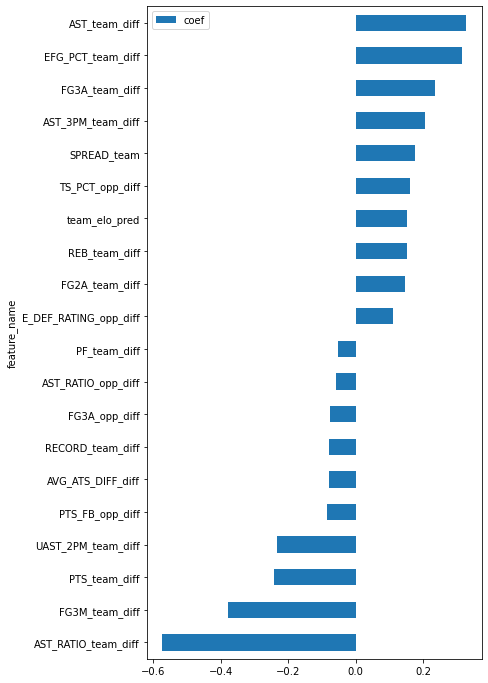

In [59]:

view_model_coefs(lr.named_steps['lr'], X_train[selected_cols])

## Training Models

### Logistic Regression

Train Set: 2006-2015
<br>Test Set: 2016-2020

In [16]:
sfs_selected_cols_log = ['RECORD_team_diff', 'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff',
       'STL_team_diff', 'TOV_team_diff', 'PLUS_MINUS_team_diff',
       'E_DEF_RATING_team_diff', 'PTS_OFF_TOV_team_diff', 'AST_3PM_team_diff',
       'UAST_2PM_team_diff', 'ATS_DIFF_team_diff', 'FG2A_opp_diff',
       'FG3A_opp_diff', 'FTM_opp_diff', 'FTA_opp_diff', 'AST_opp_diff',
       'TOV_opp_diff', 'E_OFF_RATING_opp_diff', 'PTS_FB_opp_diff',
       'AST_2PM_opp_diff', 'UAST_2PM_opp_diff', 'UAST_3PM_opp_diff',
       'ATS_PCT_diff', 'AVG_SPREAD_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff',
       'REST_diff', 'OREB_PCT_team_diff', 'OREB_PCT_opp_diff',
       'DREB_PCT_team_diff', 'DREB_PCT_opp_diff', 'TS_PCT_team_diff',
       'EFG_PCT_team_diff', 'EFG_PCT_opp_diff', 'AST_RATIO_team_diff',
       'TOV_PCT_team_diff', 'TOV_PCT_opp_diff', 'team_elo_pred',
       'elo_MOV_pred', 'SPREAD_team']

In [17]:
def objective(trial):
    
    lr_C = trial.suggest_float('C', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline([('selector', ColumnTransformer([
                        ("selector", "passthrough", sfs_selected_cols_log)
                    ], remainder="drop")),
                                        ('scaler', StandardScaler()),
                                        ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                                      penalty='l2', max_iter=10000,
                                                                     verbose=1, random_state=23))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_lr2_select_sffs'
storage_name = "sqlite:///{}.db".format(study_name)

study_lr = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lr.optimize(objective, n_trials=1)

[I 2021-11-16 09:59:59,968] Using an existing study with name '../models/hyperparameter_tuning/study_lr2_select_sffs' instead of creating a new one.
[I 2021-11-16 10:00:06,774] Trial 203 finished with value: 0.5268674001158078 and parameters: {'C': 0.32902471315218795}. Best is trial 102 with value: 0.5382165605095541.


In [18]:
study_lr.trials_dataframe().sort_values(['value'])

,number,value,datetime_start,datetime_complete,duration,params_C,state
66,66,0.511870,2021-11-07 22:20:57.901336,2021-11-07 22:20:58.603314,0 days 00:00:00.701978,0.000010,COMPLETE
15,15,0.517024,2021-11-07 22:12:11.763977,2021-11-07 22:12:12.462942,0 days 00:00:00.698965,0.000031,COMPLETE
10,10,0.521830,2021-11-07 22:11:51.777569,2021-11-07 22:11:52.499547,0 days 00:00:00.721978,0.000115,COMPLETE
18,18,0.523914,2021-11-07 22:12:19.467820,2021-11-07 22:12:20.194784,0 days 00:00:00.726964,0.000276,COMPLETE
167,167,0.526057,2021-11-07 22:31:35.573707,2021-11-07 22:31:36.289033,0 days 00:00:00.715326,0.000808,COMPLETE
...,...,...,...,...,...,...,...
154,154,0.538159,2021-11-07 22:30:27.825596,2021-11-07 22:30:32.468440,0 days 00:00:04.642844,0.392175,COMPLETE
109,109,0.538159,2021-11-07 22:26:29.860123,2021-11-07 22:26:35.608948,0 days 00:00:05.748825,0.393153,COMPLETE
102,102,0.538217,2021-11-07 22:25:28.648870,2021-11-07 22:25:33.524721,0 days 00:00:04.875851,0.390874,COMPLETE
200,200,NaN,2021-11-08 09:08:47.617370,2021-11-08 09:08:47.651369,0 days 00:00:00.033999,30.247030,FAIL


0.39087399430471714


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 263 epochs took 4 seconds
Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['RECORD_team_diff',
                                                   'OREB_team_diff',
                                                   'DREB_team_diff',
                                                   'REB_team_diff',
                                                   'STL_team_diff',
                                                   'TOV_team_diff',
                                                   'PLUS_MINUS_team_diff',
                                                   'E_DEF_RATING_team_diff',
                                                   'PTS_OFF_TOV_team_diff',
                                                   'AST_3PM_team_diff',
                                                   'UAST_2PM_team_diff',
                                                   'ATS_DIFF_tea

[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.3s finished


,feature_name,coef
6,PLUS_MINUS_team_diff,-0.239505
16,AST_opp_diff,-0.207005
5,TOV_team_diff,-0.166151
15,FTA_opp_diff,-0.140416
21,UAST_2PM_opp_diff,-0.128763
37,TOV_PCT_opp_diff,-0.116173
24,AVG_SPREAD_diff,-0.109764
0,RECORD_team_diff,-0.100374
13,FG3A_opp_diff,-0.091794
19,PTS_FB_opp_diff,-0.080466


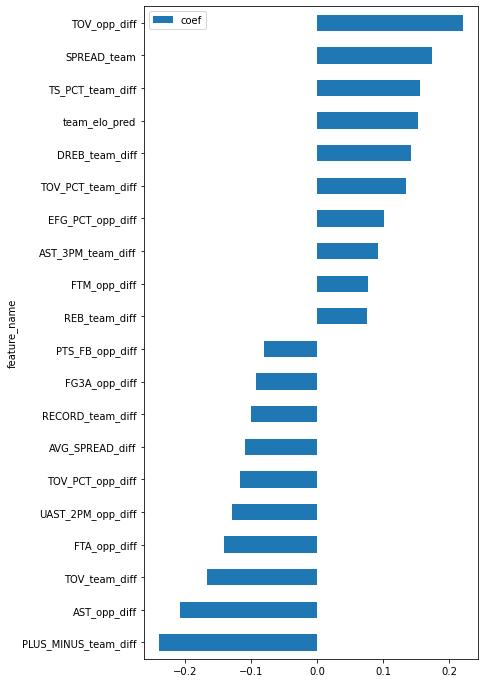

In [19]:
lr_C = study_lr.best_params['C']
print(lr_C)
best_lr = Pipeline([('selector', ColumnTransformer([
    ("selector", "passthrough", sfs_selected_cols_log)
], remainder="drop")),
                    ('scaler', StandardScaler()),
                    ('logreg', LogisticRegression(solver='saga', C=lr_C,
                                                  penalty='l2', max_iter=100000,
                                                 verbose=1, random_state=23))])
best_lr.fit(X_train, y_train)

print(best_lr)

print("train_acc:", best_lr.score(X_train, y_train))
print("test_acc:", best_lr.score(X_test, y_test))

view_model_coefs(best_lr.named_steps['logreg'], X_train[sfs_selected_cols_log])

In [20]:
filename = '../models/best_lr_diffs_sfs'
joblib.dump(best_lr, filename)

['../models/best_lr_diffs_sfs']

### SGD Hinge (SVC Linear)

In [212]:
sfs_pipe_sgd = Pipeline([('scaler', StandardScaler()),
                     ('sffs', SFS(SGDClassifier(loss='hinge', random_state=23, alpha=0.03320641664870966),
                        k_features='best', cv=tscv, scoring='accuracy', floating=True, verbose=1))])


sfs_pipe_sgd.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:    2.8s finished
Features: 1/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Features: 2/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:    3.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
Features: 3/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBacken

[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    1.3s finished
Features: 21/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  68 out of  68 | elapsed:    5.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  21 out of  21 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    1.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  19 out of  19 | elapsed:    1.2s finished
Features: 20/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  69 out of  69 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    1.4s fin

Features: 29/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    2.6s finished
Features: 29/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    2.8s finished
Features: 30/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:    6.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

Features: 27/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    5.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    2.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    2.3s finished
Features: 27/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    5.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    2.4s finished
Features: 28/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    6.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  51 out of  51 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  38 out of  38 | elapsed:    4.6s finished
Features: 39/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  50 out of  50 | elapsed:    6.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  39 out of  39 | elapsed:    4.9s finished
Features: 40/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  49 out of  49 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:    5.2s finished
Features: 41/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  48 out of  48 | elaps

Features: 45/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  44 out of  44 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    7.0s finished
Features: 46/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  43 out of  43 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  46 out of  46 | elapsed:    7.5s finished
Features: 47/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  42 out of  42 | elapsed:    7.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:   10.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  51 out of  51 | elapsed:    9.0s finished
Features: 52/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:    7.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    9.3s finished
Features: 53/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    6.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  53 out of  53 | elapsed:    9.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    9.1s finished
Features: 53/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elaps

[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:   11.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  57 out of  57 | elapsed:   11.3s finished
Features: 58/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    6.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:   12.4s finished
Features: 59/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    6.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:   12.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:   12.4s fin

[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:   16.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:   14.3s finished
Features: 62/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    6.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:   14.6s finished
Features: 63/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    6.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:   16.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:   15.7s fin

Features: 71/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:    4.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  71 out of  71 | elapsed:   18.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:   18.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  69 out of  69 | elapsed:   17.7s finished
Features: 70/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  19 out of  19 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:   20.1s finished
Features: 71/89[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  77 out of  77 | elapsed:   21.9s finished
Features: 78/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  11 out of  11 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:   22.4s finished
Features: 79/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    2.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed:   22.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:   22.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  77 out of  77 | elapsed:   21.9s fin

[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed:   27.3s finished
Features: 85/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    1.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  85 out of  85 | elapsed:   27.3s finished
Features: 86/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   3 out of   3 | elapsed:    0.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:   30.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  85 out of  85 | elapsed:   28.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed:   25.8s fin

Pipeline(steps=[('scaler', StandardScaler()),
                ('sffs',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=SGDClassifier(alpha=0.03320641664870966,
                                                                   random_state=23),
                                           floating=True, k_features='best',
                                           scoring='accuracy', verbose=1))])

In [213]:
res = pd.DataFrame.from_dict(sfs_pipe_sgd.named_steps['sffs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_hinge = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_hinge

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG3M_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'DREB_team_diff', 'REB_team_diff', 'AST_team_diff', 'STL_team_diff',
       'PTS_team_diff', 'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff',
       'E_NET_RATING_team_diff', 'POSS_team_diff', 'PIE_team_diff',
       'PTS_OFF_TOV_team_diff', 'AST_2PM_team_diff', 'AST_3PM_team_diff',
       'UAST_2PM_team_diff', 'UAST_3PM_team_diff', 'RECORD_opp_diff',
       'FG2M_opp_diff', 'FG2A_opp_diff', 'FG3A_opp_diff', 'FTM_opp_diff',
       'FTA_opp_diff', 'OREB_opp_diff', 'TOV_opp_diff', 'PF_opp_diff',
       'PTS_opp_diff', 'PLUS_MINUS_opp_diff', 'E_DEF_RATING_opp_diff',
       'E_NET_RATING_opp_diff', 'PIE_opp_diff', 'PTS_FB_opp_diff',
       'AST_2PM_opp_diff', 'UAST_2PM_opp_diff', 'UAST_3PM_opp_diff',
       'WL_PCT_diff', 'REST_diff', 'OREB_PCT_team_diff', 'OREB_PCT_opp_diff',
       'DREB_PCT_team_diff', 'TS_PCT_team_diff', 'EFG_PCT_team_diff'

In [125]:
res = pd.DataFrame.from_dict(sfs_pipe_sgd.named_steps['sfs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_hinge = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_hinge

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'REB_team_diff', 'AST_team_diff', 'STL_team_diff', 'PF_team_diff',
       'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff',
       'E_DEF_RATING_team_diff', 'E_NET_RATING_team_diff', 'POSS_team_diff',
       'PIE_team_diff', 'PTS_OFF_TOV_team_diff', 'AST_2PM_team_diff',
       'AST_3PM_team_diff', 'UAST_2PM_team_diff', 'UAST_3PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG2A_opp_diff',
       'FG3A_opp_diff', 'AST_opp_diff', 'TOV_opp_diff', 'PF_opp_diff',
       'PLUS_MINUS_opp_diff', 'E_OFF_RATING_opp_diff', 'E_DEF_RATING_opp_diff',
       'E_NET_RATING_opp_diff', 'POSS_opp_diff', 'PIE_opp_diff',
       'PTS_FB_opp_diff', 'PTS_OFF_TOV_opp_diff', 'UAST_2PM_opp_diff',
       'UAST_3PM_opp_diff', 'ATS_DIFF_opp_diff', 'TEAM_COVERED_opp_diff',
       'WL_PCT_diff', 'ATS_PCT_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff',
       'RE

In [21]:
sfs_selected_cols_hinge = ['RECORD_team_diff', 'FG2M_team_diff', 'FG3M_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'DREB_team_diff', 'REB_team_diff', 'AST_team_diff', 'STL_team_diff',
       'PTS_team_diff', 'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff',
       'E_NET_RATING_team_diff', 'POSS_team_diff', 'PIE_team_diff',
       'PTS_OFF_TOV_team_diff', 'AST_2PM_team_diff', 'AST_3PM_team_diff',
       'UAST_2PM_team_diff', 'UAST_3PM_team_diff', 'RECORD_opp_diff',
       'FG2M_opp_diff', 'FG2A_opp_diff', 'FG3A_opp_diff', 'FTM_opp_diff',
       'FTA_opp_diff', 'OREB_opp_diff', 'TOV_opp_diff', 'PF_opp_diff',
       'PTS_opp_diff', 'PLUS_MINUS_opp_diff', 'E_DEF_RATING_opp_diff',
       'E_NET_RATING_opp_diff', 'PIE_opp_diff', 'PTS_FB_opp_diff',
       'AST_2PM_opp_diff', 'UAST_2PM_opp_diff', 'UAST_3PM_opp_diff',
       'WL_PCT_diff', 'REST_diff', 'OREB_PCT_team_diff', 'OREB_PCT_opp_diff',
       'DREB_PCT_team_diff', 'TS_PCT_team_diff', 'EFG_PCT_team_diff',
       'EFG_PCT_opp_diff', 'AST_RATIO_team_diff', 'AST_RATIO_opp_diff',
       'TOV_PCT_opp_diff', 'elo_MOV_pred', 'SPREAD_team']

In [22]:
def objective(trial):
    sgd_alpha = trial.suggest_float('alpha', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_hinge)], remainder="drop")),
        ('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='hinge',
                                       max_iter=5000,
                                     random_state=23))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_sgd_hinge_sffs'
storage_name = "sqlite:///{}.db".format(study_name)

study_sgd = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_sgd.optimize(objective, n_trials=10, show_progress_bar=True)

[I 2021-11-16 10:01:44,586] Using an existing study with name '../models/hyperparameter_tuning/study_sgd_hinge_sffs' instead of creating a new one.
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\optuna\progress_bar.py:47: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2021-11-16 10:01:45,273] Trial 301 finished with value: 0.536653155761436 and parameters: {'alpha': 0.042653092704885744}. Best is trial 212 with value: 0.5384481760277938.
[I 2021-11-16 10:01:45,796] Trial 302 finished with value: 0.5356687898089172 and parameters: {'alpha': 0.024207473464400987}. Best is trial 212 with value: 0.5384481760277938.
[I 2021-11-16 10:01:46,412] Trial 303 finished with value: 0.528314997104806 and parameters: {'alpha': 0.07198692228885333}. Best is trial 212 with value: 0.5384481760277938.
[I 2021-11-16 10:01:46,968] Trial 304 finished with value: 0.5325998841922409 and parameters: {'alpha': 0.05058734925431676}. Best is trial 212 with value: 0.5384481760277938.
[I 2021-11-16 10:01:47,475] Trial 305 finished with value: 0.5379270411117545 and parameters: {'alpha': 0.030287276618398997}. Best is trial 212 with value: 0.5384481760277938.
[I 2021-11-16 10:01:47,961] Trial 306 finished with value: 0.5353213665315576 and parameters: {'alpha': 0.0188309182439

In [23]:
sgd_alpha = study_sgd.best_params['alpha']
print('C:', sgd_alpha)

best_sgd_hinge = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_hinge)], remainder="drop")),
        ('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='hinge',
                                       max_iter=1000,
                                     random_state=23))])


best_sgd_hinge.fit(X_train, y_train)

print("best_svc:", best_sgd_hinge)


print("train_score:", best_sgd_hinge.score(X_train, y_train))
print("test_score:", best_sgd_hinge.score(X_test, y_test))

C: 0.03072328132837972
best_svc: Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['RECORD_team_diff',
                                                   'FG2M_team_diff',
                                                   'FG3M_team_diff',
                                                   'FG3A_team_diff',
                                                   'FTM_team_diff',
                                                   'FTA_team_diff',
                                                   'OREB_team_diff',
                                                   'DREB_team_diff',
                                                   'REB_team_diff',
                                                   'AST_team_diff',
                                                   'STL_team_diff',
                                                   'PTS_team_diff',
                                     

In [24]:
filename = '../models/best_sgd_hinge_diffs_sfs'
joblib.dump(best_lr, filename)

['../models/best_sgd_hinge_diffs_sfs']

### SGD modified_huber

In [214]:
sfs_pipe_sgd_huber = Pipeline([('scaler', StandardScaler()),
                     ('sffs', SFS(SGDClassifier(loss='modified_huber', random_state=23, alpha=0.56299),
                        k_features='best', cv=tscv, scoring='accuracy', floating=True, verbose=1))])


sfs_pipe_sgd_huber.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:    3.3s finished
Features: 1/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    0.0s finished
Features: 2/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    0.0s finished
Features: 3/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBacken

[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  13 out of  13 | elapsed:    0.6s finished
Features: 14/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  75 out of  75 | elapsed:    4.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  14 out of  14 | elapsed:    0.7s finished
Features: 15/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  74 out of  74 | elapsed:    4.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  15 out of  15 | elapsed:    0.8s finished
Features: 16/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  73 out of  73 | elaps

Features: 26/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    5.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    1.9s finished
Features: 27/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    5.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    2.1s finished
Features: 28/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    5.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  32 out of  32 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  31 out of  31 | elapsed:    2.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  30 out of  30 | elapsed:    2.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  29 out of  29 | elapsed:    2.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  28 out of  28 | elapsed:    2.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    2.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elapsed:    1.9s finished
Features: 27/89[Parallel

[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    3.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    3.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    3.1s finished
Features: 34/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  55 out of  55 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:    3.2s finished
[Parallel

Features: 45/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  44 out of  44 | elapsed:    5.4s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  45 out of  45 | elapsed:    5.4s finished
Features: 46/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  43 out of  43 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  46 out of  46 | elapsed:    5.7s finished
Features: 47/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  42 out of  42 | elapsed:    5.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  47 out of  47 | elapsed:    6.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  51 out of  51 | elapsed:    6.8s finished
Features: 52/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:    4.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  52 out of  52 | elapsed:    6.7s finished
Features: 53/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:    4.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  53 out of  53 | elapsed:    6.8s finished
Features: 54/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:    4.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  54 out of  54 | elaps

[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    8.9s finished
Features: 62/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    9.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    8.9s finished
Features: 62/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  27 out of  27 | elapsed:    4.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    9.2s finished
Features: 63/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  26 out of  26 | elaps

[Parallel(n_jobs=1)]: Done  62 out of  62 | elapsed:    9.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  61 out of  61 | elapsed:    9.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  60 out of  60 | elapsed:    8.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  59 out of  59 | elapsed:    8.5s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  58 out of  58 | elapsed:    8.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  57 out of  57 | elapsed:    7.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  56 out of  56 | elapsed:    7.6s finished
[Parallel(n_jobs=1)]: Us

[Parallel(n_jobs=1)]: Done  63 out of  63 | elapsed:    9.5s finished
Features: 64/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  64 out of  64 | elapsed:    9.7s finished
Features: 65/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  24 out of  24 | elapsed:    3.7s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  65 out of  65 | elapsed:   10.0s finished
Features: 66/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  23 out of  23 | elapsed:    3.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  66 out of  66 | elaps

Features: 69/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  20 out of  20 | elapsed:    3.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  69 out of  69 | elapsed:   11.3s finished
Features: 70/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  19 out of  19 | elapsed:    3.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  70 out of  70 | elapsed:   11.9s finished
Features: 71/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  18 out of  18 | elapsed:    3.1s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  71 out of  71 | elapsed:   12.3s finished
[Parallel(n_jobs=1)]: Using backend SequentialBac

[Parallel(n_jobs=1)]: Done  78 out of  78 | elapsed:   15.1s finished
Features: 79/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  10 out of  10 | elapsed:    1.9s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  79 out of  79 | elapsed:   15.5s finished
Features: 80/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   9 out of   9 | elapsed:    1.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  80 out of  80 | elapsed:   15.9s finished
Features: 81/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   8 out of   8 | elapsed:    1.6s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  81 out of  81 | elaps

[Parallel(n_jobs=1)]: Done  82 out of  82 | elapsed:   16.8s finished
Features: 83/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   6 out of   6 | elapsed:    1.2s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  83 out of  83 | elapsed:   17.9s finished
Features: 84/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   5 out of   5 | elapsed:    1.0s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed:   18.0s finished
Features: 85/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   4 out of   4 | elapsed:    0.8s finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  85 out of  85 | elaps

Pipeline(steps=[('scaler', StandardScaler()),
                ('sffs',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=SGDClassifier(alpha=0.56299,
                                                                   loss='modified_huber',
                                                                   random_state=23),
                                           floating=True, k_features='best',
                                           scoring='accuracy', verbose=1))])

In [215]:
res = pd.DataFrame.from_dict(sfs_pipe_sgd_huber.named_steps['sffs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_huber = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_huber

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'DREB_team_diff', 'STL_team_diff', 'E_OFF_RATING_team_diff',
       'E_DEF_RATING_team_diff', 'PIE_team_diff', 'PTS_OFF_TOV_team_diff',
       'AST_2PM_team_diff', 'AST_3PM_team_diff', 'UAST_2PM_team_diff',
       'UAST_3PM_team_diff', 'RECORD_opp_diff', 'FG2M_opp_diff',
       'FG3A_opp_diff', 'FTA_opp_diff', 'AST_opp_diff',
       'E_OFF_RATING_opp_diff', 'E_DEF_RATING_opp_diff', 'PTS_FB_opp_diff',
       'AST_3PM_opp_diff', 'UAST_2PM_opp_diff', 'TEAM_COVERED_opp_diff',
       'WL_PCT_diff', 'REST_diff', 'TS_PCT_team_diff', 'AST_RATIO_team_diff',
       'AST_RATIO_opp_diff', 'TOV_PCT_opp_diff', 'ML_team'],
      dtype='object')

In [131]:
res = pd.DataFrame.from_dict(sfs_pipe_sgd_huber.named_steps['sfs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_huber = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_huber

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3M_team_diff', 'FG3A_team_diff', 'OREB_team_diff', 'DREB_team_diff',
       'REB_team_diff', 'E_DEF_RATING_team_diff', 'PIE_team_diff',
       'AST_2PM_team_diff', 'AST_3PM_team_diff', 'UAST_2PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG3A_opp_diff',
       'PTS_2PT_MR_opp_diff', 'PTS_FB_opp_diff', 'UAST_3PM_opp_diff',
       'ATS_DIFF_opp_diff', 'TEAM_COVERED_opp_diff', 'WL_PCT_diff',
       'REST_diff', 'AST_RATIO_team_diff', 'ML_team'],
      dtype='object')

In [25]:
sfs_selected_cols_huber = ['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'DREB_team_diff', 'STL_team_diff', 'E_OFF_RATING_team_diff',
       'E_DEF_RATING_team_diff', 'PIE_team_diff', 'PTS_OFF_TOV_team_diff',
       'AST_2PM_team_diff', 'AST_3PM_team_diff', 'UAST_2PM_team_diff',
       'UAST_3PM_team_diff', 'RECORD_opp_diff', 'FG2M_opp_diff',
       'FG3A_opp_diff', 'FTA_opp_diff', 'AST_opp_diff',
       'E_OFF_RATING_opp_diff', 'E_DEF_RATING_opp_diff', 'PTS_FB_opp_diff',
       'AST_3PM_opp_diff', 'UAST_2PM_opp_diff', 'TEAM_COVERED_opp_diff',
       'WL_PCT_diff', 'REST_diff', 'TS_PCT_team_diff', 'AST_RATIO_team_diff',
       'AST_RATIO_opp_diff', 'TOV_PCT_opp_diff', 'ML_team']

In [26]:
def objective(trial):
    sgd_alpha = trial.suggest_float('alpha', 1e-5, 1e2, log=True)
    
    classifier_obj = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_huber)], remainder="drop")),
        ('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='modified_huber',
                                       max_iter=1000,
                                     random_state=23))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_sgd_huber_sffs'
storage_name = "sqlite:///{}.db".format(study_name)

study_sgd = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_sgd.optimize(objective, n_trials=10, show_progress_bar = True)

[I 2021-11-16 10:12:50,769] Using an existing study with name 'study_sgd_huber_sffs' instead of creating a new one.
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\optuna\progress_bar.py:47: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/10 [00:00<?, ?it/s]

[I 2021-11-16 10:12:52,841] Trial 301 finished with value: 0.530862767805443 and parameters: {'alpha': 0.3694520929292548}. Best is trial 172 with value: 0.5364215402431963.
[I 2021-11-16 10:12:53,309] Trial 302 finished with value: 0.532541980312681 and parameters: {'alpha': 0.7865734864626559}. Best is trial 172 with value: 0.5364215402431963.
[I 2021-11-16 10:12:53,781] Trial 303 finished with value: 0.5356108859293572 and parameters: {'alpha': 0.48734005706326916}. Best is trial 172 with value: 0.5364215402431963.
[I 2021-11-16 10:12:54,251] Trial 304 finished with value: 0.5303995367689636 and parameters: {'alpha': 0.2779864395087251}. Best is trial 172 with value: 0.5364215402431963.
[I 2021-11-16 10:12:54,771] Trial 305 finished with value: 0.5314418066010422 and parameters: {'alpha': 1.1245909642006404}. Best is trial 172 with value: 0.5364215402431963.
[I 2021-11-16 10:12:55,230] Trial 306 finished with value: 0.5359004053271569 and parameters: {'alpha': 0.637612217528962}. Be

0.649475972966215
best_sgd: Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['RECORD_team_diff',
                                                   'FG2M_team_diff',
                                                   'FG2A_team_diff',
                                                   'FG3A_team_diff',
                                                   'FTM_team_diff',
                                                   'FTA_team_diff',
                                                   'OREB_team_diff',
                                                   'DREB_team_diff',
                                                   'STL_team_diff',
                                                   'E_OFF_RATING_team_diff',
                                                   'E_DEF_RATING_team_diff',
                                                   'PIE_team_diff',
                        

,feature_name,coef
24,PTS_FB_opp_diff,-0.025063
16,UAST_3PM_team_diff,-0.019699
19,FG3A_opp_diff,-0.018010
2,FG2A_team_diff,-0.017909
0,RECORD_team_diff,-0.014558
32,AST_RATIO_opp_diff,-0.014269
21,AST_opp_diff,-0.012550
18,FG2M_opp_diff,-0.011381
20,FTA_opp_diff,-0.006112
11,PIE_team_diff,-0.005918


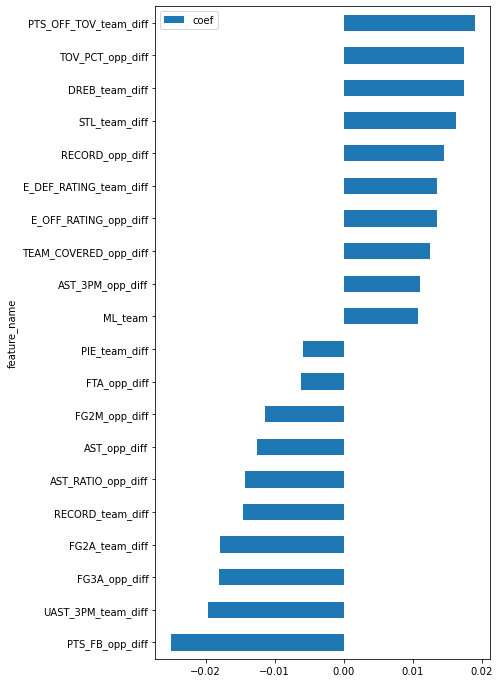

In [27]:
sgd_alpha = study_sgd.best_params['alpha']
print(sgd_alpha)
best_sgd_huber = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_huber)], remainder="drop")),
        ('scaler', StandardScaler()),
                ('sgd', SGDClassifier(alpha = sgd_alpha,
                                      loss='modified_huber',
                                       max_iter=1000,
                                     random_state=23))])

print("best_sgd:", best_sgd_huber)

best_sgd_huber.fit(X_train, y_train)

print("train_score:", best_sgd_huber.score(X_train, y_train))
print("test_score:", best_sgd_huber.score(X_test, y_test))

view_model_coefs(best_sgd_huber.named_steps['sgd'], X_train[sfs_selected_cols_huber])

In [28]:
filename = '../models/best_sgd_huber_diffs_sfs'

joblib.dump(best_sgd_huber, filename)

['../models/best_sgd_huber_diffs_sfs']

### LGBClassifier

In [189]:
sfs_pipe_lgb = Pipeline([('scaler', StandardScaler()),
                     ('sfs', SFS(lgb.LGBMClassifier(colsample_bytree=0.30306249172980904,
               learning_rate=0.03464725063611881, max_depth=3,
               min_child_weight=0.6782064406615411, num_leaves=120,
               random_state=23, reg_alpha=2.5908850696822157,
               reg_lambda=6.57863348422055, subsample=0.7226323380307508),
                        k_features='best', cv=tscv, scoring='accuracy', verbose=1))])


sfs_pipe_lgb.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:   21.5s finished
Features: 1/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:   21.1s finished
Features: 2/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:   32.8s finished
Features: 3/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:   27.4s finished
Features: 4/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  85 out of  85 | elapsed:   25.9s finished
Features: 5/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  84 out of  84 | elapsed:   27.1s finished
Features: 6/89[Parallel(

[Parallel(n_jobs=1)]: Done  40 out of  40 | elapsed:   25.9s finished
Features: 50/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  39 out of  39 | elapsed:   25.6s finished
Features: 51/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  38 out of  38 | elapsed:   25.9s finished
Features: 52/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:   26.0s finished
Features: 53/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   25.6s finished
Features: 54/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:   24.7s finished
Features: 55/89[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Par

Pipeline(steps=[('scaler', StandardScaler()),
                ('sfs',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=LGBMClassifier(colsample_bytree=0.30306249172980904,
                                                                    learning_rate=0.03464725063611881,
                                                                    max_depth=3,
                                                                    min_child_weight=0.6782064406615411,
                                                                    num_leaves=120,
                                                                    random_state=23,
                                                                    reg_alpha=2.5908850696822157,
                                                                    reg_lambda=6.57863348422055,
                                                    

In [190]:
res = pd.DataFrame.from_dict(sfs_pipe_lgb.named_steps['sfs'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_lgb = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_lgb

Index(['FG3A_team_diff', 'FTA_team_diff', 'E_DEF_RATING_team_diff',
       'PTS_2PT_MR_team_diff', 'PTS_OFF_TOV_team_diff', 'RECORD_opp_diff',
       'FG3A_opp_diff', 'FTM_opp_diff', 'FTA_opp_diff', 'OREB_opp_diff',
       'DREB_opp_diff', 'E_OFF_RATING_opp_diff', 'E_DEF_RATING_opp_diff',
       'POSS_opp_diff', 'PTS_FB_opp_diff', 'AST_2PM_opp_diff',
       'UAST_3PM_opp_diff', 'TEAM_COVERED_opp_diff', 'ATS_PCT_diff',
       'TS_PCT_opp_diff', 'AST_RATIO_opp_diff', 'TOV_PCT_team_diff',
       'TOV_PCT_opp_diff', 'team_elo_pred'],
      dtype='object')

In [191]:
def objective(trial):    
    min_child_weight = trial.suggest_float('min_child_weight', 1e-4, 1.0)
    subsample = trial.suggest_float('subsample', 0.6, 1)
    max_depth = trial.suggest_int('max_depth', 3, 32)
    reg_lambda = trial.suggest_float('reg_lambda', 1, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 0, 5),
    num_leaves = trial.suggest_int('num_leaves', 2, 512)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1.0, log=True)
    
    classifier_obj = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_lgb)], remainder="drop")),
        ('lgbc', lgb.LGBMClassifier(colsample_bytree=colsample_bytree,
               learning_rate=learning_rate, max_depth=max_depth,
               min_child_weight=min_child_weight, num_leaves=num_leaves,
               random_state=23, reg_alpha=reg_alpha,
               reg_lambda=reg_lambda, subsample=subsample))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_lgbc_sfs'
storage_name = "sqlite:///{}.db".format(study_name)

study_lgbc = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lgbc.optimize(objective, n_trials=200, show_progress_bar=True)

[I 2021-11-06 22:49:08,640] A new study created in RDB with name: ../models/hyperparameter_tuning/study_lgbc_sfs
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\optuna\progress_bar.py:47: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/200 [00:00<?, ?it/s]

[I 2021-11-06 22:49:10,916] Trial 0 finished with value: 0.5079328314997105 and parameters: {'min_child_weight': 0.15049249625149785, 'subsample': 0.8502659974335629, 'max_depth': 31, 'reg_lambda': 4.125814885947011, 'reg_alpha': 1.325075442948524, 'num_leaves': 36, 'colsample_bytree': 0.11126801341879455, 'learning_rate': 0.30517915436391824}. Best is trial 0 with value: 0.5079328314997105.
[I 2021-11-06 22:49:11,831] Trial 1 finished with value: 0.5292993630573248 and parameters: {'min_child_weight': 0.0433466824632333, 'subsample': 0.6600605261117892, 'max_depth': 3, 'reg_lambda': 3.030099582339269, 'reg_alpha': 3.5455700009728646, 'num_leaves': 301, 'colsample_bytree': 0.8218519325756956, 'learning_rate': 0.021848233732244614}. Best is trial 1 with value: 0.5292993630573248.
[I 2021-11-06 22:49:14,688] Trial 2 finished with value: 0.5215402431962941 and parameters: {'min_child_weight': 0.1774154449355057, 'subsample': 0.6831110005522862, 'max_depth': 19, 'reg_lambda': 4.22886509585

[I 2021-11-06 22:49:58,750] Trial 21 finished with value: 0.5259988419224089 and parameters: {'min_child_weight': 0.08836003691613803, 'subsample': 0.8352628700375226, 'max_depth': 6, 'reg_lambda': 9.71290317123884, 'reg_alpha': 3.2370545542972957, 'num_leaves': 65, 'colsample_bytree': 0.23062835942323756, 'learning_rate': 0.019657922025663025}. Best is trial 1 with value: 0.5292993630573248.
[I 2021-11-06 22:49:59,558] Trial 22 finished with value: 0.5312680949623625 and parameters: {'min_child_weight': 0.10792315027795879, 'subsample': 0.8945517716973493, 'max_depth': 3, 'reg_lambda': 7.230350778064272, 'reg_alpha': 3.899975935957764, 'num_leaves': 87, 'colsample_bytree': 0.3176442923750485, 'learning_rate': 0.016914995386705618}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:50:00,377] Trial 23 finished with value: 0.5232773595830921 and parameters: {'min_child_weight': 0.25265587204880285, 'subsample': 0.9272705684007021, 'max_depth': 3, 'reg_lambda': 7.99061710

[I 2021-11-06 22:50:26,303] Trial 42 finished with value: 0.5191082802547771 and parameters: {'min_child_weight': 0.49275208089627387, 'subsample': 0.9094984811984093, 'max_depth': 5, 'reg_lambda': 2.268405682184796, 'reg_alpha': 4.938817872401279, 'num_leaves': 31, 'colsample_bytree': 0.6941690667112514, 'learning_rate': 0.07087134262918147}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:50:27,321] Trial 43 finished with value: 0.5301100173711639 and parameters: {'min_child_weight': 0.19584791381729463, 'subsample': 0.9747430639640824, 'max_depth': 29, 'reg_lambda': 4.845242442829972, 'reg_alpha': 3.856123744879957, 'num_leaves': 6, 'colsample_bytree': 0.75608566415223, 'learning_rate': 0.03613160900487682}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:50:29,400] Trial 44 finished with value: 0.52501447596989 and parameters: {'min_child_weight': 0.1132774897368948, 'subsample': 0.9730423399035345, 'max_depth': 29, 'reg_lambda': 4.80366568636152

[I 2021-11-06 22:50:58,696] Trial 63 finished with value: 0.5287782281412856 and parameters: {'min_child_weight': 0.648303162666923, 'subsample': 0.9216336513866656, 'max_depth': 3, 'reg_lambda': 4.497024360994178, 'reg_alpha': 3.8685540278097674, 'num_leaves': 48, 'colsample_bytree': 0.30114631103419026, 'learning_rate': 0.055259338037522615}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:50:59,878] Trial 64 finished with value: 0.510885929357267 and parameters: {'min_child_weight': 0.5425769890886709, 'subsample': 0.9404064632543454, 'max_depth': 7, 'reg_lambda': 6.179102423458643, 'reg_alpha': 3.1689092109790873, 'num_leaves': 21, 'colsample_bytree': 0.7108795706512292, 'learning_rate': 0.14517628815757422}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:51:01,415] Trial 65 finished with value: 0.5226404169079328 and parameters: {'min_child_weight': 0.0019492242726981968, 'subsample': 0.9314617672477303, 'max_depth': 6, 'reg_lambda': 5.06252280

[I 2021-11-06 22:51:20,946] Trial 83 finished with value: 0.5251881876085698 and parameters: {'min_child_weight': 0.026438275780120212, 'subsample': 0.8670608829706554, 'max_depth': 5, 'reg_lambda': 6.493609600727863, 'reg_alpha': 4.550452958414226, 'num_leaves': 365, 'colsample_bytree': 0.4396378732918666, 'learning_rate': 0.016430764639545098}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:51:23,882] Trial 84 finished with value: 0.5151708164447018 and parameters: {'min_child_weight': 0.1315193687909874, 'subsample': 0.8771113047231599, 'max_depth': 21, 'reg_lambda': 7.4660943394193415, 'reg_alpha': 3.4602383888605472, 'num_leaves': 400, 'colsample_bytree': 0.47613159000830213, 'learning_rate': 0.04943027331263814}. Best is trial 22 with value: 0.5312680949623625.
[I 2021-11-06 22:51:26,923] Trial 85 finished with value: 0.5122177185871453 and parameters: {'min_child_weight': 0.08522045057177854, 'subsample': 0.8155811475161487, 'max_depth': 25, 'reg_lambda': 6.87

[I 2021-11-06 22:51:46,283] Trial 103 finished with value: 0.5326577880718008 and parameters: {'min_child_weight': 0.01279817859830791, 'subsample': 0.8795870911994432, 'max_depth': 3, 'reg_lambda': 5.78631794556339, 'reg_alpha': 3.680253426772506, 'num_leaves': 331, 'colsample_bytree': 0.45341072550315376, 'learning_rate': 0.033026995227721206}. Best is trial 103 with value: 0.5326577880718008.
[I 2021-11-06 22:51:47,406] Trial 104 finished with value: 0.5232194557035321 and parameters: {'min_child_weight': 0.01797514822031669, 'subsample': 0.8829219712848405, 'max_depth': 5, 'reg_lambda': 5.8168423476937585, 'reg_alpha': 4.030278940144998, 'num_leaves': 367, 'colsample_bytree': 0.4699449247213863, 'learning_rate': 0.03401369238751345}. Best is trial 103 with value: 0.5326577880718008.
[I 2021-11-06 22:51:48,221] Trial 105 finished with value: 0.5284887087434857 and parameters: {'min_child_weight': 0.1128511648178884, 'subsample': 0.955728071161235, 'max_depth': 3, 'reg_lambda': 6.698

[I 2021-11-06 22:52:08,452] Trial 123 finished with value: 0.530052113491604 and parameters: {'min_child_weight': 0.3127673699181679, 'subsample': 0.8643299987957609, 'max_depth': 4, 'reg_lambda': 1.9347238065379757, 'reg_alpha': 4.684475938956537, 'num_leaves': 263, 'colsample_bytree': 0.3521694800220482, 'learning_rate': 0.02135926667338344}. Best is trial 103 with value: 0.5326577880718008.
[I 2021-11-06 22:52:09,323] Trial 124 finished with value: 0.5293572669368848 and parameters: {'min_child_weight': 0.32248139930752723, 'subsample': 0.8756760007581517, 'max_depth': 4, 'reg_lambda': 1.2398576853671073, 'reg_alpha': 4.682988949598036, 'num_leaves': 271, 'colsample_bytree': 0.327952739747564, 'learning_rate': 0.021156884888943874}. Best is trial 103 with value: 0.5326577880718008.
[I 2021-11-06 22:52:10,194] Trial 125 finished with value: 0.5291835552982049 and parameters: {'min_child_weight': 0.254164300855066, 'subsample': 0.8651693040425683, 'max_depth': 4, 'reg_lambda': 1.81258

[I 2021-11-06 22:52:29,623] Trial 143 finished with value: 0.5324261725535611 and parameters: {'min_child_weight': 0.21819536424161365, 'subsample': 0.85399619117608, 'max_depth': 3, 'reg_lambda': 1.0320947873975568, 'reg_alpha': 4.452803288279922, 'num_leaves': 279, 'colsample_bytree': 0.2982465361952684, 'learning_rate': 0.02634038772806428}. Best is trial 103 with value: 0.5326577880718008.
[I 2021-11-06 22:52:30,421] Trial 144 finished with value: 0.5330631152287204 and parameters: {'min_child_weight': 0.22100236074886892, 'subsample': 0.8558693104063501, 'max_depth': 3, 'reg_lambda': 1.297614875669433, 'reg_alpha': 4.478220534698526, 'num_leaves': 311, 'colsample_bytree': 0.30357237598537995, 'learning_rate': 0.02592996066923204}. Best is trial 144 with value: 0.5330631152287204.
[I 2021-11-06 22:52:31,341] Trial 145 finished with value: 0.5317892298784019 and parameters: {'min_child_weight': 0.21603776545006803, 'subsample': 0.8568741438989395, 'max_depth': 3, 'reg_lambda': 1.407

[I 2021-11-06 22:52:47,562] Trial 163 finished with value: 0.5343949044585987 and parameters: {'min_child_weight': 0.15960057999681657, 'subsample': 0.845965636042065, 'max_depth': 4, 'reg_lambda': 1.6786816776160904, 'reg_alpha': 1.22743843598509, 'num_leaves': 294, 'colsample_bytree': 0.3448418231087905, 'learning_rate': 0.018026127695645325}. Best is trial 163 with value: 0.5343949044585987.
[I 2021-11-06 22:52:48,541] Trial 164 finished with value: 0.5297046902142444 and parameters: {'min_child_weight': 0.16491907111634937, 'subsample': 0.831998616732814, 'max_depth': 4, 'reg_lambda': 1.7489773373777908, 'reg_alpha': 0.20623804426166847, 'num_leaves': 315, 'colsample_bytree': 0.3509288106154479, 'learning_rate': 0.010378191328396316}. Best is trial 163 with value: 0.5343949044585987.
[I 2021-11-06 22:52:49,574] Trial 165 finished with value: 0.5293572669368848 and parameters: {'min_child_weight': 0.21662251211789357, 'subsample': 0.8494484857323771, 'max_depth': 5, 'reg_lambda': 2.

[I 2021-11-06 22:53:05,441] Trial 183 finished with value: 0.5319050376375218 and parameters: {'min_child_weight': 0.16542567025113775, 'subsample': 0.8181244987426889, 'max_depth': 3, 'reg_lambda': 1.5678778811634433, 'reg_alpha': 0.5697628125523893, 'num_leaves': 339, 'colsample_bytree': 0.25876244785026836, 'learning_rate': 0.027156456814552494}. Best is trial 163 with value: 0.5343949044585987.
[I 2021-11-06 22:53:06,283] Trial 184 finished with value: 0.5279675738274465 and parameters: {'min_child_weight': 0.22838749407886322, 'subsample': 0.8219327552822215, 'max_depth': 4, 'reg_lambda': 1.895685133516795, 'reg_alpha': 0.6054140479286799, 'num_leaves': 337, 'colsample_bytree': 0.24792296069789987, 'learning_rate': 0.04990275133132446}. Best is trial 163 with value: 0.5343949044585987.
[I 2021-11-06 22:53:07,180] Trial 185 finished with value: 0.5285466126230457 and parameters: {'min_child_weight': 0.169558252852732, 'subsample': 0.8139983531022377, 'max_depth': 5, 'reg_lambda': 1

In [ ]:
import 

In [37]:
def objective(trial):    
    min_child_weight = trial.suggest_float('min_child_weight', 1e-4, 1.0)
    subsample = trial.suggest_float('subsample', 0.6, 1)
    max_depth = trial.suggest_int('max_depth', 3, 32)
    reg_lambda = trial.suggest_float('reg_lambda', 1, 10)
    reg_alpha = trial.suggest_float('reg_alpha', 0, 5),
    num_leaves = trial.suggest_int('num_leaves', 2, 512)
    colsample_bytree = trial.suggest_float('colsample_bytree', 0.1, 1.0)
    learning_rate = trial.suggest_float('learning_rate', 1e-4, 1.0, log=True)
    
    classifier_obj = lgb.LGBMClassifier(colsample_bytree=colsample_bytree,
               learning_rate=learning_rate, max_depth=max_depth,
               min_child_weight=min_child_weight, num_leaves=num_leaves,
               random_state=23, reg_alpha=reg_alpha,
               reg_lambda=reg_lambda, subsample=subsample)
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_lgbc'
storage_name = "sqlite:///{}.db".format(study_name)

study_lgbc = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_lgbc.optimize(objective, n_trials=100, show_progress_bar=True)

[I 2021-11-16 10:43:01,240] Using an existing study with name '../models/hyperparameter_tuning/study_lgbc' instead of creating a new one.
C:\Users\Jordan Nishimura\Anaconda3\lib\site-packages\optuna\progress_bar.py:47: ExperimentalWarning: Progress bar is experimental (supported from v1.2.0). The interface can change in the future.
  self._init_valid()


  0%|          | 0/100 [00:00<?, ?it/s]

[I 2021-11-16 10:43:08,821] Trial 101 finished with value: 0.524088013896931 and parameters: {'min_child_weight': 0.19608599129171472, 'subsample': 0.7280328828564108, 'max_depth': 13, 'reg_lambda': 5.690564874150282, 'reg_alpha': 0.4415196963931032, 'num_leaves': 138, 'colsample_bytree': 0.4072425823423547, 'learning_rate': 0.001059638171689964}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:43:16,094] Trial 102 finished with value: 0.5191082802547771 and parameters: {'min_child_weight': 0.09253417130919592, 'subsample': 0.7337506553275673, 'max_depth': 13, 'reg_lambda': 5.53632633836822, 'reg_alpha': 0.002161785362841895, 'num_leaves': 141, 'colsample_bytree': 0.4913687046440866, 'learning_rate': 0.0009196329337806482}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:43:23,298] Trial 103 finished with value: 0.5223508975101332 and parameters: {'min_child_weight': 0.16303163324569347, 'subsample': 0.7085496652300928, 'max_depth': 14, 'reg_lambda':

[I 2021-11-16 10:45:27,627] Trial 121 finished with value: 0.5188187608569775 and parameters: {'min_child_weight': 0.1317721711909266, 'subsample': 0.7390563497133006, 'max_depth': 12, 'reg_lambda': 5.991706020466254, 'reg_alpha': 0.3878277306414683, 'num_leaves': 233, 'colsample_bytree': 0.34026140617939477, 'learning_rate': 0.00116507826189612}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:45:33,234] Trial 122 finished with value: 0.5194557035321367 and parameters: {'min_child_weight': 0.11217387994438574, 'subsample': 0.7129363443617269, 'max_depth': 13, 'reg_lambda': 5.612109336373075, 'reg_alpha': 1.0416444988451514, 'num_leaves': 163, 'colsample_bytree': 0.3580025180912139, 'learning_rate': 0.0006504893108487176}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:45:39,358] Trial 123 finished with value: 0.5180660104226983 and parameters: {'min_child_weight': 0.06783854202964815, 'subsample': 0.7813290233001969, 'max_depth': 15, 'reg_lambda': 

[I 2021-11-16 10:47:39,620] Trial 141 finished with value: 0.5227562246670527 and parameters: {'min_child_weight': 0.224019221207657, 'subsample': 0.7711751741420648, 'max_depth': 11, 'reg_lambda': 4.71984028282015, 'reg_alpha': 0.015345804542184307, 'num_leaves': 294, 'colsample_bytree': 0.4690594791006795, 'learning_rate': 0.00042893924877590583}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:47:45,782] Trial 142 finished with value: 0.5162709901563405 and parameters: {'min_child_weight': 0.20127632884258928, 'subsample': 0.7519895527666866, 'max_depth': 12, 'reg_lambda': 5.3182589579580695, 'reg_alpha': 2.7353677500745985, 'num_leaves': 314, 'colsample_bytree': 0.3857525184034508, 'learning_rate': 0.00047009161563255227}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:47:52,415] Trial 143 finished with value: 0.5218297625940937 and parameters: {'min_child_weight': 0.17493269353256025, 'subsample': 0.7812035556651025, 'max_depth': 10, 'reg_lambd

[I 2021-11-16 10:50:01,908] Trial 161 finished with value: 0.5224088013896931 and parameters: {'min_child_weight': 0.21223672401142396, 'subsample': 0.7570593010701525, 'max_depth': 12, 'reg_lambda': 5.240685090450485, 'reg_alpha': 0.3747653975054988, 'num_leaves': 307, 'colsample_bytree': 0.4250540123541086, 'learning_rate': 0.00032836664490915507}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:50:13,848] Trial 162 finished with value: 0.5182397220613781 and parameters: {'min_child_weight': 0.9262265556801901, 'subsample': 0.7507766419631284, 'max_depth': 10, 'reg_lambda': 5.101861982792163, 'reg_alpha': 0.253828850716285, 'num_leaves': 278, 'colsample_bytree': 0.7586078638961764, 'learning_rate': 0.00032491992690809125}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:50:20,070] Trial 163 finished with value: 0.5202084539664157 and parameters: {'min_child_weight': 0.19764868899261478, 'subsample': 0.7643281145497296, 'max_depth': 13, 'reg_lambda'

[I 2021-11-16 10:52:19,702] Trial 181 finished with value: 0.5211928199189345 and parameters: {'min_child_weight': 0.21976821744269953, 'subsample': 0.7514180963615132, 'max_depth': 11, 'reg_lambda': 5.157048398573046, 'reg_alpha': 0.02066463833754997, 'num_leaves': 286, 'colsample_bytree': 0.40766388276859417, 'learning_rate': 0.0006459215750723703}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:52:23,893] Trial 182 finished with value: 0.5237405906195715 and parameters: {'min_child_weight': 0.2752441017632977, 'subsample': 0.7277809998380802, 'max_depth': 8, 'reg_lambda': 5.529336094087687, 'reg_alpha': 0.5769456459319338, 'num_leaves': 142, 'colsample_bytree': 0.388272929576054, 'learning_rate': 0.0010528525113135806}. Best is trial 94 with value: 0.5247828604516503.
[I 2021-11-16 10:52:28,260] Trial 183 finished with value: 0.5210770121598147 and parameters: {'min_child_weight': 0.3148889191961502, 'subsample': 0.7314865834693689, 'max_depth': 8, 'reg_lambda': 5

best_lgbc: LGBMClassifier(colsample_bytree=0.41395888177863366,
               learning_rate=0.0008186448676736227, max_depth=8,
               min_child_weight=0.19507000655552725, num_leaves=137,
               random_state=23, reg_alpha=0.6506457096920091,
               reg_lambda=5.218186815330288, subsample=0.7544418976060074)
train_acc: 0.7925211097708083
test_acc: 0.5073397488174849
LGBoost or XGBoost


,feature_name,coef
68,REST_diff,22
50,E_NET_RATING_opp_diff,52
19,E_NET_RATING_team_diff,62
47,PLUS_MINUS_opp_diff,63
52,PIE_opp_diff,71
72,DREB_PCT_opp_diff,73
16,PLUS_MINUS_team_diff,74
21,PIE_team_diff,79
71,DREB_PCT_team_diff,79
48,E_OFF_RATING_opp_diff,80


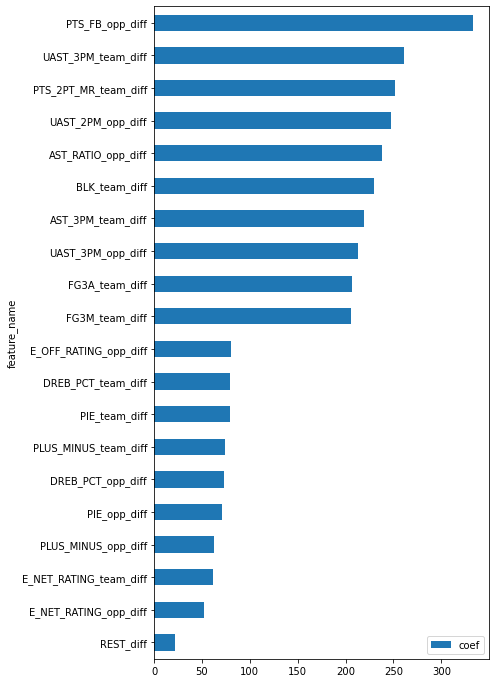

In [38]:
study_name = '../models/hyperparameter_tuning/study_lgbc'
storage_name = "sqlite:///{}.db".format(study_name)

study_lgbc = optuna.load_study(study_name = study_name, storage = storage_name)

lgbc_params = study_lgbc.best_trial.params
lgbc_params['random_state'] = 23
best_lgbc = lgb.LGBMClassifier()
best_lgbc.set_params(**lgbc_params)
print("best_lgbc:", best_lgbc)

best_lgbc.fit(X_train, y_train)

print("train_acc:", best_lgbc.score(X_train, y_train))
print("test_acc:", best_lgbc.score(X_test, y_test))


view_model_coefs(best_lgbc, X_train)


In [39]:
filename = '../models/best_lgbc_diffs'
joblib.dump(best_lgbc, filename)

['../models/best_lgbc_diffs']

best_lgbc: LGBMClassifier(colsample_bytree=0.3448418231087905,
               learning_rate=0.018026127695645325, max_depth=4,
               min_child_weight=0.15960057999681657, num_leaves=294,
               random_state=23, reg_alpha=1.22743843598509,
               reg_lambda=1.6786816776160904, subsample=0.845965636042065)
train_acc: 0.6178045838359469
test_acc: 0.5071766432882074
LGBoost or XGBoost


,feature_name,coef
86,elo_MOV_pred,1
68,REST_diff,1
72,DREB_PCT_opp_diff,3
77,EFG_PCT_team_diff,4
50,E_NET_RATING_opp_diff,4
47,PLUS_MINUS_opp_diff,4
21,PIE_team_diff,4
0,RECORD_team_diff,5
75,TS_PCT_team_diff,5
49,E_DEF_RATING_opp_diff,5


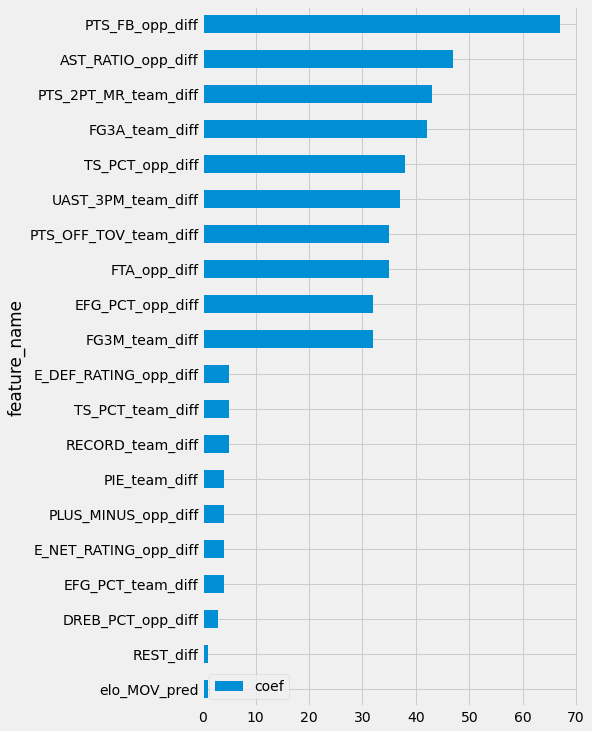

In [192]:
lgbc_params = study_lgbc.best_trial.params
lgbc_params['random_state'] = 23
best_lgbc = lgb.LGBMClassifier()
best_lgbc.set_params(**lgbc_params)
print("best_lgbc:", best_lgbc)

best_lgbc.fit(X_train, y_train)

print("train_acc:", best_lgbc.score(X_train, y_train))
print("test_acc:", best_lgbc.score(X_test, y_test))


view_model_coefs(best_lgbc, X_train)


In [156]:
best_lgbc = lgb.LGBMClassifier(colsample_bytree=0.30306249172980904,
               learning_rate=0.03464725063611881, max_depth=3,
               min_child_weight=0.6782064406615411, num_leaves=120,
               random_state=23, reg_alpha=2.5908850696822157,
               reg_lambda=6.57863348422055, subsample=0.7226323380307508)

In [44]:
from sklearn.decomposition import PCA


### KNNeighbors

In [142]:
sfs_pipe_knn = Pipeline(steps=[('scaler', StandardScaler()),
                                     ('pca', PCA(n_components=0.99)),
                                    ('knn',
                                     SFS(KNeighborsClassifier(n_neighbors=47),
                                    k_features='best', cv=tscv, scoring='accuracy', verbose=1))])


sfs_pipe_knn.fit(X_train, y_train)




[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  38 out of  38 | elapsed:   21.4s finished
Features: 1/38[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  37 out of  37 | elapsed:   23.4s finished
Features: 2/38[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  36 out of  36 | elapsed:   26.8s finished
Features: 3/38[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  35 out of  35 | elapsed:   31.6s finished
Features: 4/38[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  34 out of  34 | elapsed:   44.9s finished
Features: 5/38[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  33 out of  33 | elapsed:   47.3s finished
Features: 6/38[Parallel(

Pipeline(steps=[('scaler', StandardScaler()), ('pca', PCA(n_components=0.99)),
                ('knn',
                 SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                                           estimator=KNeighborsClassifier(n_neighbors=47),
                                           k_features='best',
                                           scoring='accuracy', verbose=1))])

In [144]:
res = pd.DataFrame.from_dict(sfs_pipe_knn.named_steps['knn'].get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

feature_idx = [int(x) for x in res.loc[best_trial, 'feature_names']]
sfs_selected_cols_knn = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_knn

AttributeError: 'Index' object has no attribute 'named_steps'

In [40]:
sfs_selected_cols_knn = ['FG2M_team_diff', 'FG2A_team_diff', 'FTM_team_diff', 'AST_team_diff',
       'BLK_team_diff', 'TOV_team_diff', 'PF_team_diff',
       'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff', 'POSS_team_diff',
       'PIE_team_diff', 'PTS_2PT_MR_team_diff', 'PTS_OFF_TOV_team_diff',
       'AST_3PM_team_diff', 'UAST_2PM_team_diff', 'UAST_3PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG2M_opp_diff',
       'FG3M_opp_diff', 'FG3A_opp_diff', 'FTM_opp_diff', 'FTA_opp_diff']

In [149]:
def objective(trial):    

    n_neighbors = trial.suggest_int('n_neighbors', 1, 52)
    n_components = trial.suggest_float('n_components', 0.9, 0.99)
    
    classifier_obj = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_knn)], remainder="drop")),
        ('scaler', StandardScaler()),
        ('pca', PCA(n_components=n_components)),
                ('knn',
                 KNeighborsClassifier(n_neighbors=n_neighbors))])
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_knn_sfs'
storage_name = "sqlite:///{}.db".format(study_name)

search_space = {'n_neighbors':np.arange(3, 50, 4).tolist(),
               'n_components':np.linspace(0.9, 0.99, 10).tolist()}

study_knn = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True,
                               sampler = optuna.samplers.GridSampler(search_space))

study_knn.optimize(objective)

[I 2021-11-06 20:05:50,749] A new study created in RDB with name: ../models/hyperparameter_tuning/study_knn_sfs
[I 2021-11-06 20:05:54,813] Trial 0 finished with value: 0.5123914302258251 and parameters: {'n_neighbors': 31, 'n_components': 0.92}. Best is trial 0 with value: 0.5123914302258251.
[I 2021-11-06 20:05:56,916] Trial 1 finished with value: 0.5132599884192242 and parameters: {'n_neighbors': 19, 'n_components': 0.9}. Best is trial 1 with value: 0.5132599884192242.
[I 2021-11-06 20:05:59,419] Trial 2 finished with value: 0.5086276780544297 and parameters: {'n_neighbors': 39, 'n_components': 0.92}. Best is trial 1 with value: 0.5132599884192242.
[I 2021-11-06 20:06:02,653] Trial 3 finished with value: 0.5082802547770701 and parameters: {'n_neighbors': 39, 'n_components': 0.96}. Best is trial 1 with value: 0.5132599884192242.
[I 2021-11-06 20:06:05,045] Trial 4 finished with value: 0.514997104806022 and parameters: {'n_neighbors': 27, 'n_components': 0.93}. Best is trial 4 with va

[I 2021-11-06 20:07:36,186] Trial 42 finished with value: 0.511638679791546 and parameters: {'n_neighbors': 43, 'n_components': 0.97}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:07:38,262] Trial 43 finished with value: 0.5126230457440648 and parameters: {'n_neighbors': 19, 'n_components': 0.92}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:07:41,063] Trial 44 finished with value: 0.5141864504921829 and parameters: {'n_neighbors': 19, 'n_components': 0.98}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:07:43,468] Trial 45 finished with value: 0.5086276780544297 and parameters: {'n_neighbors': 39, 'n_components': 0.93}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:07:45,999] Trial 46 finished with value: 0.5104806022003474 and parameters: {'n_neighbors': 19, 'n_components': 0.97}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:07:48,150] Trial 47 finished with value: 0.5042848870874349 and param

[I 2021-11-06 20:09:13,364] Trial 84 finished with value: 0.5067168500289518 and parameters: {'n_neighbors': 43, 'n_components': 0.91}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:09:15,303] Trial 85 finished with value: 0.5123335263462653 and parameters: {'n_neighbors': 15, 'n_components': 0.9}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:09:18,100] Trial 86 finished with value: 0.5068326577880718 and parameters: {'n_neighbors': 31, 'n_components': 0.99}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:09:20,199] Trial 87 finished with value: 0.5063115228720324 and parameters: {'n_neighbors': 39, 'n_components': 0.91}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:09:22,078] Trial 88 finished with value: 0.5123335263462653 and parameters: {'n_neighbors': 15, 'n_components': 0.91}. Best is trial 4 with value: 0.514997104806022.
[I 2021-11-06 20:09:23,911] Trial 89 finished with value: 0.5077012159814708 and param

In [46]:
study_name = '../models/hyperparameter_tuning/study_knn_sfs'
storage_name = "sqlite:///{}.db".format(study_name)

study_knn = optuna.load_study(study_name = study_name, 
                               storage = storage_name)


best_n = study_knn.best_trial.params['n_neighbors']
best_n_components = study_knn.best_trial.params['n_components']


best_knn = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_knn)], remainder="drop")),
        ('scaler', StandardScaler()),
        ('pca', PCA(n_components=best_n_components)),
                ('knn',
                 KNeighborsClassifier(n_neighbors=best_n))])

print("best_knn:", best_knn)

best_knn.fit(X_train, y_train)

print("train_score:", best_knn.score(X_train, y_train))
print("test_score:", best_knn.score(X_test, y_test))

best_knn: Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['FG2M_team_diff',
                                                   'FG2A_team_diff',
                                                   'FTM_team_diff',
                                                   'AST_team_diff',
                                                   'BLK_team_diff',
                                                   'TOV_team_diff',
                                                   'PF_team_diff',
                                                   'PLUS_MINUS_team_diff',
                                                   'E_OFF_RATING_team_diff',
                                                   'POSS_team_diff',
                                                   'PIE_team_diff',
                                                   'PTS_2PT_MR_team_diff',
                                           

In [47]:
filename = 'best_knn_diffs_sfs'

joblib.dump(best_knn, filename)

['best_knn_diffs_sfs']

### Random Forest

In [219]:
sfs_pipe_rf = SFS(RandomForestClassifier(max_depth=9,
                                        min_samples_leaf=0.010338564023847334,
                                        min_samples_split=0.017844890716741457,
                                        random_state=23), k_features=25, cv=tscv, scoring='accuracy', floating=True, verbose=1)


sfs_pipe_rf.fit(X_train, y_train)

[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  89 out of  89 | elapsed:  6.6min finished
Features: 1/25[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  88 out of  88 | elapsed:  5.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.7s finished
Features: 2/25[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  87 out of  87 | elapsed:  5.2min finished
[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done   2 out of   2 | elapsed:    7.1s finished
Features: 3/25[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.
[Parallel(n_jobs=1)]: Done  86 out of  86 | elapsed:  7.5min finished
[Parallel(n_jobs=1)]: Using backend SequentialBacken

SequentialFeatureSelector(cv=TimeSeriesSplit(gap=0, max_train_size=None, n_splits=5, test_size=None),
                          estimator=RandomForestClassifier(max_depth=9,
                                                           min_samples_leaf=0.010338564023847334,
                                                           min_samples_split=0.017844890716741457,
                                                           random_state=23),
                          floating=True, k_features=25, scoring='accuracy',
                          verbose=1)

In [220]:
res = pd.DataFrame.from_dict(sfs_pipe_rf.get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

sfs_selected_cols_rf = [str(x) for x in res.loc[best_trial, 'feature_names']]
# sfs_selected_cols_rf = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_rf

['STL_team_diff',
 'PTS_2PT_MR_team_diff',
 'AST_2PM_team_diff',
 'UAST_2PM_team_diff',
 'STL_opp_diff',
 'BLK_opp_diff',
 'PTS_2PT_MR_opp_diff',
 'PTS_FB_opp_diff',
 'OREB_PCT_team_diff',
 'TS_PCT_opp_diff',
 'EFG_PCT_opp_diff',
 'AST_RATIO_opp_diff',
 'team_elo_pred']

In [199]:
res = pd.DataFrame.from_dict(sfs_pipe_rf.get_metric_dict()).T
res.sort_values('avg_score', ascending=False)

best_trial = res.sort_values('avg_score', ascending=False).index[0]

sfs_selected_cols_rf = [str(x) for x in res.loc[best_trial, 'feature_names']]
# sfs_selected_cols_rf = X_train.iloc[:, feature_idx].columns
sfs_selected_cols_rf

['REB_team_diff',
 'AST_3PM_team_diff',
 'UAST_2PM_team_diff',
 'FG3A_opp_diff',
 'FTM_opp_diff',
 'DREB_opp_diff',
 'REB_opp_diff',
 'PTS_2PT_MR_opp_diff',
 'PTS_FB_opp_diff',
 'AST_2PM_opp_diff',
 'ATS_DIFF_opp_diff',
 'TEAM_COVERED_opp_diff',
 'TS_PCT_opp_diff',
 'EFG_PCT_opp_diff',
 'AST_RATIO_opp_diff']

In [222]:
def objective(trial):    
    min_samples_split = trial.suggest_float('min_samples_split', 0.01, 0.5)
#     subsample = trial.suggest_float('subsample', 0.6, 1)
    max_depth = trial.suggest_int('max_depth', 3, 32)
    min_samples_leaf = trial.suggest_float('min_samples_leaf', 0.01, 0.5)

    classifier_obj = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_rf)], remainder="drop")),
        ('rf', RandomForestClassifier(max_depth=max_depth, min_samples_leaf=min_samples_leaf,
                       min_samples_split=min_samples_split, random_state=23))])
    
    
    score = cross_val_score(classifier_obj, X_train, y_train, n_jobs=-1,
                           cv=tscv, scoring='accuracy')
    
    
    score_avg = score.mean()
    
    return score_avg

study_name = '../models/hyperparameter_tuning/study_rf2_sffs'
storage_name = "sqlite:///{}.db".format(study_name)

study_rf = optuna.create_study(study_name = study_name, direction='maximize', 
                               storage = storage_name, load_if_exists=True)

study_rf.optimize(objective, n_trials=250)

[I 2021-11-07 21:35:09,896] A new study created in RDB with name: ../models/hyperparameter_tuning/study_rf2_sffs
[I 2021-11-07 21:35:13,817] Trial 0 finished with value: 0.5244933410538506 and parameters: {'min_samples_split': 0.30049311143639595, 'max_depth': 30, 'min_samples_leaf': 0.031908231550304145}. Best is trial 0 with value: 0.5244933410538506.
[I 2021-11-07 21:35:15,097] Trial 1 finished with value: 0.5127388535031847 and parameters: {'min_samples_split': 0.43349639870897777, 'max_depth': 28, 'min_samples_leaf': 0.25855990419169417}. Best is trial 0 with value: 0.5244933410538506.
[I 2021-11-07 21:35:17,015] Trial 2 finished with value: 0.5228141285466126 and parameters: {'min_samples_split': 0.305812631034427, 'max_depth': 6, 'min_samples_leaf': 0.034239983385758656}. Best is trial 0 with value: 0.5244933410538506.
[I 2021-11-07 21:35:19,067] Trial 3 finished with value: 0.5243196294151707 and parameters: {'min_samples_split': 0.2815580079237897, 'max_depth': 18, 'min_sample

[I 2021-11-07 21:36:15,499] Trial 32 finished with value: 0.5244354371742906 and parameters: {'min_samples_split': 0.06030190997433507, 'max_depth': 3, 'min_samples_leaf': 0.045931759816115636}. Best is trial 15 with value: 0.5280254777070063.
[I 2021-11-07 21:36:17,309] Trial 33 finished with value: 0.5180660104226983 and parameters: {'min_samples_split': 0.036450491165351276, 'max_depth': 10, 'min_samples_leaf': 0.10207229634323978}. Best is trial 15 with value: 0.5280254777070063.
[I 2021-11-07 21:36:19,809] Trial 34 finished with value: 0.5305153445280835 and parameters: {'min_samples_split': 0.10343617670917564, 'max_depth': 5, 'min_samples_leaf': 0.041549315118501726}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:36:21,332] Trial 35 finished with value: 0.5218876664736537 and parameters: {'min_samples_split': 0.4865591346402012, 'max_depth': 5, 'min_samples_leaf': 0.04160609011329607}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:36:23,42

[I 2021-11-07 21:37:23,589] Trial 64 finished with value: 0.5272148233931673 and parameters: {'min_samples_split': 0.05169530616311722, 'max_depth': 14, 'min_samples_leaf': 0.03898311311829095}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:37:26,115] Trial 65 finished with value: 0.5251881876085698 and parameters: {'min_samples_split': 0.09296661116491567, 'max_depth': 18, 'min_samples_leaf': 0.05225205579378149}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:37:28,063] Trial 66 finished with value: 0.5228141285466126 and parameters: {'min_samples_split': 0.15394167415643806, 'max_depth': 16, 'min_samples_leaf': 0.08377040079900044}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:37:29,915] Trial 67 finished with value: 0.5180081065431384 and parameters: {'min_samples_split': 0.1252947654450671, 'max_depth': 12, 'min_samples_leaf': 0.10160948413756613}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:37:31,50

[I 2021-11-07 21:38:39,875] Trial 96 finished with value: 0.5279675738274465 and parameters: {'min_samples_split': 0.0835688978745329, 'max_depth': 9, 'min_samples_leaf': 0.03312789311001539}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:38:42,262] Trial 97 finished with value: 0.5271569195136074 and parameters: {'min_samples_split': 0.024065897355791552, 'max_depth': 9, 'min_samples_leaf': 0.049260498777462164}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:38:44,179] Trial 98 finished with value: 0.5177764910248986 and parameters: {'min_samples_split': 0.07914769250198683, 'max_depth': 16, 'min_samples_leaf': 0.10195221139276668}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:38:46,154] Trial 99 finished with value: 0.523335263462652 and parameters: {'min_samples_split': 0.2610954753840597, 'max_depth': 4, 'min_samples_leaf': 0.03381415754925181}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:38:48,187] 

[I 2021-11-07 21:39:52,417] Trial 128 finished with value: 0.5207295888824552 and parameters: {'min_samples_split': 0.1316716077481189, 'max_depth': 17, 'min_samples_leaf': 0.06780229025436707}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:39:54,973] Trial 129 finished with value: 0.5280833815865663 and parameters: {'min_samples_split': 0.04405212593054058, 'max_depth': 12, 'min_samples_leaf': 0.03887004416523238}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:39:57,250] Trial 130 finished with value: 0.5231036479444123 and parameters: {'min_samples_split': 0.04482069888450824, 'max_depth': 5, 'min_samples_leaf': 0.05386672041478044}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:39:59,940] Trial 131 finished with value: 0.5264041690793283 and parameters: {'min_samples_split': 0.10613483108760347, 'max_depth': 10, 'min_samples_leaf': 0.026782820975892227}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:40:0

[I 2021-11-07 21:41:11,325] Trial 160 finished with value: 0.5265778807180082 and parameters: {'min_samples_split': 0.07687949395783997, 'max_depth': 12, 'min_samples_leaf': 0.03944971034589534}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:41:13,929] Trial 161 finished with value: 0.5287782281412855 and parameters: {'min_samples_split': 0.09832947473234535, 'max_depth': 12, 'min_samples_leaf': 0.041443542887297416}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:41:16,302] Trial 162 finished with value: 0.5265199768384481 and parameters: {'min_samples_split': 0.10841373325034867, 'max_depth': 10, 'min_samples_leaf': 0.05108221600638102}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:41:18,859] Trial 163 finished with value: 0.5278517660683265 and parameters: {'min_samples_split': 0.06538369662021085, 'max_depth': 12, 'min_samples_leaf': 0.03969929976828726}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:41

[I 2021-11-07 21:42:29,733] Trial 192 finished with value: 0.5295309785755645 and parameters: {'min_samples_split': 0.09577491457282453, 'max_depth': 14, 'min_samples_leaf': 0.02352521863093108}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:42:32,430] Trial 193 finished with value: 0.5255935147654893 and parameters: {'min_samples_split': 0.13202696734272193, 'max_depth': 15, 'min_samples_leaf': 0.01958335778833251}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:42:35,288] Trial 194 finished with value: 0.5270411117544875 and parameters: {'min_samples_split': 0.120238247311593, 'max_depth': 14, 'min_samples_leaf': 0.010427422611534383}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:42:37,859] Trial 195 finished with value: 0.527504342790967 and parameters: {'min_samples_split': 0.09894943563379004, 'max_depth': 14, 'min_samples_leaf': 0.029586135838320447}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:42:4

[I 2021-11-07 21:43:49,170] Trial 224 finished with value: 0.5269253039953676 and parameters: {'min_samples_split': 0.04328741254441929, 'max_depth': 11, 'min_samples_leaf': 0.018758512651752983}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:43:51,847] Trial 225 finished with value: 0.5270990156340475 and parameters: {'min_samples_split': 0.08403015833326215, 'max_depth': 8, 'min_samples_leaf': 0.03351437545260648}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:43:54,365] Trial 226 finished with value: 0.5255935147654893 and parameters: {'min_samples_split': 0.09499114359904223, 'max_depth': 11, 'min_samples_leaf': 0.05227198870021976}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:43:56,926] Trial 227 finished with value: 0.5288361320208453 and parameters: {'min_samples_split': 0.12279593687556821, 'max_depth': 15, 'min_samples_leaf': 0.040149300638476035}. Best is trial 34 with value: 0.5305153445280835.
[I 2021-11-07 21:43

In [223]:
print(study_rf.best_params)

max_depth = study_rf.best_params['max_depth']
min_samples_leaf = study_rf.best_params['min_samples_leaf']
min_samples_split = study_rf.best_params['min_samples_split']


best_rf = Pipeline(steps=[("selector", ColumnTransformer([
        ("selector", "passthrough", sfs_selected_cols_rf)], remainder="drop")),
        ('rf', RandomForestClassifier(max_depth=max_depth, min_samples_leaf=min_samples_leaf,
                       min_samples_split=min_samples_split, random_state=23))])

print(best_rf)

{'max_depth': 5, 'min_samples_leaf': 0.041549315118501726, 'min_samples_split': 0.10343617670917564}
Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['STL_team_diff',
                                                   'PTS_2PT_MR_team_diff',
                                                   'AST_2PM_team_diff',
                                                   'UAST_2PM_team_diff',
                                                   'STL_opp_diff',
                                                   'BLK_opp_diff',
                                                   'PTS_2PT_MR_opp_diff',
                                                   'PTS_FB_opp_diff',
                                                   'OREB_PCT_team_diff',
                                                   'TS_PCT_opp_diff',
                                                   'EFG_PCT_opp_diff',
             

In [226]:
best_rf = Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['STL_team_diff',
                                                   'PTS_2PT_MR_team_diff',
                                                   'AST_2PM_team_diff',
                                                   'UAST_2PM_team_diff',
                                                   'STL_opp_diff',
                                                   'BLK_opp_diff',
                                                   'PTS_2PT_MR_opp_diff',
                                                   'PTS_FB_opp_diff',
                                                   'OREB_PCT_team_diff',
                                                   'TS_PCT_opp_diff',
                                                   'EFG_PCT_opp_diff',
                                                   'AST_RATIO_opp_diff',
                                                   'team_elo_pred'])])),
                ('rf',
                 RandomForestClassifier(max_depth=5,
                                        min_samples_leaf=0.041549315118501726,
                                        min_samples_split=0.10343617670917564,
                                        random_state=23))])

best_rf.fit(X_train, y_train)

print("rf train_acc:", best_rf.score(X_train, y_train))
print("rf test_acc:", best_rf.score(X_test, y_test))

rf train_acc: 0.5507840772014475
rf test_acc: 0.5114989398140597


In [56]:
best_rf = Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['REB_team_diff',
                                                   'AST_3PM_team_diff',
                                                   'UAST_2PM_team_diff',
                                                   'FG3A_opp_diff',
                                                   'FTM_opp_diff',
                                                   'DREB_opp_diff',
                                                   'REB_opp_diff',
                                                   'PTS_2PT_MR_opp_diff',
                                                   'PTS_FB_opp_diff',
                                                   'AST_2PM_opp_diff',
                                                   'ATS_DIFF_opp_diff',
                                                   'TEAM_COVERED_opp_diff',
                                                   'TS_PCT_opp_diff',
                                                   'EFG_PCT_opp_diff',
                                                   'AST_RATIO_opp_diff'])])),
                ('rf',
                 RandomForestClassifier(max_depth=9,
                                        min_samples_leaf=0.010338564023847334,
                                        min_samples_split=0.017844890716741457,
                                        random_state=23))])

best_rf.fit(X_train, y_train)

print("rf train_acc:", best_rf.score(X_train, y_train))
print("rf test_acc:", best_rf.score(X_test, y_test))

rf train_acc: 0.5849939686369119
rf test_acc: 0.5161474473984669


LGBoost or XGBoost


,feature_name,coef
6,REB_opp_diff,0.042253
3,FG3A_opp_diff,0.045429
0,REB_team_diff,0.047945
5,DREB_opp_diff,0.048209
7,PTS_2PT_MR_opp_diff,0.054621
4,FTM_opp_diff,0.057590
10,ATS_DIFF_opp_diff,0.059885
11,TEAM_COVERED_opp_diff,0.060382
14,AST_RATIO_opp_diff,0.062504
2,UAST_2PM_team_diff,0.069819


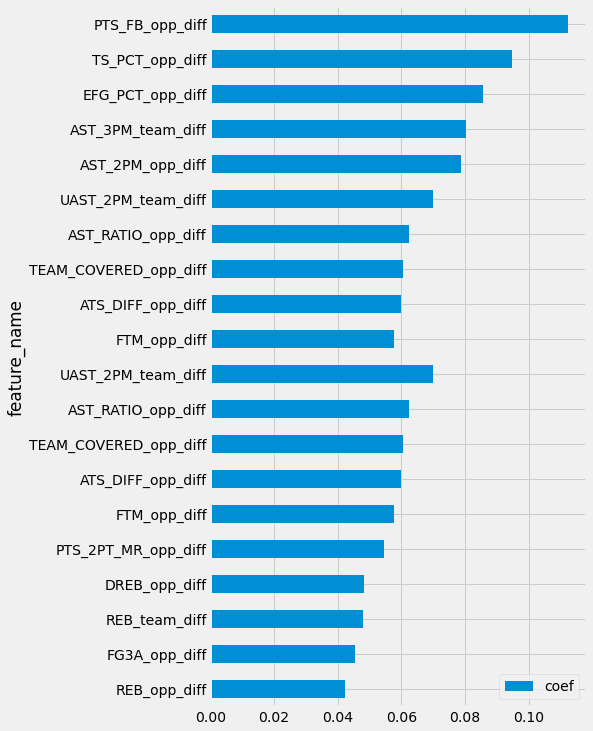

In [207]:
view_model_coefs(best_rf.named_steps['rf'], X_train[sfs_selected_cols_rf])

## Stacked Classifier

stacked clf train_acc: 0.5791073582629674
stacked clf test_acc: 0.5177865612648221
0
test set 1: 2016-10-27T00:00:00.000000000 - 2017-06-12T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 263 epochs took 5 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.0s finished


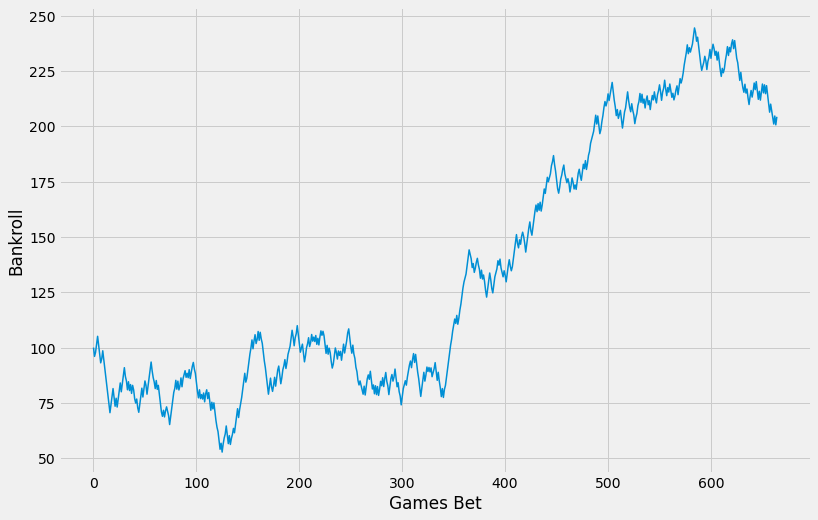

min balance: 52.727272727272855 
max balance: 244.54545454545388 
final balance: 200.36363636363538 
win percentage 55.04 
profit: 100.36363636363626 risk: 2202.0 
ROI: 4.5600000000000005
1
test set 1: 2017-10-20T00:00:00.000000000 - 2018-06-08T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 235 epochs took 4 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s finished


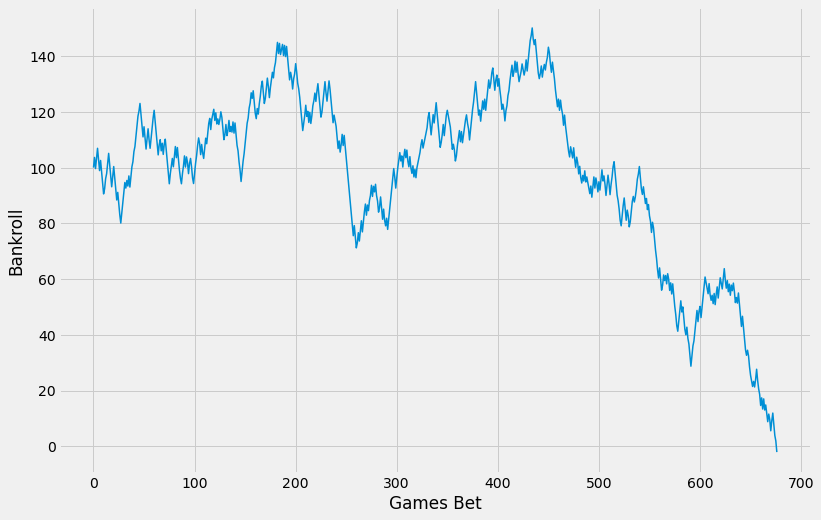

min balance: -4.09090909090901 
max balance: 150.0909090909092 
final balance: -4.09090909090901 
win percentage 50.370000000000005 
profit: -104.09090909090924 risk: 2269.0 
ROI: -4.590000000000001
2
test set 1: 2018-10-19T00:00:00.000000000 - 2019-06-13T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 204 epochs took 4 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.0s finished


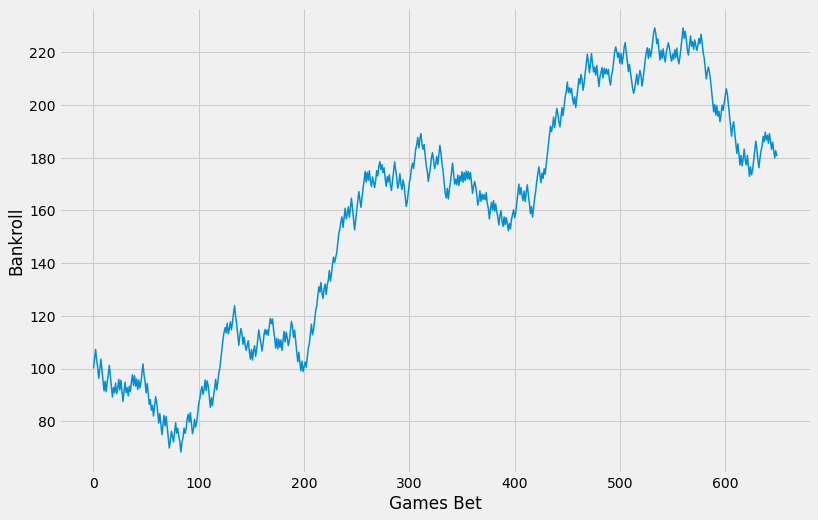

min balance: 68.27272727272738 
max balance: 229.27272727272597 
final balance: 177.6363636363619 
win percentage 53.690000000000005 
profit: 77.63636363636351 risk: 2135.0 
ROI: 3.64
3
test set 1: 2019-10-25T00:00:00.000000000 - 2020-10-11T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 161 epochs took 4 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.5s finished


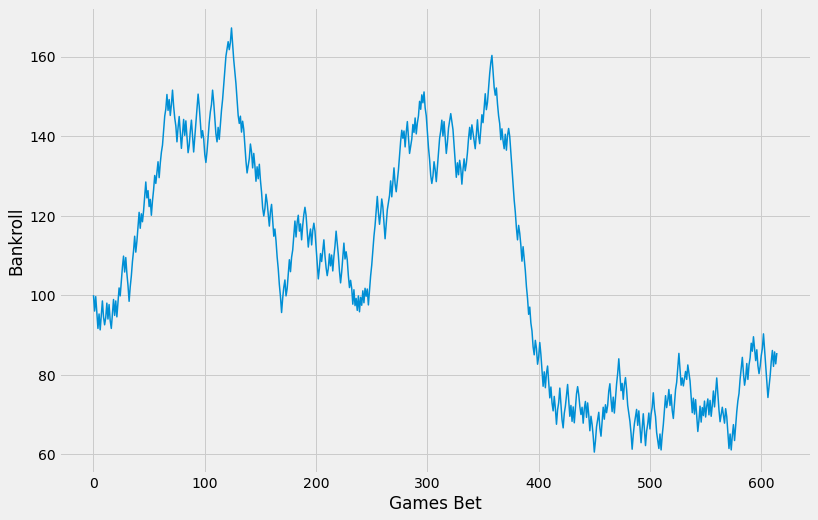

min balance: 60.54545454545388 
max balance: 167.1818181818179 
final balance: 87.27272727272678 
win percentage 52.2 
profit: -12.727272727272862 risk: 2044.0 
ROI: -0.62
4
test set 1: 2020-12-25T00:00:00.000000000 - 2021-07-20T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 171 epochs took 5 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    4.1s finished


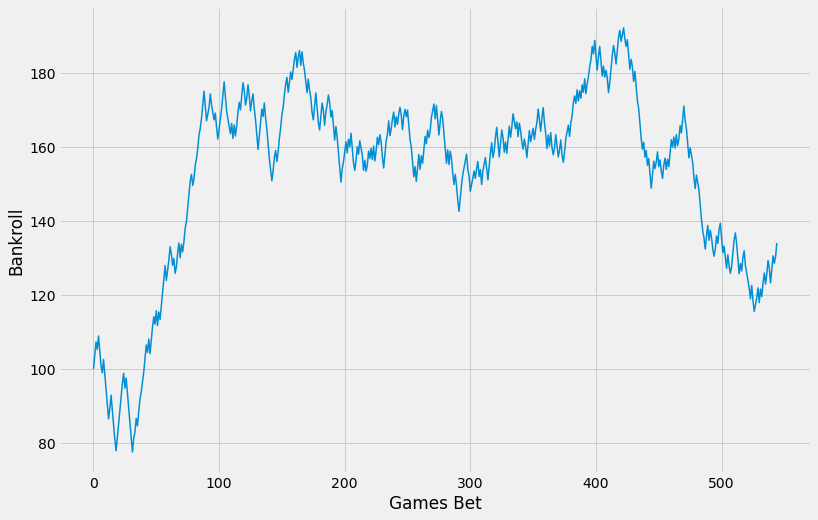

min balance: 77.5454545454546 
max balance: 192.0909090909076 
final balance: 137.6363636363618 
win percentage 52.839999999999996 
profit: 37.63636363636351 risk: 1734.0 
ROI: 2.17
5
test set 1: 2021-10-22T00:00:00.000000000 - 2021-12-01T00:00:00.000000000


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 126 epochs took 4 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.2s finished


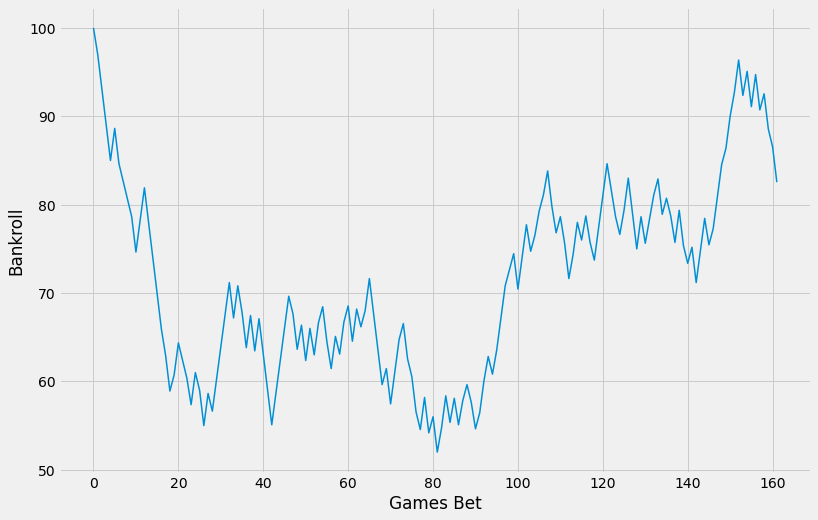

min balance: 52.00000000000003 
max balance: 97.0 
final balance: 79.54545454545463 
win percentage 50.0 
profit: -20.454545454545467 risk: 534.0 
ROI: -3.83

 Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['RECORD_team_diff',
                                                   'OREB_team_diff',
                                                   'DREB_team_diff',
                                                   'REB_team_diff',
                                                   'STL_team_diff',
                                                   'TOV_team_diff',
                                                   'PLUS_MINUS_team_diff',
                                                   'E_DEF_RATING_team_diff',
                                                   'PTS_OFF_TOV_team_diff',
                                                   'AST_3PM_team_diff',
                     

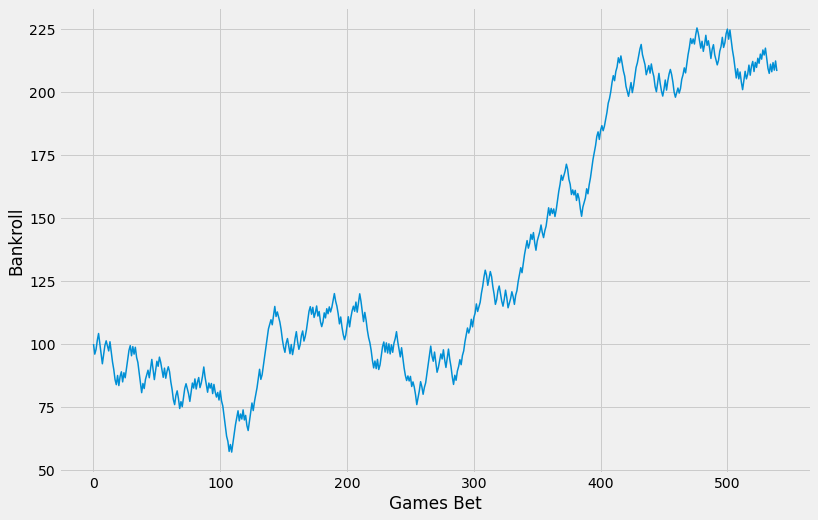

min balance: 57.181818181818265 
max balance: 225.27272727272694 
final balance: 209.9999999999994 
win percentage 54.81 
profit: 109.99999999999989 risk: 1696.0 
ROI: 6.49
1
test set 1: 2017-10-20T00:00:00.000000000 - 2018-06-08T00:00:00.000000000


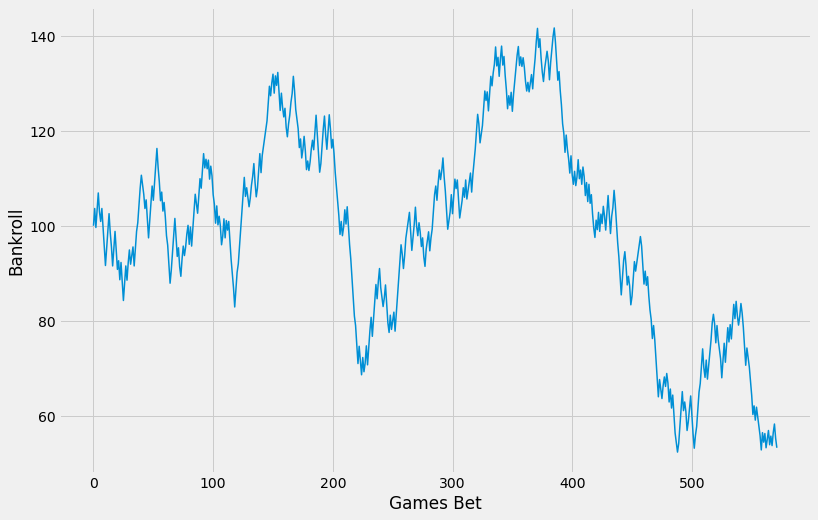

min balance: 50.2727272727274 
max balance: 141.63636363636365 
final balance: 50.2727272727274 
win percentage 51.57000000000001 
profit: -49.72727272727275 risk: 1808.0 
ROI: -2.75
2
test set 1: 2018-10-19T00:00:00.000000000 - 2019-06-13T00:00:00.000000000


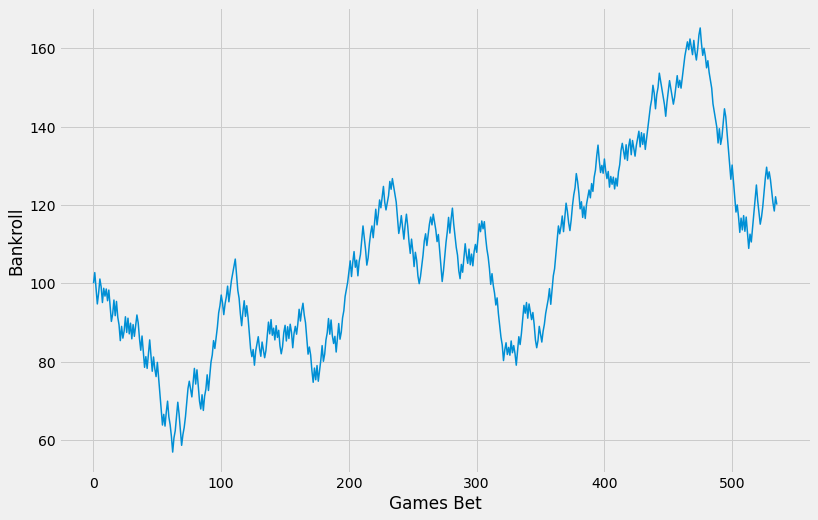

min balance: 56.909090909091006 
max balance: 165.18181818181824 
final balance: 117.09090909090914 
win percentage 52.05 
profit: 17.09090909090901 risk: 1661.0 
ROI: 1.03
3
test set 1: 2019-10-25T00:00:00.000000000 - 2020-10-11T00:00:00.000000000


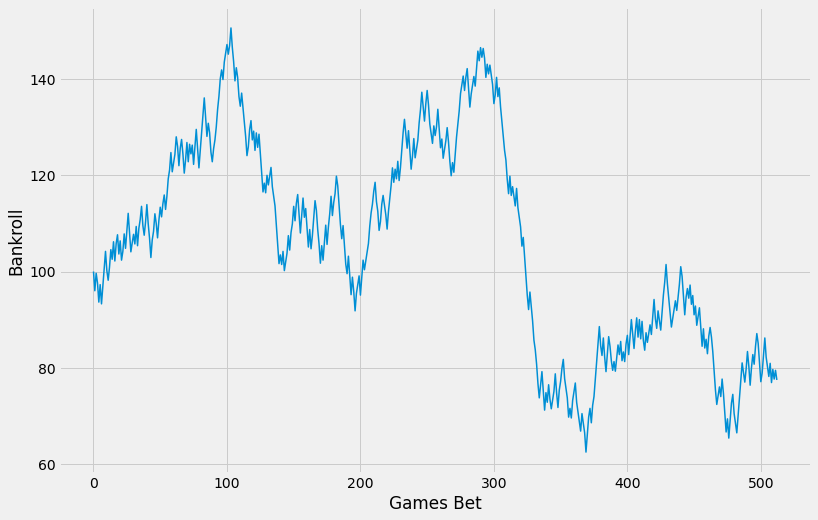

min balance: 62.45454545454524 
max balance: 150.63636363636363 
final balance: 79.27272727272718 
win percentage 51.66 
profit: -20.727272727272748 risk: 1611.0 
ROI: -1.29
4
test set 1: 2020-12-25T00:00:00.000000000 - 2021-07-20T00:00:00.000000000


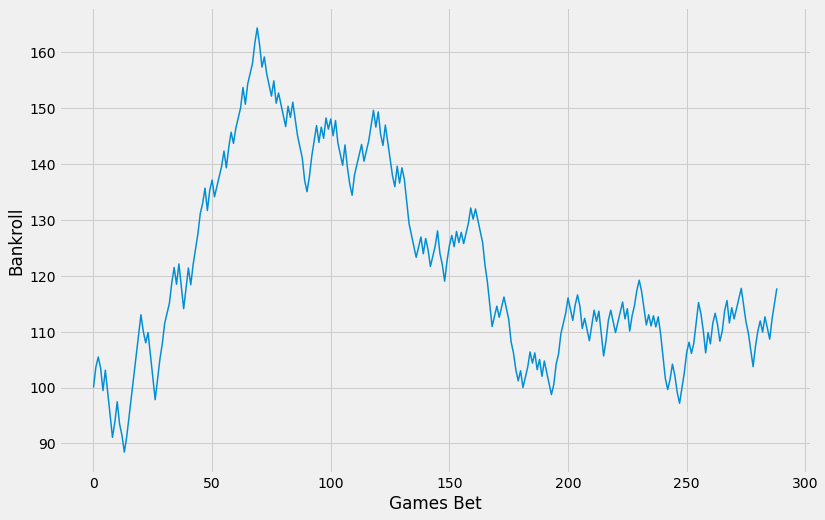

min balance: 88.45454545454547 
max balance: 164.27272727272722 
final balance: 119.54545454545425 
win percentage 52.94 
profit: 19.545454545454504 risk: 809.0 
ROI: 2.42
5
test set 1: 2021-10-22T00:00:00.000000000 - 2021-12-01T00:00:00.000000000


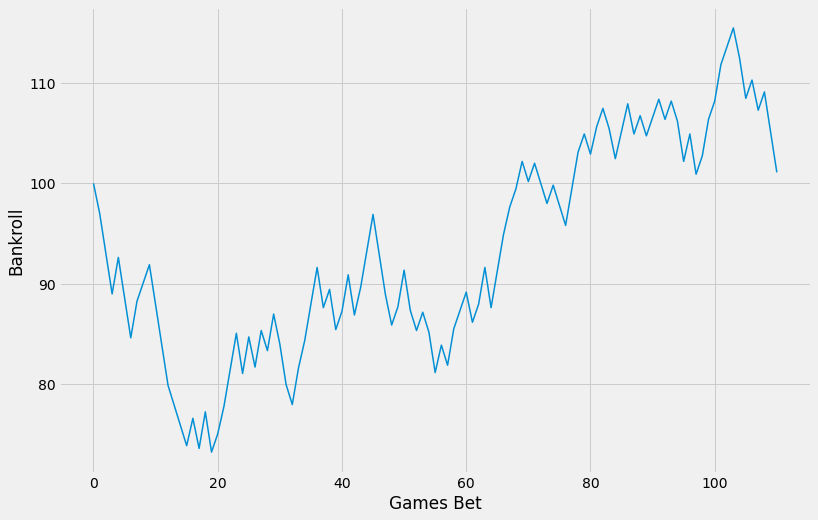

min balance: 73.27272727272728 
max balance: 115.4545454545455 
final balance: 99.09090909090912 
win percentage 53.15 
profit: -0.9090909090909349 risk: 335.0 
ROI: -0.27

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('selector',
                                                 ColumnTransformer(transformers=[('selector',
                                                                                  'passthrough',
                                                                                  ['RECORD_team_diff',
                                                                                   'OREB_team_diff',
                                                                                   'DREB_team_diff',
                                                                                   'REB_team_diff',
                                                                                   'STL_team_diff',
                              

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,2017,0.53,0.548148,540,0.064858,110.000000
1,2018,0.53,0.515734,572,-0.027504,-49.727273
2,2019,0.53,0.520522,536,0.010290,17.090909
3,2020,0.53,0.516569,513,-0.012866,-20.727273
4,2021,0.53,0.529412,289,0.024160,19.545455
5,2021,0.53,0.531532,111,-0.002714,-0.909091


In [322]:
estimators = [('log', best_lr), ('sgd_huber', best_sgd_huber),
              ('svc', best_sgd_hinge), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [best_lr, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], "-",
             df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1])

        year = df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].astype(str).str[:4].values[-1]
        
        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

stacked clf train_acc: 0.5791073582629674
stacked clf test_acc: 0.5176039509319739
0
test set 1: 2016-10-27T00:00:00.000000000 - 2017-06-12T00:00:00.000000000


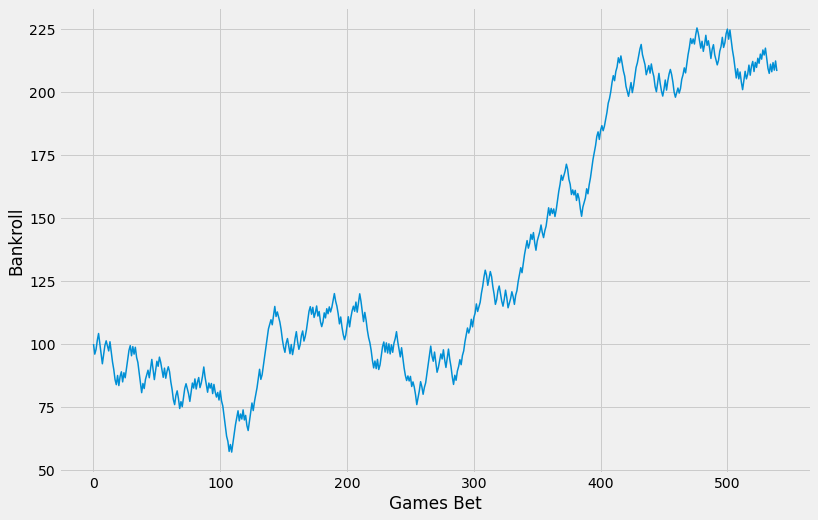

min balance: 57.181818181818265 
max balance: 225.27272727272694 
final balance: 209.9999999999994 
win percentage 54.81 
profit: 109.99999999999989 risk: 1696.0 
ROI: 6.49
1
test set 1: 2017-10-20T00:00:00.000000000 - 2018-06-08T00:00:00.000000000


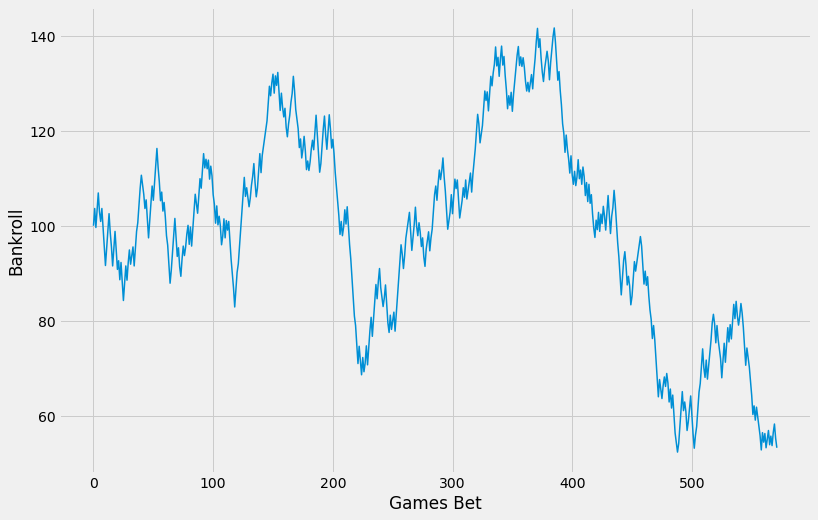

min balance: 50.2727272727274 
max balance: 141.63636363636365 
final balance: 50.2727272727274 
win percentage 51.57000000000001 
profit: -49.72727272727275 risk: 1808.0 
ROI: -2.75
2
test set 1: 2018-10-19T00:00:00.000000000 - 2019-06-13T00:00:00.000000000


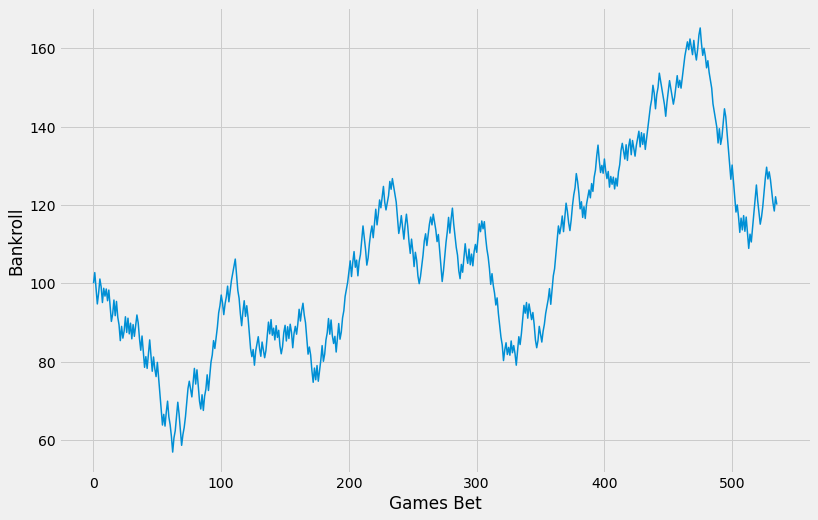

min balance: 56.909090909091006 
max balance: 165.18181818181824 
final balance: 117.09090909090914 
win percentage 52.05 
profit: 17.09090909090901 risk: 1661.0 
ROI: 1.03
3
test set 1: 2019-10-25T00:00:00.000000000 - 2020-10-11T00:00:00.000000000


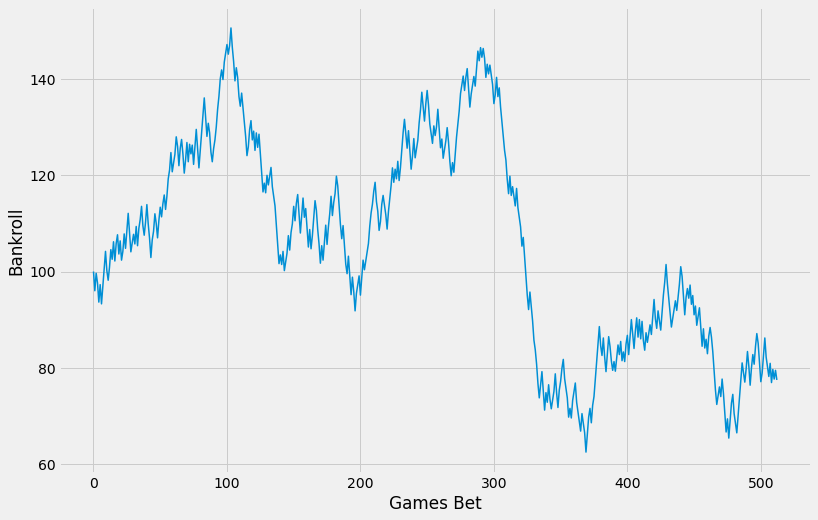

min balance: 62.45454545454524 
max balance: 150.63636363636363 
final balance: 79.27272727272718 
win percentage 51.66 
profit: -20.727272727272748 risk: 1611.0 
ROI: -1.29
4
test set 1: 2020-12-25T00:00:00.000000000 - 2021-07-20T00:00:00.000000000


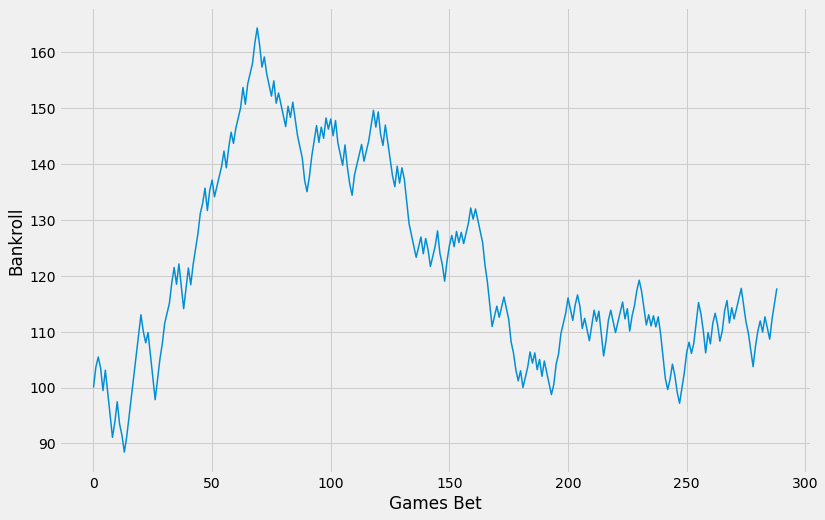

min balance: 88.45454545454547 
max balance: 164.27272727272722 
final balance: 119.54545454545425 
win percentage 52.94 
profit: 19.545454545454504 risk: 809.0 
ROI: 2.42
5
test set 1: 2021-10-22T00:00:00.000000000 - 2021-11-24T00:00:00.000000000


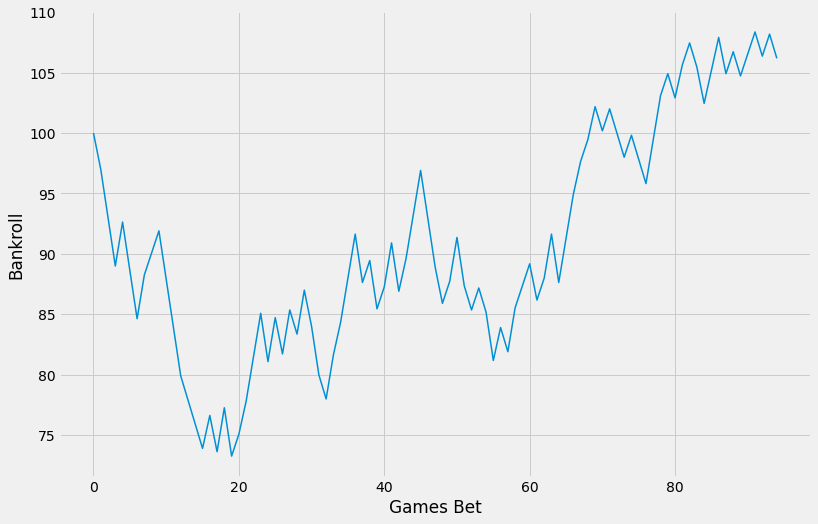

min balance: 73.27272727272728 
max balance: 108.36363636363642 
final balance: 102.18181818181823 
win percentage 52.629999999999995 
profit: 2.1818181818181586 risk: 288.0 
ROI: 0.76

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('selector',
                                                 ColumnTransformer(transformers=[('selector',
                                                                                  'passthrough',
                                                                                  ['RECORD_team_diff',
                                                                                   'OREB_team_diff',
                                                                                   'DREB_team_diff',
                                                                                   'REB_team_diff',
                                                                                   'STL_team_diff',
                 

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,2017,0.53,0.548148,540,0.064858,110.000000
1,2018,0.53,0.515734,572,-0.027504,-49.727273
2,2019,0.53,0.520522,536,0.010290,17.090909
3,2020,0.53,0.516569,513,-0.012866,-20.727273
4,2021,0.53,0.529412,289,0.024160,19.545455
5,2021,0.53,0.526316,95,0.007576,2.181818


In [255]:
estimators = [('log', best_lr), ('sgd_huber', best_sgd_huber),
              ('svc', best_sgd_hinge), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], "-",
             df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1])

        year = df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].astype(str).str[:4].values[-1]
        
        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

stacked clf train_acc: 0.5790591073582629
stacked clf test_acc: 0.5181862665144349
0
test set 1: 2016-10-27 - 2017-06-12


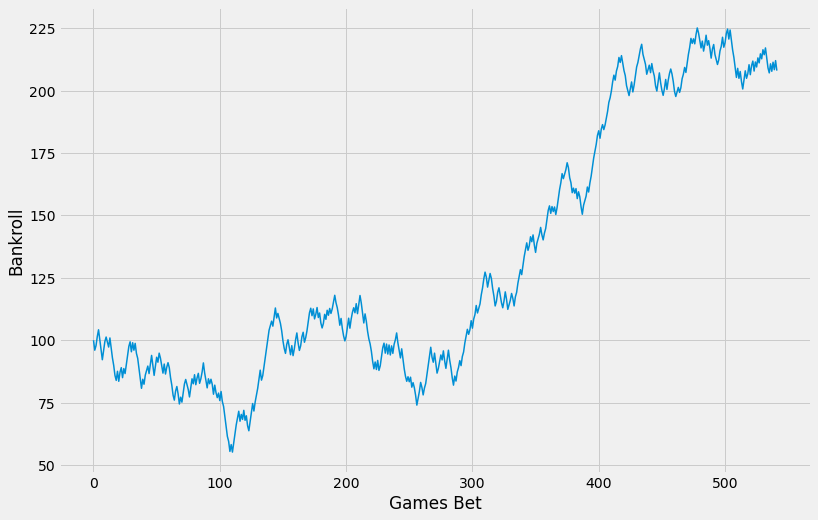

min balance: 55.181818181818265 
max balance: 225.09090909090872 
final balance: 209.8181818181812 
win percentage 54.800000000000004 
profit: 109.81818181818176 risk: 1700.0 
ROI: 6.460000000000001
1
test set 1: 2017-10-20 - 2018-06-08


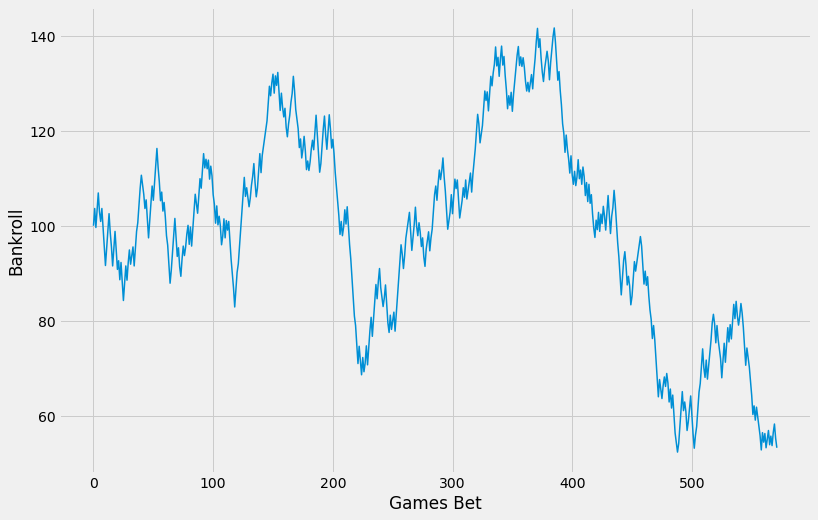

min balance: 50.2727272727274 
max balance: 141.63636363636365 
final balance: 50.2727272727274 
win percentage 51.57000000000001 
profit: -49.72727272727275 risk: 1808.0 
ROI: -2.75
2
test set 1: 2018-10-19 - 2019-06-13


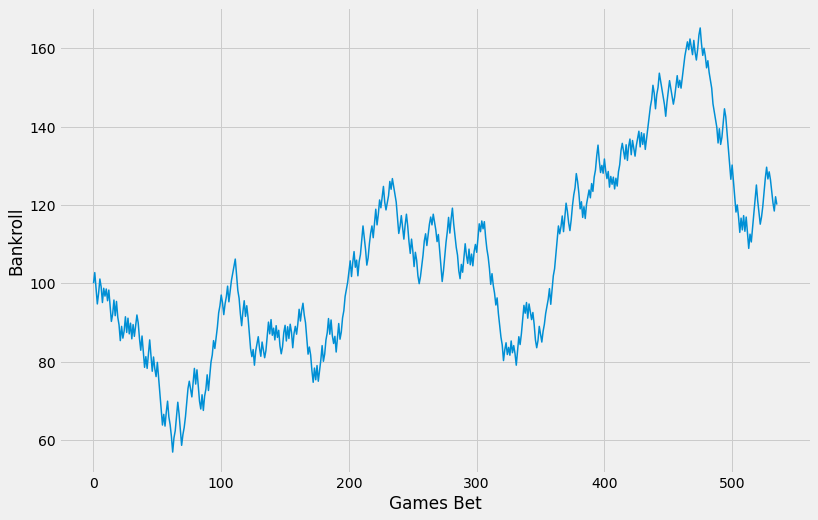

min balance: 56.909090909091006 
max balance: 165.18181818181824 
final balance: 117.09090909090914 
win percentage 52.05 
profit: 17.09090909090901 risk: 1661.0 
ROI: 1.03
3
test set 1: 2019-10-25 - 2020-10-11


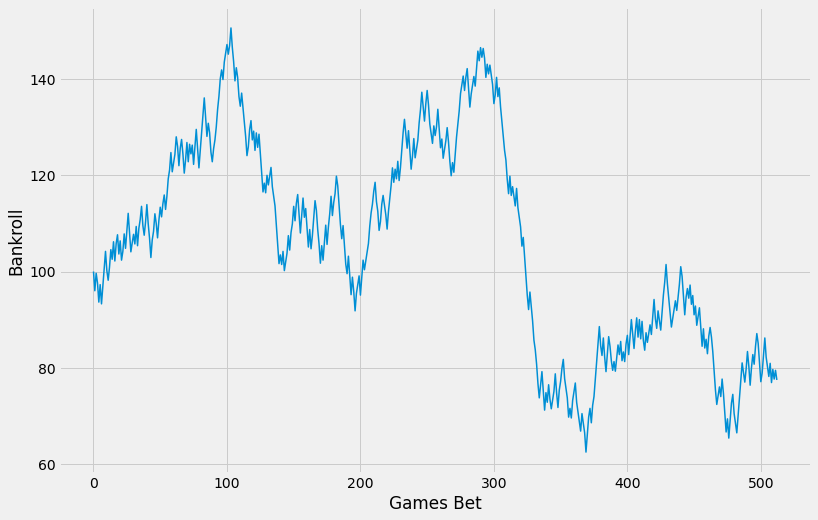

min balance: 62.45454545454524 
max balance: 150.63636363636363 
final balance: 79.27272727272718 
win percentage 51.66 
profit: -20.727272727272748 risk: 1611.0 
ROI: -1.29
4
test set 1: 2020-12-25 - 2021-07-20


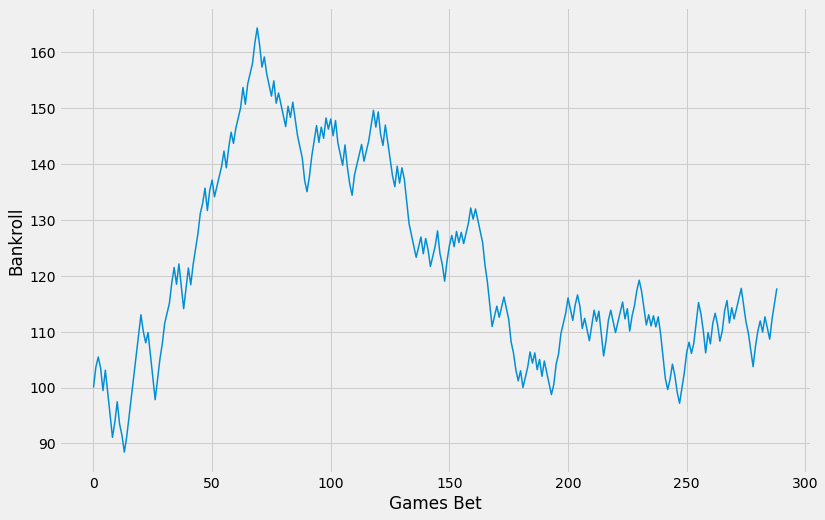

min balance: 88.45454545454547 
max balance: 164.27272727272722 
final balance: 119.54545454545425 
win percentage 52.94 
profit: 19.545454545454504 risk: 809.0 
ROI: 2.42
5
test set 1: 2021-10-22 - 2021-11-03


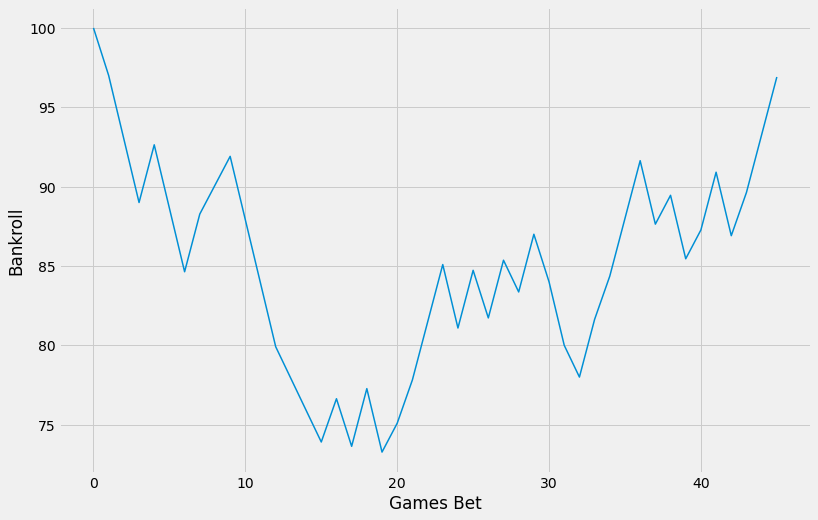

min balance: 73.27272727272728 
max balance: 97.0 
final balance: 92.90909090909096 
win percentage 50.0 
profit: -7.0909090909090935 risk: 156.0 
ROI: -4.55

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('selector',
                                                 ColumnTransformer(transformers=[('selector',
                                                                                  'passthrough',
                                                                                  ['RECORD_team_diff',
                                                                                   'OREB_team_diff',
                                                                                   'DREB_team_diff',
                                                                                   'REB_team_diff',
                                                                                   'STL_team_diff',
                                            

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,2017,0.53,0.547970,542,0.064599,109.818182
1,2018,0.53,0.515734,572,-0.027504,-49.727273
2,2019,0.53,0.520522,536,0.010290,17.090909
3,2020,0.53,0.516569,513,-0.012866,-20.727273
4,2021,0.53,0.529412,289,0.024160,19.545455
5,2021,0.53,0.500000,46,-0.045455,-7.090909


In [58]:
estimators = [('log', best_lr), ('sgd_huber', best_sgd_huber),
              ('svc', best_sgd_hinge), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], "-",
             df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1])

        year = df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].str[:4].values[-1]
        
        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

### with select features

0
test set 1: 2016-10-27 - 2017-01-21


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 199 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.1s finished


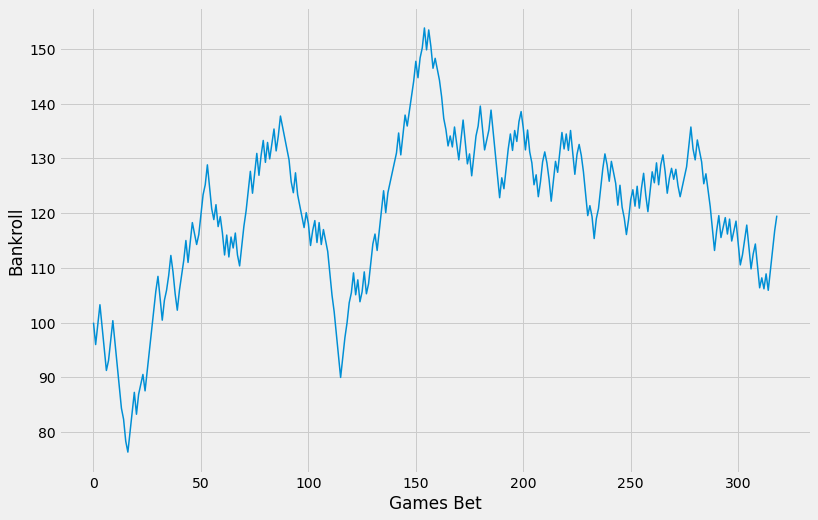

min balance: 76.36363636363637 
max balance: 153.8181818181818 
final balance: 122.27272727272702 
win percentage 53.290000000000006 
profit: 22.272727272727252 risk: 1043.0 
ROI: 2.1399999999999997
1
test set 1: 2017-01-21 - 2017-06-12


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 153 epochs took 2 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.4s finished


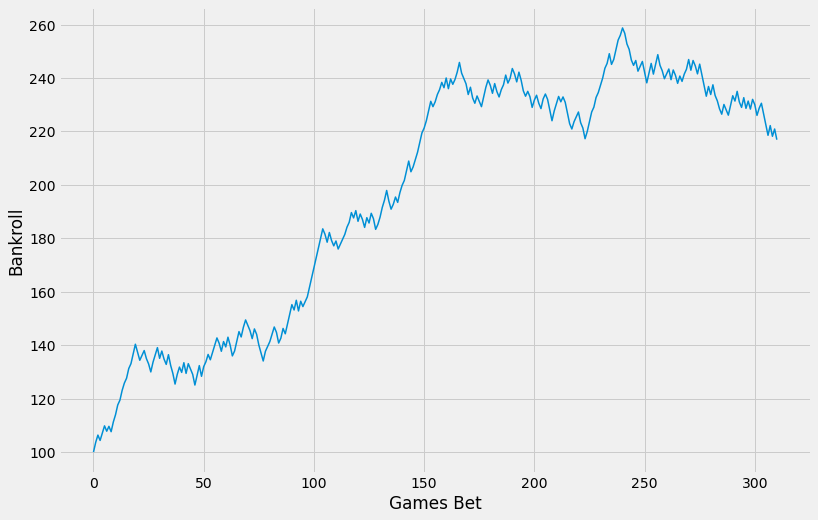

min balance: 103.63636363636364 
max balance: 258.72727272727167 
final balance: 218.7272727272714 
win percentage 56.589999999999996 
profit: 118.72727272727263 risk: 958.0 
ROI: 12.389999999999999
2
test set 1: 2017-10-20 - 2018-01-17


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 167 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.0s finished


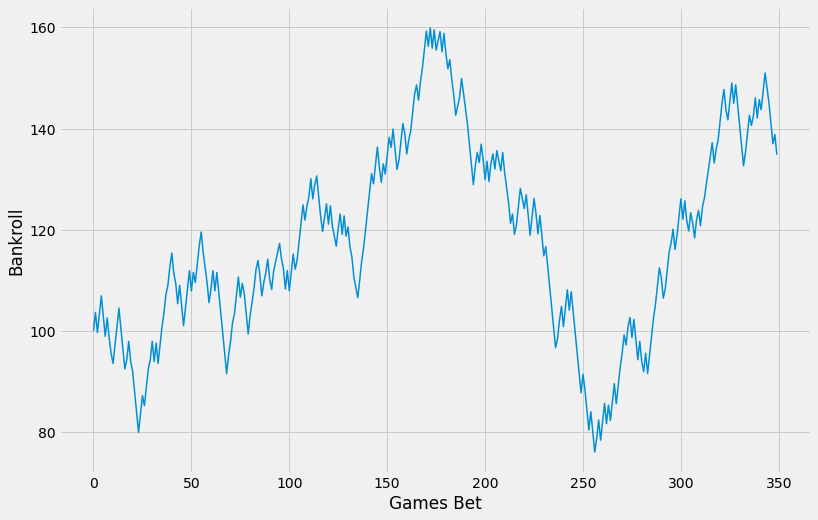

min balance: 75.99999999999993 
max balance: 159.90909090909093 
final balance: 138.4545454545453 
win percentage 54.0 
profit: 38.45454545454538 risk: 1212.0 
ROI: 3.17
3
test set 1: 2018-01-17 - 2018-06-08


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 85 epochs took 2 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    1.7s finished


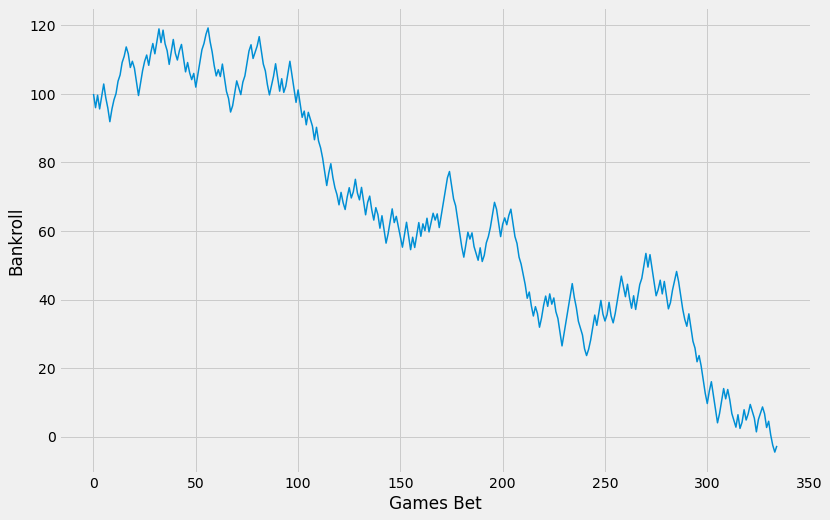

min balance: -6.727272727272684 
max balance: 119.27272727272734 
final balance: -6.727272727272684 
win percentage 47.46 
profit: -106.72727272727275 risk: 1109.0 
ROI: -9.62
4
test set 1: 2018-10-19 - 2019-01-15


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 137 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.8s finished


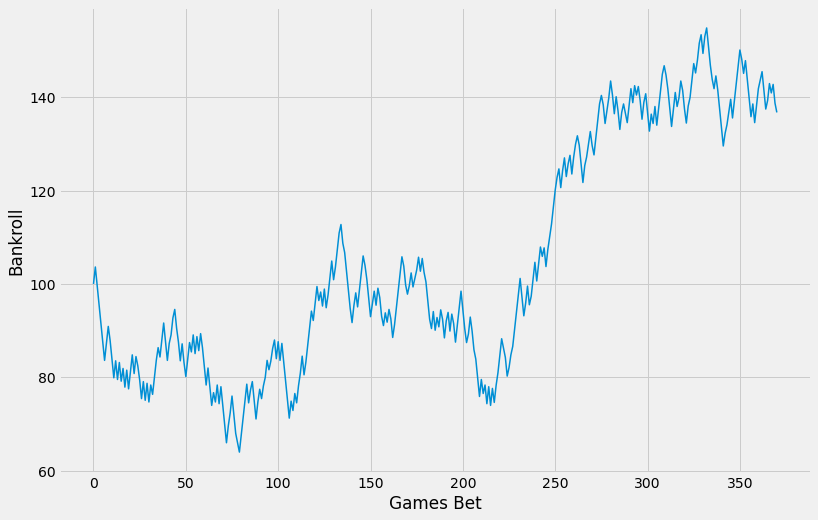

min balance: 64.00000000000013 
max balance: 154.81818181818193 
final balance: 140.36363636363632 
win percentage 53.37 
profit: 40.36363636363626 risk: 1254.0 
ROI: 3.2199999999999998
5
test set 1: 2019-01-16 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 132 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.9s finished


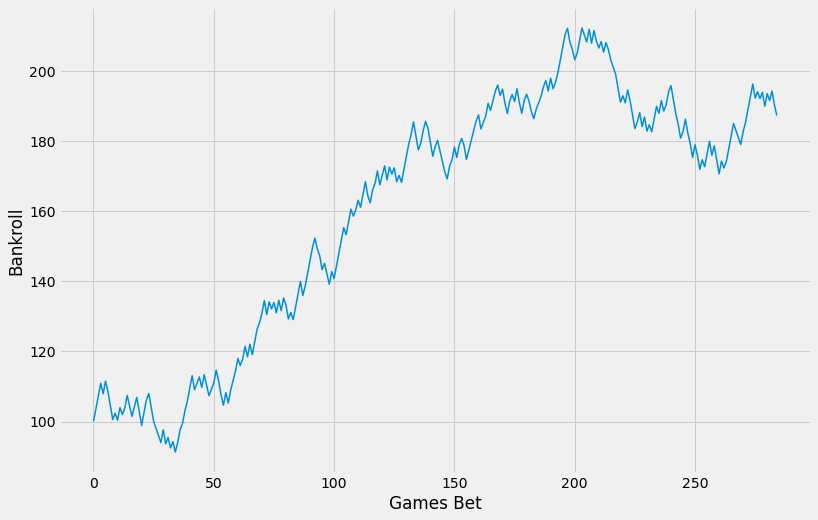

min balance: 91.2727272727273 
max balance: 212.36363636363575 
final balance: 190.09090909090816 
win percentage 56.14 
profit: 90.09090909090907 risk: 895.0 
ROI: 10.07
6
test set 1: 2019-10-25 - 2020-01-10


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 145 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.7s finished


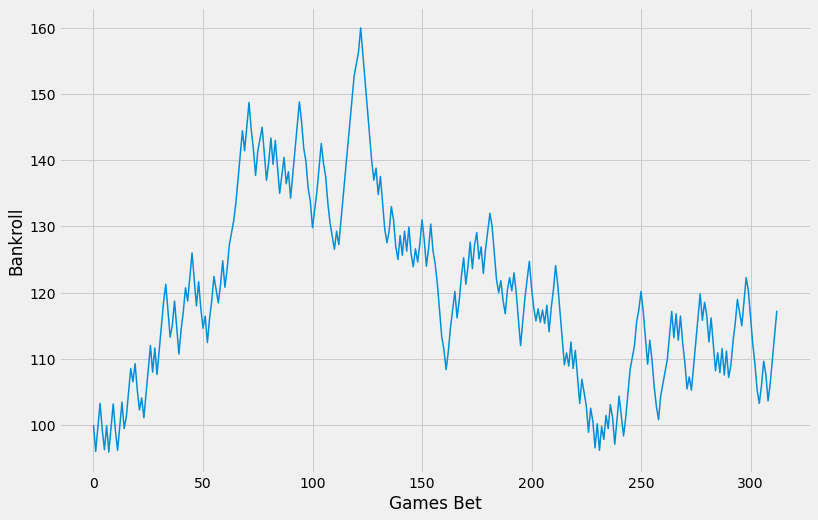

min balance: 95.90909090909092 
max balance: 159.9999999999998 
final balance: 113.27272727272724 
win percentage 52.080000000000005 
profit: 13.272727272727252 risk: 1052.0 
ROI: 1.26
7
test set 1: 2020-01-10 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 93 epochs took 2 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.3s finished


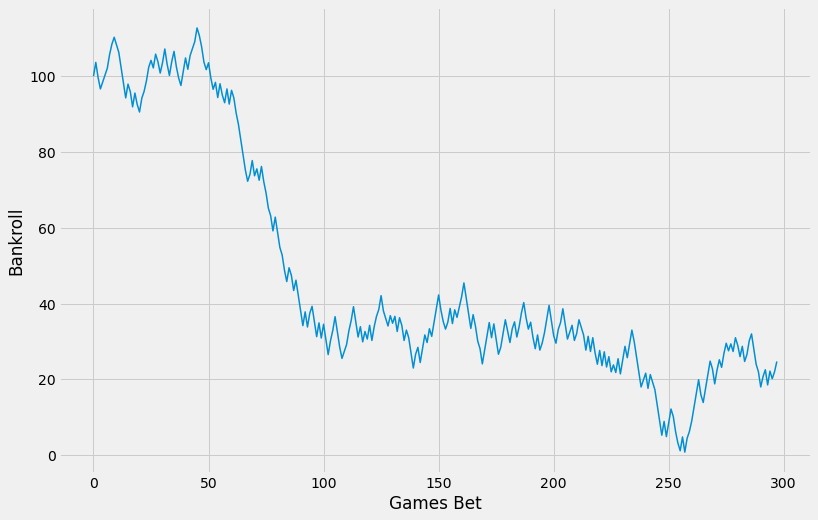

min balance: 0.8181818181817597 
max balance: 112.72727272727276 
final balance: 26.545454545454476 
win percentage 48.32 
profit: -73.4545454545455 risk: 986.0 
ROI: -7.449999999999999
8
test set 1: 2020-12-25 - 2021-03-16


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 102 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.7s finished


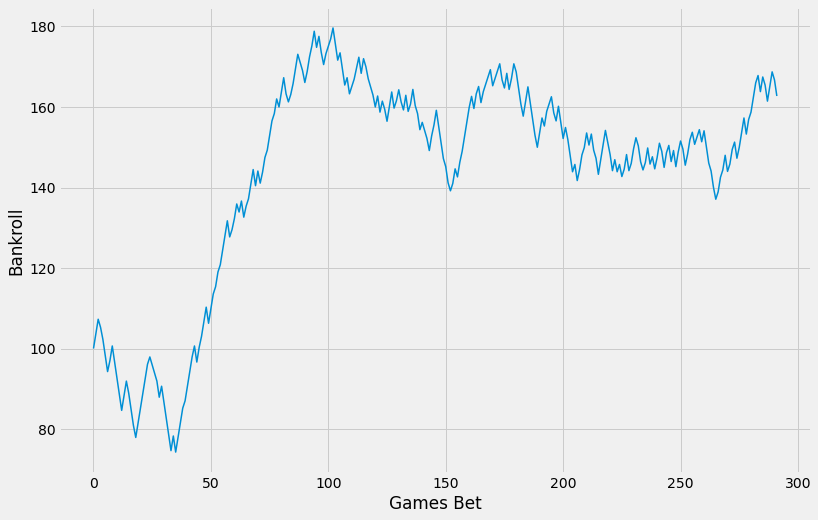

min balance: 74.27272727272732 
max balance: 179.63636363636346 
final balance: 158.72727272727175 
win percentage 56.16 
profit: 58.72727272727269 risk: 955.0 
ROI: 6.15
9
test set 1: 2021-03-16 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 108 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    2.8s finished


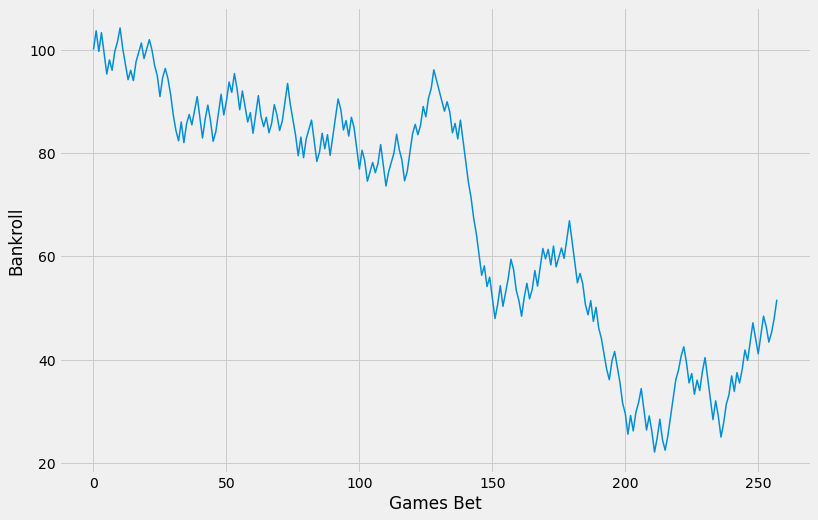

min balance: 22.18181818181821 
max balance: 104.1818181818182 
final balance: 54.36363636363635 
win percentage 49.61 
profit: -45.63636363636368 risk: 815.0 
ROI: -5.6000000000000005
10
test set 1: 2021-10-22 - 2021-10-27


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 124 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.3s finished


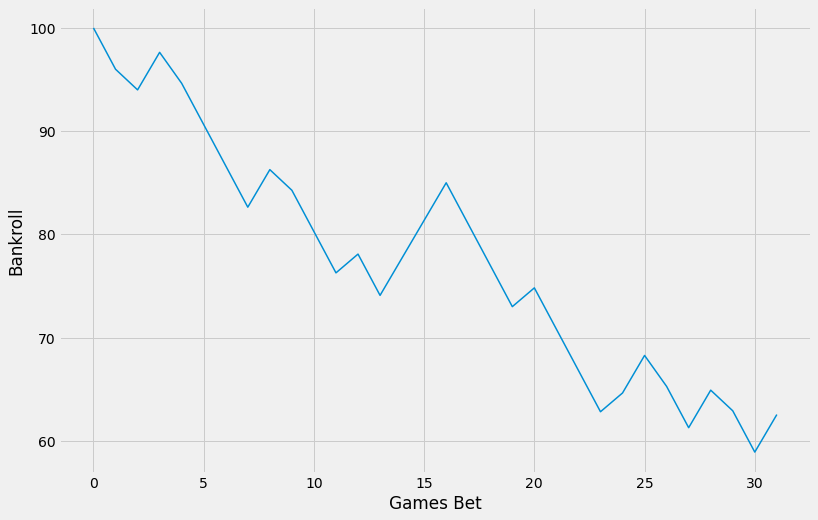

min balance: 58.90909090909092 
max balance: 97.63636363636364 
final balance: 66.18181818181819 
win percentage 37.5 
profit: -33.81818181818182 risk: 114.0 
ROI: -29.67
11
test set 1: 2021-10-27 - 2021-11-03


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 131 epochs took 3 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    3.4s finished


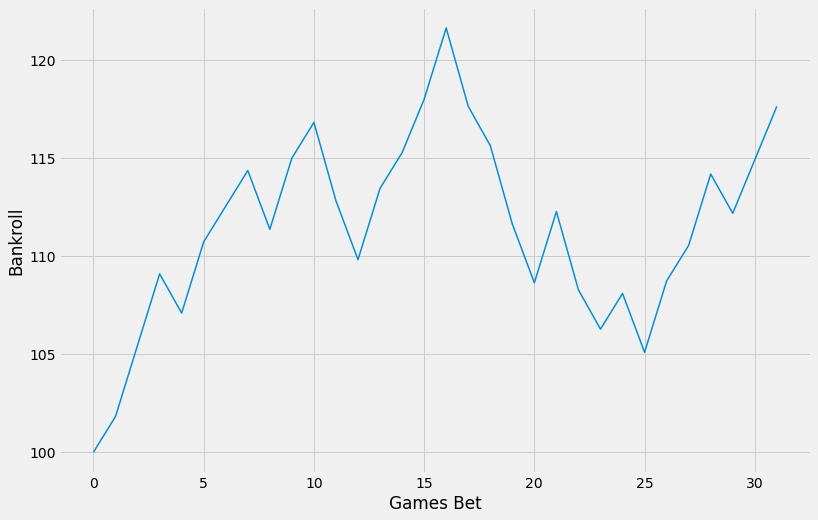

min balance: 101.81818181818181 
max balance: 121.63636363636364 
final balance: 113.63636363636365 
win percentage 59.38 
profit: 13.636363636363633 risk: 99.0 
ROI: 13.77

 Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  Index(['RECORD_team_diff', 'FG3M_team_diff', 'FG3A_team_diff',
       'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff', 'AST_team_diff',
       'STL_team_diff', 'PF_team_diff', 'AST_3PM_team_diff',
       'UAST_3PM_team_diff', 'ATS_DIFF_team_diff', 'RECORD_opp_diff',
       'FG3A_opp_diff', 'BLK_opp_di...
       'TS_PCT_team_diff', 'TS_PCT_opp_diff', 'EFG_PCT_team_diff',
       'EFG_PCT_opp_diff', 'AST_RATIO_team_diff', 'AST_RATIO_opp_diff',
       'TOV_PCT_opp_diff', 'team_elo_pred', 'team_rating_i', 'opp_rating_i',
       'elo_MOV_pred', 'SPREAD_team', 'ML_team'],
      dtype='object'))])),
                ('scaler', StandardScaler()),
                ('lo

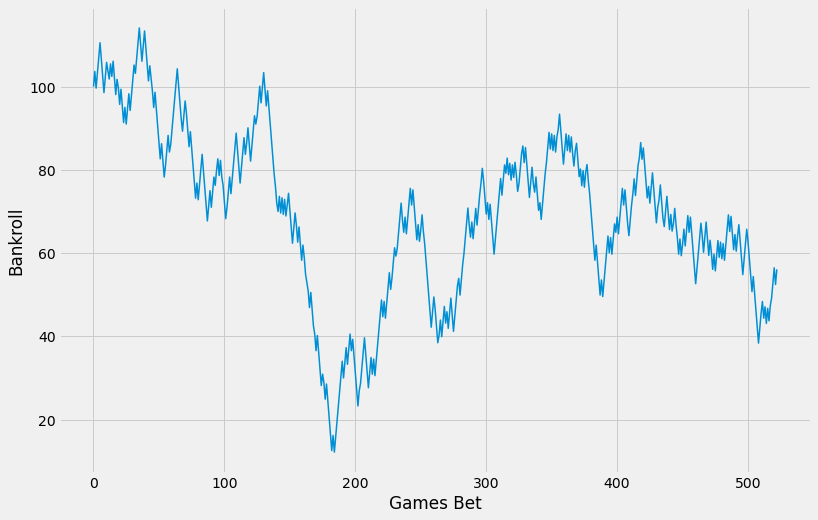

min balance: 12.181818181818464 
max balance: 114.09090909090916 
final balance: 59.72727272727309 
win percentage 51.239999999999995 
profit: -40.272727272727366 risk: 1978.0 
ROI: -2.04
1
test set 1: 2017-01-21 - 2017-06-12


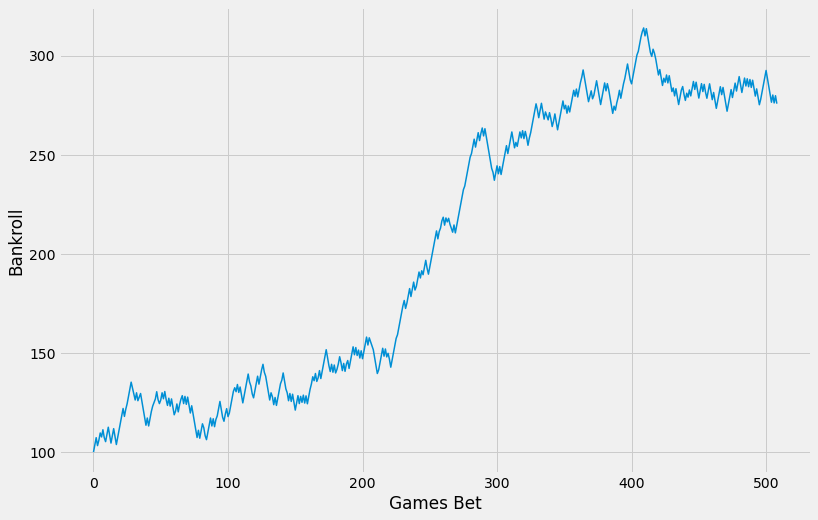

min balance: 103.27272727272728 
max balance: 313.90909090908957 
final balance: 277.5454545454528 
win percentage 56.779999999999994 
profit: 177.5454545454545 risk: 1869.0 
ROI: 9.5
2
test set 1: 2017-10-20 - 2018-01-17


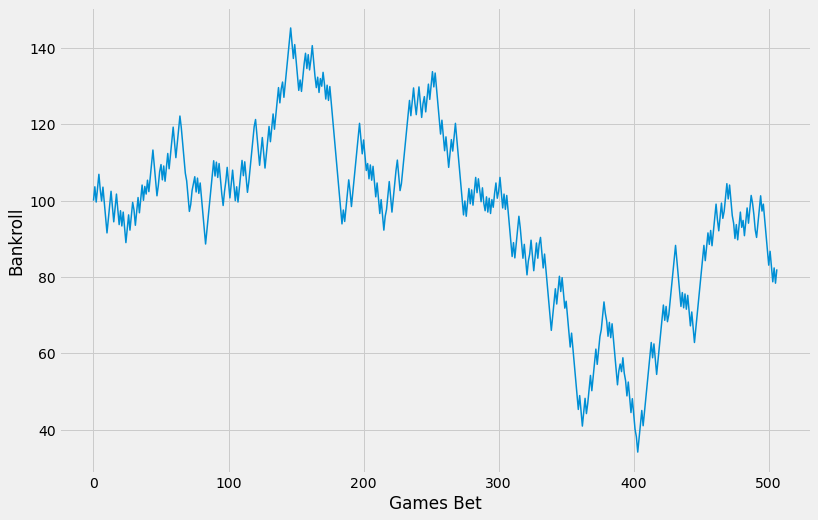

min balance: 34.09090909090933 
max balance: 145.27272727272745 
final balance: 85.63636363636398 
win percentage 52.07000000000001 
profit: -14.363636363636488 risk: 1933.0 
ROI: -0.74
3
test set 1: 2018-01-17 - 2018-06-08


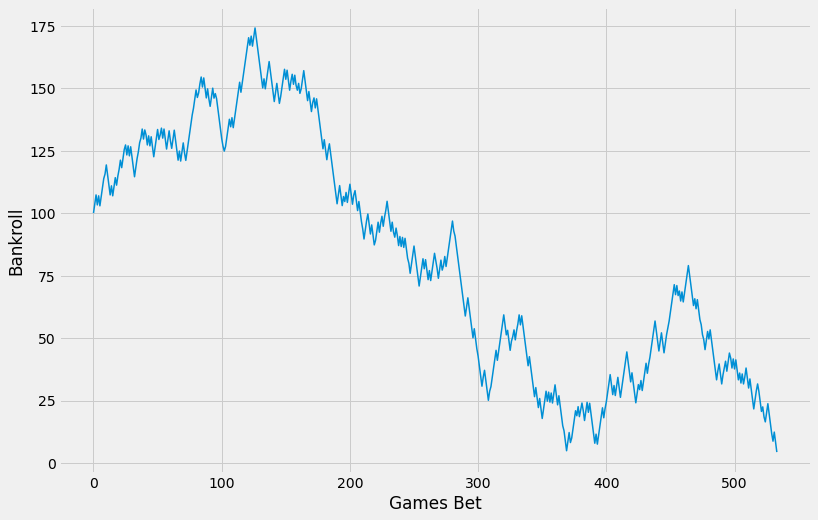

min balance: 0.36363636363581975 
max balance: 174.09090909090872 
final balance: 0.36363636363581975 
win percentage 50.19 
profit: -99.63636363636374 risk: 2024.0 
ROI: -4.92
4
test set 1: 2018-10-19 - 2019-01-15


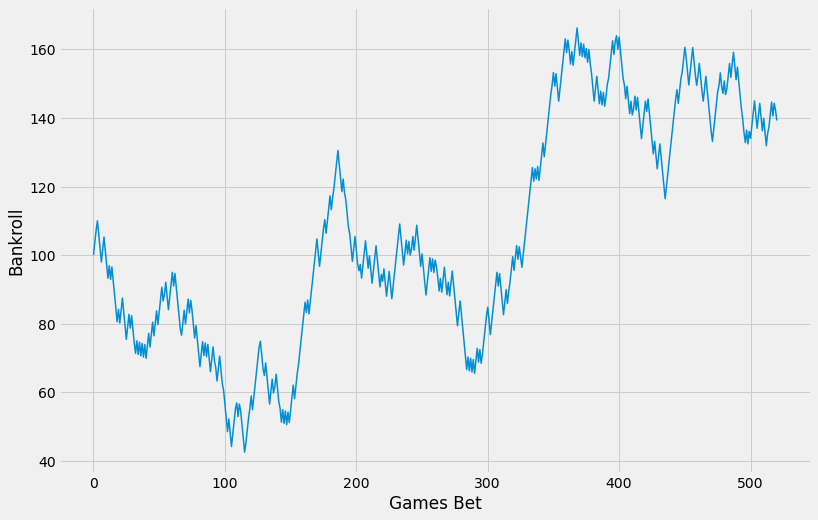

min balance: 42.5454545454547 
max balance: 166.2727272727276 
final balance: 136.2727272727269 
win percentage 52.980000000000004 
profit: 36.27272727272714 risk: 1995.0 
ROI: 1.82
5
test set 1: 2019-01-16 - 2019-06-13


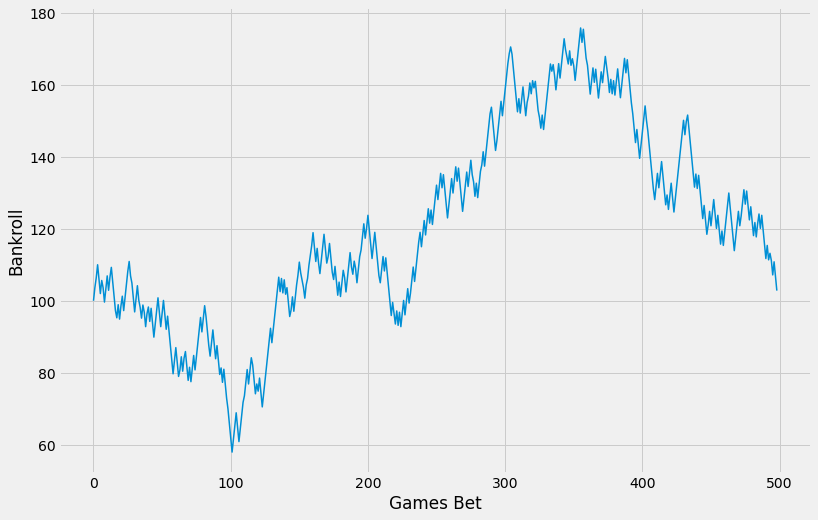

min balance: 58.000000000000156 
max balance: 175.7272727272726 
final balance: 98.81818181818137 
win percentage 51.9 
profit: -1.1818181818182438 risk: 1874.0 
ROI: -0.06
6
test set 1: 2019-10-25 - 2020-01-10


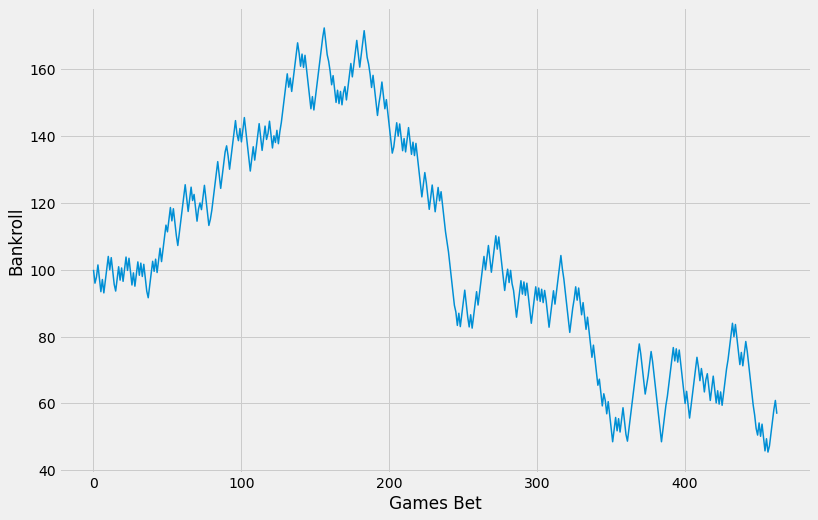

min balance: 45.45454545454512 
max balance: 172.36363636363606 
final balance: 60.5454545454542 
win percentage 50.970000000000006 
profit: -39.454545454545496 risk: 1771.0 
ROI: -2.23
7
test set 1: 2020-01-10 - 2020-10-11


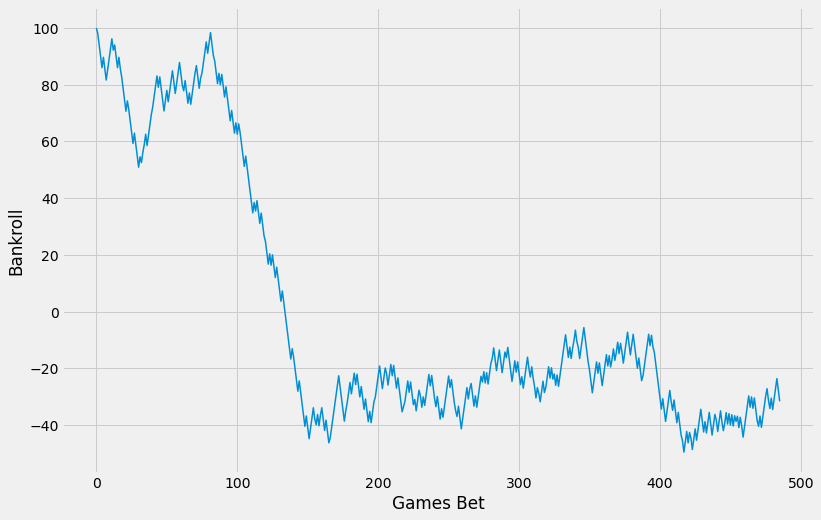

min balance: -49.545454545454454 
max balance: 98.36363636363647 
final balance: -27.99999999999997 
win percentage 48.35 
profit: -128.0000000000001 risk: 1850.0 
ROI: -6.92
8
test set 1: 2020-12-25 - 2021-03-16


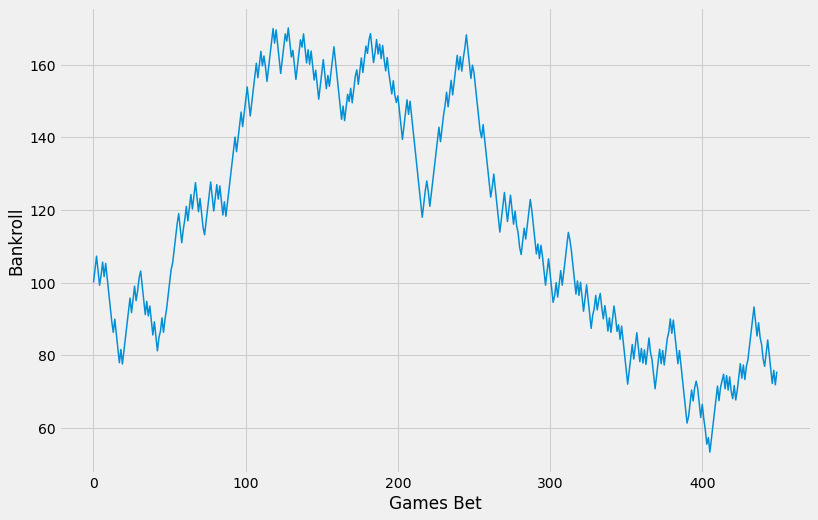

min balance: 53.27272727272683 
max balance: 170.1818181818181 
final balance: 71.45454545454507 
win percentage 51.559999999999995 
profit: -28.545454545454618 risk: 1699.0 
ROI: -1.68
9
test set 1: 2021-03-16 - 2021-07-20


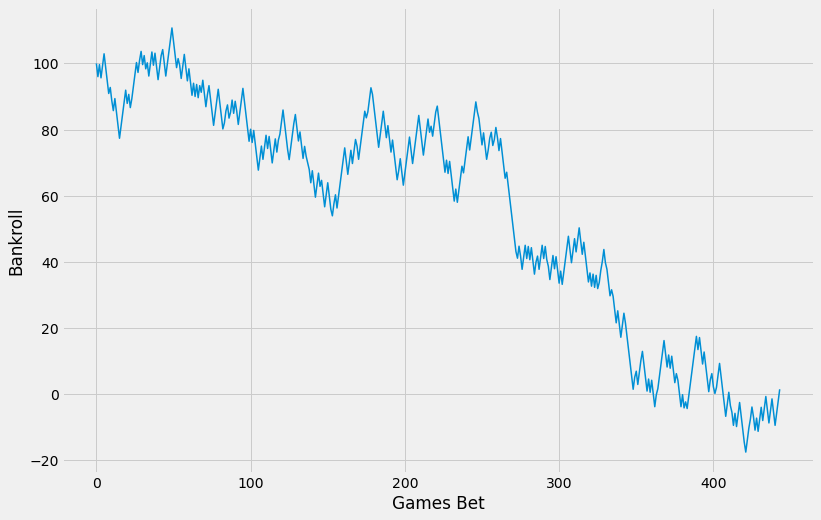

min balance: -17.545454545454266 
max balance: 110.72727272727282 
final balance: 5.090909090909372 
win percentage 49.769999999999996 
profit: -94.90909090909099 risk: 1668.0 
ROI: -5.6899999999999995
10
test set 1: 2021-10-22 - 2021-10-27


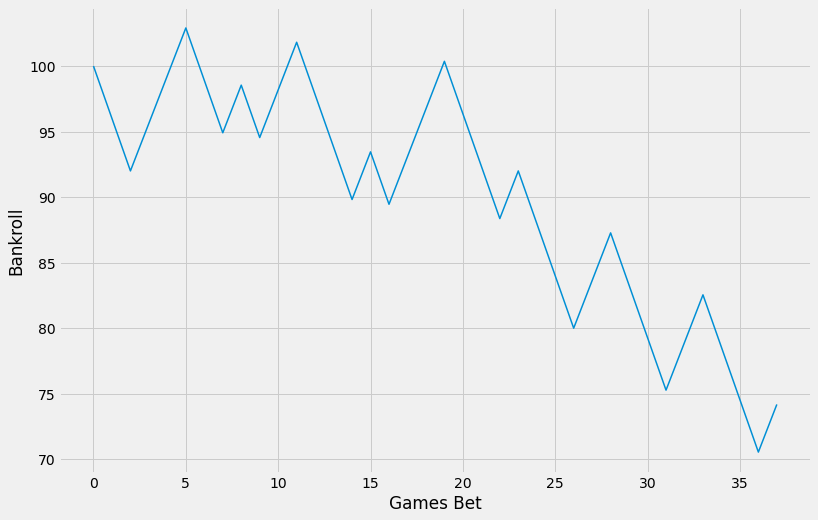

min balance: 70.5454545454546 
max balance: 102.90909090909092 
final balance: 77.81818181818188 
win percentage 44.74 
profit: -22.181818181818187 risk: 152.0 
ROI: -14.59
11
test set 1: 2021-10-27 - 2021-11-03


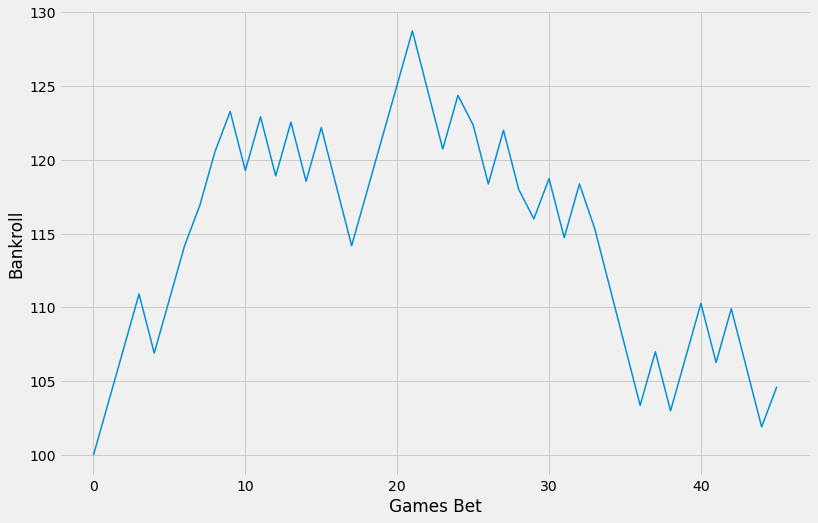

min balance: 100.63636363636373 
max balance: 128.72727272727278 
final balance: 100.63636363636373 
win percentage 52.17 
profit: 0.636363636363626 risk: 175.0 
ROI: 0.36

 Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff', 'OREB_team_diff',
       'REB_team_diff', 'AST_team_diff', 'STL_team_diff', 'PF_team_diff',
       'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff',
       'E_DEF_RATING_team_diff', 'E...
       'WL_PCT_diff', 'ATS_PCT_diff', 'AVG_ML_diff', 'AVG_ATS_DIFF_diff',
       'REST_diff', 'OREB_PCT_team_diff', 'TS_PCT_team_diff',
       'TS_PCT_opp_diff', 'EFG_PCT_team_diff', 'EFG_PCT_opp_diff',
       'AST_RATIO_team_diff', 'AST_RATIO_opp_diff', 'TOV_PCT_opp_diff',
       'team_elo_pred', 'SPREAD_team', 'ML_team'],
      dtype='object'))])),
       

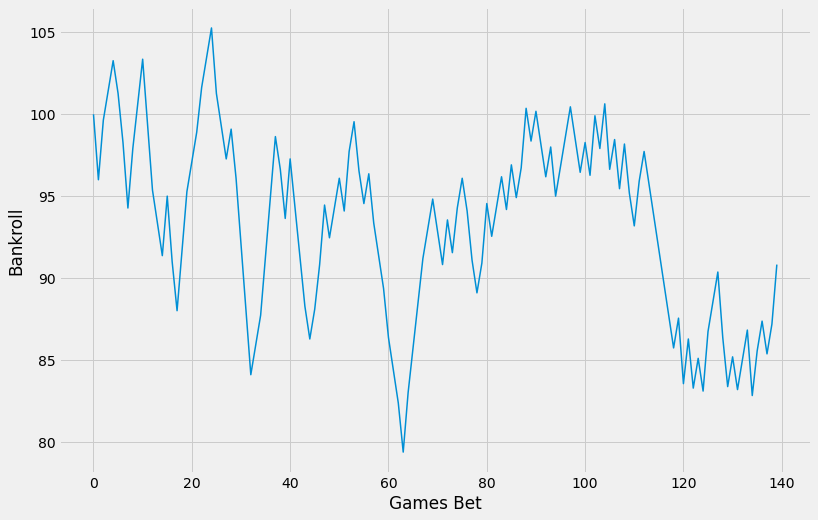

min balance: 79.36363636363636 
max balance: 105.27272727272728 
final balance: 94.45454545454542 
win percentage 50.71 
profit: -5.545454545454561 risk: 374.0 
ROI: -1.48
1
test set 1: 2017-01-21 - 2017-06-12


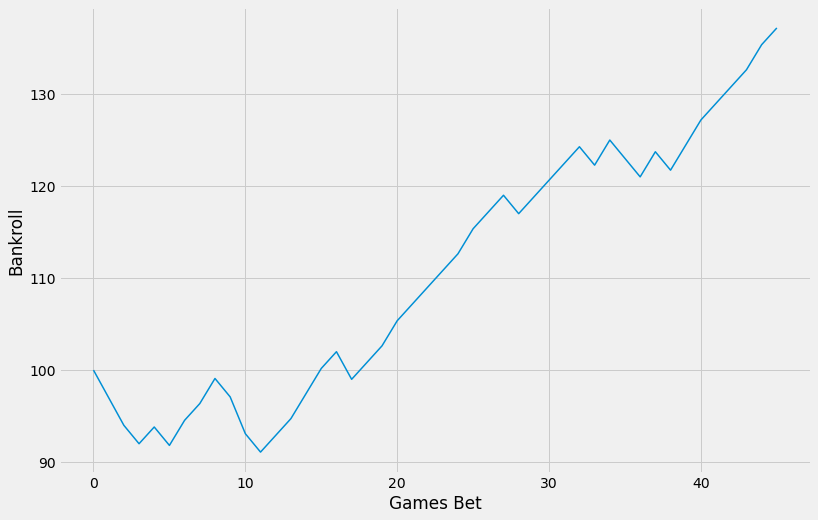

min balance: 91.0909090909091 
max balance: 138.99999999999994 
final balance: 138.99999999999994 
win percentage 71.74000000000001 
profit: 39.0 risk: 108.0 
ROI: 36.11
2
test set 1: 2017-10-20 - 2018-01-17


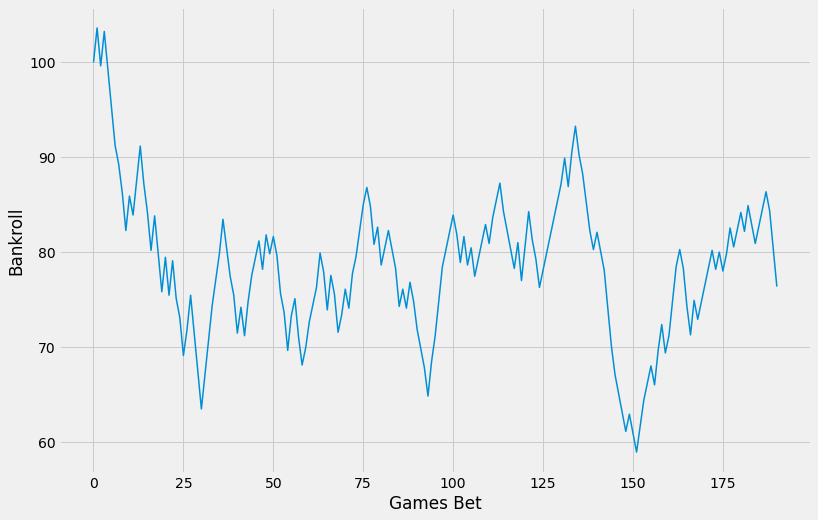

min balance: 58.909090909090956 
max balance: 103.63636363636364 
final balance: 79.09090909090911 
win percentage 50.79 
profit: -20.909090909090935 risk: 544.0 
ROI: -3.84
3
test set 1: 2018-01-17 - 2018-06-08


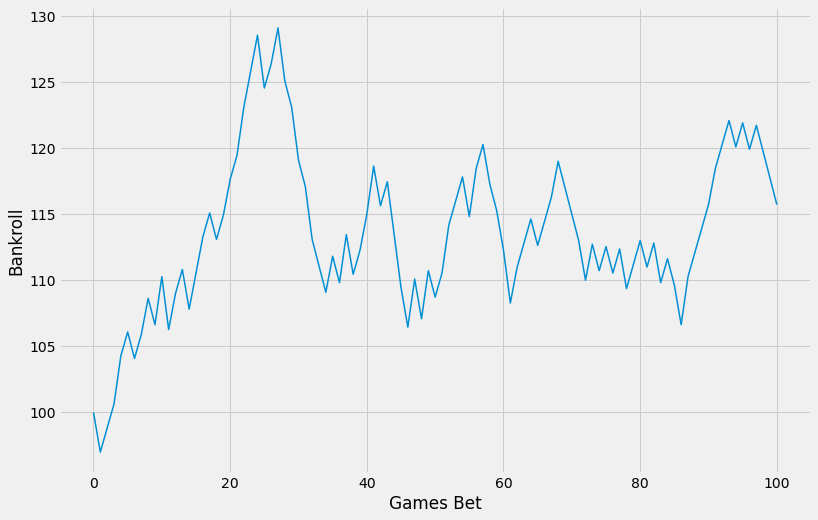

min balance: 97.0 
max balance: 129.0909090909091 
final balance: 117.54545454545449 
win percentage 56.44 
profit: 17.545454545454533 risk: 265.0 
ROI: 6.619999999999999
4
test set 1: 2018-10-19 - 2019-01-15


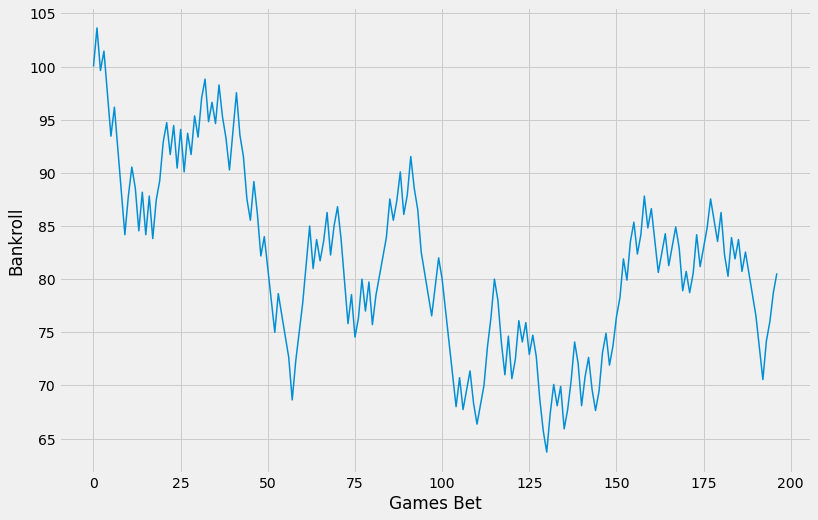

min balance: 63.72727272727282 
max balance: 103.63636363636364 
final balance: 78.5454545454546 
win percentage 50.760000000000005 
profit: -21.454545454545496 risk: 577.0 
ROI: -3.7199999999999998
5
test set 1: 2019-01-16 - 2019-06-13


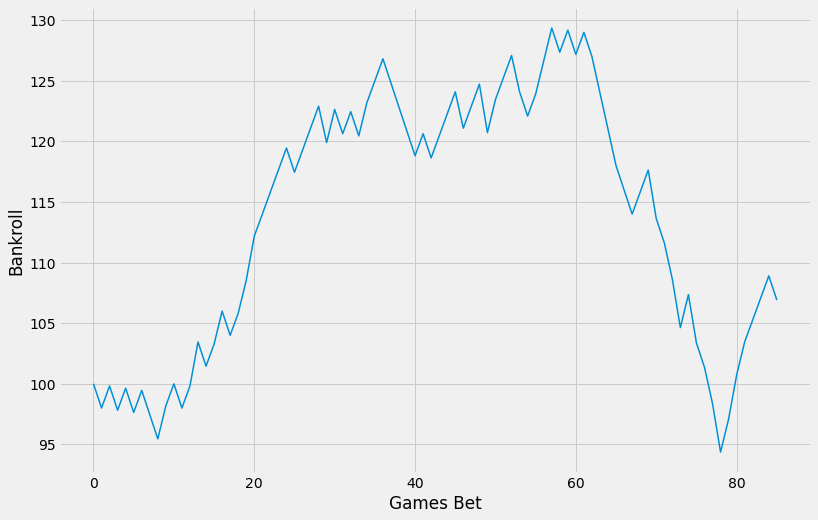

min balance: 94.36363636363627 
max balance: 129.3636363636363 
final balance: 108.72727272727263 
win percentage 55.81 
profit: 8.72727272727272 risk: 207.0 
ROI: 4.22
6
test set 1: 2019-10-25 - 2020-01-10


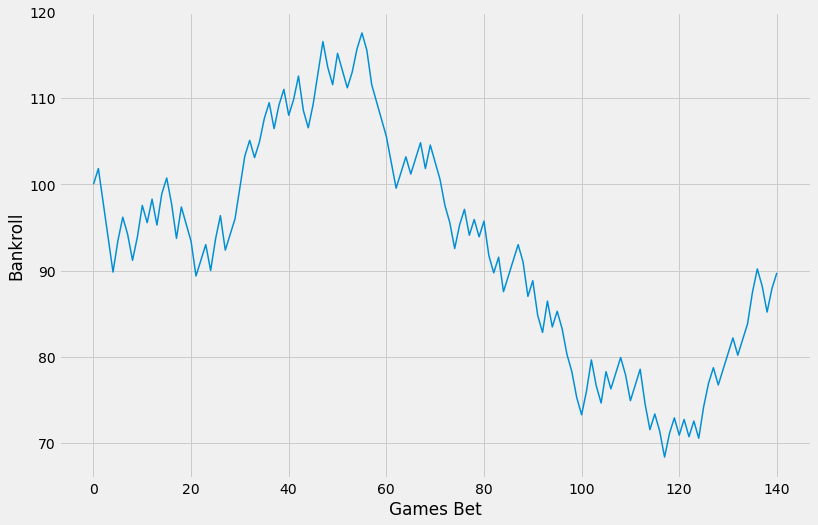

min balance: 68.36363636363633 
max balance: 117.54545454545458 
final balance: 91.54545454545449 
win percentage 51.77 
profit: -8.454545454545467 risk: 375.0 
ROI: -2.25
7
test set 1: 2020-01-10 - 2020-10-11


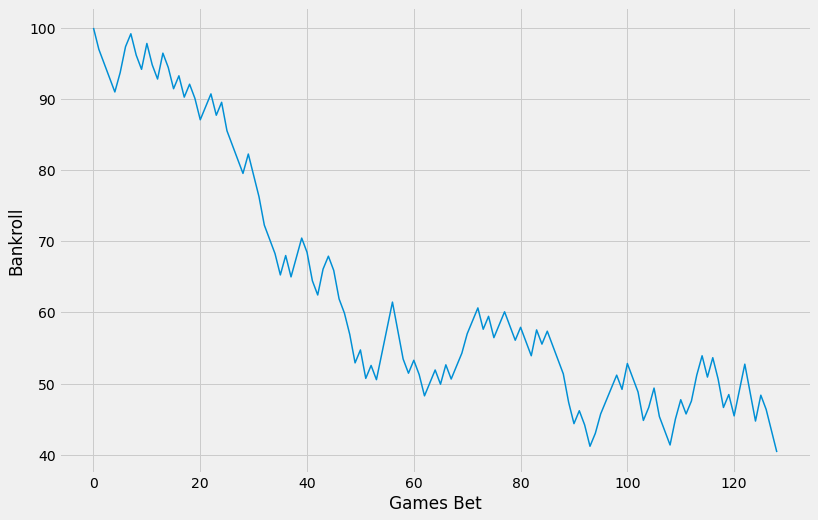

min balance: 37.36363636363638 
max balance: 99.18181818181819 
final balance: 37.36363636363638 
win percentage 42.64 
profit: -62.636363636363654 risk: 349.0 
ROI: -17.95
8
test set 1: 2020-12-25 - 2021-03-16


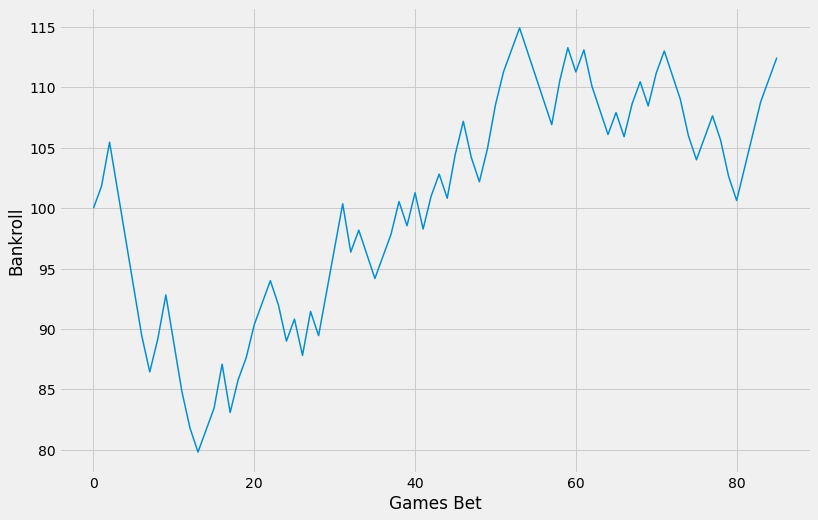

min balance: 79.81818181818183 
max balance: 114.90909090909093 
final balance: 110.45454545454548 
win percentage 53.49 
profit: 10.454545454545439 risk: 232.0 
ROI: 4.51
9
test set 1: 2021-03-16 - 2021-07-20


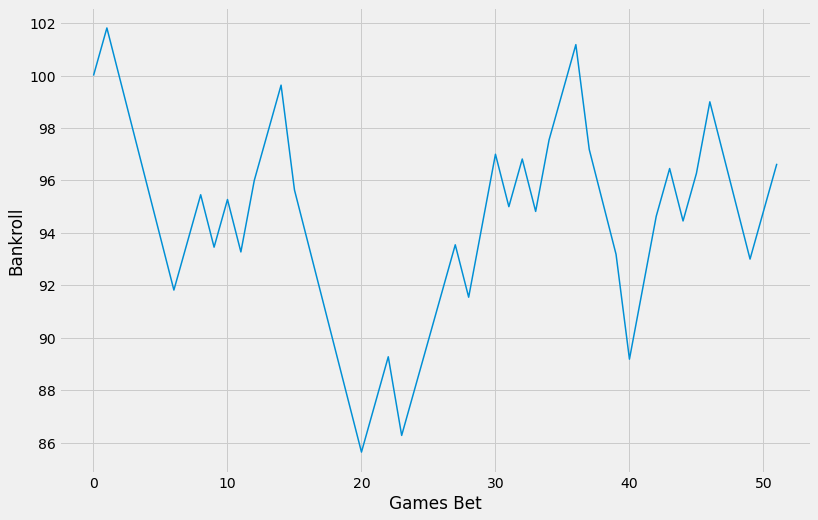

min balance: 85.63636363636361 
max balance: 101.81818181818181 
final balance: 98.4545454545454 
win percentage 51.92 
profit: -1.5454545454545467 risk: 118.0 
ROI: -1.31
10
test set 1: 2021-10-22 - 2021-10-27


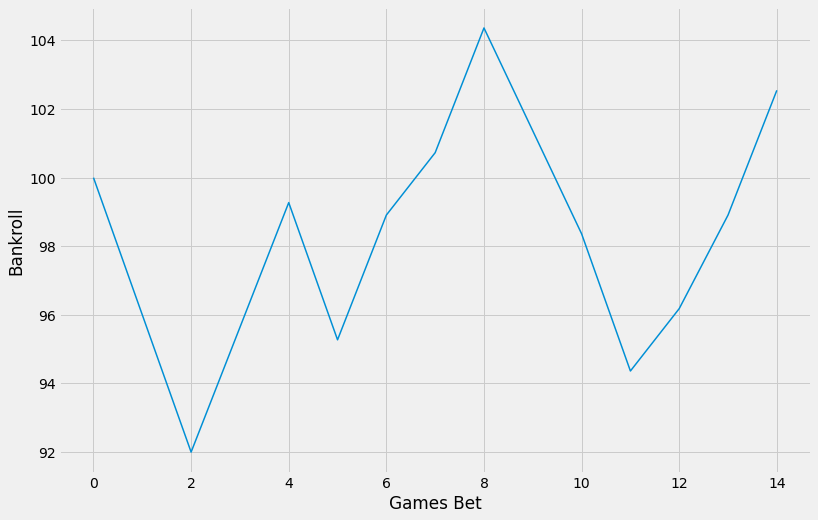

min balance: 92.0 
max balance: 104.36363636363637 
final balance: 98.54545454545456 
win percentage 53.33 
profit: -1.4545454545454568 risk: 53.0 
ROI: -2.74
11
test set 1: 2021-10-27 - 2021-11-03


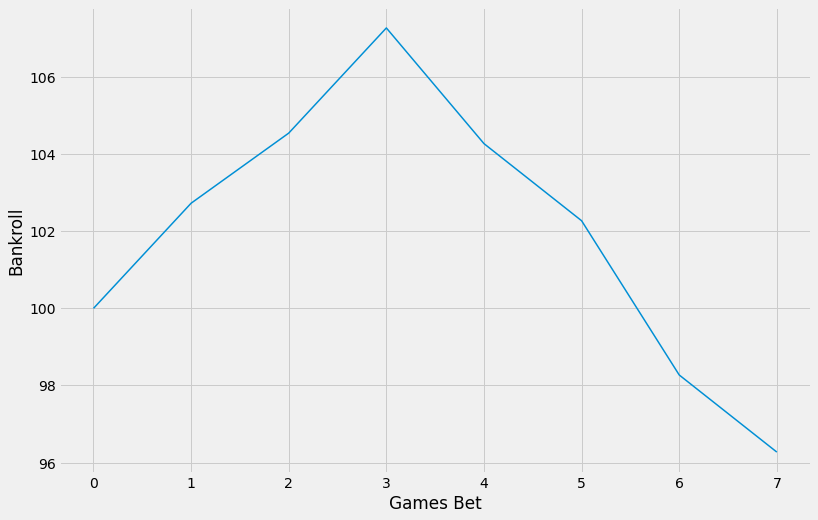

min balance: 96.27272727272728 
max balance: 107.27272727272728 
final balance: 98.0909090909091 
win percentage 50.0 
profit: -1.90909090909091 risk: 21.0 
ROI: -9.09

 Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3M_team_diff', 'FG3A_team_diff', 'OREB_team_diff', 'DREB_team_diff',
       'REB_team_diff', 'E_DEF_RATING_team_diff', 'PIE_team_diff',
       'AST_2PM_team_diff', 'AST_3PM_team_diff', 'UAST_2PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG3A_opp_diff',
       'PTS_2PT_MR_opp_diff', 'PTS_FB_opp_diff', 'UAST_3PM_opp_diff',
       'ATS_DIFF_opp_diff', 'TEAM_COVERED_opp_diff', 'WL_PCT_diff',
       'REST_diff', 'AST_RATIO_team_diff', 'ML_team'],
      dtype='object'))])),
                ('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.

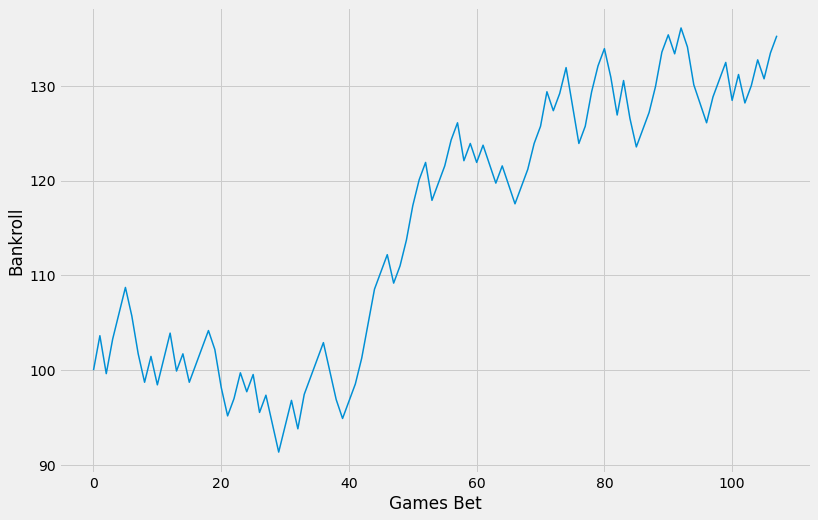

min balance: 91.36363636363637 
max balance: 137.09090909090892 
final balance: 137.09090909090892 
win percentage 62.03999999999999 
profit: 37.090909090909065 risk: 297.0 
ROI: 12.49
1
test set 1: 2017-01-21 - 2017-06-12


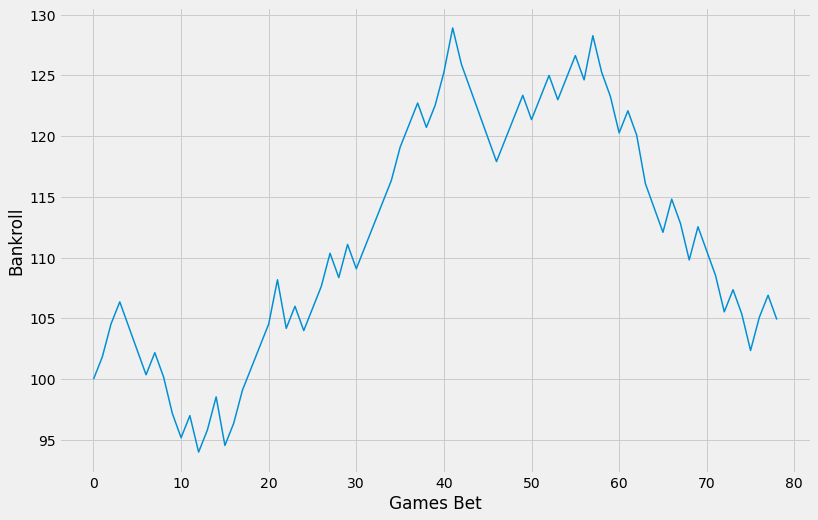

min balance: 93.99999999999999 
max balance: 128.90909090909085 
final balance: 102.9090909090908 
win percentage 53.16 
profit: 2.9090909090909065 risk: 188.0 
ROI: 1.55
2
test set 1: 2017-10-20 - 2018-01-17


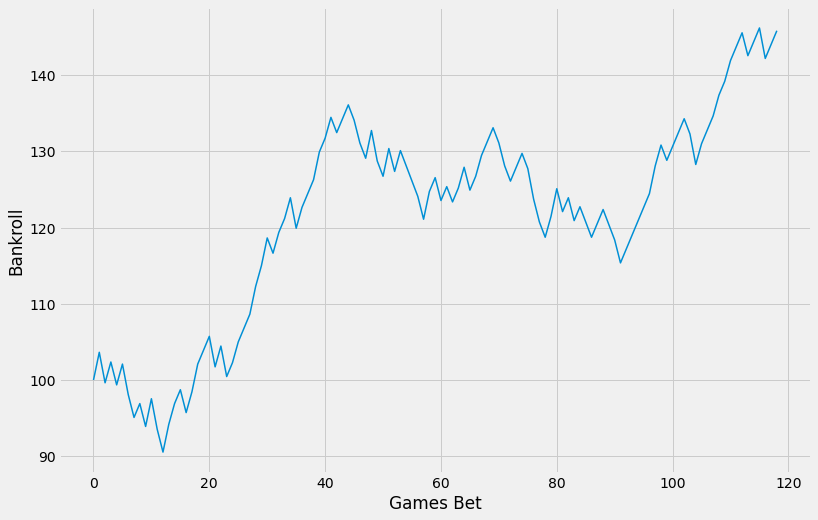

min balance: 90.54545454545456 
max balance: 146.181818181818 
final balance: 141.8181818181816 
win percentage 61.339999999999996 
profit: 41.81818181818181 risk: 319.0 
ROI: 13.11
3
test set 1: 2018-01-17 - 2018-06-08


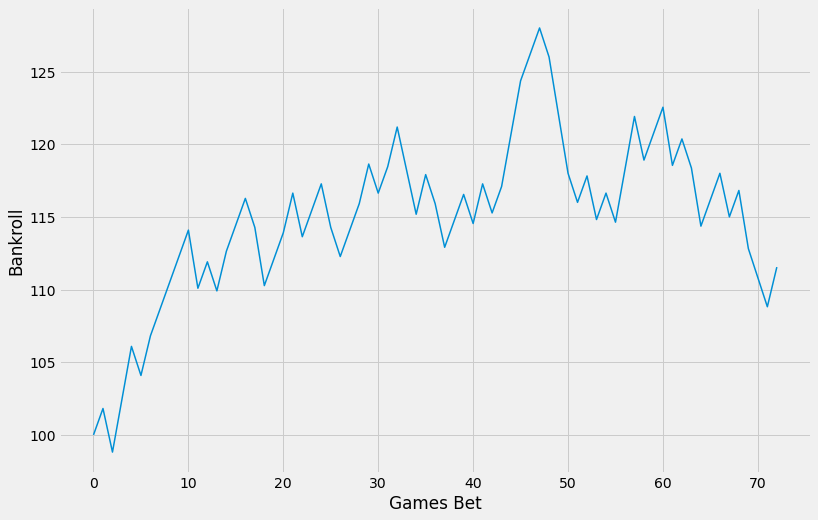

min balance: 98.81818181818181 
max balance: 127.99999999999996 
final balance: 108.54545454545448 
win percentage 57.53 
profit: 8.545454545454533 risk: 190.0 
ROI: 4.5
4
test set 1: 2018-10-19 - 2019-01-15


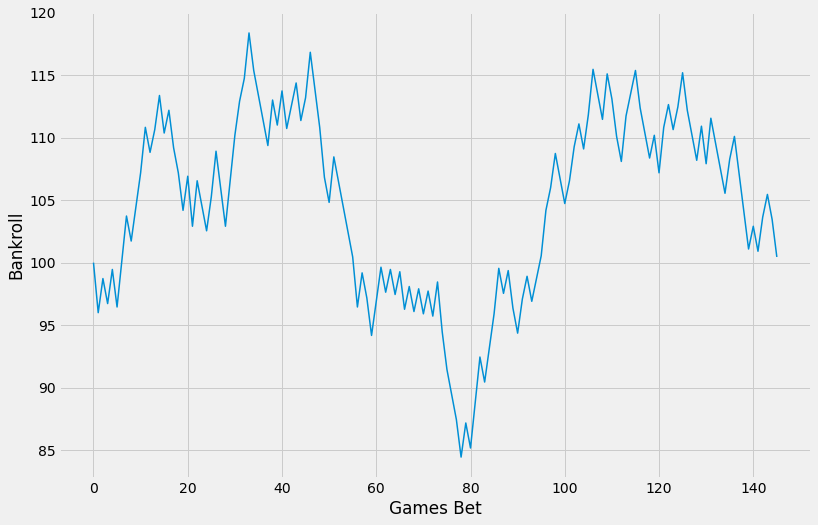

min balance: 84.45454545454552 
max balance: 118.36363636363643 
final balance: 102.27272727272737 
win percentage 48.63 
profit: 2.272727272727252 risk: 391.0 
ROI: 0.58
5
test set 1: 2019-01-16 - 2019-06-13


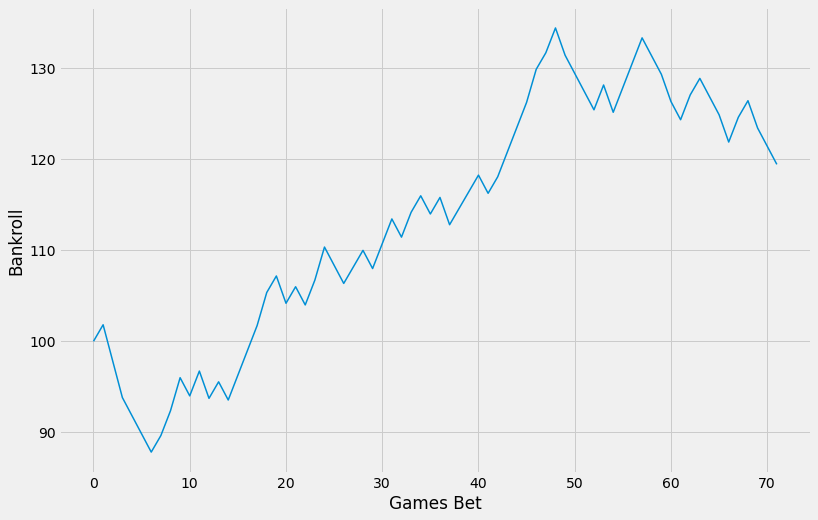

min balance: 87.81818181818181 
max balance: 134.45454545454547 
final balance: 117.45454545454548 
win percentage 54.169999999999995 
profit: 17.454545454545453 risk: 183.0 
ROI: 9.54
6
test set 1: 2019-10-25 - 2020-01-10


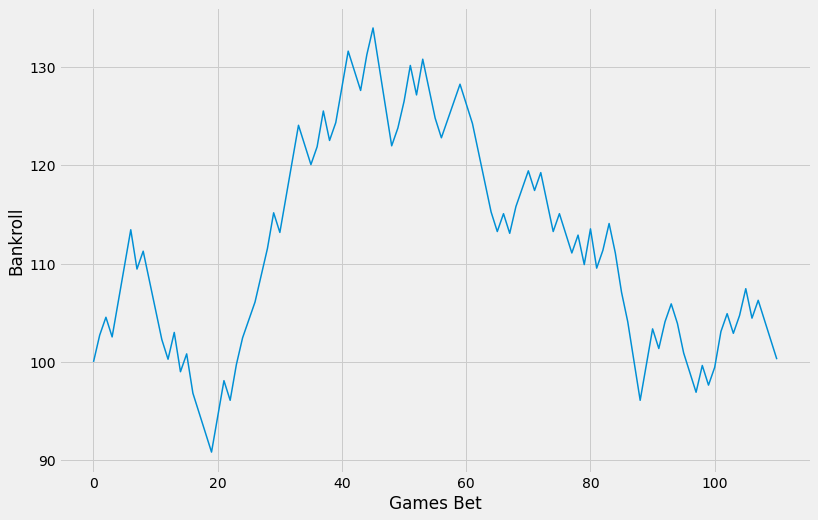

min balance: 90.81818181818183 
max balance: 134.0 
final balance: 102.99999999999997 
win percentage 50.449999999999996 
profit: 3.0 risk: 312.0 
ROI: 0.96
7
test set 1: 2020-01-10 - 2020-10-11


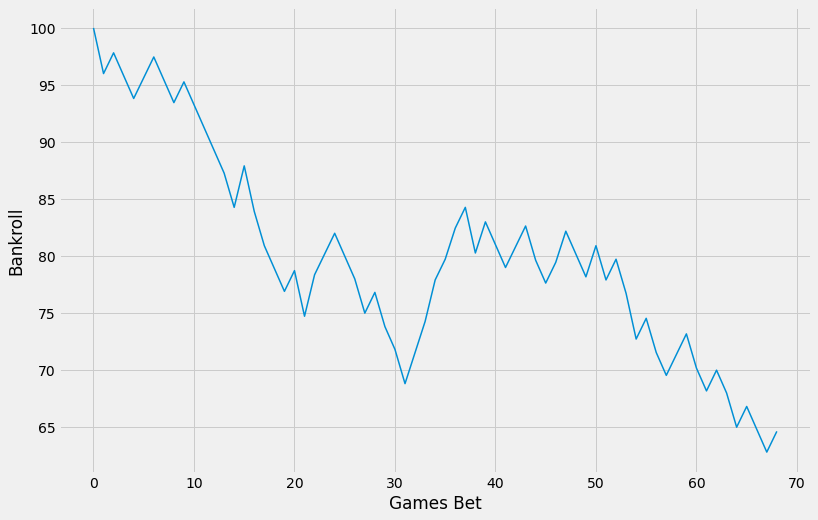

min balance: 62.81818181818177 
max balance: 97.81818181818181 
final balance: 66.4545454545454 
win percentage 43.480000000000004 
profit: -33.54545454545455 risk: 171.0 
ROI: -19.62
8
test set 1: 2020-12-25 - 2021-03-16


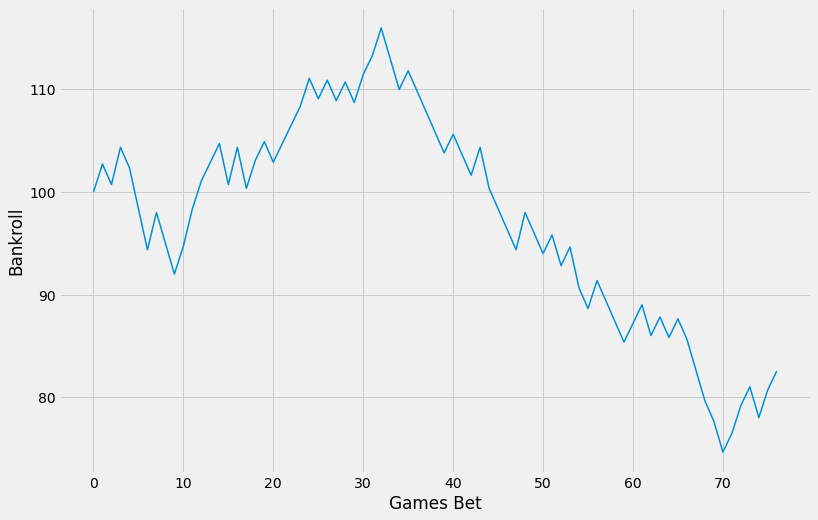

min balance: 74.63636363636363 
max balance: 116.00000000000001 
final balance: 80.54545454545453 
win percentage 46.75 
profit: -19.454545454545467 risk: 197.0 
ROI: -9.879999999999999
9
test set 1: 2021-03-16 - 2021-07-20


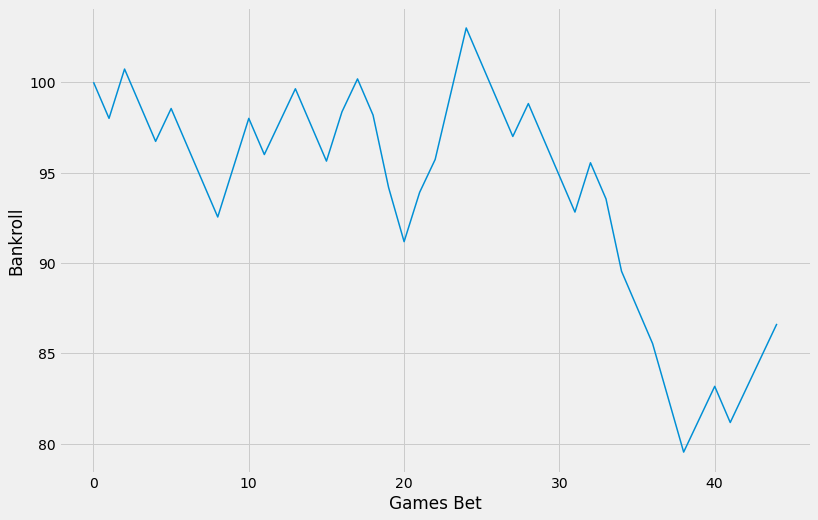

min balance: 79.54545454545456 
max balance: 103.00000000000001 
final balance: 88.45454545454544 
win percentage 44.440000000000005 
profit: -11.545454545454547 risk: 107.0 
ROI: -10.79
10
test set 1: 2021-10-22 - 2021-10-27


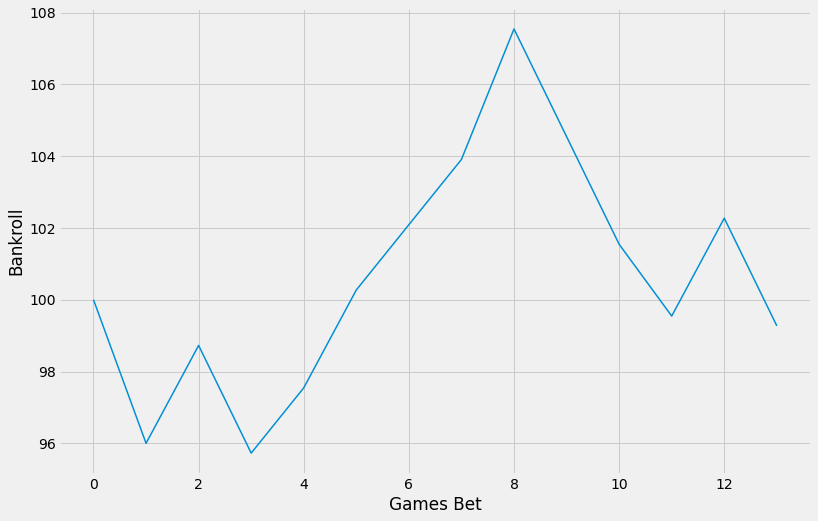

min balance: 95.72727272727273 
max balance: 107.54545454545455 
final balance: 97.27272727272728 
win percentage 50.0 
profit: -2.72727272727273 risk: 39.0 
ROI: -6.99
11
test set 1: 2021-10-27 - 2021-11-03


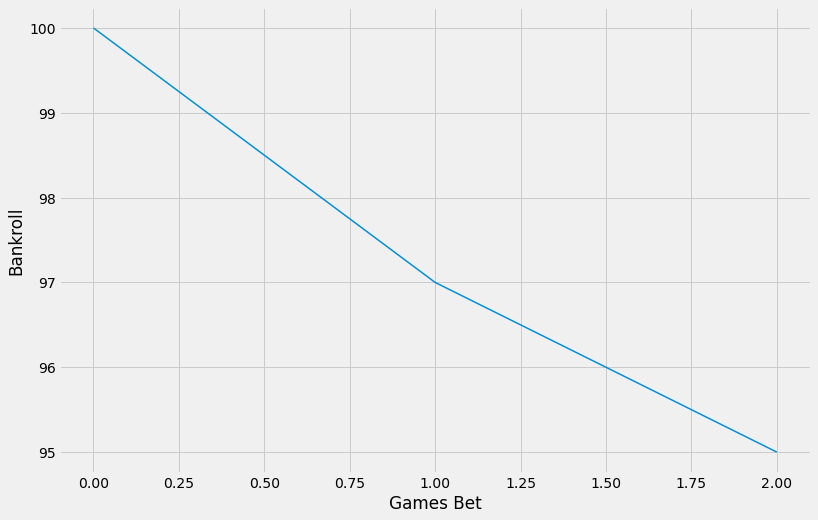

min balance: 92.0 
max balance: 97.0 
final balance: 92.0 
win percentage 0.0 
profit: -8.0 risk: 8.0 
ROI: -100.0

 LGBMClassifier(colsample_bytree=0.3448418231087905,
               learning_rate=0.018026127695645325, max_depth=4,
               min_child_weight=0.15960057999681657, num_leaves=294,
               random_state=23, reg_alpha=1.22743843598509,
               reg_lambda=1.6786816776160904, subsample=0.845965636042065)
   season  best_threshold  win_pcts  num_games_bet      rois    profits
0    2017            0.53  0.620370            108  0.124885  37.090909
1    2017            0.53  0.531646             79  0.015474   2.909091
2    2018            0.53  0.613445            119  0.131091  41.818182
3    2018            0.53  0.575342             73  0.044976   8.545455
4    2019            0.53  0.486301            146  0.005813   2.272727
5    2019            0.53  0.541667             72  0.095380  17.454545
6    2020            0.53  0.504505            111  0.00961

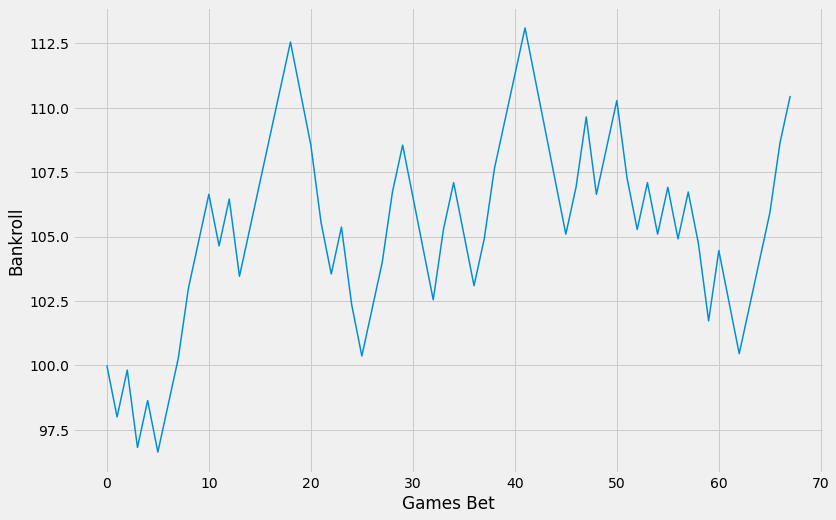

min balance: 96.63636363636363 
max balance: 113.09090909090901 
final balance: 112.27272727272715 
win percentage 57.35 
profit: 12.272727272727266 risk: 150.0 
ROI: 8.18
1
test set 1: 2017-01-21 - 2017-06-12


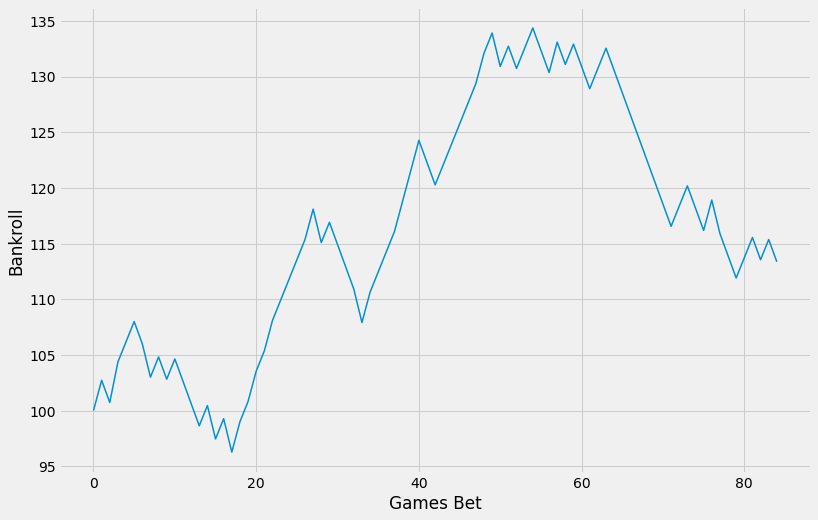

min balance: 96.27272727272725 
max balance: 134.3636363636363 
final balance: 116.09090909090898 
win percentage 55.28999999999999 
profit: 16.09090909090908 risk: 192.0 
ROI: 8.38
2
test set 1: 2017-10-20 - 2018-01-17


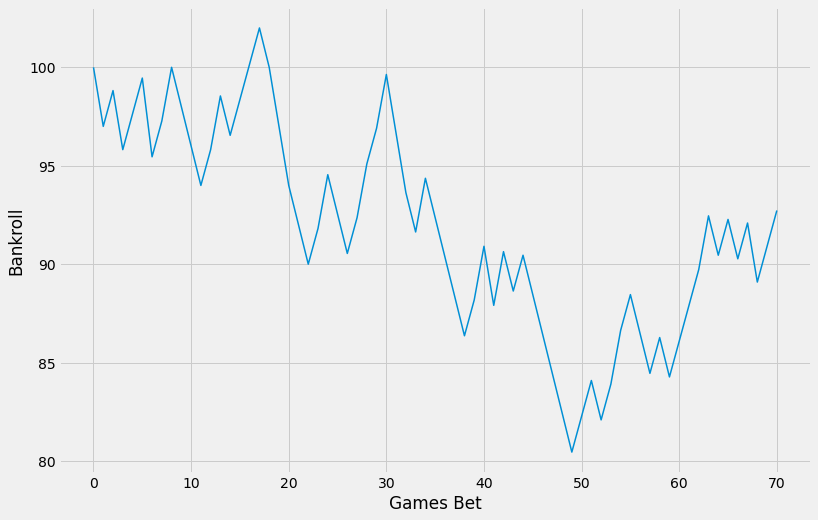

min balance: 80.45454545454544 
max balance: 101.99999999999997 
final balance: 89.72727272727266 
win percentage 49.3 
profit: -10.27272727272728 risk: 163.0 
ROI: -6.3
3
test set 1: 2018-01-17 - 2018-06-08


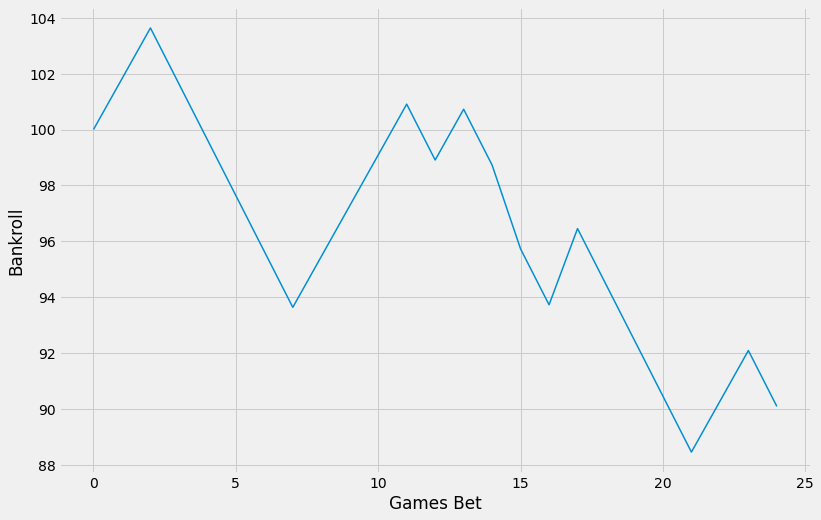

min balance: 88.09090909090905 
max balance: 103.63636363636363 
final balance: 88.09090909090905 
win percentage 40.0 
profit: -11.90909090909091 risk: 52.0 
ROI: -22.900000000000002
4
test set 1: 2018-10-19 - 2019-01-15


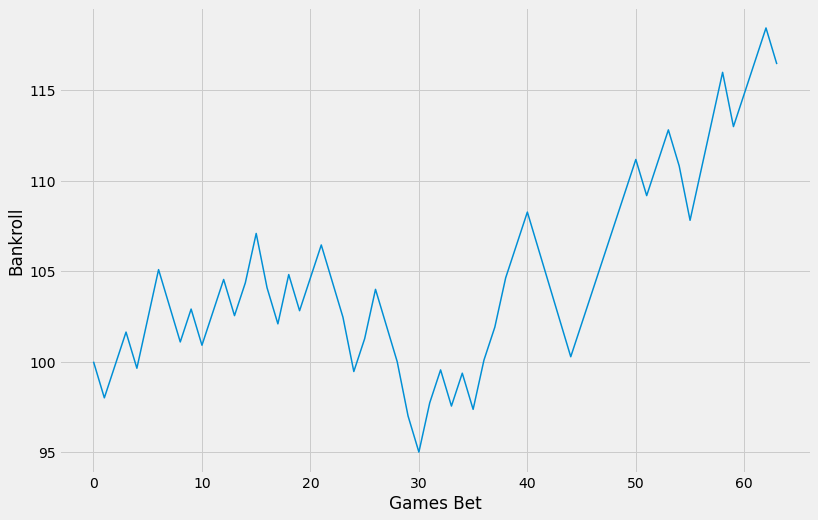

min balance: 94.99999999999999 
max balance: 118.4545454545454 
final balance: 114.4545454545454 
win percentage 56.25 
profit: 14.454545454545453 risk: 144.0 
ROI: 10.040000000000001
5
test set 1: 2019-01-16 - 2019-06-13


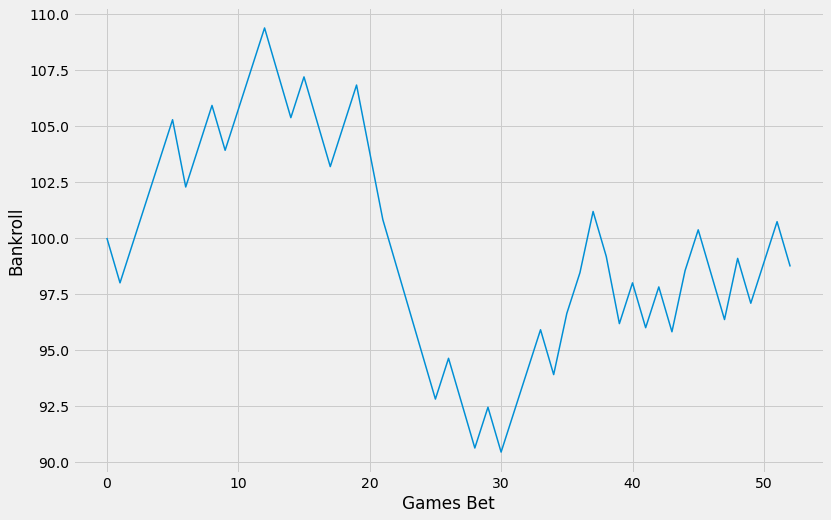

min balance: 90.45454545454538 
max balance: 109.36363636363632 
final balance: 96.72727272727263 
win percentage 50.94 
profit: -3.2727272727272805 risk: 114.0 
ROI: -2.87
6
test set 1: 2019-10-25 - 2020-01-10


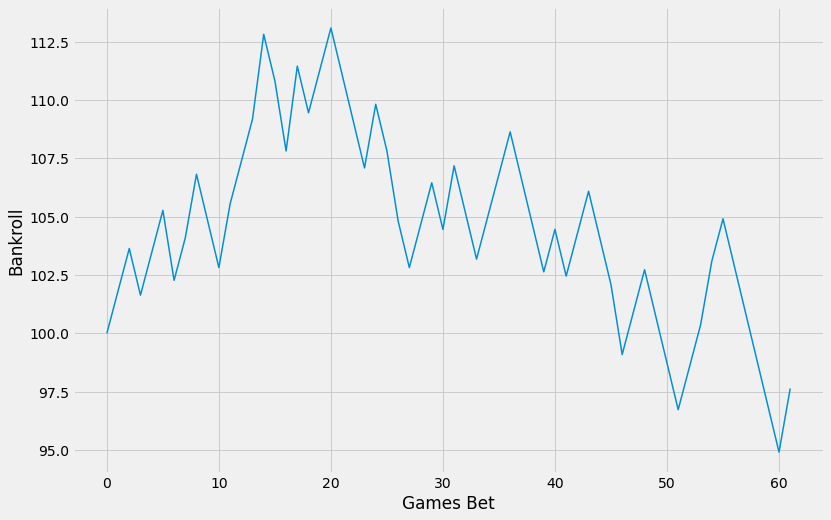

min balance: 94.90909090909084 
max balance: 113.09090909090907 
final balance: 95.63636363636357 
win percentage 48.39 
profit: -4.363636363636367 risk: 138.0 
ROI: -3.16
7
test set 1: 2020-01-10 - 2020-10-11


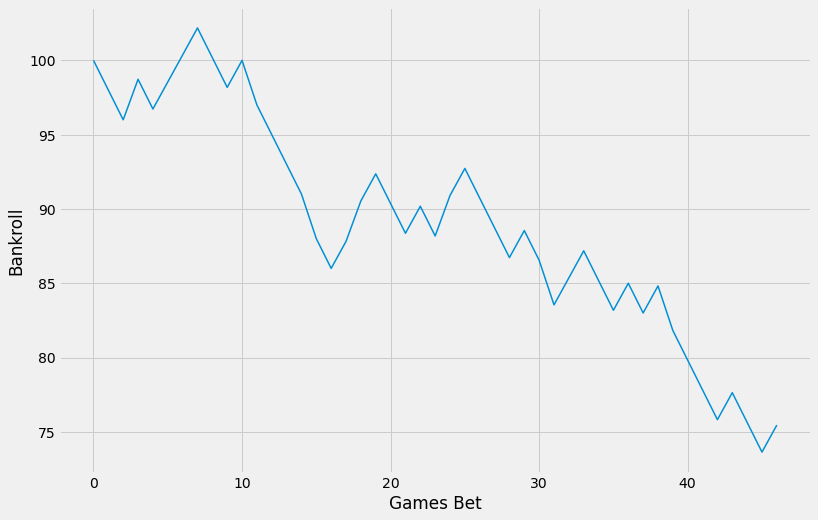

min balance: 73.4545454545454 
max balance: 102.18181818181817 
final balance: 73.4545454545454 
win percentage 38.3 
profit: -26.545454545454547 risk: 101.0 
ROI: -26.279999999999998
8
test set 1: 2020-12-25 - 2021-03-16


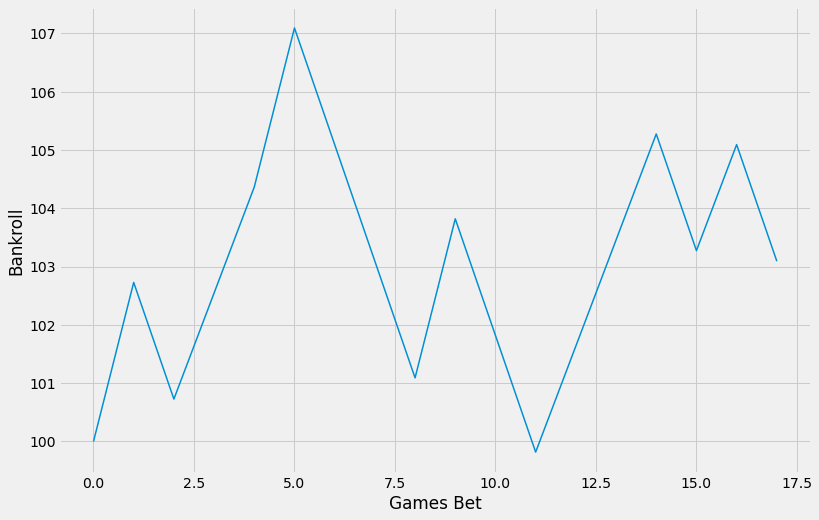

min balance: 99.81818181818183 
max balance: 107.0909090909091 
final balance: 101.09090909090908 
win percentage 50.0 
profit: 1.09090909090909 risk: 39.0 
ROI: 2.8000000000000003
9
test set 1: 2021-03-16 - 2021-07-20


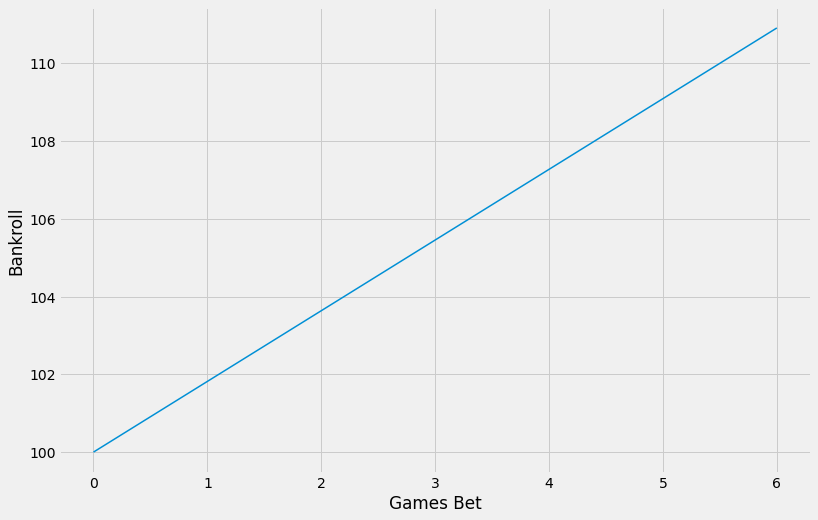

min balance: 101.81818181818181 
max balance: 110.90909090909088 
final balance: 108.90909090909088 
win percentage 85.71 
profit: 8.909090909090908 risk: 14.0 
ROI: 63.63999999999999
10
test set 1: 2021-10-22 - 2021-10-27


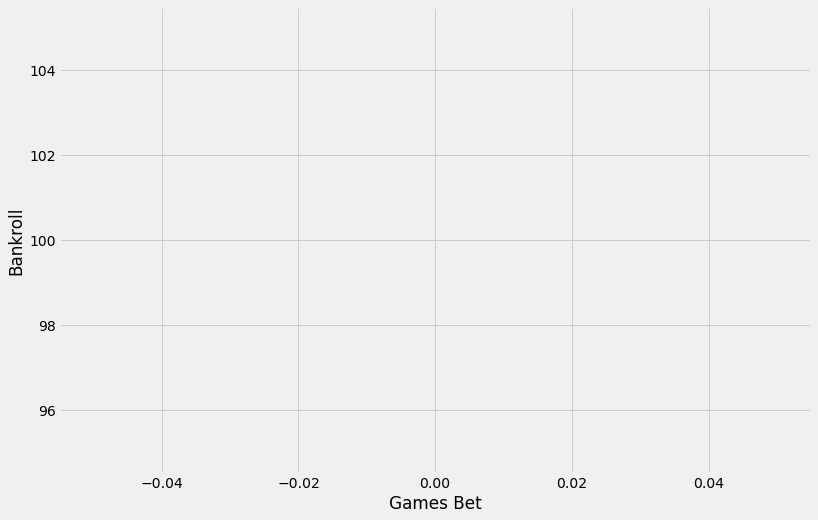

min balance: 101.81818181818181 
max balance: 101.81818181818181 
final balance: 101.81818181818181 
win percentage 100.0 
profit: 1.8181818181818181 risk: 2.0 
ROI: 90.91
11
test set 1: 2021-10-27 - 2021-11-03


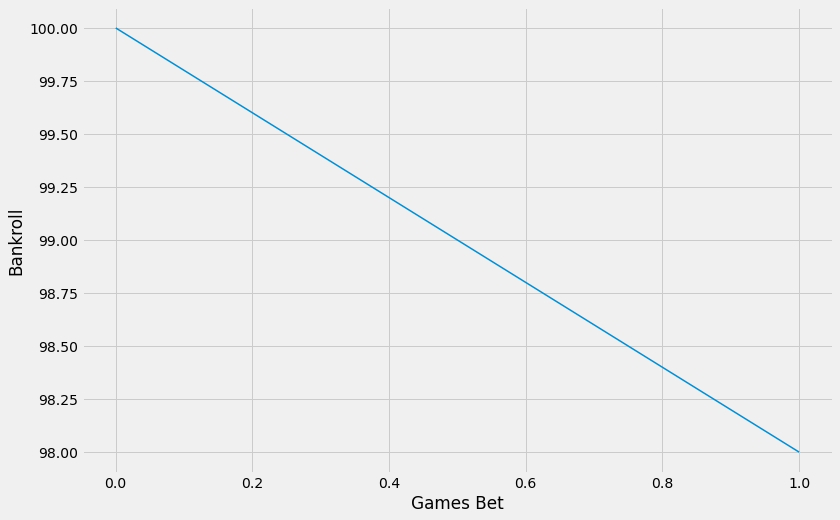

min balance: 98.0 
max balance: 99.81818181818181 
final balance: 99.81818181818181 
win percentage 50.0 
profit: -0.18181818181818188 risk: 4.0 
ROI: -4.55

 Pipeline(steps=[('selector',
                 ColumnTransformer(transformers=[('selector', 'passthrough',
                                                  ['STL_team_diff',
                                                   'PTS_2PT_MR_team_diff',
                                                   'AST_2PM_team_diff',
                                                   'UAST_2PM_team_diff',
                                                   'STL_opp_diff',
                                                   'BLK_opp_diff',
                                                   'PTS_2PT_MR_opp_diff',
                                                   'PTS_FB_opp_diff',
                                                   'OREB_PCT_team_diff',
                                                   'TS_PCT_opp_diff',
                          

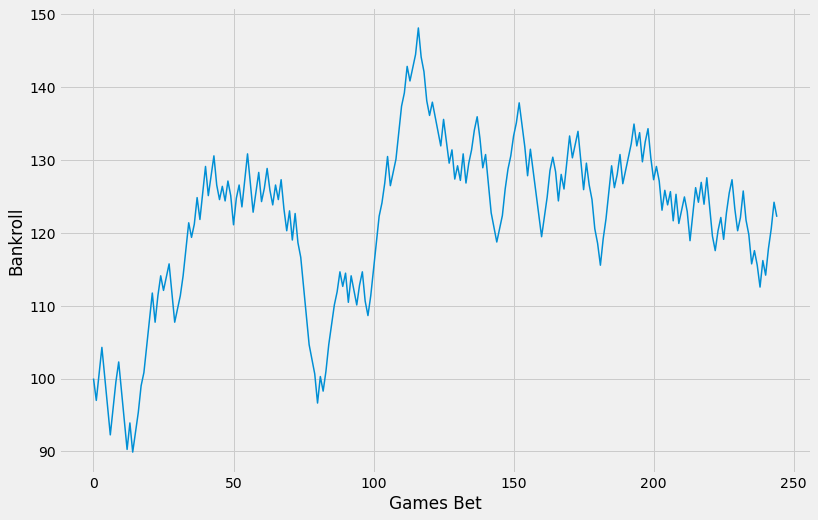

min balance: 89.90909090909093 
max balance: 148.09090909090918 
final balance: 125.81818181818177 
win percentage 54.690000000000005 
profit: 25.818181818181813 risk: 755.0 
ROI: 3.42
1
test set 1: 2017-01-21 - 2017-06-12


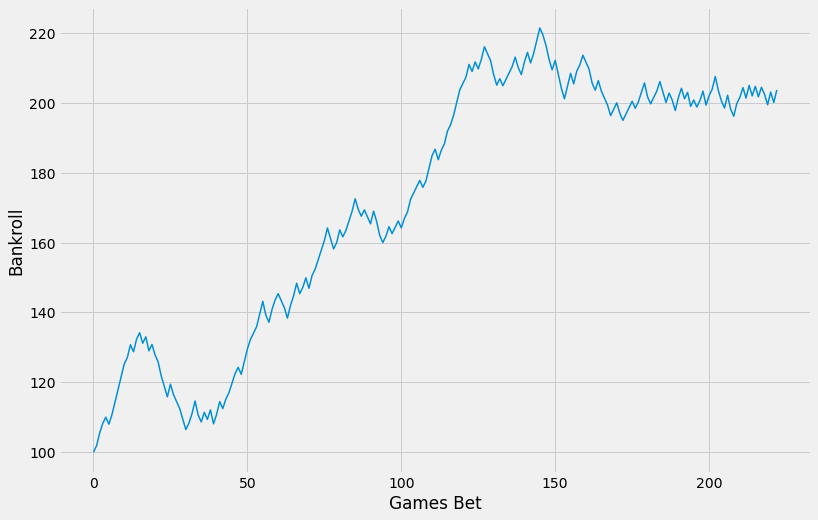

min balance: 101.81818181818181 
max balance: 221.454545454545 
final balance: 199.727272727272 
win percentage 58.74 
profit: 99.72727272727269 risk: 641.0 
ROI: 15.559999999999999
2
test set 1: 2017-10-20 - 2018-01-17


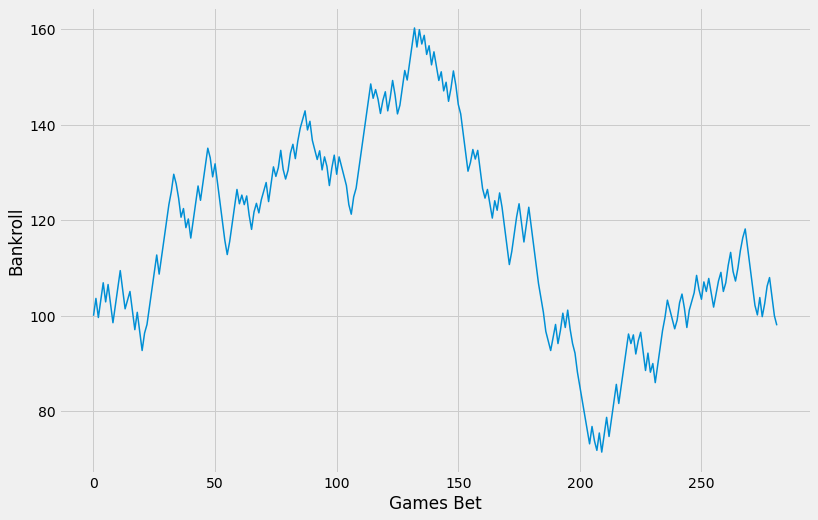

min balance: 71.45454545454523 
max balance: 160.27272727272705 
final balance: 100.72727272727259 
win percentage 52.480000000000004 
profit: 0.7272727272726911 risk: 929.0 
ROI: 0.08
3
test set 1: 2018-01-17 - 2018-06-08


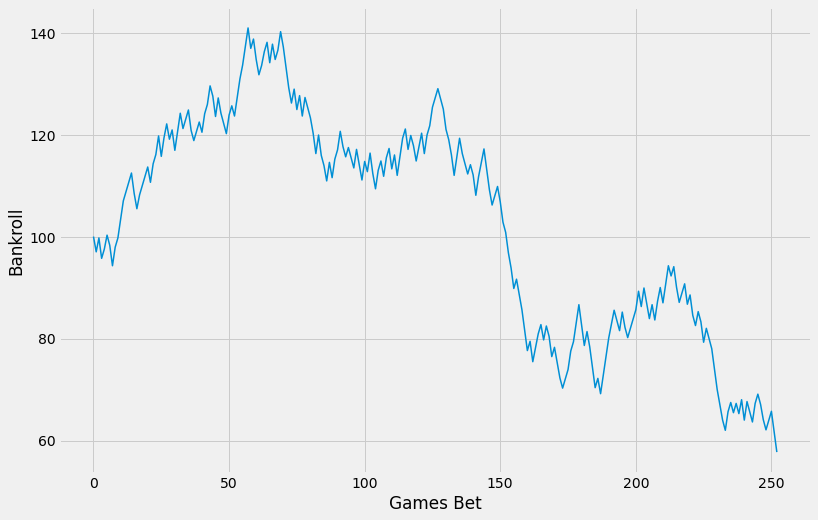

min balance: 55.72727272727275 
max balance: 140.90909090909088 
final balance: 55.72727272727275 
win percentage 49.8 
profit: -44.27272727272731 risk: 764.0 
ROI: -5.79
4
test set 1: 2018-10-19 - 2019-01-15


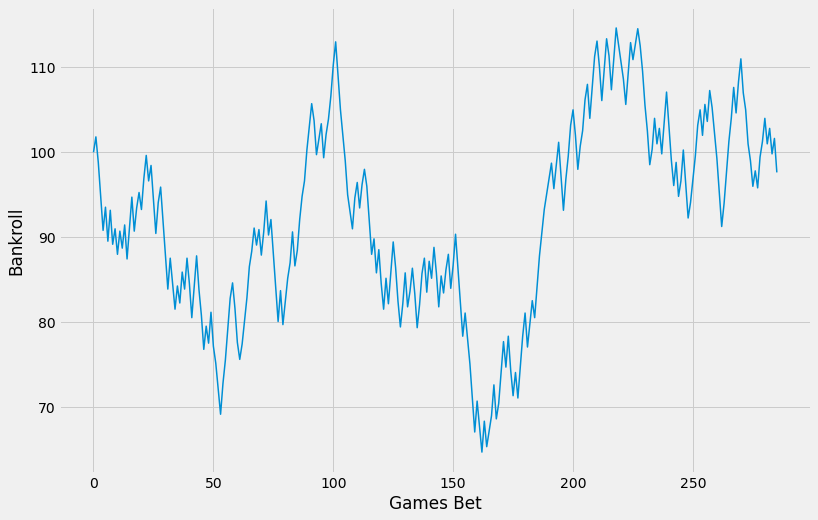

min balance: 64.72727272727292 
max balance: 114.63636363636391 
final balance: 101.2727272727276 
win percentage 53.5 
profit: 1.272727272727252 risk: 917.0 
ROI: 0.13999999999999999
5
test set 1: 2019-01-16 - 2019-06-13


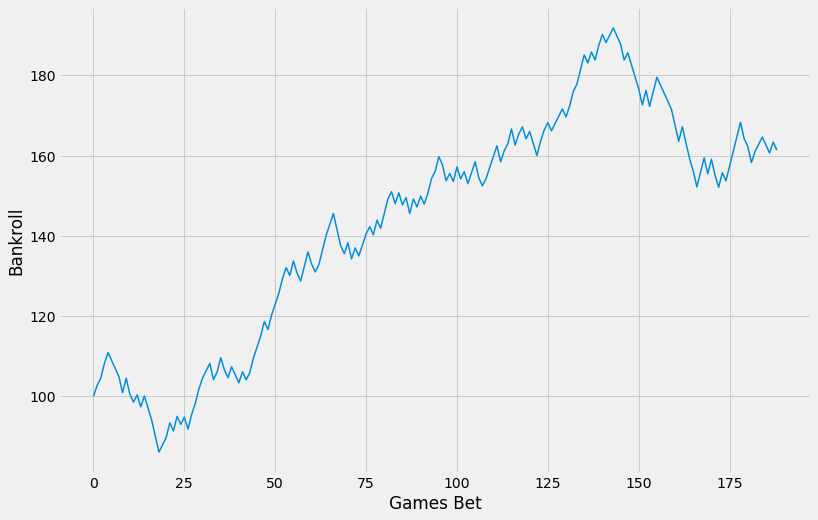

min balance: 86.09090909090911 
max balance: 191.81818181818144 
final balance: 159.36363636363583 
win percentage 55.559999999999995 
profit: 59.36363636363632 risk: 563.0 
ROI: 10.54
6
test set 1: 2019-10-25 - 2020-01-10


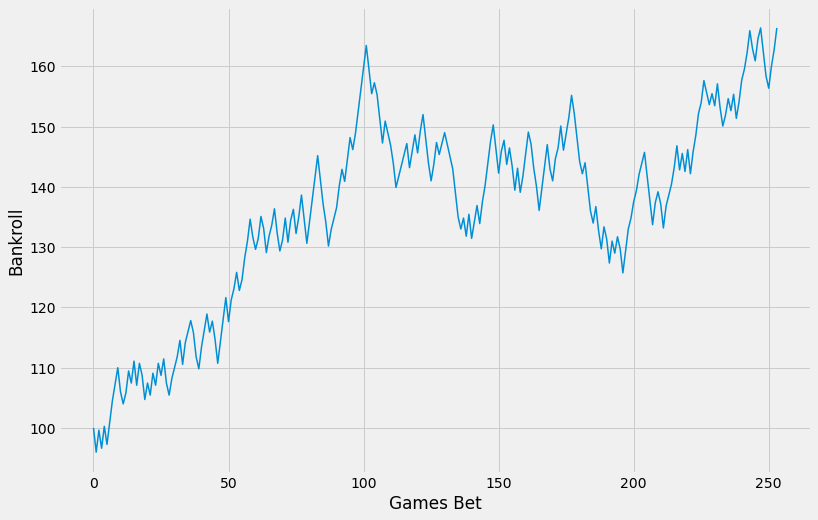

min balance: 96.0 
max balance: 166.36363636363555 
final balance: 162.36363636363552 
win percentage 56.3 
profit: 62.36363636363632 risk: 812.0 
ROI: 7.68
7
test set 1: 2020-01-10 - 2020-10-11


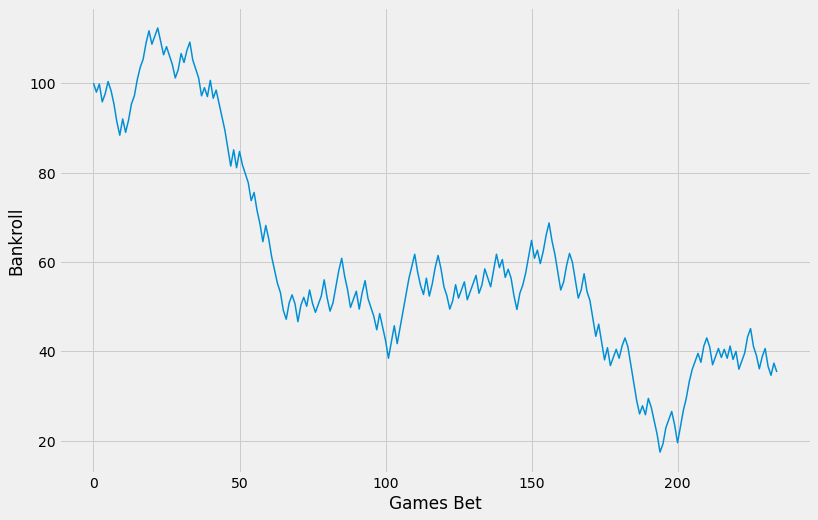

min balance: 17.454545454545432 
max balance: 112.36363636363637 
final balance: 37.181818181818166 
win percentage 49.36 
profit: -62.81818181818187 risk: 710.0 
ROI: -8.85
8
test set 1: 2020-12-25 - 2021-03-16


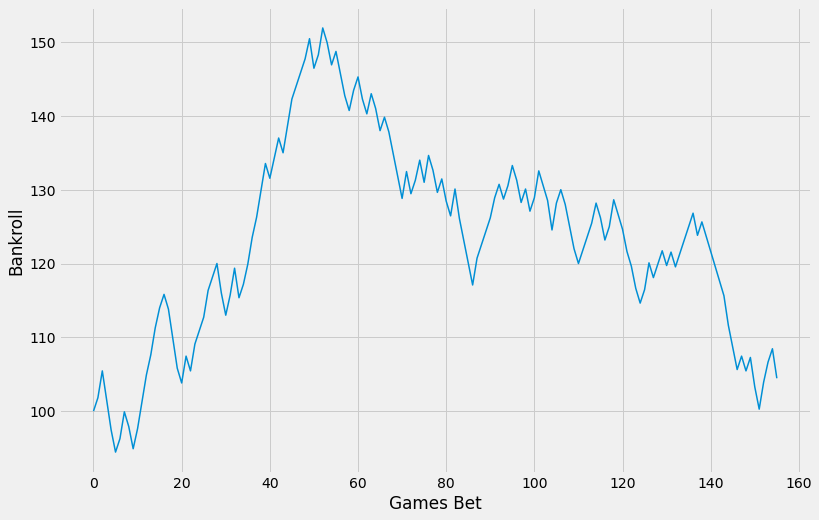

min balance: 94.45454545454545 
max balance: 151.90909090909085 
final balance: 100.45454545454517 
win percentage 51.92 
profit: 0.45454545454543904 risk: 431.0 
ROI: 0.11
9
test set 1: 2021-03-16 - 2021-07-20


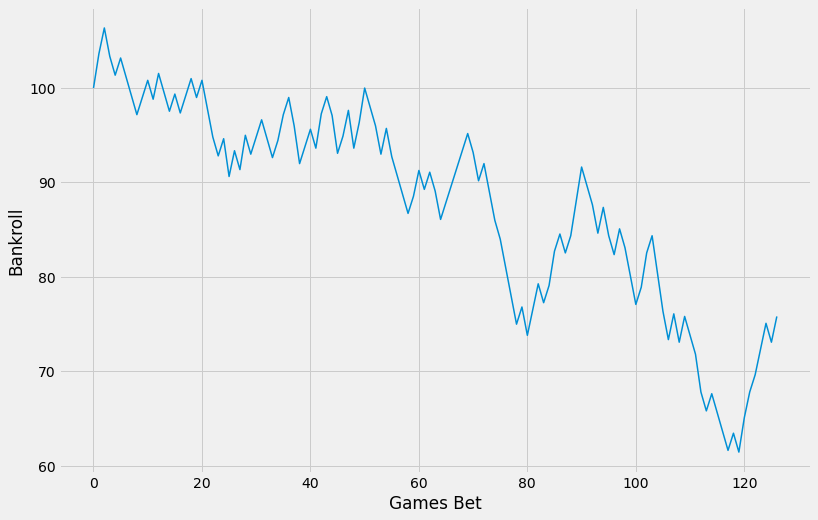

min balance: 61.45454545454542 
max balance: 106.36363636363637 
final balance: 77.63636363636361 
win percentage 48.03 
profit: -22.363636363636374 risk: 324.0 
ROI: -6.9
10
test set 1: 2021-10-22 - 2021-10-27


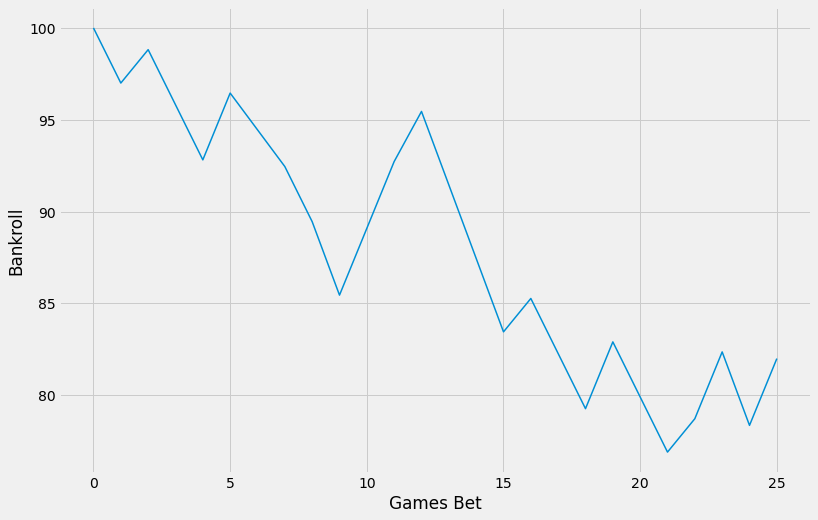

min balance: 76.90909090909092 
max balance: 98.81818181818181 
final balance: 84.72727272727275 
win percentage 42.309999999999995 
profit: -15.272727272727273 risk: 84.0 
ROI: -18.18
11
test set 1: 2021-10-27 - 2021-11-03


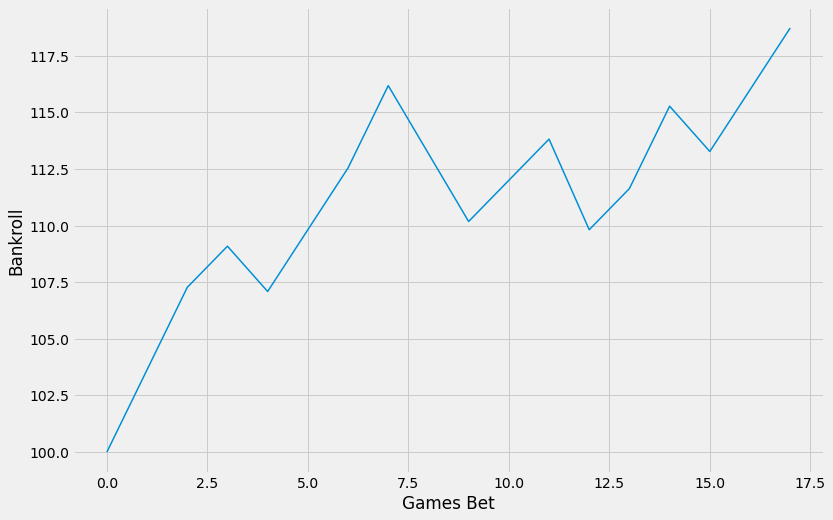

min balance: 103.63636363636364 
max balance: 118.72727272727275 
final balance: 116.72727272727275 
win percentage 66.67 
profit: 16.727272727272727 risk: 52.0 
ROI: 32.17

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('selector',
                                                 ColumnTransformer(transformers=[('selector',
                                                                                  'passthrough',
                                                                                  Index(['RECORD_team_diff', 'FG3M_team_diff', 'FG3A_team_diff',
       'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff', 'AST_team_diff',
       'STL_team_diff', 'PF_team_diff', 'AST_3PM_team_diff',
       'UAST_3PM_team_diff', 'ATS_DIFF_team_diff', 'RECORD...
       'AST_3PM_team_diff', 'UAST_2PM_team_diff', 'UAST_3PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG2M_opp_diff',
       'FG3M_opp_diff', 'FG3A_opp_diff', 'FTM_opp_di

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,2017,0.53,0.546939,245,0.034196,25.818182
1,2017,0.53,0.587444,223,0.155581,99.727273
2,2018,0.53,0.524823,282,0.000783,0.727273
3,2018,0.53,0.498024,253,-0.057949,-44.272727
4,2019,0.53,0.534965,286,0.001388,1.272727
5,2019,0.53,0.555556,189,0.105442,59.363636
6,2020,0.53,0.562992,254,0.076803,62.363636
7,2020,0.53,0.493617,235,-0.088476,-62.818182
8,2021,0.53,0.519231,156,0.001055,0.454545
9,2021,0.53,0.480315,127,-0.069024,-22.363636


In [251]:
estimators = [('log', best_lr), ('sgd_huber', best_sgd_huber),
              ('svc', best_sgd_hinge), ('lgbc', best_lgbc),
             ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


# stacked_clf.fit(X_train, y_train)


# print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
# print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_mid_16, cutoff_17, cutoff_mid_17, cutoff_18, cutoff_mid_18,
           cutoff_19, cutoff_mid_19, cutoff_20, cutoff_mid_20, cutoff_21, cutoff_mid_21, cutoff_22]

threshold = 0.53

for estimator in [best_lr, best_sgd_hinge, best_sgd, best_lgbc, best_rf, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], "-",
             df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1])

        year = df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].str[:4].values[-1]
        
        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [ ]:
stacked_clf.fit(X_train, y_train)
y_preds = stacked_clf.predict(X_train)


stacked clf train_acc: 0.5603860072376357
stacked clf test_acc: 0.51565848030328
0
test set 1: 2016-10-27 - 2017-06-12


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 168 epochs took 5 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    5.1s finished


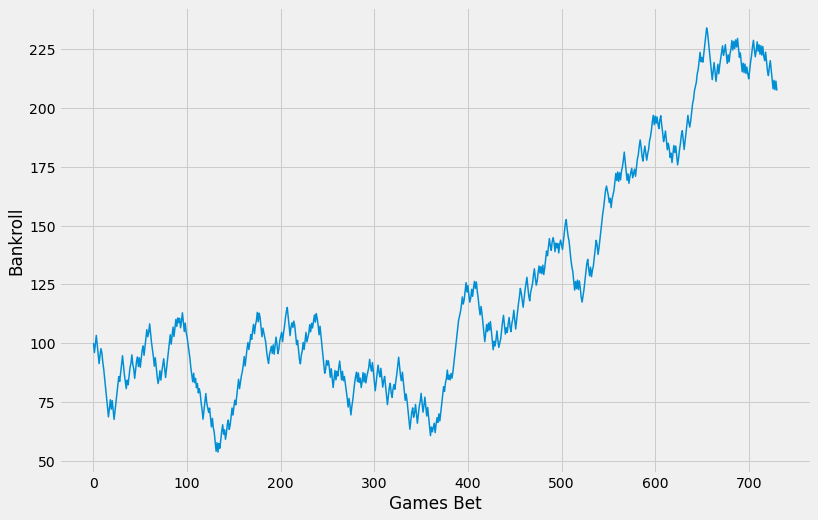

min balance: 53.63636363636379 
max balance: 234.09090909090878 
final balance: 209.27272727272663 
win percentage 54.86 
profit: 109.27272727272725 risk: 2489.0 
ROI: 4.390000000000001
1
test set 1: 2017-10-20 - 2018-06-08


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 178 epochs took 7 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    6.2s finished


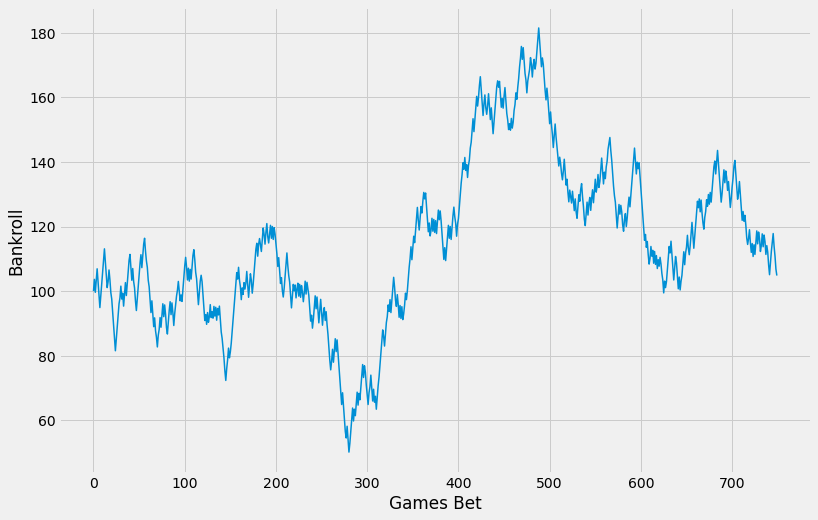

min balance: 50.181818181818564 
max balance: 181.45454545454558 
final balance: 101.81818181818161 
win percentage 51.6 
profit: 1.8181818181817562 risk: 2585.0 
ROI: 0.06999999999999999
2
test set 1: 2018-10-19 - 2019-06-13


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 175 epochs took 7 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.0s finished


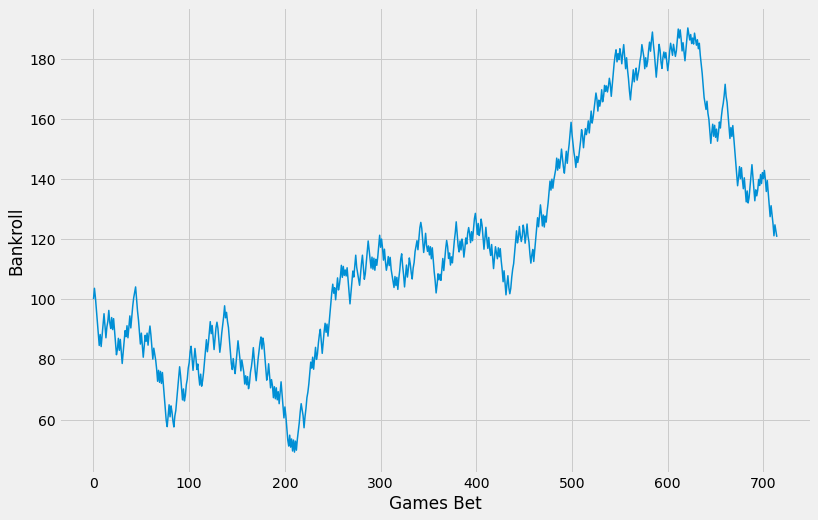

min balance: 49.181818181818436 
max balance: 190.18181818181807 
final balance: 117.72727272727231 
win percentage 51.74999999999999 
profit: 17.72727272727252 risk: 2403.0 
ROI: 0.74
3
test set 1: 2019-10-25 - 2020-10-11


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 178 epochs took 8 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    7.9s finished


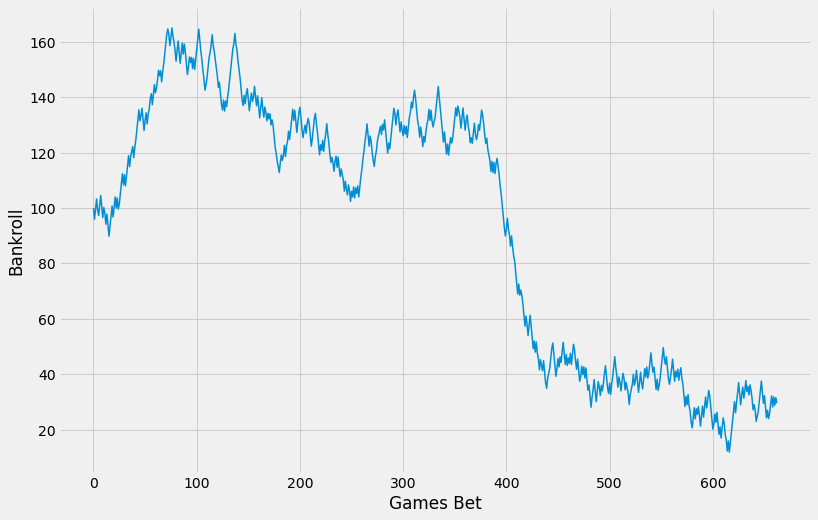

min balance: 11.909090909089919 
max balance: 164.99999999999986 
final balance: 33.181818181817164 
win percentage 49.919999999999995 
profit: -66.81818181818198 risk: 2268.0 
ROI: -2.9499999999999997
4
test set 1: 2020-12-25 - 2021-07-20


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 185 epochs took 9 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    9.0s finished


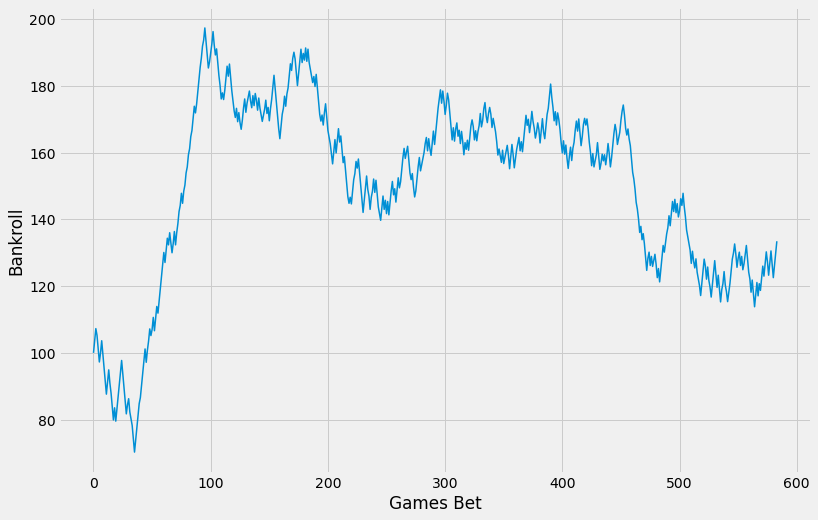

min balance: 70.27272727272732 
max balance: 197.36363636363623 
final balance: 137.09090909090725 
win percentage 53.25 
profit: 37.09090909090901 risk: 1935.0 
ROI: 1.92
5
test set 1: 2021-10-22 - 2021-10-26


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


convergence after 164 epochs took 9 seconds


[Parallel(n_jobs=1)]: Done   1 out of   1 | elapsed:    8.5s finished


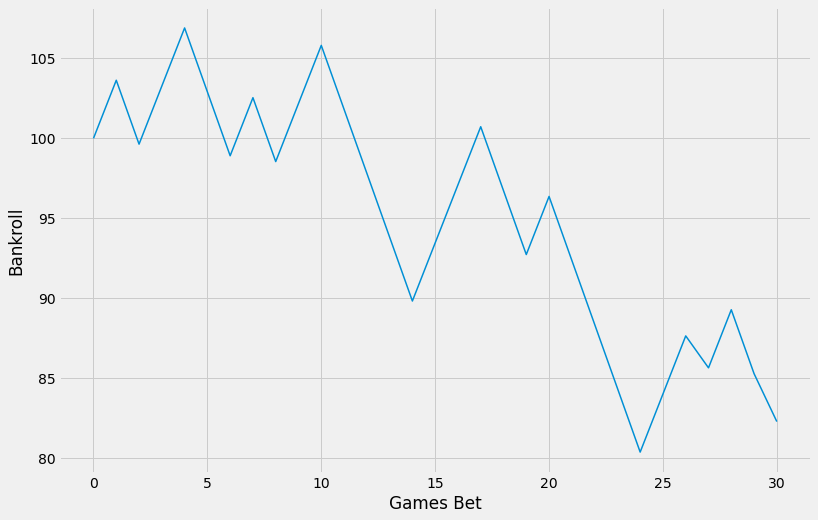

min balance: 78.27272727272732 
max balance: 106.90909090909092 
final balance: 78.27272727272732 
win percentage 41.94 
profit: -21.727272727272734 risk: 121.0 
ROI: -17.96

 Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.06226787404081285, max_iter=10000,
                                    random_state=23, solver='saga',
                                    verbose=1))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.548564            731  0.043902   
1  (2017, -, 2018)            0.53  0.516000            750  0.000703   
2  (2018, -, 2019)            0.53  0.517483            715  0.007377   
3  (2019, -, 2020)            0.53  0.499246            663 -0.029461   
4  (2020, -, 2021)            0.53  0.532534            584  0.019168   
5  (2021, -, 2021)            0.53  0.419355             31 -0.179564   

      profits  
0  109.272727  
1    1.818182 

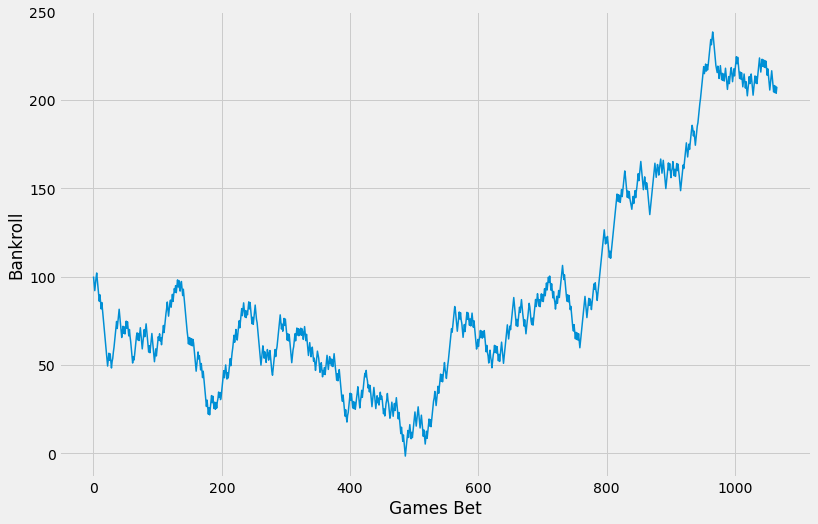

min balance: -1.7272727272726272 
max balance: 238.54545454545405 
final balance: 209.27272727272629 
win percentage 53.28000000000001 
profit: 109.27272727272702 risk: 4064.0 
ROI: 2.69
1
test set 1: 2017-10-20 - 2018-06-08


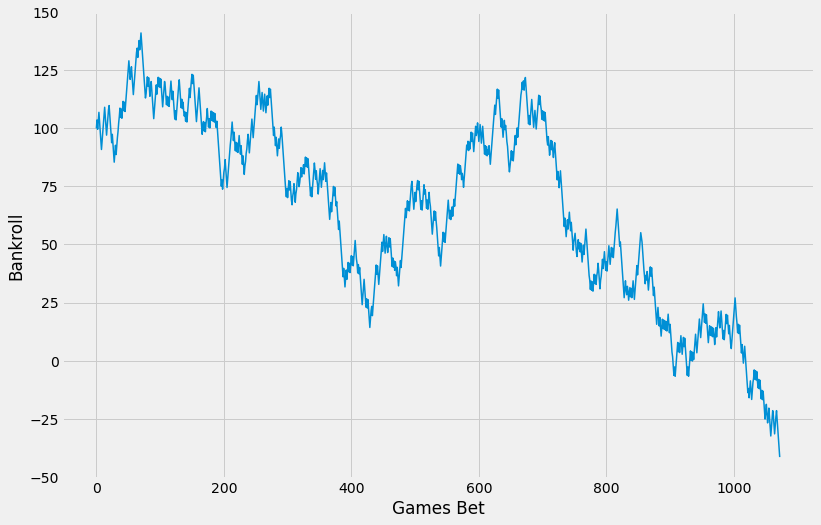

min balance: -45.54545454545388 
max balance: 141.09090909090915 
final balance: -45.54545454545388 
win percentage 50.7 
profit: -145.54545454545473 risk: 4126.0 
ROI: -3.53
2
test set 1: 2018-10-19 - 2019-06-13


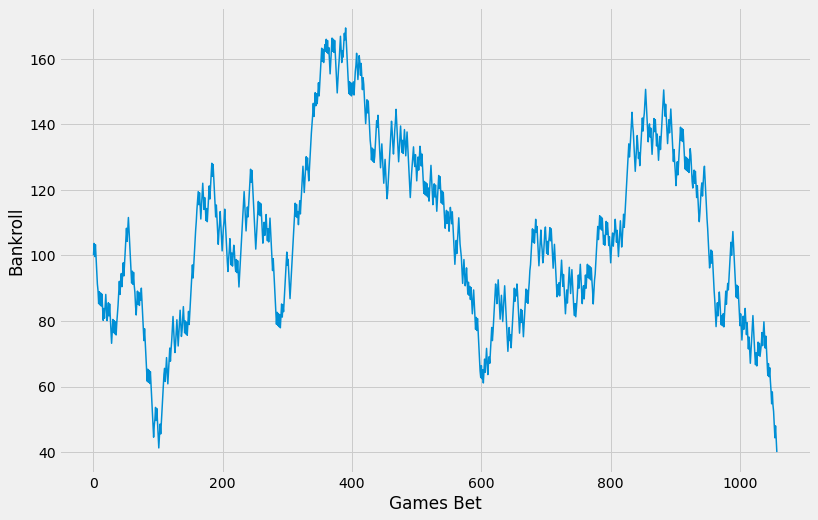

min balance: 36.0000000000001 
max balance: 169.36363636363663 
final balance: 36.0000000000001 
win percentage 51.7 
profit: -64.00000000000023 risk: 4033.0 
ROI: -1.59
3
test set 1: 2019-10-25 - 2020-10-11


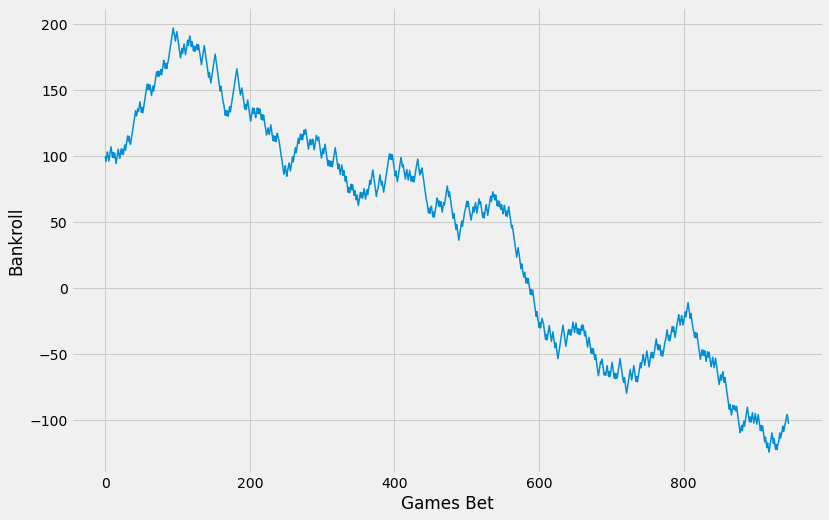

min balance: -124.09090909090963 
max balance: 197.1818181818179 
final balance: -99.09090909090959 
win percentage 49.26 
profit: -199.09090909090924 risk: 3645.0 
ROI: -5.46
4
test set 1: 2020-12-25 - 2021-07-20


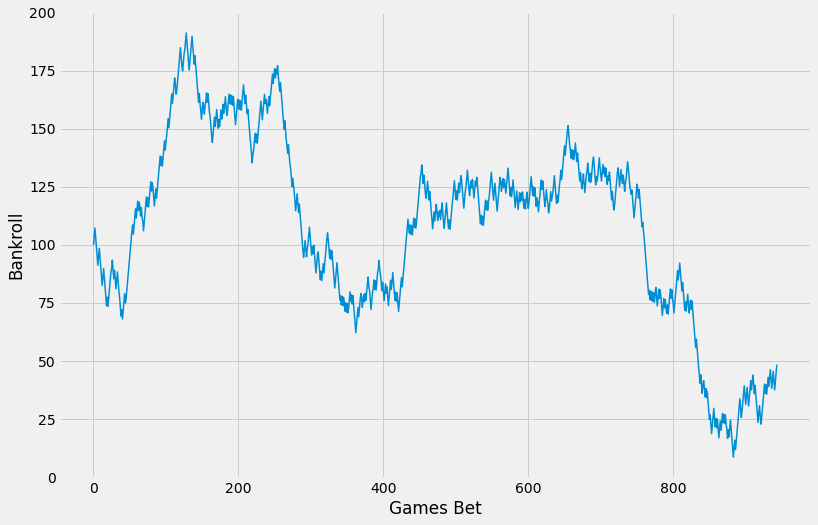

min balance: 8.636363636363168 
max balance: 191.27272727272717 
final balance: 52.090909090908546 
win percentage 51.480000000000004 
profit: -47.90909090909099 risk: 3574.0 
ROI: -1.34
5
test set 1: 2021-10-22 - 2021-10-26


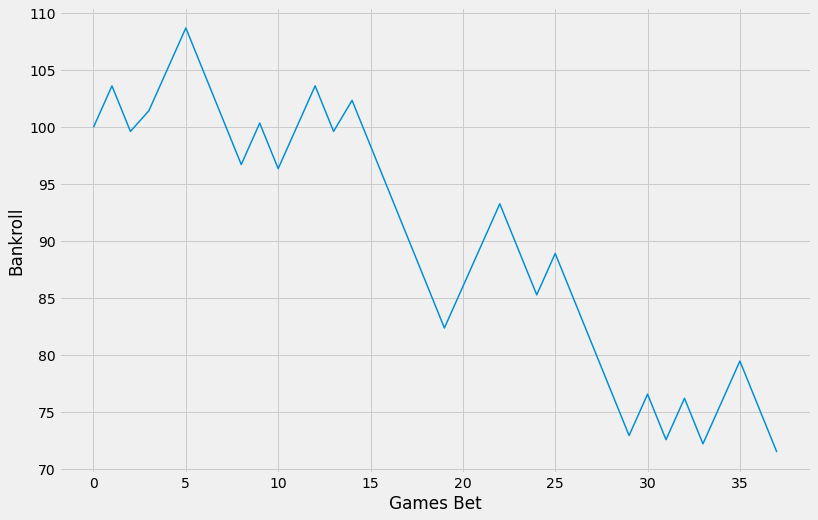

min balance: 67.45454545454551 
max balance: 108.72727272727273 
final balance: 67.45454545454551 
win percentage 42.11 
profit: -32.54545454545455 risk: 149.0 
ROI: -21.84

 Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.05305927223792528, loss='hinge', max_iter=100000,
                           random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.532833           1066  0.026888   
1  (2017, -, 2018)            0.53  0.506990           1073 -0.035275   
2  (2018, -, 2019)            0.53  0.517013           1058 -0.015869   
3  (2019, -, 2020)            0.53  0.492600            946 -0.054620   
4  (2020, -, 2021)            0.53  0.514831            944 -0.013405   
5  (2021, -, 2021)            0.53  0.421053             38 -0.218426   

      profits  
0  109.272727  
1 -145.545455  
2  -64.000000  
3 -199.090909  
4  -47.909091  
5  -32.545455  
0
t

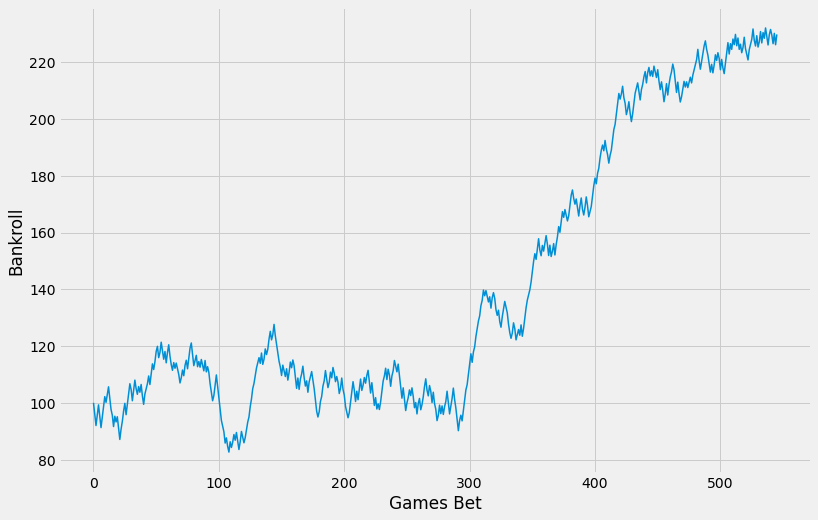

min balance: 82.63636363636374 
max balance: 232.09090909090835 
final balance: 225.81818181818105 
win percentage 55.489999999999995 
profit: 125.81818181818176 risk: 1684.0 
ROI: 7.470000000000001
1
test set 1: 2017-10-20 - 2018-06-08


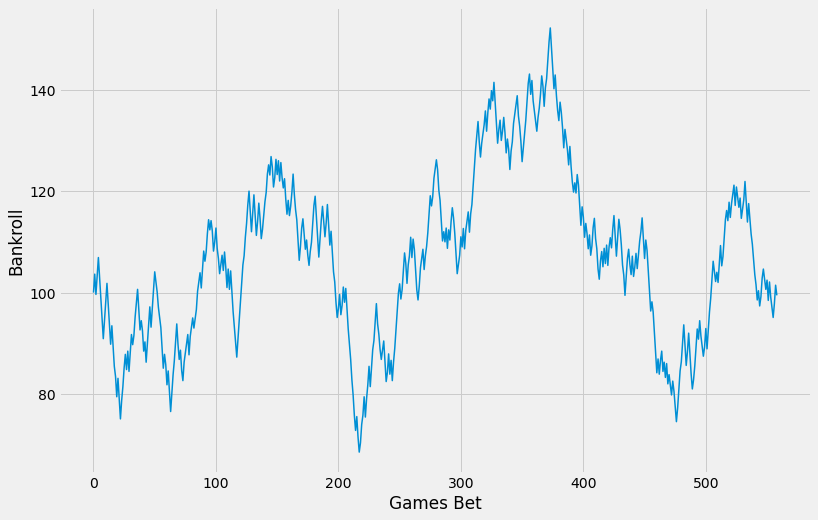

min balance: 68.54545454545476 
max balance: 152.1818181818182 
final balance: 97.45454545454554 
win percentage 52.59 
profit: -2.545454545454618 risk: 1778.0 
ROI: -0.13999999999999999
2
test set 1: 2018-10-19 - 2019-06-13


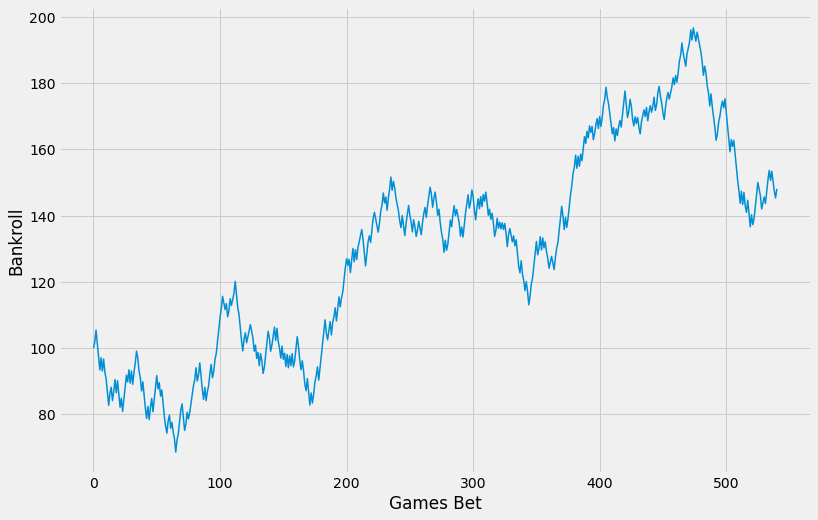

min balance: 68.63636363636371 
max balance: 196.63636363636277 
final balance: 149.90909090908983 
win percentage 53.42 
profit: 49.90909090909088 risk: 1695.0 
ROI: 2.94
3
test set 1: 2019-10-25 - 2020-10-11


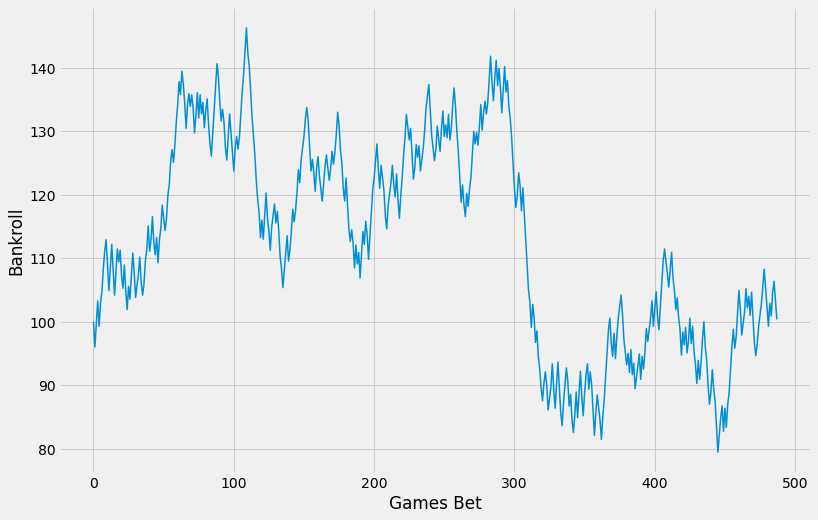

min balance: 79.45454545454524 
max balance: 146.2727272727271 
final balance: 103.99999999999982 
win percentage 52.05 
profit: 3.9999999999998863 risk: 1508.0 
ROI: 0.27
4
test set 1: 2020-12-25 - 2021-07-20


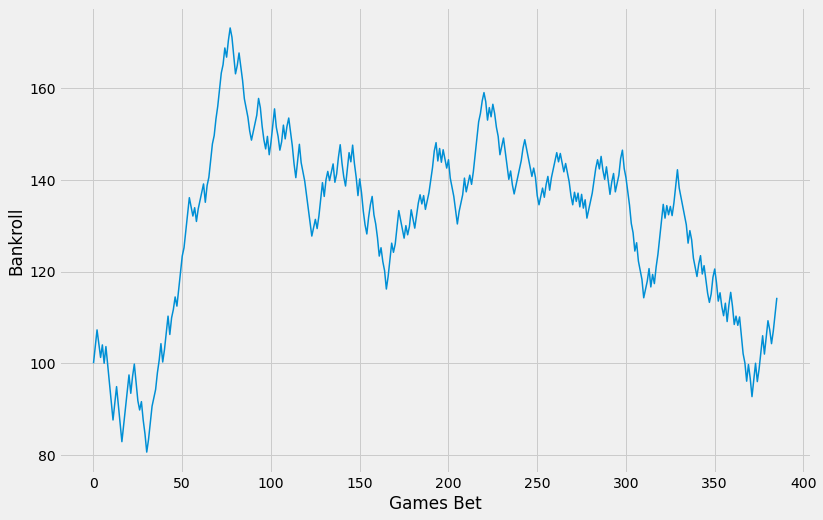

min balance: 80.63636363636368 
max balance: 173.090909090909 
final balance: 117.9090909090901 
win percentage 52.59 
profit: 17.909090909090878 risk: 1139.0 
ROI: 1.5699999999999998
5
test set 1: 2021-10-22 - 2021-10-26


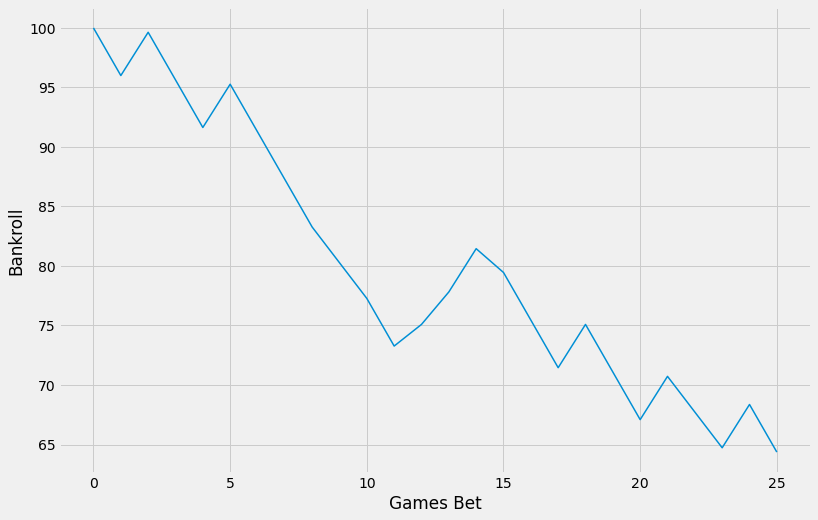

min balance: 60.36363636363639 
max balance: 99.63636363636364 
final balance: 60.36363636363639 
win percentage 30.769999999999996 
profit: -39.63636363636364 risk: 95.0 
ROI: -41.72

 Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.5629982879384883, loss='modified_huber',
                               max_iter=10000, random_state=23))])
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.554945            546  0.074714   
1  (2017, -, 2018)            0.53  0.525939            559 -0.001432   
2  (2018, -, 2019)            0.53  0.534196            541  0.029445   
3  (2019, -, 2020)            0.53  0.520492            488  0.002653   
4  (2020, -, 2021)            0.53  0.525907            386  0.015724   
5  (2021, -, 2021)            0.53  0.307692             26 -0.417225   

      profits  
0  125.818182  
1   -2.545455  
2   49.909091  
3    4.000000  
4   1

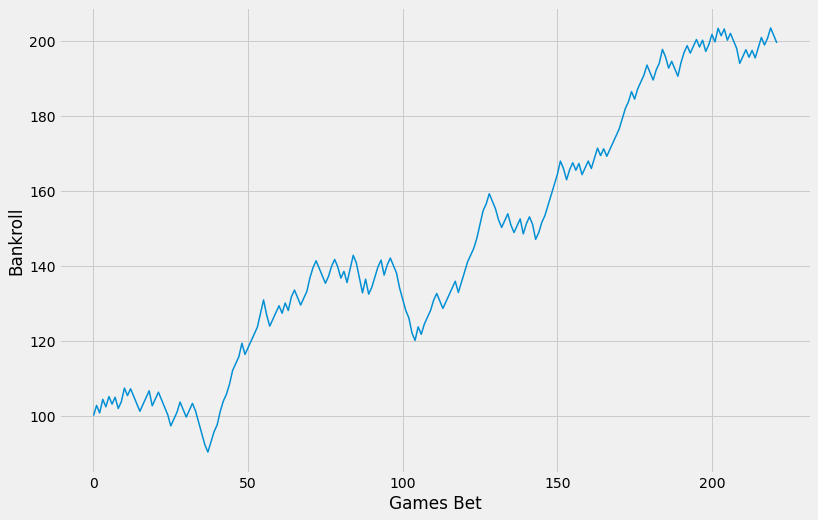

min balance: 90.27272727272724 
max balance: 203.54545454545388 
final balance: 201.3636363636357 
win percentage 60.809999999999995 
profit: 101.36363636363632 risk: 563.0 
ROI: 18.0
1
test set 1: 2017-10-20 - 2018-06-08


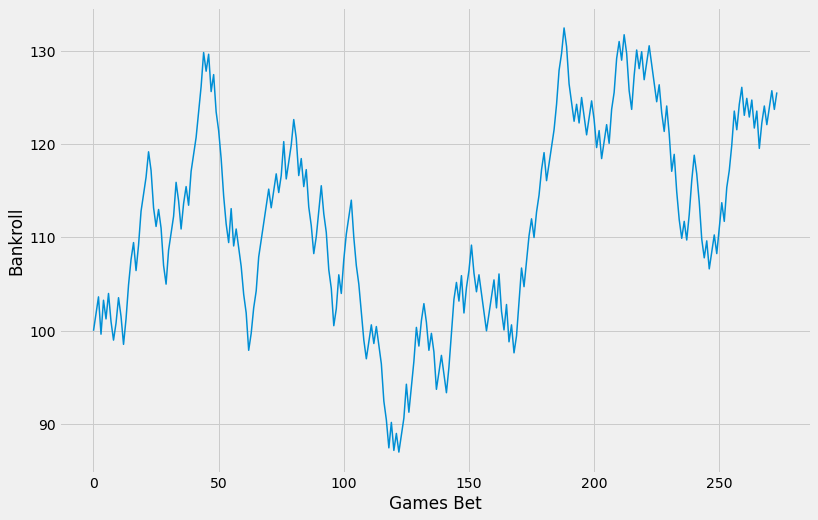

min balance: 86.99999999999996 
max balance: 132.4545454545454 
final balance: 123.54545454545443 
win percentage 54.379999999999995 
profit: 23.545454545454504 risk: 721.0 
ROI: 3.27
2
test set 1: 2018-10-19 - 2019-06-13


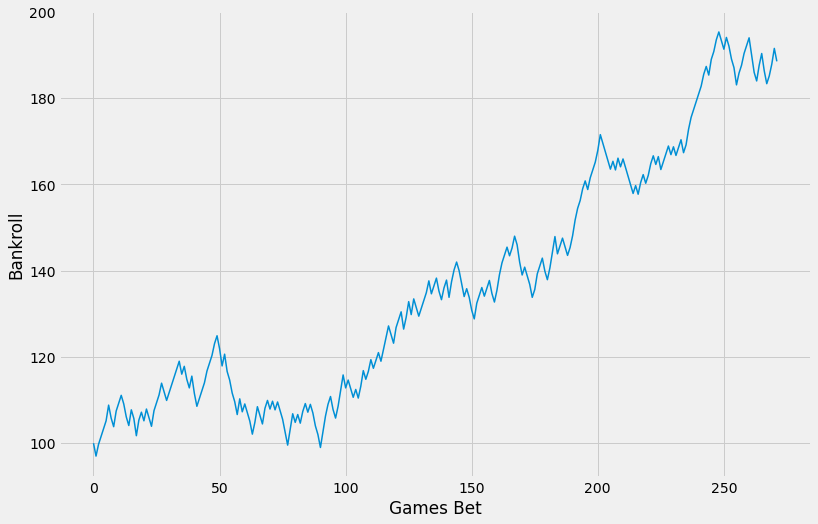

min balance: 97.0 
max balance: 195.36363636363583 
final balance: 185.54545454545394 
win percentage 57.35 
profit: 85.5454545454545 risk: 701.0 
ROI: 12.2
3
test set 1: 2019-10-25 - 2020-10-11


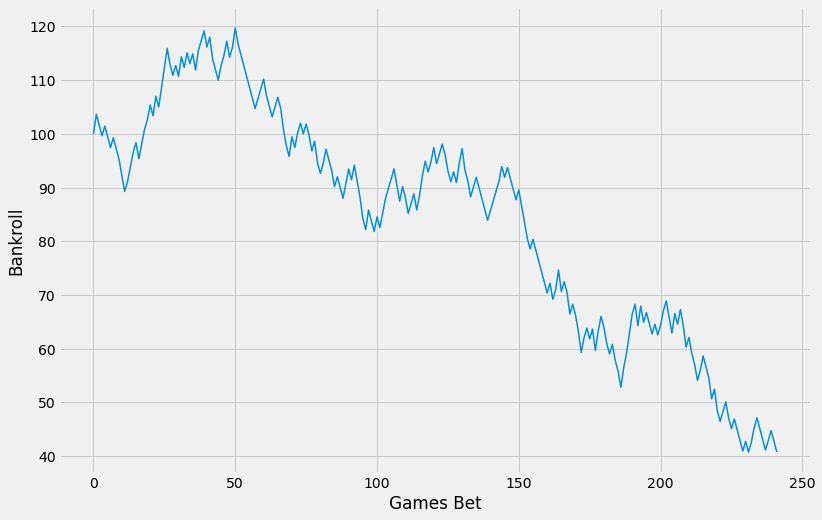

min balance: 40.727272727272705 
max balance: 119.72727272727275 
final balance: 42.54545454545453 
win percentage 46.28 
profit: -57.454545454545496 risk: 613.0 
ROI: -9.370000000000001
4
test set 1: 2020-12-25 - 2021-07-20


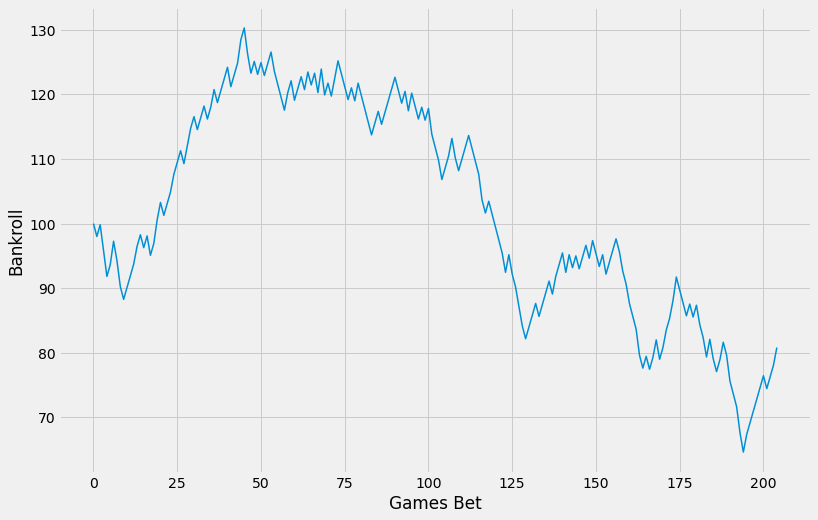

min balance: 64.63636363636343 
max balance: 130.2727272727272 
final balance: 82.6363636363634 
win percentage 51.71 
profit: -17.363636363636374 risk: 487.0 
ROI: -3.5700000000000003
5
test set 1: 2021-10-22 - 2021-10-26


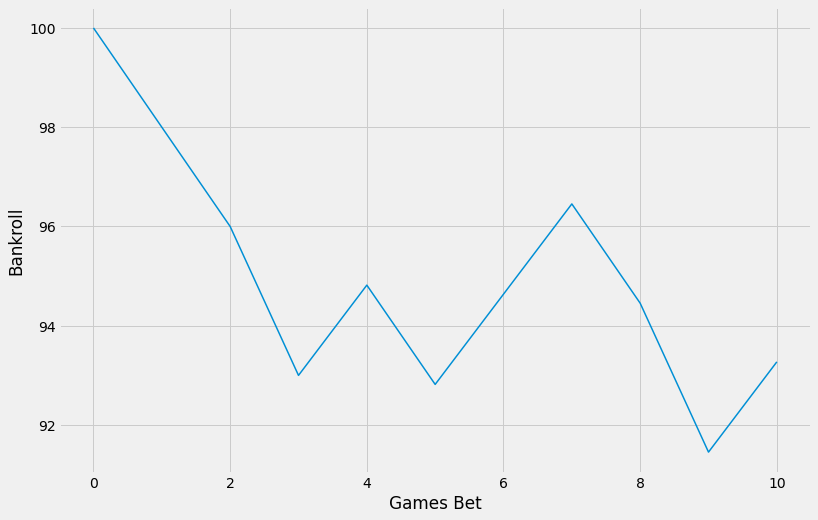

min balance: 91.45454545454544 
max balance: 98.0 
final balance: 95.09090909090907 
win percentage 45.45 
profit: -4.90909090909091 risk: 24.0 
ROI: -20.45

 RandomForestClassifier(max_depth=14, min_samples_leaf=0.011132401847594018,
                       min_samples_split=0.028510554930813045, random_state=23)
            season  best_threshold  win_pcts  num_games_bet      rois  \
0  (2016, -, 2017)            0.53  0.608108            222  0.180042   
1  (2017, -, 2018)            0.53  0.543796            274  0.032657   
2  (2018, -, 2019)            0.53  0.573529            272  0.122033   
3  (2019, -, 2020)            0.53  0.462810            242 -0.093727   
4  (2020, -, 2021)            0.53  0.517073            205 -0.035654   
5  (2021, -, 2021)            0.53  0.454545             11 -0.204545   

      profits  
0  101.363636  
1   23.545455  
2   85.545455  
3  -57.454545  
4  -17.363636  
5   -4.909091  
0
test set 1: 2016-10-27 - 2017-06-12


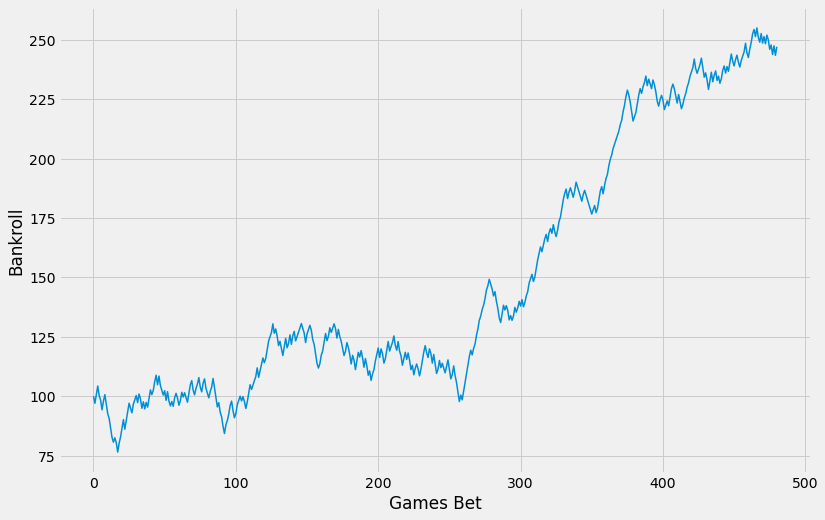

min balance: 76.45454545454547 
max balance: 254.99999999999923 
final balance: 243.09090909090827 
win percentage 57.379999999999995 
profit: 143.090909090909 risk: 1430.0 
ROI: 10.01
1
test set 1: 2017-10-20 - 2018-06-08


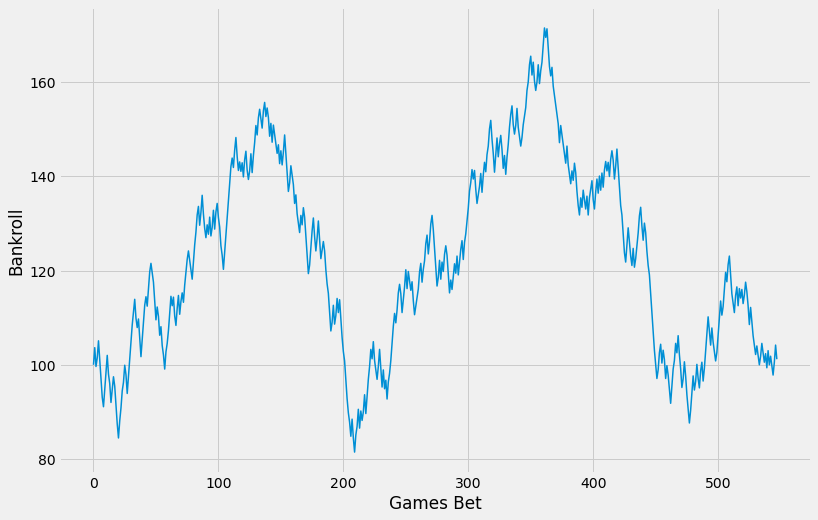

min balance: 81.45454545454524 
max balance: 171.5454545454541 
final balance: 98.18181818181762 
win percentage 51.28 
profit: -1.8181818181818699 risk: 1699.0 
ROI: -0.11
2
test set 1: 2018-10-19 - 2019-06-13


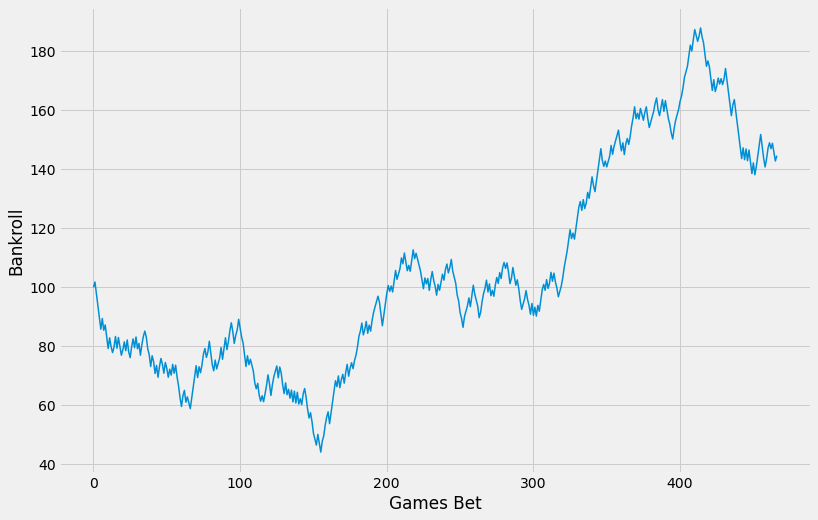

min balance: 44.1818181818183 
max balance: 187.90909090909076 
final balance: 142.6363636363633 
win percentage 53.53 
profit: 42.636363636363626 risk: 1435.0 
ROI: 2.97
3
test set 1: 2019-10-25 - 2020-10-11


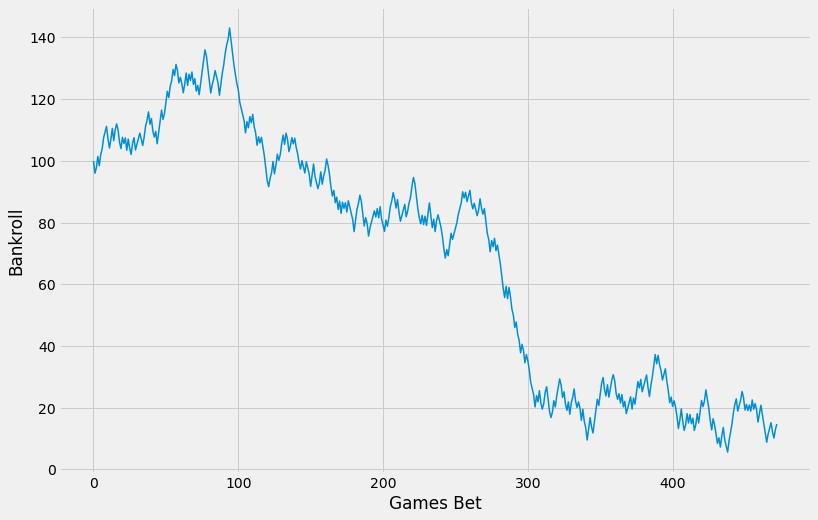

min balance: 5.636363636363596 
max balance: 143.090909090909 
final balance: 17.4545454545454 
win percentage 49.26 
profit: -82.54545454545462 risk: 1417.0 
ROI: -5.83
4
test set 1: 2020-12-25 - 2021-07-20


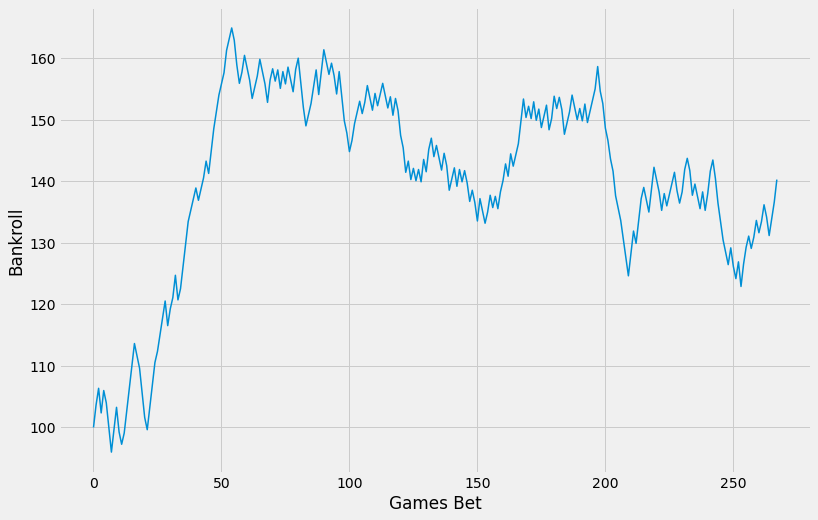

min balance: 96.00000000000001 
max balance: 164.90909090909085 
final balance: 142.99999999999923 
win percentage 53.73 
profit: 42.99999999999994 risk: 734.0 
ROI: 5.86
5
test set 1: 2021-10-22 - 2021-10-26


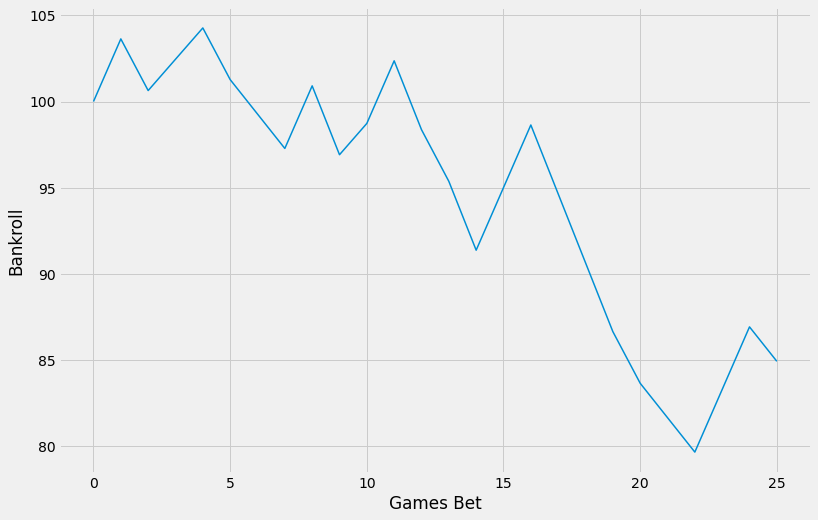

min balance: 79.63636363636364 
max balance: 104.27272727272727 
final balance: 80.90909090909092 
win percentage 38.46 
profit: -19.090909090909093 risk: 84.0 
ROI: -22.73

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.06226787404081285,
                                                                    max_iter=10000,
                                                                    random_state=23,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.573805,481,0.100064,143.090909
1,"(2017, -, 2018)",0.53,0.512774,548,-0.001070,-1.818182
2,"(2018, -, 2019)",0.53,0.535332,467,0.029712,42.636364
3,"(2019, -, 2020)",0.53,0.492600,473,-0.058254,-82.545455
4,"(2020, -, 2021)",0.53,0.537313,268,0.058583,43.000000
5,"(2021, -, 2021)",0.53,0.384615,26,-0.227273,-19.090909


In [412]:
estimators = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc),
             ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [best_lr, best_svc, best_sgd, best_rf, stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

stacked clf train_acc: 0.5640048250904705
stacked clf test_acc: 0.512938849513763
0
test set 1: 2016-10-27 - 2017-06-12


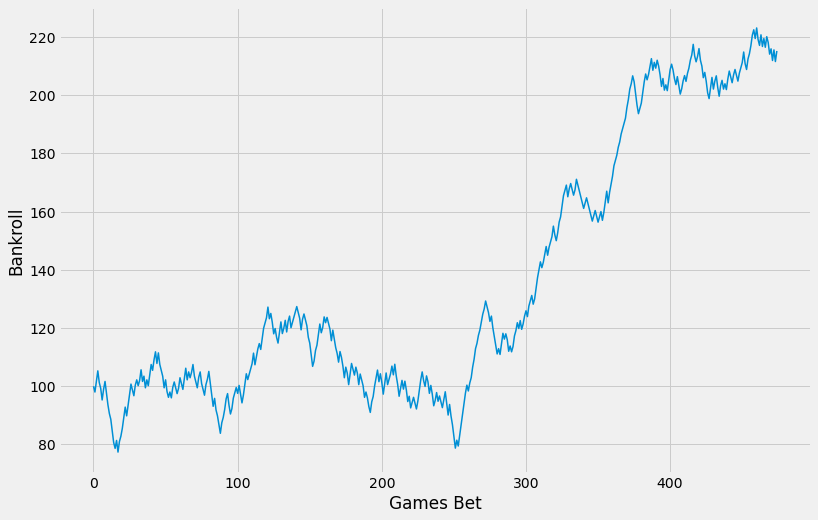

min balance: 77.36363636363639 
max balance: 223.0909090909086 
final balance: 211.18181818181765 
win percentage 55.78999999999999 
profit: 111.18181818181813 risk: 1397.0 
ROI: 7.960000000000001
1
test set 1: 2017-10-20 - 2018-06-08


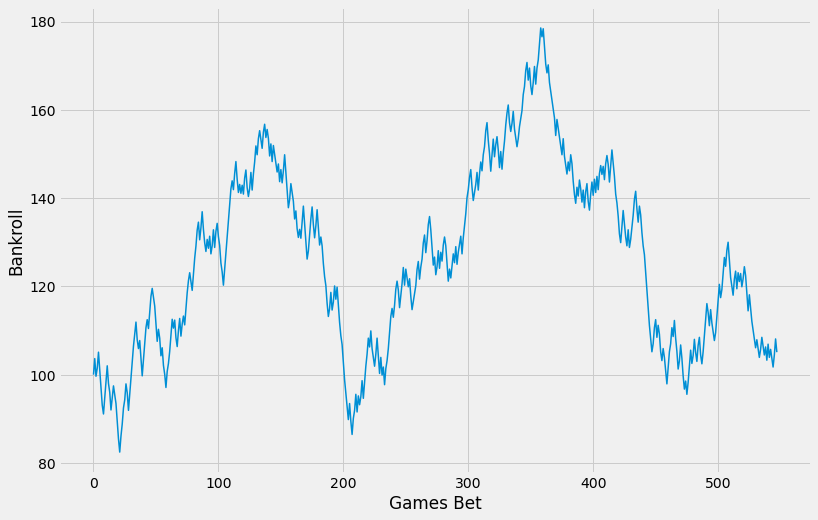

min balance: 82.45454545454548 
max balance: 178.54545454545396 
final balance: 102.0909090909083 
win percentage 51.28 
profit: 2.0909090909090082 risk: 1697.0 
ROI: 0.12
2
test set 1: 2018-10-19 - 2019-06-13


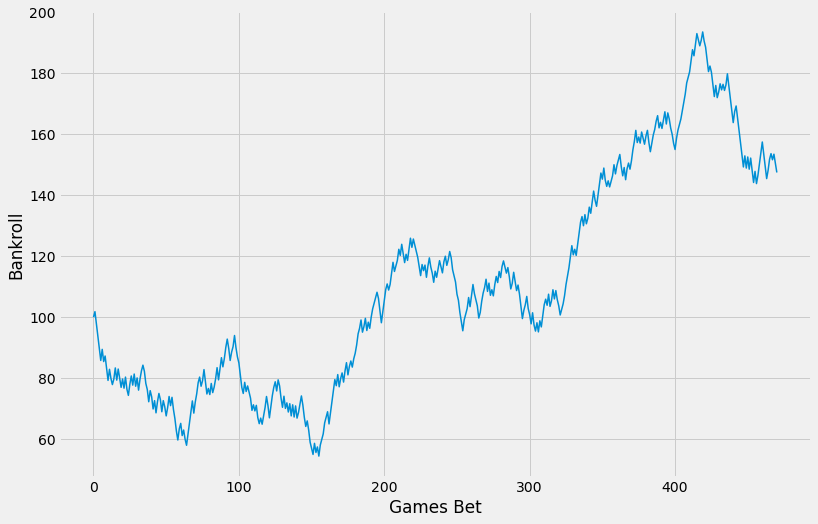

min balance: 54.45454545454561 
max balance: 193.54545454545445 
final balance: 149.272727272727 
win percentage 53.72 
profit: 49.27272727272725 risk: 1457.0 
ROI: 3.38
3
test set 1: 2019-10-25 - 2020-10-11


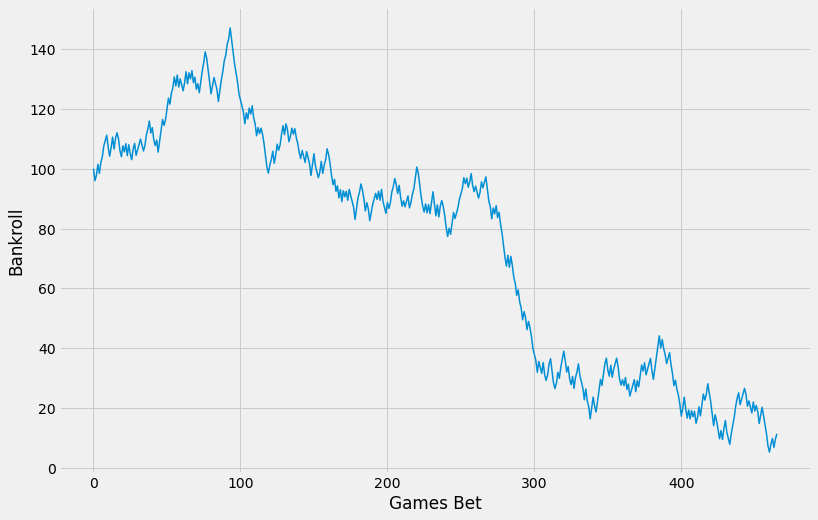

min balance: 5.363636363636289 
max balance: 146.99999999999986 
final balance: 14.181818181818105 
win percentage 48.93 
profit: -85.81818181818187 risk: 1405.0 
ROI: -6.11
4
test set 1: 2020-12-25 - 2021-07-20


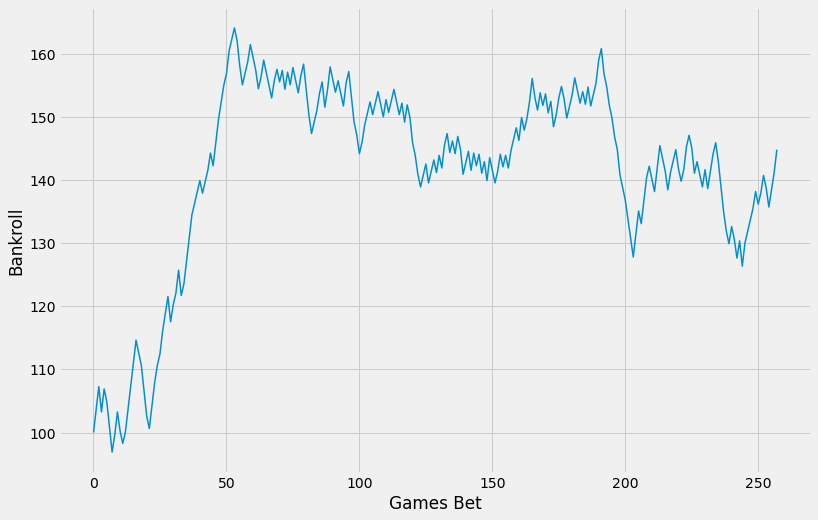

min balance: 96.90909090909092 
max balance: 164.09090909090904 
final balance: 147.5454545454538 
win percentage 54.65 
profit: 47.545454545454504 risk: 697.0 
ROI: 6.819999999999999
5
test set 1: 2021-10-22 - 2021-10-26


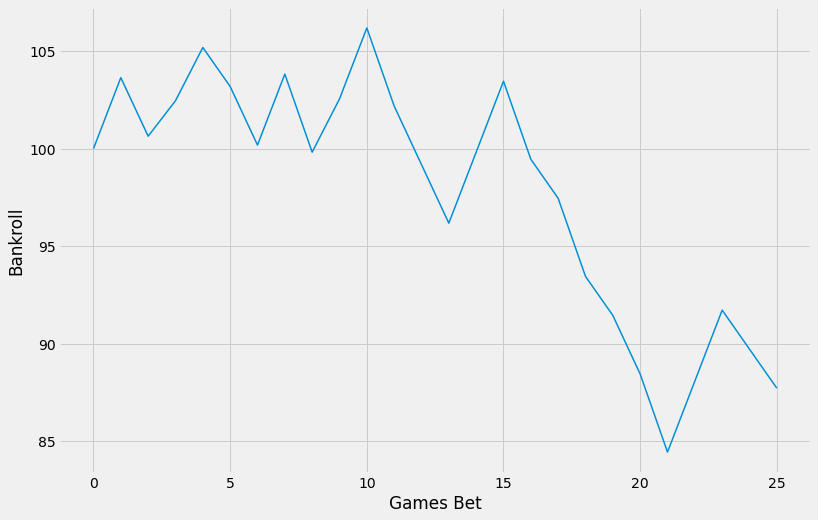

min balance: 83.72727272727276 
max balance: 106.1818181818182 
final balance: 83.72727272727276 
win percentage 38.46 
profit: -16.272727272727273 risk: 85.0 
ROI: -19.139999999999997

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.06226787404081285,
                                                                    max_iter=100000,
                                                                    random_state=23,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('svc',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('svc',
                                    

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.557895,475,0.079586,111.181818
1,"(2017, -, 2018)",0.53,0.512774,548,0.001232,2.090909
2,"(2018, -, 2019)",0.53,0.537155,471,0.033818,49.272727
3,"(2019, -, 2020)",0.53,0.489270,466,-0.061081,-85.818182
4,"(2020, -, 2021)",0.53,0.546512,258,0.068214,47.545455
5,"(2021, -, 2021)",0.53,0.384615,26,-0.191444,-16.272727


In [414]:
estimators = [('log', best_lr),
              ('svc', best_svc), ('lgbc', best_lgbc),
              ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


stacked_clf.fit(X_train, y_train)


print("stacked clf train_acc:", stacked_clf.score(X_train, y_train))
print("stacked clf test_acc:", stacked_clf.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

0
test set 1: 2016-11-04 - 2017-06-12


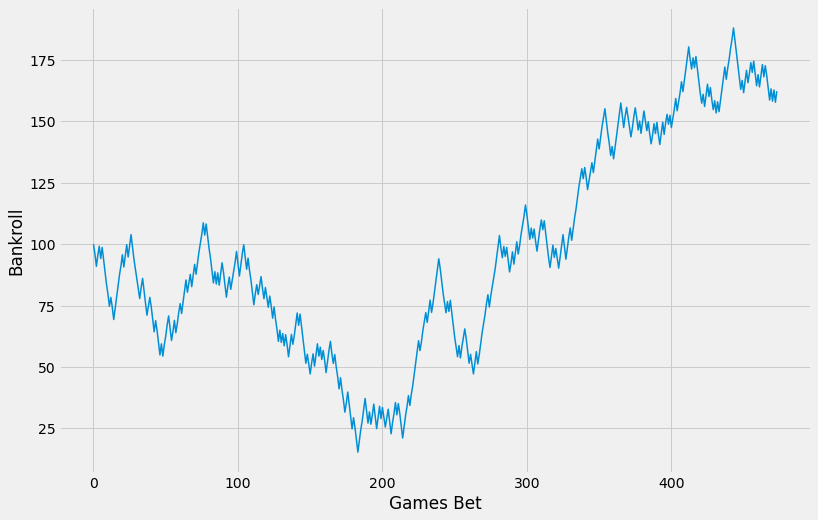

min balance: 15.36363636363648 
max balance: 188.09090909090864 
final balance: 157.36363636363575 
win percentage 53.800000000000004 
profit: 57.36363636363626 risk: 2203.0 
ROI: 2.6
1
test set 1: 2017-10-28 - 2018-06-08


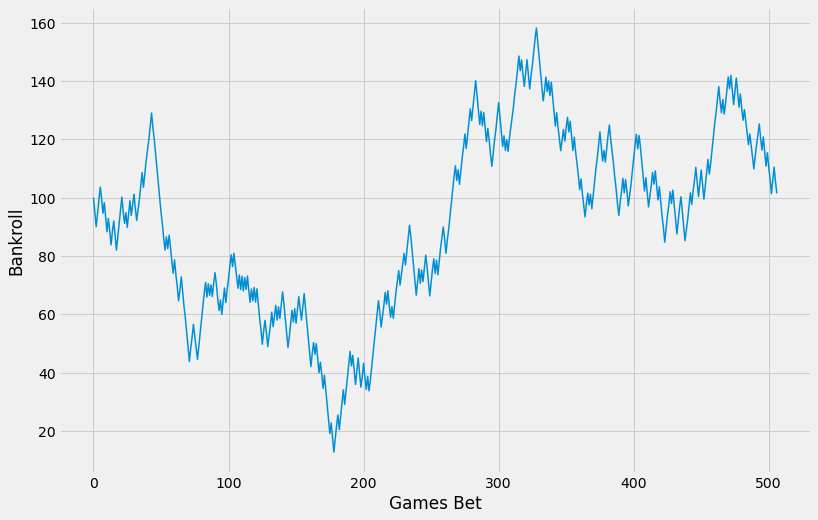

min balance: 12.727272727272808 
max balance: 158.18181818181813 
final balance: 97.45454545454537 
win percentage 52.27 
profit: -2.5454545454547315 risk: 2366.0 
ROI: -0.11
2
test set 1: 2018-10-26 - 2019-06-13


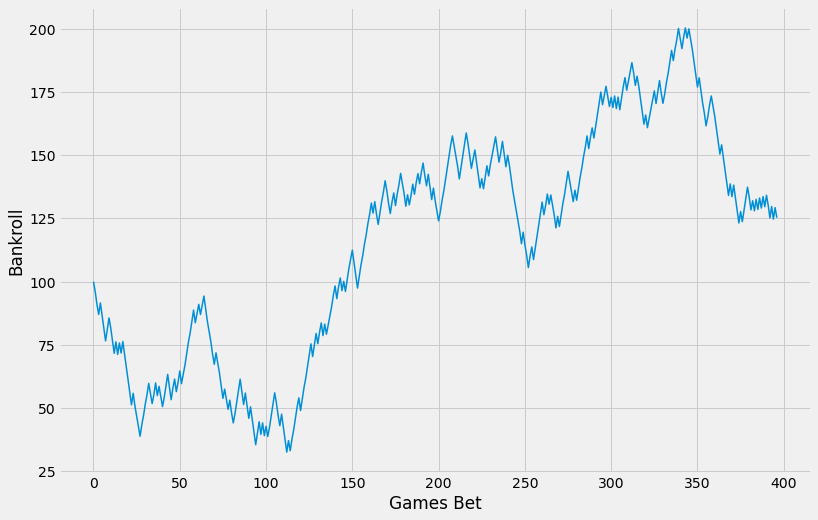

min balance: 32.545454545454554 
max balance: 200.3636363636354 
final balance: 128.90909090908974 
win percentage 52.900000000000006 
profit: 28.909090909090878 risk: 1821.0 
ROI: 1.59
3
test set 1: 2019-11-01 - 2020-10-11


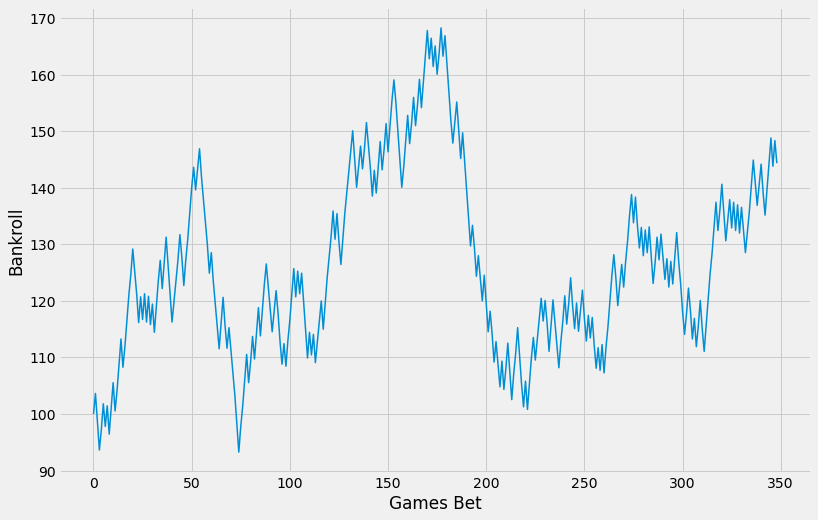

min balance: 93.27272727272727 
max balance: 168.27272727272694 
final balance: 147.9999999999994 
win percentage 54.15 
profit: 47.999999999999886 risk: 1590.0 
ROI: 3.02
4
test set 1: 2021-01-01 - 2021-07-20


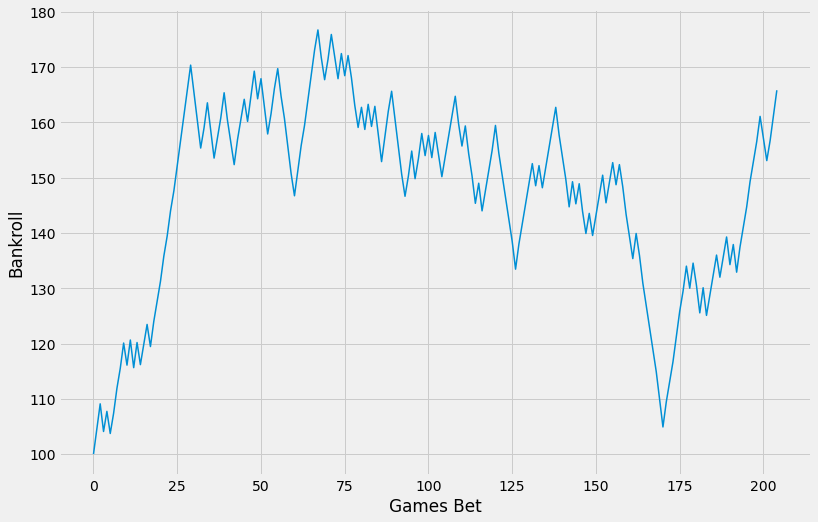

min balance: 103.72727272727273 
max balance: 176.7272727272724 
final balance: 170.36363636363532 
win percentage 56.589999999999996 
profit: 70.36363636363632 risk: 909.0 
ROI: 7.739999999999999

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.0011798799724438123,
                                                                    max_iter=10000,
                                                                    random_state=23,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                       

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.537975,474,0.026039,57.363636
1,"(2017, -, 2018)",0.53,0.522682,507,-0.001076,-2.545455
2,"(2018, -, 2019)",0.53,0.528967,397,0.015875,28.909091
3,"(2019, -, 2020)",0.53,0.541547,349,0.030189,48.000000
4,"(2021, -, 2021)",0.53,0.565854,205,0.077408,70.363636


In [113]:
estimators = [('log', best_lr), ('sgd', best_sgd),
              ('svc', best_svc), ('lgbc', best_lgbc), 
              ('rf', best_rf), ('knn', best_knn)]


stacked_clf = StackingClassifier(estimators = estimators, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


# stacked_clf2.fit(X_train, y_train)


# print("stacked clf train_acc:", stacked_clf2.score(X_train, y_train))
# print("stacked clf test_acc:", stacked_clf2.score(X_test, y_test))

cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21]

threshold = 0.53

for estimator in [stacked_clf]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [45]:
best_lr_acc = Pipeline(steps=[('scaler', StandardScaler()),
                ('logreg',
                 LogisticRegression(C=0.001258237256125393, max_iter=10000,
                                    random_state=22, solver='saga',
                                    verbose=1))])

best_svc_acc = Pipeline(steps=[('scaler', StandardScaler()),
                ('svc',
                 LinearSVC(C=0.003958061983606178, loss='hinge',
                           max_iter=100000, random_state=23))])

best_sgd_acc = Pipeline(steps=[('scaler', StandardScaler()),
                ('sgd',
                 SGDClassifier(alpha=0.1572381278512917, loss='modified_huber',
                               max_iter=10000, random_state=23))])

best_lgbc_acc = lgb.LGBMClassifier(feature_fraction=0.7796269937403173, max_depth=5,
               min_child_weight=7, num_leaves=16860, random_state=22,
               reg_alpha=3.571940784753475, reg_lambda=17.76958546447963)

best_knn_acc = Pipeline(steps=[('scaler', StandardScaler()),
                ('knn', KNeighborsClassifier(n_neighbors=24))])

best_rf_acc = RandomForestClassifier(max_depth=25,
                                min_samples_leaf=0.019764150817908317,
                                min_samples_split=0.10607525263857515,
                                random_state=22)

estimators2 = [('log', best_lr_acc), ('sgd', best_sgd_acc),
              ('svc', best_svc_acc), ('lgbc', best_lgbc_acc), 
              ('rf', best_rf_acc), ('knn', best_knn_acc)]


stacked_clf2 = StackingClassifier(estimators = estimators2, final_estimator = LogisticRegression(),
                                 n_jobs=-1, verbose=1)


# stacked_clf2.fit(X_train, y_train)


# print("stacked clf train_acc:", stacked_clf2.score(X_train, y_train))
# print("stacked clf test_acc:", stacked_clf2.score(X_test, y_test))


0
test set 1: 2016-10-27 - 2017-06-12


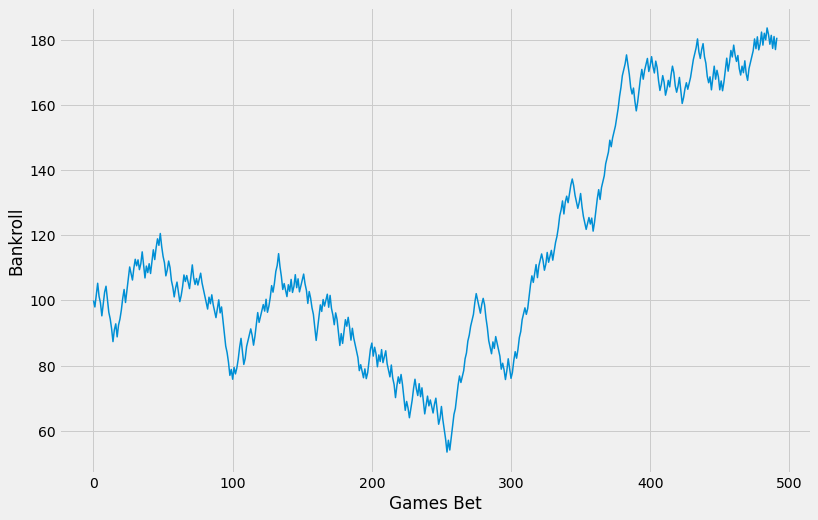

min balance: 53.45454545454565 
max balance: 183.63636363636323 
final balance: 177.6363636363632 
win percentage 54.269999999999996 
profit: 77.63636363636363 risk: 1463.0 
ROI: 5.3100000000000005
1
test set 1: 2017-10-20 - 2018-06-08


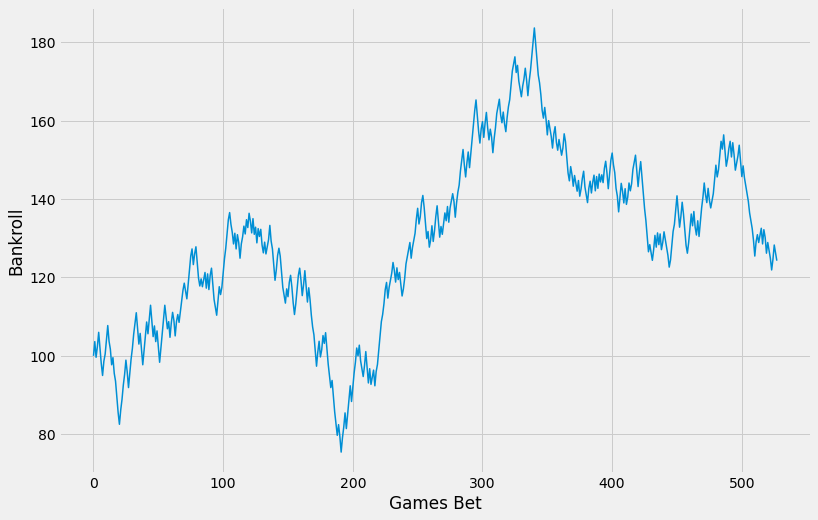

min balance: 75.45454545454551 
max balance: 183.63636363636328 
final balance: 122.27272727272629 
win percentage 52.839999999999996 
profit: 22.272727272727252 risk: 1673.0 
ROI: 1.3299999999999998
2
test set 1: 2018-10-19 - 2019-06-13


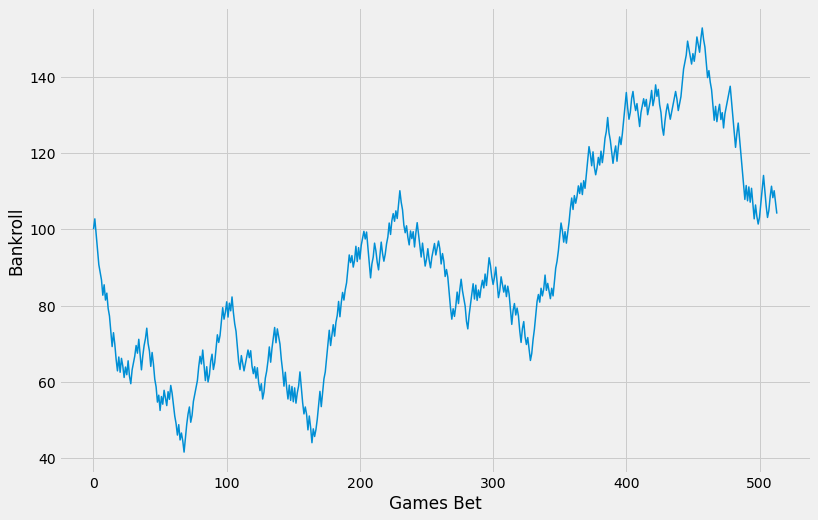

min balance: 41.63636363636366 
max balance: 152.72727272727272 
final balance: 106.81818181818178 
win percentage 52.14 
profit: 6.818181818181756 risk: 1572.0 
ROI: 0.43
3
test set 1: 2019-10-25 - 2020-10-11


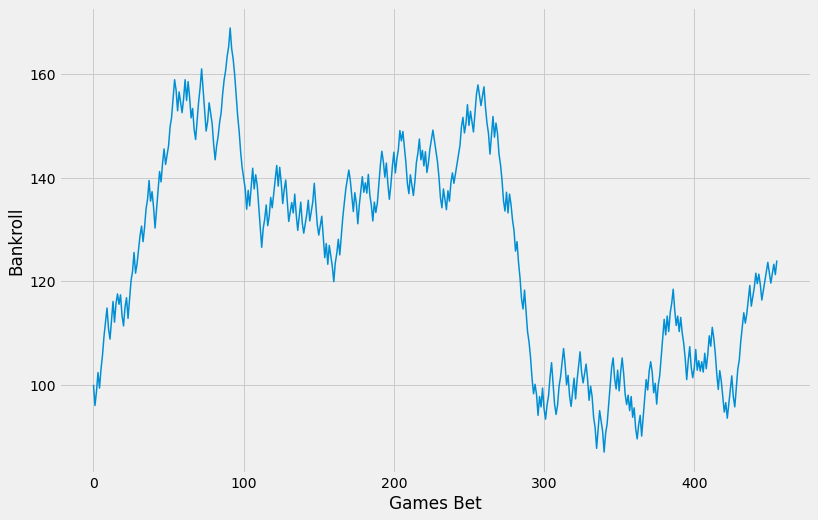

min balance: 86.99999999999913 
max balance: 168.90909090909065 
final balance: 125.81818181818102 
win percentage 53.290000000000006 
profit: 25.818181818181756 risk: 1385.0 
ROI: 1.8599999999999999
4
test set 1: 2020-12-25 - 2021-07-20


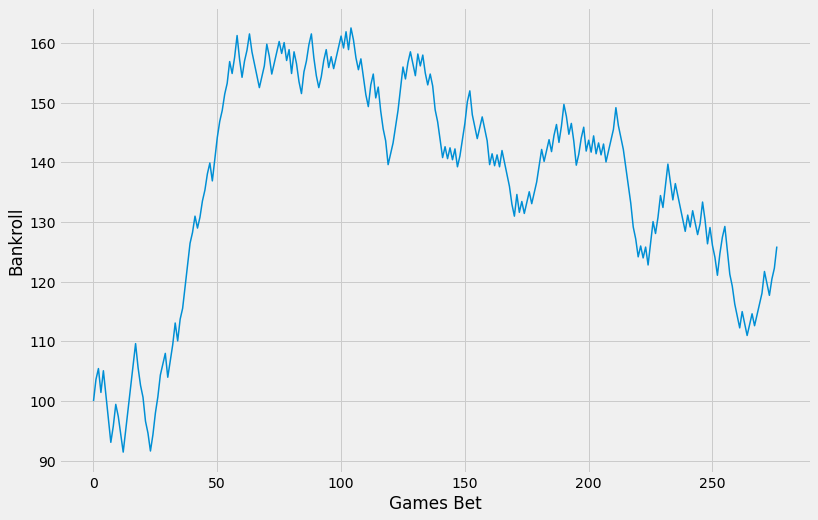

min balance: 91.45454545454547 
max balance: 162.54545454545433 
final balance: 128.63636363636297 
win percentage 53.06999999999999 
profit: 28.636363636363626 risk: 756.0 
ROI: 3.7900000000000005
5
test set 1: 2021-10-22 - 2021-12-18


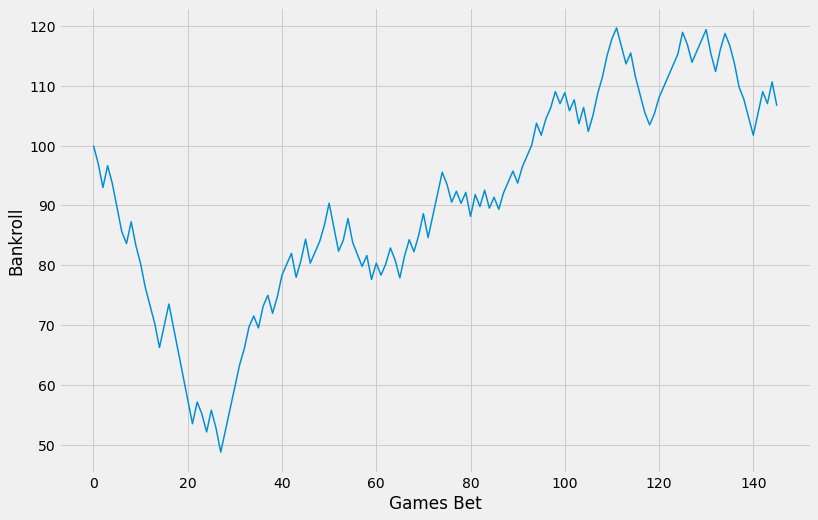

min balance: 48.81818181818183 
max balance: 119.6363636363637 
final balance: 104.63636363636368 
win percentage 53.42 
profit: 4.636363636363626 risk: 444.0 
ROI: 1.04

 StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('logreg',
                                                 LogisticRegression(C=0.001258237256125393,
                                                                    max_iter=10000,
                                                                    random_state=22,
                                                                    solver='saga',
                                                                    verbose=1))])),
                               ('sgd',
                                Pipeline(steps=[('scaler', StandardScaler()),
                                                ('sgd',
                                                 SG

,season,best_threshold,win_pcts,num_games_bet,rois,profits
0,"(2016, -, 2017)",0.53,0.542683,492,0.053067,77.636364
1,"(2017, -, 2018)",0.53,0.528409,528,0.013313,22.272727
2,"(2018, -, 2019)",0.53,0.521401,514,0.004337,6.818182
3,"(2019, -, 2020)",0.53,0.532895,456,0.018641,25.818182
4,"(2020, -, 2021)",0.53,0.530686,277,0.037879,28.636364
5,"(2021, -, 2021)",0.53,0.534247,146,0.010442,4.636364


In [47]:
cutoffs = [cutoff_16, cutoff_17, cutoff_18, cutoff_19, cutoff_20, cutoff_21, cutoff_22]

threshold = 0.53

for estimator in [stacked_clf2]:
    season = []
    win_pcts = []
    rois = []
    profits = []
    num_games_bet = []
    best_thresholds = []
    for i in range(len(cutoffs)-1):
        X_train1, X_test1, y_train1, y_test1, train_idx1, test_idx1 = split_prep_data(df_ewm_19_diffs, cutoffs[i])

        X_test1, y_test1, test_idx1 = (X_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       y_test1.loc[cutoffs[i]+1:cutoffs[i+1]], 
                                       X_test1.loc[cutoffs[i]+1:cutoffs[i+1]].index)

        print(i)
        print("test set 1:", np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='D'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='D'))

        year = (np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[0], unit='Y'), "-",
             np.datetime_as_string(df_ewm_19_diffs.loc[test_idx1, 'GAME_DATE'].values[-1], unit='Y'))


        estimator.fit(X_train1, y_train1)
        try:
            y_probs = estimator.predict_proba(X_test1)
        except:
            decisions = estimator.decision_function(X_test1)
            y_probs = 1 / (1 + np.exp(-decisions))
            y_probs = np.concatenate([np.zeros_like(y_probs).reshape(-1,1), y_probs.reshape(-1,1)], axis=1)
        
        betting_df = create_betting_df(df_ewm_19_diffs, y_probs, test_idx1)

        
        select_bets = betting_df.loc[~betting_df['prob_avg'].between(1-threshold, threshold)]
        
        selected_bets, roi, profit, win_pct = simulate_bets_3(select_bets)

        season.append(year)
        best_thresholds.append(threshold)
        win_pcts.append(win_pct)
        profits.append(profit)
        rois.append(roi)
        num_games_bet.append(selected_bets.shape[0])

    results_by_season = pd.DataFrame({
                                    'season':season,
                                    'best_threshold':best_thresholds,
                                     'win_pcts':win_pcts,
                                     'num_games_bet':num_games_bet,
                                     'rois':rois,
                                      'profits':profits
                                     })
    
    print('\n', estimator)
    print(results_by_season)

results_by_season

In [282]:
def add_elo_ratings(df, prev_season_final_elo):
    """This function will generate elo_ratings in the elo_df
    """
    df = df.copy()
    df = df.loc[df['HOME_GAME'] == 1]
    # Initialize the following columns

    df['home_elo_pred'] = np.nan

    df['home_rating_i'] = np.nan
    df['home_rating_n'] = np.nan

    df['away_rating_i'] = np.nan
    df['away_rating_n'] = np.nan

    elo_dic = prev_season_final_elo
    for team in elo_dic:
        elo_dic[team] = season_reset(elo_dic[team])
        
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
        home_team_abbr = row['MATCHUP'][:3]
        away_team_abbr = row['MATCHUP'][-3:]
        
        df.loc[idx, 'home_rating_i'] = elo_dic[home_team_abbr]
        df.loc[idx, 'away_rating_i'] = elo_dic[away_team_abbr]

        home_score = row['SCORE_team']
        away_score = home_score - row['point_diff_team']
        home_rating = elo_dic[home_team_abbr]
        away_rating = elo_dic[away_team_abbr]

        home_update, away_update = elo_update(home_score, away_score, home_rating, away_rating)

        df.loc[idx, 'home_rating_n'] = home_rating + home_update
        df.loc[idx, 'away_rating_n'] = away_rating + away_update
        df.loc[idx, 'home_elo_pred'] = elo_prediction(home_rating+100, away_rating)

    df['elo_MOV_pred'] = round((df['home_rating_i']+100 - df['away_rating_i'])/28, 2)

    return df

df_2020 = add_elo_ratings(df_2020, final_elo_2020)


progress:: 603it [00:00, 716.17it/s]


## Make Predictions

ETL Pipeline

### Update Date

In [42]:
from src.data.update_data import update_all_data


# connection = sqlite3.connect('../data/nba.db')
# update_all_data(connection, season=2021)
# connection.close()



In [43]:
from src.models.model_preparation import get_days_spreads
from src.models.model_preparation import get_days_moneylines

from datetime import datetime

In [44]:
def season_str(x):
    return str(x) + '-' + str(x+1)[-2:]

def load_current_season_team_data(conn, season):
    """Loads basic, advanced, and scoring boxscores 
    from sqlite db and merges them into one dataframe"""

    basic = pd.read_sql("SELECT * FROM team_basic_boxscores", conn)
    adv = pd.read_sql("SELECT * FROM team_advanced_boxscores", conn)
    scoring = pd.read_sql("SELECT * FROM team_scoring_boxscores", conn)

    temp = pd.merge(basic, adv, how='left', on=[
                    'GAME_ID', 'TEAM_ID'], suffixes=['', '_y'])
    df = pd.merge(temp, scoring, how='left', on=[
                  'GAME_ID', 'TEAM_ID'], suffixes=['', '_y'])

    df = df.drop(columns=['TEAM_NAME_y', 'TEAM_CITY',
                          'TEAM_ABBREVIATION_y',
                          'TEAM_CITY_y', 'MIN_y'])
    
    df = df.loc[df['SEASON'] == season_str(2021)]
            
    return df



In [59]:
X_train.columns

Index(['RECORD_team_diff', 'FG2M_team_diff', 'FG2A_team_diff',
       'FG3M_team_diff', 'FG3A_team_diff', 'FTM_team_diff', 'FTA_team_diff',
       'OREB_team_diff', 'DREB_team_diff', 'REB_team_diff', 'AST_team_diff',
       'STL_team_diff', 'BLK_team_diff', 'TOV_team_diff', 'PF_team_diff',
       'PTS_team_diff', 'PLUS_MINUS_team_diff', 'E_OFF_RATING_team_diff',
       'E_DEF_RATING_team_diff', 'E_NET_RATING_team_diff', 'POSS_team_diff',
       'PIE_team_diff', 'PTS_2PT_MR_team_diff', 'PTS_FB_team_diff',
       'PTS_OFF_TOV_team_diff', 'PTS_PAINT_team_diff', 'AST_2PM_team_diff',
       'AST_3PM_team_diff', 'UAST_2PM_team_diff', 'UAST_3PM_team_diff',
       'ATS_DIFF_team_diff', 'RECORD_opp_diff', 'FG2M_opp_diff',
       'FG2A_opp_diff', 'FG3M_opp_diff', 'FG3A_opp_diff', 'FTM_opp_diff',
       'FTA_opp_diff', 'OREB_opp_diff', 'DREB_opp_diff', 'REB_opp_diff',
       'AST_opp_diff', 'STL_opp_diff', 'BLK_opp_diff', 'TOV_opp_diff',
       'PF_opp_diff', 'PTS_opp_diff', 'PLUS_MINUS_opp_diff'

In [45]:
# connection = sqlite3.connect('../data/nba.db')
def load_current_season_betting_data(conn, season):
    season_string = season_str(season)
    spreads = pd.read_sql(f"SELECT * FROM spreads WHERE SEASON = '{season_string}'", conn)
    moneylines = pd.read_sql(f"SELECT * FROM moneylines WHERE SEASON = '{season_string}'", conn)
    conn.close()
    return spreads, moneylines



# create_matchups(df)
# get_team_and_opp_ewm(df, min_periods=5, alpha=0.1, adjust=True)


# connection.close()
# betting_data_21

In [46]:
def get_team_and_opp_ewm(df, min_periods=1, alpha=0.1, adjust=True):
    df = df.copy()

    df = df[['SEASON_team', 'TEAM_ID_team', 'TEAM_ABBREVIATION_team',
             'TEAM_NAME_team', 'GAME_ID', 'GAME_DATE_team', 'MATCHUP_team',
             'HOME_GAME_team', 'TEAM_SCORE_team', 'POINT_DIFF_team', 'WL_team',
             'ML_team', 'SPREAD_team', 'TEAM_COVERED_team', 'RECORD_team',
             'FG2M_team', 'FG2A_team',
             'FG3M_team', 'FG3A_team', 'FTM_team', 'FTA_team', 'OREB_team',
             'DREB_team', 'REB_team',
             'AST_team', 'STL_team', 'BLK_team', 'TOV_team', 'PF_team', 'PTS_team',
             'PLUS_MINUS_team', 'E_OFF_RATING_team', 'E_DEF_RATING_team',
             'E_NET_RATING_team', 'POSS_team', 'PIE_team', 'PTS_2PT_MR_team',
             'PTS_FB_team', 'PTS_OFF_TOV_team', 'PTS_PAINT_team', 'AST_2PM_team',
             'AST_3PM_team', 'UAST_2PM_team', 'UAST_3PM_team', 'ATS_DIFF_team',
             'RECORD_opp', 'FG2M_opp', 'FG2A_opp', 'FG3M_opp',
             'FG3A_opp', 'FTM_opp', 'FTA_opp', 'OREB_opp', 'DREB_opp', 'REB_opp',
             'AST_opp', 'STL_opp', 'BLK_opp',
             'TOV_opp', 'PF_opp', 'PTS_opp', 'PLUS_MINUS_opp', 'E_OFF_RATING_opp',
             'E_DEF_RATING_opp', 'E_NET_RATING_opp', 'POSS_opp', 'PIE_opp',
             'PTS_2PT_MR_opp', 'PTS_FB_opp', 'PTS_OFF_TOV_opp', 'PTS_PAINT_opp',
             'AST_2PM_opp', 'AST_3PM_opp', 'UAST_2PM_opp', 'UAST_3PM_opp',
             'ATS_DIFF_opp', 'TEAM_COVERED_opp']]

    team_dfs = []

    for team in df['TEAM_ABBREVIATION_team'].unique():
        team_df = df.loc[df['TEAM_ABBREVIATION_team'] == team].sort_values(
            'GAME_DATE_team')

        avg_spread = team_df['SPREAD_team'].shift(1).expanding().mean()

        avg_ml = team_df['ML_team'].shift(1).expanding().mean()

        record = team_df['RECORD_team'].shift(1).expanding().mean()

        ATS_rec = team_df['TEAM_COVERED_team'].shift(
            1).expanding().mean()

        ATS_avg_diff = team_df['ATS_DIFF_team'].shift(
            1).expanding().mean()

        records = pd.DataFrame({'WL_PCT': record,
                               'ATS_PCT': ATS_rec,
                                'AVG_SPREAD': avg_spread,
                                'AVG_ML': avg_ml,
                                'AVG_ATS_DIFF': ATS_avg_diff
                                })

        team_df.iloc[:, 14:] = team_df.iloc[:, 14:].shift(
            1).ewm(alpha=alpha, min_periods=min_periods).mean()

        team_df = pd.concat([team_df, records], axis=1)

        team_dfs.append(team_df)

    new_df = pd.concat(team_dfs)
    new_df = new_df.reset_index(drop=True)

    return new_df



In [47]:
from datetime import date
date.today()

datetime.date(2021, 11, 5)

In [48]:
def add_rest_days_for_model(df):
    df['REST'] = np.nan
    for team in df['TEAM_ABBREVIATION_team'].unique():
        team_df = df.loc[df['TEAM_ABBREVIATION_team'] == team].sort_values('GAME_DATE_team')
        idx = team_df.index
        team_df['rest'] = (team_df['GAME_DATE_team'].shift(-1) - team_df['GAME_DATE_team']) / np.timedelta64(1, 'D')
        team_df.at[max(idx), 'REST'] = (pd.to_datetime(date.today()) - team_df.at[max(idx), 'GAME_DATE_team']) / np.timedelta64(1, 'D')

        df.loc[idx, 'REST'] = team_df['REST']
            
    return df


Progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.14it/s]


In [49]:
def get_current_season_elo_ratings(df, prev_season_final_elo):
    """This function will generate elo_ratings in the elo_df
    """
    df = df.sort_values(['GAME_ID', 'HOME_GAME_team'])
    df = df.reset_index(drop=True)

    df['team_elo_pred'] = np.nan

    df['team_rating_i'] = np.nan
    df['team_rating_n'] = np.nan

    df['opp_rating_i'] = np.nan
    df['opp_rating_n'] = np.nan

    elo_dic = pd.Series(prev_season_final_elo.ELO.values, index=prev_season_final_elo.TEAM).to_dict()

    for team in elo_dic:
        elo_dic[team] = season_reset(elo_dic[team])
        
    for idx, row in tqdm(df.iterrows(), desc="progress:"):
                
        if (idx >= 1) and (row['GAME_ID'] == df.loc[idx-1, 'GAME_ID']):
            df.at[idx, 'team_rating_i'] = df.at[idx-1, 'opp_rating_i']
            df.at[idx, 'team_rating_n'] = df.at[idx-1, 'opp_rating_n']
            df.at[idx, 'opp_rating_i'] = df.at[idx-1, 'team_rating_i']
            df.at[idx, 'opp_rating_n'] = df.at[idx-1, 'team_rating_n']
            df.at[idx, 'team_elo_pred'] = 1 - df.at[idx-1, 'team_elo_pred']            
            continue
            
        team_abbr = row['MATCHUP_team'][:3]
        opp_abbr = row['MATCHUP_team'][-3:]   
        
        df.at[idx, 'team_rating_i'] = elo_dic[team_abbr]            
        df.at[idx, 'opp_rating_i'] = elo_dic[opp_abbr]
            

        team_score = row['TEAM_SCORE_team']
        opp_score = row['TEAM_SCORE_team'] - row['POINT_DIFF_team']
            
        team_rating = elo_dic[team_abbr]
        opp_rating = elo_dic[opp_abbr]

        if row['HOME_GAME_team'] == 1:
            team_rating_temp = team_rating + 69
            opp_rating_temp = opp_rating
        else:
            opp_rating_temp = opp_rating + 69
            team_rating_temp = team_rating
            
        team_update, opp_update = elo_update(team_score, opp_score, team_rating_temp, opp_rating_temp)

        df.at[idx, 'team_rating_n'] = team_rating + team_update
        df.at[idx, 'opp_rating_n'] = opp_rating + opp_update
        

        df.at[idx, 'team_elo_pred'] = elo_prediction(team_rating_temp, opp_rating_temp)

        elo_dic[team_abbr] = df.at[idx, 'team_rating_n']
        elo_dic[opp_abbr] = df.at[idx, 'opp_rating_n']

    df['elo_MOV_pred'] = round((df['team_rating_i'] - df['opp_rating_i'])/28, 2)
    

    return elo_dic, df


# final_elo_2020 = pd.read_csv("../data/final_elo_ratings_2020")
# current_elo, team_avgs_21 = get_current_season_elo_ratings(team_avgs_21, final_elo_2020)


In [50]:
X_train

,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,SPREAD_team,ML_team
15450,-0.473684,-3.473684,10.105263,-3.473684,-1.684211,-0.263158,-2.789474,10.052632,3.526316,13.578947,-8.473684,1.578947,-0.368421,2.526316,-5.263158,-17.631579,-21.000000,-17.952632,1.868421,-20.021053,-0.578947,-0.186789,-8.894737,-11.210526,-4.421053,3.947368,-6.473684,-1.000000,3.000000,-1.473684,-17.078947,0.473684,5.315789,13.421053,-0.578947,-3.263158,-5.526316,-12.526316,0.947368,4.368421,5.315789,1.789474,0.473684,1.894737,-2.000000,2.526316,3.368421,21.000000,1.868421,-17.952632,20.021053,-1.052632,0.186789,13.631579,-7.789474,0.789474,-3.473684,1.368421,0.894737,3.947368,-0.473684,17.078947,0.473684,-0.500000,-0.500000,3.750000,0.100000,-18.750000,0.0,0.105546,0.005911,-0.005911,-0.105546,0.039250,-0.039250,-0.141239,-0.040183,-0.145935,-0.012494,-8.968637,2.131283,0.963801,-2.567630,0.391082,1521.155095,1529.071843,-0.28,6.0,3.000000
15451,0.473684,3.473684,-10.105263,3.473684,1.684211,0.263158,2.789474,-10.052632,-3.526316,-13.578947,8.473684,-1.578947,0.368421,-2.526316,5.263158,17.631579,21.000000,17.952632,-1.868421,20.021053,0.578947,0.186789,8.894737,11.210526,4.421053,-3.947368,6.473684,1.000000,-3.000000,1.473684,17.078947,-0.473684,-5.315789,-13.421053,0.578947,3.263158,5.526316,12.526316,-0.947368,-4.368421,-5.315789,-1.789474,-0.473684,-1.894737,2.000000,-2.526316,-3.368421,-21.000000,-1.868421,17.952632,-20.021053,1.052632,-0.186789,-13.631579,7.789474,-0.789474,3.473684,-1.368421,-0.894737,-3.947368,0.473684,-17.078947,-0.473684,0.500000,0.500000,-3.750000,-0.100000,18.750000,0.0,-0.105546,-0.005911,0.005911,0.105546,-0.039250,0.039250,0.141239,0.040183,0.145935,0.012494,8.968637,-2.131283,-0.963801,2.567630,0.608918,1529.071843,1521.155095,0.28,-6.0,1.416667
15466,0.000000,-0.157895,10.368421,2.210526,4.736842,0.526316,4.157895,6.315789,-1.578947,4.736842,-5.526316,3.000000,-1.000000,0.421053,7.421053,6.842105,3.315789,-4.731579,-6.742105,2.010526,11.157895,0.012316,-12.947368,-0.684211,11.789474,13.684211,-7.736842,1.210526,8.052632,0.526316,2.684211,0.000000,-5.210526,-7.052632,2.736842,4.315789,5.736842,9.947368,1.736842,3.105263,4.842105,-2.421053,-1.789474,5.947368,10.157895,12.789474,3.526316,-3.315789,-6.742105,-4.731579,-2.010526,10.578947,-0.012316,-2.052632,12.315789,-0.105263,-7.894737,-6.157895,3.736842,1.421053,-1.000000,-2.684211,0.000000,0.000000,0.000000,-0.500000,0.169173,3.000000,0.0,0.060109,0.039584,-0.039584,-0.060109,-0.004256,0.004256,-0.054687,0.023447,-0.039900,0.002564,-8.046636,-5.072746,-1.403968,7.570102,0.315918,1530.439816,1595.653060,-2.33,8.0,3.800

In [51]:
def create_matchup_rows_for_model(df, home_team, away_team, home_spread, away_spread,
                                  home_ml, away_ml):
    df = df.copy(deep=True)
    df.rename(columns={'SEASON_team':'SEASON',
                      'TEAM_ID_team':'TEAM_ID',
                      'TEAM_ABBREVIATION_team':'TEAM_ABBREVIATION',
                      'GAME_DATE_team':'GAME_DATE',
                      'MATCHUP_team':'MATCHUP',
                      'HOME_GAME_team':'HOME_GAME',
                       'TEAM_SCORE_team':'SCORE_team'}, inplace=True)
    
    df = df.sort_values(['GAME_ID', 'HOME_GAME'])
    
    home_stats = df.loc[df['TEAM_ABBREVIATION'] == home_team].reset_index(drop=True)
    away_stats = df.loc[df['TEAM_ABBREVIATION'] == away_team].reset_index(drop=True)

    home_diffs = home_stats.iloc[-1, 14:-6] - away_stats.iloc[-1, 14:-6]
    home_diffs = home_diffs.values.reshape(1, -1)    
#     home_diffs = np.concatenate([home_diffs, home_stats.iloc[-1, -6:].values.reshape(1, -1)], axis=1)

    away_diffs = away_stats.iloc[-1, 14:-6] - home_stats.iloc[-1, 14:-6]
    away_diffs = away_diffs.values.reshape(1, -1)
#     away_diffs = np.concatenate([away_diffs, away_stats.iloc[-1, -6:].values.reshape(1, -1)], axis=1)
    
    diffs = np.concatenate([home_diffs, away_diffs], axis=0)
    
    new_cols = [col+"_diff" for col in home_stats.columns[14:-6]]
#     new_cols.extend(home_stats.columns[-6:])
    
    diffs = pd.DataFrame(diffs, columns=new_cols)
    
    home_rating_i = home_stats.iloc[-1, -5]
    away_rating_i = away_stats.iloc[-1, -5]
    
    diffs['team_rating_i'] = np.nan
    diffs['opp_rating_i'] = np.nan
    
    diffs.at[0, 'team_rating_i'] = home_rating_i
    diffs.at[0, 'opp_rating_i'] = away_rating_i
    
    diffs.at[1, 'team_rating_i'] = away_rating_i
    diffs.at[1, 'opp_rating_i'] = home_rating_i
    
    diffs.at[0, 'team_elo_pred'] = elo_prediction(home_rating_i+69, away_rating_i)
    diffs.at[1, 'team_elo_pred'] = elo_prediction(away_rating_i, home_rating_i+69)

    diffs['elo_MOV_pred'] = np.nan
    diffs.at[0, 'elo_MOV_pred'] = round((home_rating_i + 69 - away_rating_i)/28, 2)
    diffs.at[1, 'elo_MOV_pred'] = round((away_rating_i - (home_rating_i + 69))/28, 2)

    diffs['SPREAD_team'] = np.nan
    diffs['ML_team'] = np.nan
    
    diffs.at[0, 'SPREAD_team'] = home_spread
    diffs.at[1, 'SPREAD_team'] = away_spread 
    
    diffs.at[0, 'ML_team'] = home_ml
    diffs.at[1, 'ML_team'] = away_ml
    
    diffs = diffs[X_train.columns].astype(float)
    
    return diffs


In [52]:
todays_date = datetime.today().strftime('%Y-%m-%d')

todays_spreads = get_days_spreads(todays_date)
todays_spreads = clean_spreads_df(todays_spreads)

todays_mls = get_days_moneylines(todays_date)
todays_mls = clean_moneyline_df(todays_mls)

todays_lines = pd.concat([todays_spreads, todays_mls.iloc[:, -2:]], axis=1)
todays_lines

,GM_DATE,AWAY_TEAM,HOME_TEAM,AWAY_SPREAD,HIGHEST_HOME_SPREAD,HIGHEST_AWAY_SPREAD,HIGHEST_HOME_ML,HIGHEST_AWAY_ML
0,2021-11-05,SAS,ORL,"-3½-110,-,-3½-112,-3½-118",3.5,-3.5,2.400000,1.625000
1,2021-11-05,BKN,DET,"-10-110,-,-10-110,-10½-105",10.5,-10.5,4.900000,1.188679
2,2021-11-05,MEM,WAS,"+2-110,-,+1-112,+2-110",-2.0,2.0,1.740741,2.150000
3,2021-11-05,NYK,MIL,"+4-110,-,+5-110,+6-165",-6.0,6.0,1.512821,2.600000
4,2021-11-05,CLE,TOR,"+5½-110,-,+6-110,+7½-175",-7.5,7.5,1.425532,2.880000
5,2021-11-05,LAC,MIN,"-2½-110,-,-3-112,-3-105",3.0,-3.0,2.200000,1.675676
6,2021-11-05,NOP,GSW,"+9½-110,-,+9-110,+10½-130",-9.5,10.5,1.216920,4.500000
7,2021-11-05,CHA,SAC,"+2-110,-,+1½-110,+2-110",-2.0,2.0,1.769231,2.100000
8,2021-11-05,IND,POR,"+5-110,-,+3½-109,+5-110",-5.0,5.0,1.465116,2.750000


In [266]:
web = 'https://sportsbook.draftkings.com/leagues/basketball/88670846?category=game-lines&subcategory=game'
path = '../chromedriver.exe'
driver = webdriver.Chrome(path)
driver.get(web)
sleep(2)

teams = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/th/a/div/div[2]/span/div/div')
# spreads = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[4]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/td[1]/div/div/div/div[1]/span')
# moneylines = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[4]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/td[3]/div/div/div/div/div[2]/span')
'//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr[2]/th/a/div/div[2]/span/div/div'
'//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[2]/table/tbody/tr[1]/th/a/div/div[2]/span/div/div'
print(teams)

[<selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="34c60737-5559-4c32-b1bb-42d216f62890")>, <selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="9f92e776-9696-4619-a38f-4e6eb87d0eba")>, <selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="d0c49169-3ec3-48b2-99d9-5e02252f94f5")>, <selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="fff650d2-dbec-4e62-8909-31b986a80f0d")>, <selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="bd17e55b-36e8-46ea-88c3-37dd8dbbdb72")>, <selenium.webdriver.remote.webelement.WebElement (session="51cb8c8200357702058f8b67b406041a", element="606ad022-0e8e-48bb-b8b2-424f2b325840")>]


In [268]:
from selenium import webdriver
from time import sleep

def get_draftking_lines(date):
    """
    INPUTS
    date: "yyyy-mm-dd"
    OUPUTS 
    dataframe with game spreads
    """
    gm_dates = []
    away_teams = []
    home_teams = []
    away_spreads = []
    home_spreads = []
    away_moneylines = []
    home_moneylines = []

    web = 'https://sportsbook.draftkings.com/leagues/basketball/88670846?category=game-lines&subcategory=game'
    path = '../chromedriver.exe'
    driver = webdriver.Chrome(path)
    driver.get(web)
    sleep(2)
    
    teams = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/th/a/div/div[2]/span/div/div')
    spreads = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/td[1]/div/div/div/div[1]/span')
    moneylines = driver.find_elements_by_xpath('//*[@id="root"]/section/section[2]/section/div[3]/div/div[3]/div/div/div[2]/div/div[2]/div[1]/table/tbody/tr/td[3]/div/div/div/div/div[2]/span')

    print(len(teams), len(spreads), len(moneylines))
    
    for i in range(len(teams)):
        if i%2==0:
            away_teams.append(teams[i].text)
            away_spreads.append(spreads[i].text)
            away_moneylines.append(moneylines[i].text)
            gm_dates.append(date)
        else:
            home_teams.append(teams[i].text)
            home_spreads.append(spreads[i].text)
            home_moneylines.append(moneylines[i].text)    

#     driver.quit()

    todays_lines = pd.DataFrame({"game_date":gm_dates,
                'away_team':away_teams,
                'home_team':home_teams,
                'away_spread':away_spreads,
                'home_spread':home_spreads,
                'away_moneyline':away_moneylines,
                'home_moneyline':home_moneylines})
    
    return todays_lines


get_draftking_lines('2021-11-09')

6 6 6


,game_date,away_team,home_team,away_spread,home_spread,away_moneyline,home_moneyline
0,2021-11-09,MIL Bucks,PHI 76ers,-6.5,+6.5,-260,+210
1,2021-11-09,ATL Hawks,UTA Jazz,+8,-8,+280,-365
2,2021-11-09,POR Trail Blazers,LA Clippers,+3,-3,+125,-145


In [258]:
from src.models.model_preparation import get_draftking_lines, clean_draftking_lines

todays_date = datetime.today().strftime('%Y-%m-%d')


todays_lines = get_draftking_lines(todays_date)

# todays_lines = clean_draftking_lines(todays_lines)

todays_lines

,game_date,away_team,home_team,away_spread,home_spread,away_moneyline,home_moneyline


In [255]:
todays_lines

,game_date,away_team,home_team,away_spread,home_spread,away_moneyline,home_moneyline


### Make Predictions

In [54]:
clean_data = pd.read_csv("../data/clean/processed_data.csv")

clean_data



,ML_team,SPREAD_team,TEAM_COVERED_team,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred
0,3.000000,6.0,1,-0.473684,-3.473684,10.105263,-3.473684,-1.684211,-0.263158,-2.789474,10.052632,3.526316,13.578947,-8.473684,1.578947,-0.368421,2.526316,-5.263158,-17.631579,-21.000000,-17.952632,1.868421,-20.021053,-0.578947,-0.186789,-8.894737,-11.210526,-4.421053,3.947368,-6.473684,-1.000000,3.000000,-1.473684,-17.078947,0.473684,5.315789,13.421053,-0.578947,-3.263158,-5.526316,-12.526316,0.947368,4.368421,5.315789,1.789474,0.473684,1.894737,-2.000000,2.526316,3.368421,21.000000,1.868421,-17.952632,20.021053,-1.052632,0.186789,13.631579,-7.789474,0.789474,-3.473684,1.368421,0.894737,3.947368,-0.473684,17.078947,0.473684,-0.50,-0.5,3.750,0.100000,-18.750,0.0,0.105546,0.005911,-0.005911,-0.105546,0.039250,-0.039250,-0.141239,-0.040183,-0.145935,-0.012494,-8.968637,2.131283,0.963801,-2.567630,0.391082,1521.155095,1529.071843,-0.28
1,1.416667,-6.0,0,0.473684,3.473684,-10.105263,3.473684,1.684211,0.263158,2.789474,-10.052632,-3.526316,-13.578947,8.473684,-1.578947,0.368421,-2.526316,5.263158,17.631579,21.000000,17.952632,-1.868421,20.021053,0.578947,0.186789,8.894737,11.210526,4.421053,-3.947368,6.473684,1.000000,-3.000000,1.473684,17.078947,-0.473684,-5.315789,-13.421053,0.578947,3.263158,5.526316,12.526316,-0.947368,-4.368421,-5.315789,-1.789474,-0.473684,-1.894737,2.000000,-2.526316,-3.368421,-21.000000,-1.868421,17.952632,-20.021053,1.052632,-0.186789,-13.631579,7.789474,-0.789474,3.473684,-1.368421,-0.894737,-3.947368,0.473684,-17.078947,-0.473684,0.50,0.5,-3.750,-0.100000,18.750,0.0,-0.105546,-0.005911,0.005911,0.105546,-0.039250,0.039250,0.141239,0.040183,0.145935,0.012494,8.968637,-2.131283,-0.963801,2.567630,0.608918,1529.071843,1521.155095,0.28
2,3.800000,8.0,0,0.000000,-0.157895,10.368421,2.210526,4.736842,0.526316,4.157895,6.315789,-1.578947,4.736842,-5.526316,3.000000,-1.000000,0.421053,7.421053,6.842105,3.315789,-4.731579,-6.742105,2.010526,11.157895,0.012316,-12.947368,-0.684211,11.789474,13.684211,-7.736842,1.210526,8.052632,0.526316,2.684211,0.000000,-5.210526,-7.052632,2.736842,4.315789,5.736842,9.947368,1.736842,3.105263,4.842105,-2.421053,-1.789474,5.947368,10.157895,12.789474,3.526316,-3.315789,-6.742105,-4.731579,-2.010526,10.578947,-0.012316,-2.052632,12.315789,-0.105263,-7.894737,-6.157895,3.736842,1.421053,-1.000000,-2.684211,0.000000,0.00,0.0,-0.500,0.169173,3.000,0.0,0.060109,0.039584,-0.039584,-0.060109,-0.004256,0.004256,-0.054687,0.023447,-0.039900,0.002564,-8.046636,-5.072746,-1.403968,7.570102,0.315918,1530.439816,1595.653060,-2.33
3,1.277778,-8.0,1,0.000000,0.

In [55]:
def make_predictions(model, df):
    todays_date = datetime.today().strftime('%Y-%m-%d')

    todays_lines = get_draftking_lines(todays_date)
    todays_lines = clean_draftking_lines(todays_lines)

    game_dates = []
    home_teams = []
    away_teams = []
    home_spreads = []
    home_cover_probs = []
    away_cover_probs = []

    for idx, row in todays_lines.iterrows():
        home_team = row['home_team']
        away_team = row['away_team']
        home_spread = row['home_spread'] 
        away_spread = row['away_spread']
        home_ml = row['home_moneyline']
        away_ml = row['away_moneyline']
        game_date = row['game_date']
        matchup = create_matchup_rows_for_model(df, home_team, away_team,
                                                home_spread, away_spread, home_ml, away_ml)

        probs = model.predict_proba(matchup)

        game_dates.append(game_date)
        home_teams.append(home_team)
        away_teams.append(away_team)
        home_cover_probs.append(probs[0, 1])
        away_cover_probs.append(probs[1, 1])
        home_spreads.append(home_spread)

    todays_predictions = pd.DataFrame({'game_date':game_dates,
                                      'home_team':home_teams,
                                      'away_team':away_teams,
                                       'home_spread':home_spreads,
                                      'home_cover_probs':home_cover_probs,
                                      'away_cover_probs':away_cover_probs})

    todays_predictions['home_cover_avg'] = (todays_predictions['home_cover_probs'] 
                                            + (1-todays_predictions['away_cover_probs']))/2
    return todays_predictions

In [65]:
final_stacked_clf

StackingClassifier(estimators=[('log',
                                Pipeline(steps=[('selector',
                                                 ColumnTransformer(transformers=[('selector',
                                                                                  'passthrough',
                                                                                  ['RECORD_team_diff',
                                                                                   'FG2M_team_diff',
                                                                                   'FG2A_team_diff',
                                                                                   'STL_team_diff',
                                                                                   'TOV_team_diff',
                                                                                   'E_OFF_RATING_team_diff',
                                                                                   'E_NET_RATIN

In [48]:
final_stacked_clf = joblib.load('../models/finalized_stacked_model_sfs')

X_full = pd.concat([X_train, X_test])
y_full = pd.concat([y_train, y_test])

X_full.shape, y_full.shape

final_stacked_clf.fit(X_full, y_full)


filename = '../models/finalized_stacked_model_retrain-21-12-20'

joblib.dump(final_stacked_clf, filename)

['../models/finalized_stacked_model_retrain-21-12-20']

In [174]:
final_stacked_model = joblib.load('../models/finalized_stacked_model_sfs')

prev_season_elo = pd.read_csv("../data/clean/final_elo_ratings_2020.csv")

In [51]:
X_full = pd.concat([X_train, X_test])
y_full = pd.concat([y_train, y_test])

X_full.shape, y_full.shape

stacked_clf2.fit(X_full, y_full)

filename = '../models/final_stacked_clf_v2-21-12-20'

joblib.dump(stacked_clf2, filename)

['../models/final_stacked_clf_v2-21-12-20']

In [57]:
def main(conn, season, model, prev_season_elo, append = True):
    update_all_data(conn, season=season)

    df = load_current_season_team_data(conn, season)

    df = clean_team_data(df)

    df = prep_for_aggregation(df)

    spreads, moneylines = load_current_season_betting_data(conn, 2021)
    clean_moneylines = clean_moneyline_df(df=moneylines)
    clean_spreads = clean_spreads_df(df=spreads)


    full_df = merge_betting_and_boxscore_data(clean_spreads, clean_moneylines, df)
    full_df = create_matchups(full_df)
    full_df = get_team_and_opp_ewm(full_df)

    full_df = add_percentage_features(full_df)
    full_df = add_rest_days_for_model(full_df)

    current_elo, full_df = get_current_season_elo_ratings(full_df, prev_season_elo)
    
    todays_predictions = make_predictions(model, full_df)
    
    if append == True:
        todays_predictions.to_csv("../results/predictions_2021.csv", mode='a', header=False, index=False)  
    
    return todays_predictions



In [58]:
connection = sqlite3.connect('../data/nba.db')

prev_season_elo = pd.read_csv("../data/clean/final_elo_ratings_2020.csv")
todays_predictions = main(connection, 2021, final_stacked_model, prev_season_elo, append=True)

connection.close()

todays_predictions

progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:09<00:00,  9.30s/it]
progress:: 246it [00:00, 5234.18it/s]


,game_date,home_team,away_team,home_spread,home_cover_probs,away_cover_probs,home_cover_avg
0,2021-11-05,ORL,SAS,3.5,0.488947,0.511076,0.488935
1,2021-11-05,WAS,MEM,-2.0,0.469567,0.529852,0.469857
2,2021-11-05,DET,BKN,9.5,0.584176,0.415521,0.584328
3,2021-11-05,TOR,CLE,-5.5,0.545707,0.453990,0.545859
4,2021-11-05,MIL,NYK,-3.5,0.539298,0.458778,0.540260
5,2021-11-05,MIN,LAC,2.5,0.483033,0.516645,0.483194
6,2021-11-05,SAC,CHA,-2.0,0.488880,0.510569,0.489155
7,2021-11-05,POR,IND,-5.0,0.490277,0.509095,0.490591
8,2021-11-05,GSW,NOP,-9.0,0.463747,0.536113,0.463817


In [252]:
season = 2021
home_team = 'PHI'
away_team = 'NYK'
home_spread = -3.5
away_spread = -home_spread
home_ml = 1.63
away_ml = 2.4

conn = sqlite3.connect('../data/nba.db')

# update_all_data(conn, season=season)

df = load_current_season_team_data(conn, season)

df = clean_team_data(df)

df = prep_for_aggregation(df)

spreads, moneylines = load_current_season_betting_data(conn, 2021)
clean_moneylines = clean_moneyline_df(df=moneylines)
clean_spreads = clean_spreads_df(df=spreads)


full_df = merge_betting_and_boxscore_data(clean_spreads, clean_moneylines, df)
full_df = create_matchups(full_df)
full_df = get_team_and_opp_ewm(full_df)

full_df = add_percentage_features(full_df)
full_df = add_rest_days_for_model(full_df)

current_elo, full_df = get_current_season_elo_ratings(full_df, prev_season_elo)

matchup = create_matchup_rows_for_model(full_df, home_team, away_team,
                                        home_spread, away_spread, home_ml, away_ml)

conn.close()

# print(matchup)

# full_df
matchup



Progress: 100%|██████████████████████████████████████████████████████████████████████████| 1/1 [00:00<00:00,  1.09it/s]
progress:: 302it [00:00, 4252.70it/s]


,RECORD_team_diff,FG2M_team_diff,FG2A_team_diff,FG3M_team_diff,FG3A_team_diff,FTM_team_diff,FTA_team_diff,OREB_team_diff,DREB_team_diff,REB_team_diff,AST_team_diff,STL_team_diff,BLK_team_diff,TOV_team_diff,PF_team_diff,PTS_team_diff,PLUS_MINUS_team_diff,E_OFF_RATING_team_diff,E_DEF_RATING_team_diff,E_NET_RATING_team_diff,POSS_team_diff,PIE_team_diff,PTS_2PT_MR_team_diff,PTS_FB_team_diff,PTS_OFF_TOV_team_diff,PTS_PAINT_team_diff,AST_2PM_team_diff,AST_3PM_team_diff,UAST_2PM_team_diff,UAST_3PM_team_diff,ATS_DIFF_team_diff,RECORD_opp_diff,FG2M_opp_diff,FG2A_opp_diff,FG3M_opp_diff,FG3A_opp_diff,FTM_opp_diff,FTA_opp_diff,OREB_opp_diff,DREB_opp_diff,REB_opp_diff,AST_opp_diff,STL_opp_diff,BLK_opp_diff,TOV_opp_diff,PF_opp_diff,PTS_opp_diff,PLUS_MINUS_opp_diff,E_OFF_RATING_opp_diff,E_DEF_RATING_opp_diff,E_NET_RATING_opp_diff,POSS_opp_diff,PIE_opp_diff,PTS_2PT_MR_opp_diff,PTS_FB_opp_diff,PTS_OFF_TOV_opp_diff,PTS_PAINT_opp_diff,AST_2PM_opp_diff,AST_3PM_opp_diff,UAST_2PM_opp_diff,UAST_3PM_opp_diff,ATS_DIFF_opp_diff,TEAM_COVERED_opp_diff,WL_PCT_diff,ATS_PCT_diff,AVG_SPREAD_diff,AVG_ML_diff,AVG_ATS_DIFF_diff,REST_diff,OREB_PCT_team_diff,OREB_PCT_opp_diff,DREB_PCT_team_diff,DREB_PCT_opp_diff,REB_PCT_team_diff,REB_PCT_opp_diff,TS_PCT_team_diff,TS_PCT_opp_diff,EFG_PCT_team_diff,EFG_PCT_opp_diff,AST_RATIO_team_diff,AST_RATIO_opp_diff,TOV_PCT_team_diff,TOV_PCT_opp_diff,team_elo_pred,team_rating_i,opp_rating_i,elo_MOV_pred,SPREAD_team,ML_team
0,0.191429,1.883769,-2.094435,-0.868121,-3.634469,-2.079347,-4.079287,-3.265783,-2.941833,-6.207616,2.753823,1.078525,0.288991,0.151442,-0.704736,-0.916174,5.709049,3.576027,-2.498517,6.067068,-3.392226,0.041716,5.346688,4.618637,1.995745,-1.564661,2.680602,0.011148,-0.950956,-0.966947,5.590394,-0.191429,2.94886,6.333187,-3.606687,-9.412599,-1.702881,-1.044593,1.711041,-2.619082,-0.908041,-2.225936,-0.261523,-1.420244,1.240846,-3.153631,-6.625223,-5.709049,-2.498517,3.576027,-6.067068,-3.317012,-0.041716,2.345727,-1.308026,1.258027,3.694851,2.178997,-4.203825,0.991237,0.556521,-5.590394,-0.203329,0.111111,0.111111,0.5,0.165704,4.944444,1.0,-0.044181,0.044697,-0.044697,0.044181,-0.03019,0.03019,0.039959,-0.015547,0.043572,-0.010292,3.636208,-1.454337,0.996098,1.377422,0.713604,1649.650933,1560.055125,5.66,-3.5,1.63
1,-0.191429,-1.883769,2.094435,0.868121,3.634469,2.079347,4.079287,3.265783,2.941833,6.207616,-2.753823,-1.078525,-0.288991,-0.151442,0.704736,0.916174,-5.709049,-3.576027,2.498517,-6.067068,3.392226,-0.041716,-5.346688,-4.618637,-1.995745,1.564661,-2.680602,-0.011148,0.950956,0.966947,-5.590394,0.191429,-2.94886,-6.333187,3.606687,9.412599,1.702881,1.044593,-1.711041,2.619082,0.908041,2.225936,0.261523,1.420244,-1.240846,3.153631,6.625223,5.709049,2.498517,-3.576027,6.067068,3.317012,0.041716,-2.345727,1.308026,-1.258027,-3.694851,-2.178997,4.203825,-0.991237,-0.556521,5.590394,0.203329,-0.111111,-0.111111,-0.5,-0.165704,-4.944444,-1.0,0.044181,-0.044697,0.044697,-0.044181,0.03019,-0.03019,-0.039959,0.015547,-0.043572,0.010292,-3.636208,1.454337,-0.996098,-1.377422,0.286396,1560.055125,1649.650933,-5.66,3.5,2.40


In [171]:
final_stacked_model.predict_proba(matchup)

array([[0.44918038, 0.55081962],
       [0.54953585, 0.45046415]])